In [1]:
import os

#Navigate to the new os environment containing the Pandeia engine and its packages

os.environ['pandeia_refdata'] = "C:/Users/15125/Downloads/pandeia_data-4.0-jwst"
os.environ['PYSYN_CDBS'] = "C:/Users/15125/Downloads/grp/redcat/trds"

In [2]:
#Import required libraries

import numpy as np
import matplotlib.pyplot as plt
import random
import astropy
from astropy.table import Table
import time

In [3]:
%matplotlib inline

In [4]:
#Import a default Pandeia build with our telescope/filter specifics
from pandeia.engine.calc_utils import build_default_calc

calculation0 = build_default_calc("jwst", "nirspec", "mos")

In [5]:
calculation = build_default_calc("jwst", "nirspec", "mos")

In [6]:
#conduct spectral calculation based on the original default build
from pandeia.engine.perform_calculation import perform_calculation

In [7]:
calculation0

{'configuration': {'detector': {'nexp': 1,
   'ngroup': 10,
   'nint': 1,
   'readout_pattern': 'nrs',
   'subarray': 'full'},
  'instrument': {'aperture': 'shutter',
   'disperser': 'g140m',
   'filter': 'f100lp',
   'instrument': 'nirspec',
   'mode': 'mos',
   'shutter_location': 'q3_183_86',
   'slitlet_shape': 'slit1x3'}},
 'scene': [{'shape': {'geometry': 'point'},
   'position': {'x_offset': 0.0, 'orientation': 0.0, 'y_offset': 0.0},
   'spectrum': {'name': 'generic source',
    'sed': {'sed_type': 'flat', 'unit': 'fnu', 'z': 0.0},
    'lines': [],
    'extinction': {'unit': 'mag',
     'value': 0.0,
     'law': 'mw_rv_31',
     'bandpass': 'j'},
    'redshift': 0.0,
    'normalization': {'type': 'at_lambda',
     'norm_wave': 2.0,
     'norm_flux': 0.001,
     'norm_fluxunit': 'mjy',
     'norm_waveunit': 'microns'},
    'extinction_first': True}}],
 'background': 'minzodi',
 'background_level': 'benchmark',
 'calculation': {'noise': {'crs': None,
   'dark': None,
   'excess': 

In [8]:
#read in a basic flat array to conduct calibration
wave_in_um = np.arange(.5,6,.01)
flux_in_mJy = 1e3*np.ones_like(wave_in_um)
clight= 2.99792458E+18 #in angstrom/s

In [9]:
#change the deafult build to fit match my data specifications properly

calculation0['configuration']['detector']={'nexp':3,'ngroup':65,'nint':1,'readout_pattern':'nrsirs2rapid','subarray':'full'}
calculation0['background_level']='low'
for i in ['crs','dark','excess','ffnoise','readnoise','scatter']: calculation0['calculation']['noise'][i]=True
calculation0['scene'][0]['spectrum']['normalization']={'type':'none'}
calculation0['scene'][0]['spectrum']['redshift']=0 #included redshift in the spectrum itself
calculation0['scene'][0]['shape']={'geometry':'sersic','major':0.07,'minor':0.07,'sersic_index':1.0,'norm_method':'integ_infinity','surf_area_units':None}
calculation0['scene'][0]['spectrum']['sed']={'sed_type':'input','spectrum':[wave_in_um,flux_in_mJy]}
calculation0['configuration']['instrument']['disperser']='prism'
calculation0['configuration']['instrument']['filter']= 'clear'
report0=perform_calculation(calculation0)

#This will serve as my calibration, I will divide this from each point in my generated spectra to convert flux from counts into Jansky

#EVENTUALLY, I WANT TO CREATE A COMPLETENESS PLOT AS A 2D FUNCTION OF FLUX AND REDSHIFT, WITH COMPLETENESS BEING COLOR-CODED

C:\Users\15125\anaconda3\envs\pandeia4\Lib\site-packages\pandeia\engine\detector.py:390: RuntimeWarning: invalid value encountered in cast
  return np.asarray(np.floor(groups_before_sat),dtype=int)
C:\Users\15125\anaconda3\envs\pandeia4\Lib\site-packages\pandeia\engine\noise.py:186: RuntimeWarning: invalid value encountered in sqrt
  stdev_pix = np.sqrt(var_pix)
C:\Users\15125\anaconda3\envs\pandeia4\Lib\site-packages\pandeia\engine\report.py:761: RuntimeWarning: divide by zero encountered in scalar divide
  self.r['scalar']['sn'] = signal/noise


In [10]:
#Test printout
min(report0['1d']['extracted_flux'][0]),max(report0['1d']['extracted_flux'][0])

(0.6024954888205943, 5.297568853064386)

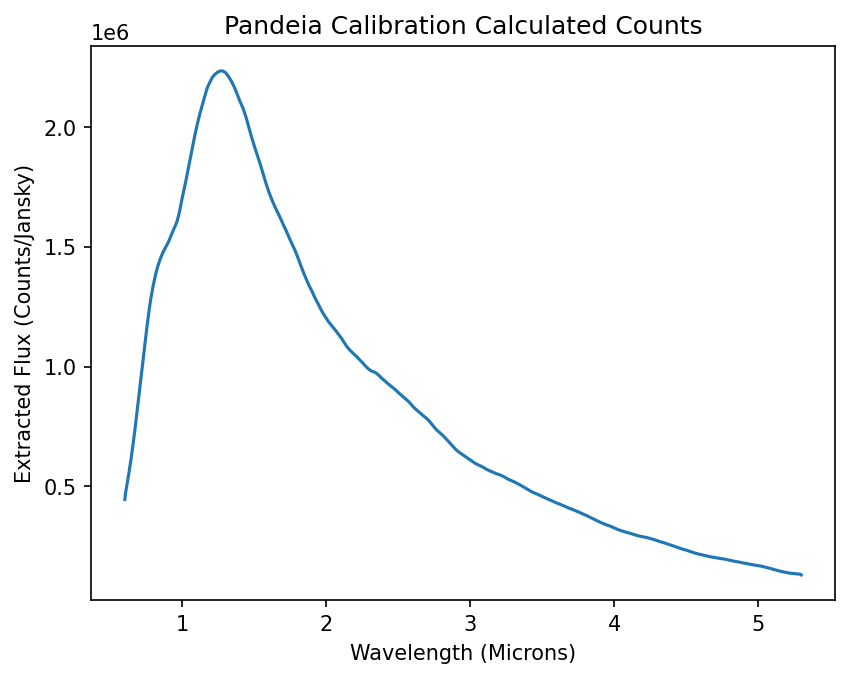

In [12]:
#Display calibration curve to divide my output spectra by
plt.figure(dpi=150)
plt.plot(report0['1d']['extracted_flux'][0], report0['1d']['extracted_flux'][1])
plt.xlabel("Wavelength (Microns)")
plt.ylabel("Extracted Flux (Counts/Jansky)")
plt.title("Pandeia Calibration Calculated Counts")
plt.show()

In [13]:
#Test output
wave_cal = report0['1d']['extracted_flux'][0]
flux_cal = report0['1d']['extracted_flux'][1]

In [14]:
#redshift, flux, FWHM, EW (continuum), post-data specifications
report0

{'sub_reports': [],
 'input': {'configuration': {'detector': {'nexp': 3,
    'ngroup': 65,
    'nint': 1,
    'readout_pattern': 'nrsirs2rapid',
    'subarray': 'full',
    'max_total_groups': 65},
   'instrument': {'aperture': 'shutter',
    'disperser': 'prism',
    'filter': 'clear',
    'instrument': 'nirspec',
    'mode': 'mos',
    'shutter_location': 'q3_183_86',
    'slitlet_shape': 'slit1x3'}},
  'scene': [{'shape': {'geometry': 'sersic',
     'major': 0.07,
     'minor': 0.07,
     'sersic_index': 1.0,
     'norm_method': 'integ_infinity',
     'surf_area_units': None},
    'position': {'x_offset': 0.0, 'orientation': 0.0, 'y_offset': 0.0},
    'spectrum': {'name': 'generic source',
     'sed': {'sed_type': 'input',
      'spectrum': [array([0.5 , 0.51, 0.52, 0.53, 0.54, 0.55, 0.56, 0.57, 0.58, 0.59, 0.6 ,
              0.61, 0.62, 0.63, 0.64, 0.65, 0.66, 0.67, 0.68, 0.69, 0.7 , 0.71,
              0.72, 0.73, 0.74, 0.75, 0.76, 0.77, 0.78, 0.79, 0.8 , 0.81, 0.82,
            

In [15]:
#units in counts/pixel

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 6.879175526115432, FWHM: 10, Integrated Flux: 1.7994817474143967e-18
Amp: 2.1455293517164727e-20, Mu: 51709.45314279036, Sigma: 33.4597777131283


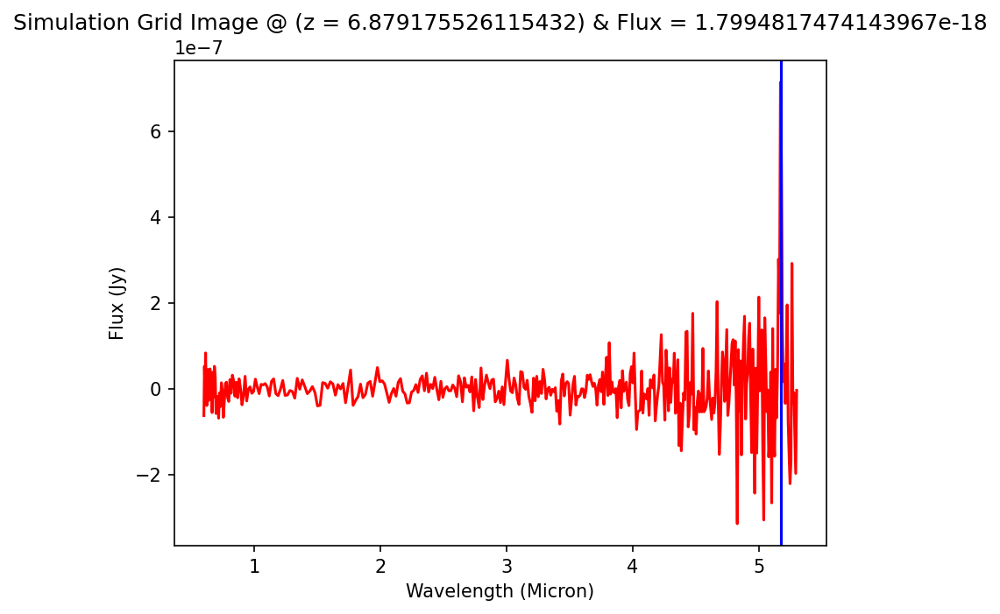

(<Figure size 960x720 with 1 Axes>,
 array([0.60249549, 0.606911  , 0.61141382, 0.61600825, 0.62070602,
        0.6255137 , 0.63042306, 0.63543833, 0.64056378, 0.64580367,
        0.65116215, 0.65664336, 0.66225147, 0.66799052, 0.67386451,
        0.67987748, 0.68603329, 0.69233583, 0.69880532, 0.70543512,
        0.71222545, 0.71917983, 0.72631727, 0.73364424, 0.74114769,
        0.74885537, 0.75676388, 0.76487535, 0.7732106 , 0.78176202,
        0.79054373, 0.7995683 , 0.80882707, 0.81834181, 0.82812137,
        0.83816323, 0.84847698, 0.85907162, 0.86995507, 0.88113457,
        0.89261641, 0.90440602, 0.91650782, 0.92892554, 0.94168008,
        0.95475792, 0.9681656 , 0.98191582, 0.99599819, 1.01042222,
        1.02518718, 1.04028627, 1.05571983, 1.07148984, 1.08758772,
        1.10400653, 1.12073952, 1.13777815, 1.15511582, 1.17274032,
        1.19063806, 1.20879581, 1.22720383, 1.24584591, 1.26470461,
        1.28377032, 1.30302036, 1.32244553, 1.34202372, 1.36174323,
        1.38

In [25]:
#Now, we try to simulate a spectra, allowing the user to enter information on redshift, flux, FWHM
#FWHM = 2 * sqrt(2ln(2)) * σ from Gaussian distribution
#H-alpha is at 6562.8 angstrom, with a fwhm of typically 60nm (or .06 micron)
#h_alpha_mu = [6562.8*(z+1)]
#int_fluxes_emcee = Amp * sigma * np.sqrt(2pi)


#USER INPUT VERSION
# z = input("Enter Redshift: ")
# fwhm = input("Enter FWHM for Line Width (in microns): ")
# flx = input("Enter Integrated Flux Value (in Jy): ")


#SINGLE TEST CASE VERSION
# z = 4.3
# fwhm = 0.08
# flx = 1.33e-17

#RANDOM GENERATOR VERSION
rand_z = random.uniform(2,7) #go by .5
#rand_fwhm = random.uniform(10, 100)  #Max and min are from sample (in angstrom)
rand_flx = 10**random.uniform(np.log10(2.7e-19), np.log10(3.3e-16)) #Max and min are from sample! go from 1e-19 to 1e-16 or 10**(np.arange(-19,-15.9, 0.1))


# lsts = 10**np.arange(-19, -15.9, .1)
# pick = random.randint(1,31)
# rand_flx = lsts[pick]


rand_fwhm = 10

# rand_z=4
# rand_fwhm=20
# rand_flx=1e-18


fac = 2*np.sqrt(2*np.log(2))   #from equation of FWHM in relation to sigma from a Gaussian distribution
count = 0

#Simulate a spectra based on a random redshift, width, and amplitude within the appropriate ranges
def sim_spectra(z,fwhm,flx):
    
    num = count+1
    sigma = (1+float(z))*(float(fwhm)/fac)                      #get the variables for the spectrum
    mu = .65628*1e4*(float(z)+1)                     #mu wavelength is in angstrom
    amp = flx/(sigma*np.sqrt(2*np.pi)) 
    print("Randomly generating redshift, FWHM, and integrated flux...")
    print("Redshift: " + str(z) + ", FWHM: " + str(fwhm) + ", Integrated Flux: " + str(flx))
    print("Amp: " + str(amp) + ", Mu: " + str(mu) + ", Sigma: " + str(sigma))
    
    waves = np.arange(1e4*.5,1e4*6,.0025*1e4)
    fluxes=[]
    
    for i in waves:
        fluxes.append((float(flx)/(sigma*np.sqrt(2*np.pi)))*np.exp(-0.5*(((i-mu)/sigma)**2)))
  #  print("Initial flux array: " + str(fluxes))

    
    #NOISE SIMULATION, ENDED UP BEING UNNECESSARY, PANDEIA WILL DO THIS FOR ME
    # big = max(fluxes)
    # for i in range(len(fluxes)):
    #     if np.abs(waves[i] - mu) > .25:
    #          noise_fac = random.uniform(-.1, .1)
    #          noise = noise_fac*big
    #          fluxes[i] = noise+fluxes[i]

    #Plot initial simulated spectra
    # pic = plt.figure()
    # plt.plot(waves, fluxes)
    # plt.xlabel("Wavelength(Angstrom)")
    # plt.ylabel("Flux (erg s$^{-1}$ cm$^{-2}$ Å$^{-1}$)")
    # plt.title("Initial Simulated Image " + str(num) + " (z = " + str(z) + ")")
    # plt.show()


    # print(len(waves), len(fluxes))
    # print(len(report['1d']['extracted_flux'][0]), len(report['1d']['extracted_flux'][1]))
    # print(waves, 1e21*fluxes*((waves**2)/clight))
    # print(fluxes)

  
    #Completing the unit conversions
    fluxes_arr_nu = (fluxes*((waves**2)/clight))*1e23 #convert to F_nu units (Jy)
  #  print("Fluxes in f_nu units: " + str(fluxes_arr_nu))
    fluxes_arr_mJy = 1e3*fluxes_arr_nu #convert to mJy fully
    
 #   print(fluxes_arr_mJy)
    waves_arr_um = 1e-4*waves
#    print(waves, waves_arr_um)

    # pic2 = plt.figure()
    # plt.plot(waves_arr_um, fluxes_arr_mJy)
    # plt.xlabel("Wavelength(Micron)")
    # plt.ylabel("Flux (mJy)")
    # plt.title("Pre-Pandeia Simulated Image " + str(num) + " (z = " + str(z) + ")")
    # plt.show()
    
    # print("Pandeia input wavelength and flux arrays")
    # print(waves_arr_um)
    # print(fluxes_arr_mJy)

    #Pandeia portion! Specifies PRISM disperser, CLEAR filter, input spectra, mos, etc.
    calculation['configuration']['detector']={'nexp':3,'ngroup':65,'nint':1,'readout_pattern':'nrsirs2rapid','subarray':'full'}
    calculation['background_level']='low'
    for i in ['crs','dark','excess','ffnoise','readnoise','scatter']: calculation['calculation']['noise'][i]=True
    calculation['scene'][0]['spectrum']['normalization']={'type':'none'}
    calculation['scene'][0]['spectrum']['redshift']=0 #included redshift in the spectrum itself
    calculation['scene'][0]['shape']={'geometry':'sersic','major':0.07,'minor':0.07,'sersic_index':1.0,'norm_method':'integ_infinity','surf_area_units':None}
    calculation['scene'][0]['spectrum']['sed']={'sed_type':'input','spectrum':[waves_arr_um,fluxes_arr_mJy]}
    calculation['configuration']['instrument']['disperser']='prism'
    calculation['configuration']['instrument']['filter']= 'clear'
    report=perform_calculation(calculation)

  #  print(report['1d']['extracted_flux'][1], report['1d']['extracted_noise'][1])
  #  print("Post-pandeia fluxes:" + str(report['1d']['extracted_flux'][1]))
    #Apply the calibration curve by dividing by it: Should fix units!
    use_waves = report['1d']['extracted_flux'][0]
    use_fluxes = report['1d']['extracted_flux'][1]/flux_cal
    use_fluxerrs = report['1d']['extracted_noise'][1]/flux_cal

    #Randomizing the seed so that Pandeia doesn't auto reset it to the same randomization every time
    np.random.seed(int(time.time()*100)%123456789)
    #Generating noise from the calibrated extracted_noise
    noise_arr = np.random.normal(0, use_fluxerrs)
    noisy_fluxes = use_fluxes + noise_arr


    # pic3 = plt.figure()
    # plt.plot(use_waves, report['1d']['extracted_flux'][1], color = 'green', label = 'Post-Pandeia')
    # plt.xlabel("Wavelength (Micron)")
    # plt.ylabel("Flux (Counts)")
    # plt.title("Post-Pandeia Simulated Image " + str(num) + " (z = " + str(z) + ")")
    # plt.show()

    # pic4 = plt.figure()
    # plt.plot(use_waves, use_fluxes, color = 'red', label = 'Post-Calibration Division')
    # plt.xlabel("Wavelength (Micron)")
    # plt.ylabel("Flux (Jy)")
    # plt.title("Post-Pandeia Calibrated Image " + str(num) + " (z = " + str(z) + ")")
    # plt.show()

    pic5 = plt.figure(dpi=150)
    plt.plot(use_waves, noisy_fluxes, color = 'red', label = 'Post-Calibration Division')
   # plt.plot(waves_arr_um, 1e-3*fluxes_arr_mJy, color = "green")
    plt.xlabel("Wavelength (Micron)")
    plt.ylabel("Flux (Jy)")
    plt.title("Simulation Grid Image @" + " (z = " + str(z) + ") & Flux = " + str(flx))
    plt.axvline(1e-4*mu, color = "blue")
 #   plt.xlim(1e-4*mu-0.5,1e-4*mu+0.5)
    plt.show()

    
  #  Plot simulated spectra after running Pandeia    
    # pic6 = plt.figure()
    # plt.plot(waves_arr_um, fluxes_arr_mJy/1000, label = "Original Simulated")
    # plt.plot(use_waves, report['1d']['extracted_flux'][1], color = 'green', label = 'Post-Pandeia')
    # plt.plot(use_waves, use_fluxes, label = "After dividing", color = 'red')
    # plt.xlabel("Wavelength(um)")
    # plt.ylabel("Flux (mJy)")
    # plt.title("Pics 2+3+4 for Simulated Image " + str(num) + "(z = " + str(z) + ")")
    # plt.legend()
    # plt.show()

    
    return(pic5, use_waves, use_fluxes, use_fluxerrs, sigma, mu, amp)
    
sim_spectra(rand_z,rand_fwhm,rand_flx)

In [87]:
time.time()

1739734850.1002724

In [119]:
#feed gaussian into pandeia (mJy and micron), pandeia will output array in counts, divide by calibration array to get jansky#
#np.random.norm for applying errors to this after

array([1.00000000e-19, 1.25892541e-19, 1.58489319e-19, 1.99526231e-19,
       2.51188643e-19, 3.16227766e-19, 3.98107171e-19, 5.01187234e-19,
       6.30957344e-19, 7.94328235e-19, 1.00000000e-18, 1.25892541e-18,
       1.58489319e-18, 1.99526231e-18, 2.51188643e-18, 3.16227766e-18,
       3.98107171e-18, 5.01187234e-18, 6.30957344e-18, 7.94328235e-18,
       1.00000000e-17, 1.25892541e-17, 1.58489319e-17, 1.99526231e-17,
       2.51188643e-17, 3.16227766e-17, 3.98107171e-17, 5.01187234e-17,
       6.30957344e-17, 7.94328235e-17, 1.00000000e-16])

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1e-19
Amp: 3.131457595665505e-21, Mu: 19688.4, Sigma: 12.739827004320286


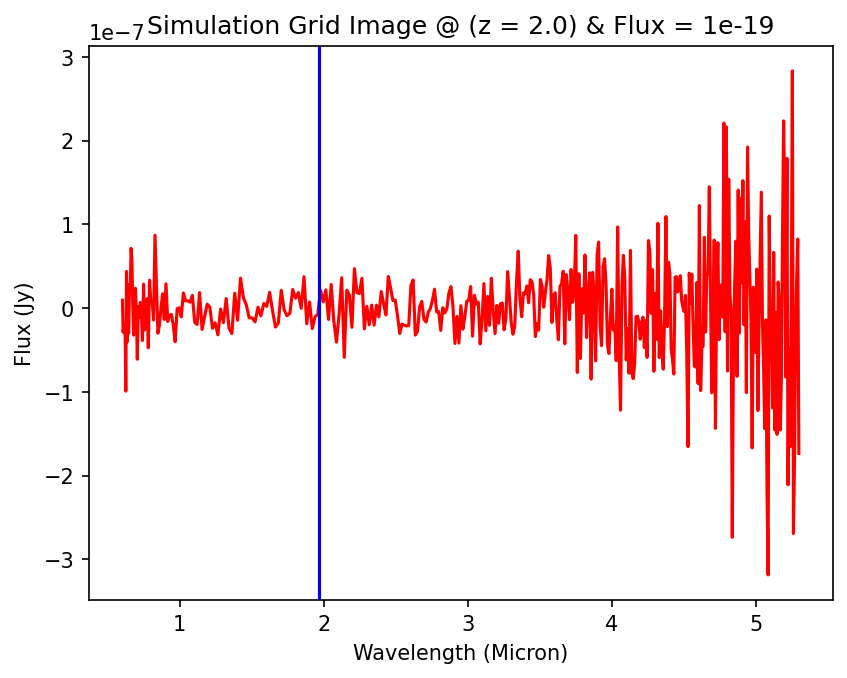

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.2589254117941713e-19
Amp: 3.942271543139181e-21, Mu: 19688.4, Sigma: 12.739827004320286


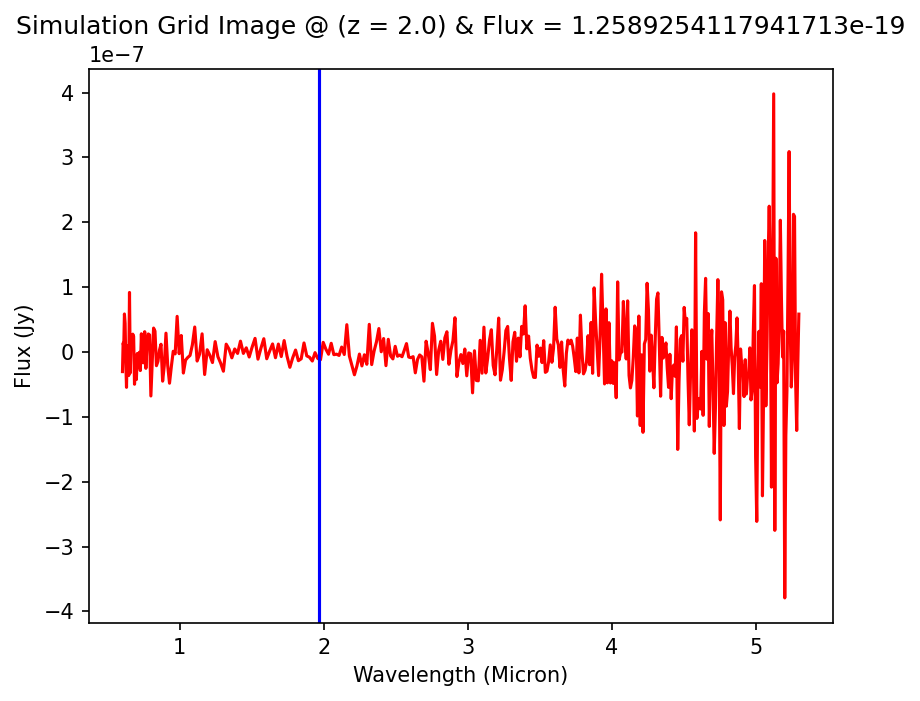

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.584893192461124e-19
Amp: 4.963025825850937e-21, Mu: 19688.4, Sigma: 12.739827004320286


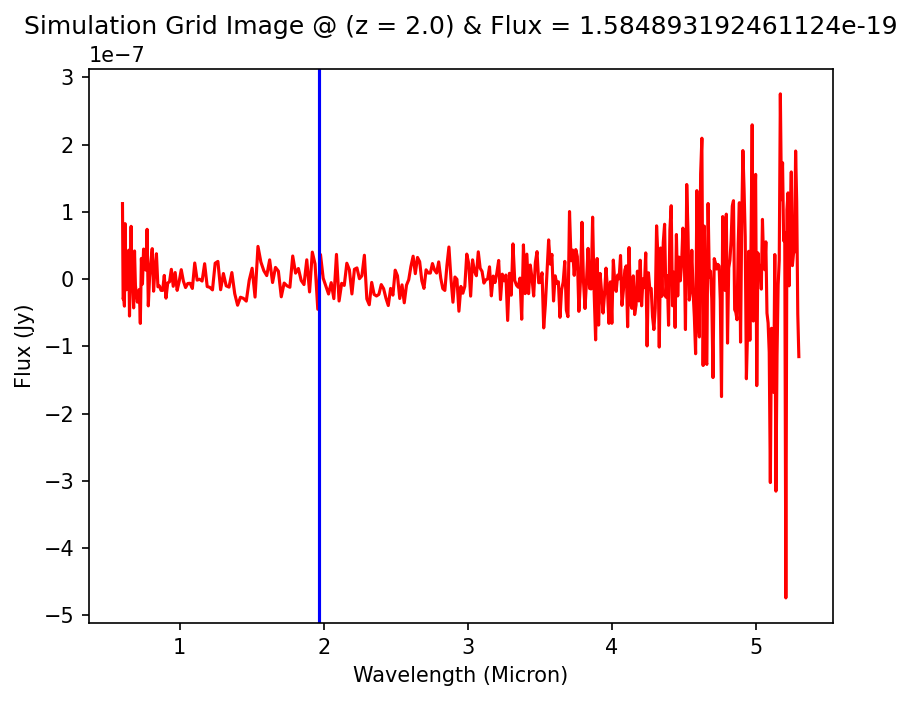

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.995262314968899e-19
Amp: 6.248079331554498e-21, Mu: 19688.4, Sigma: 12.739827004320286


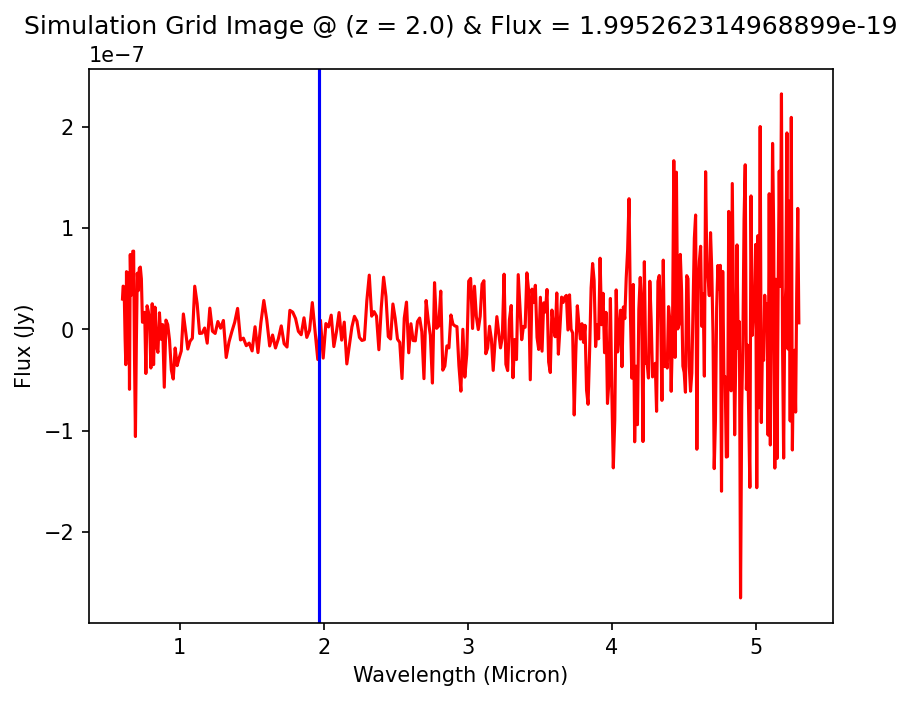

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 2.511886431509613e-19
Amp: 7.865865845399897e-21, Mu: 19688.4, Sigma: 12.739827004320286


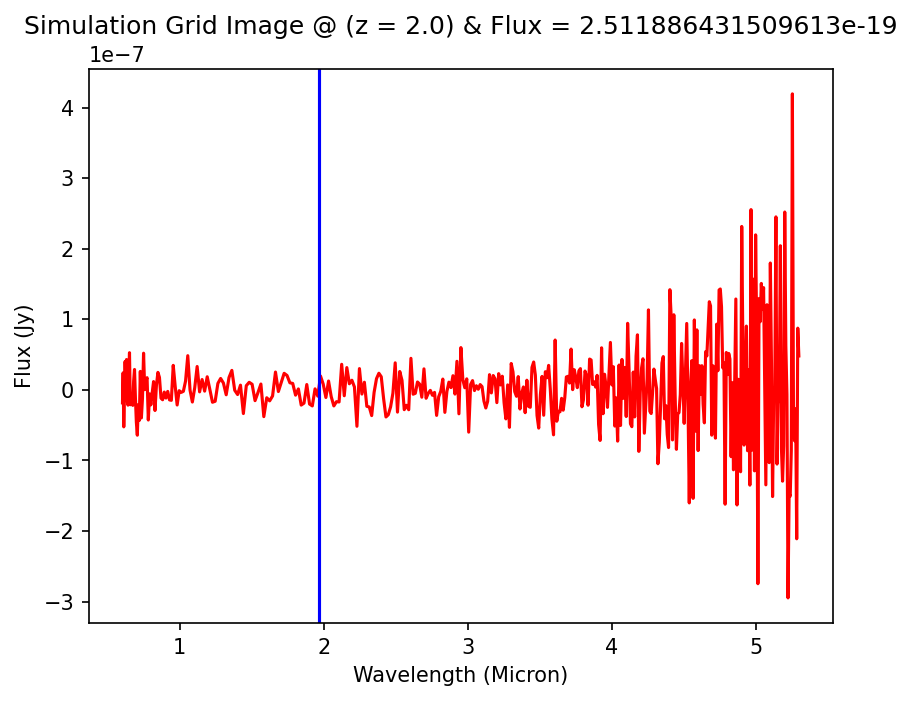

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 3.162277660168431e-19
Amp: 9.902538398537774e-21, Mu: 19688.4, Sigma: 12.739827004320286


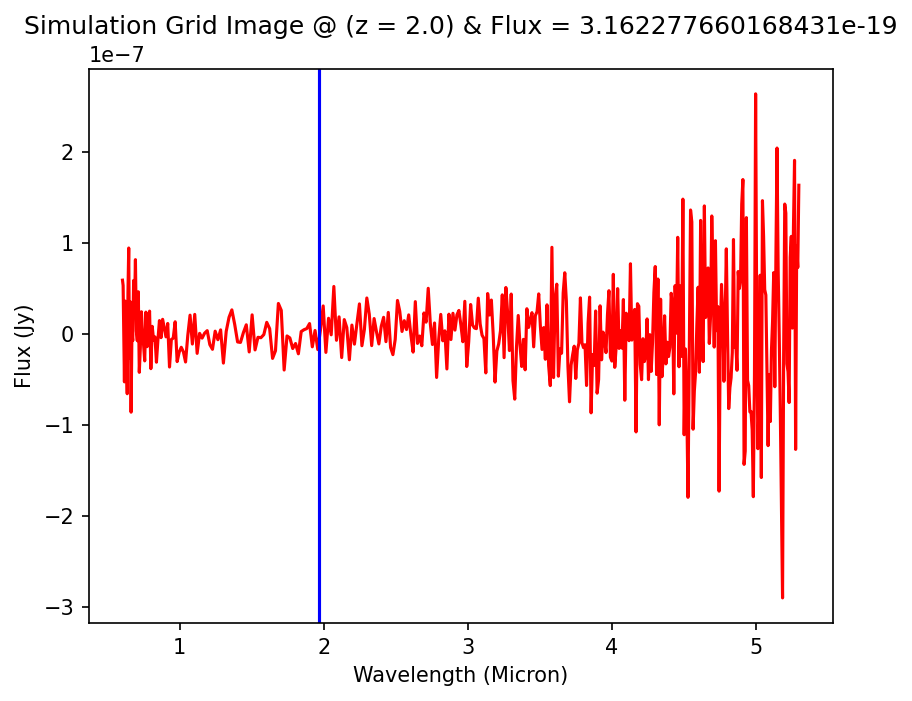

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 3.981071705535051e-19
Amp: 1.246655723118676e-20, Mu: 19688.4, Sigma: 12.739827004320286


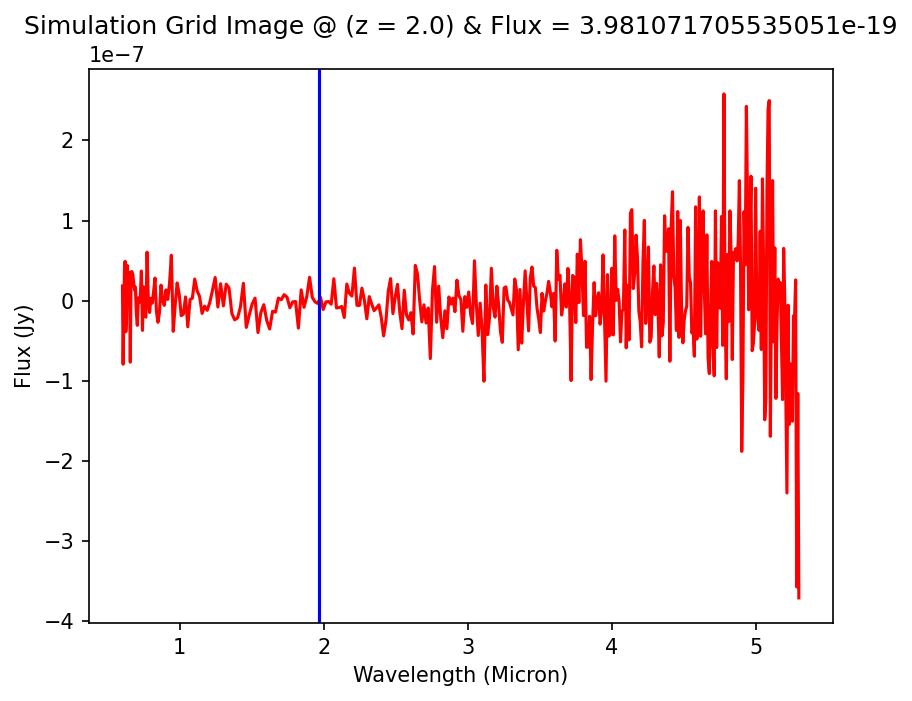

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 5.011872336272837e-19
Amp: 1.5694465695927396e-20, Mu: 19688.4, Sigma: 12.739827004320286


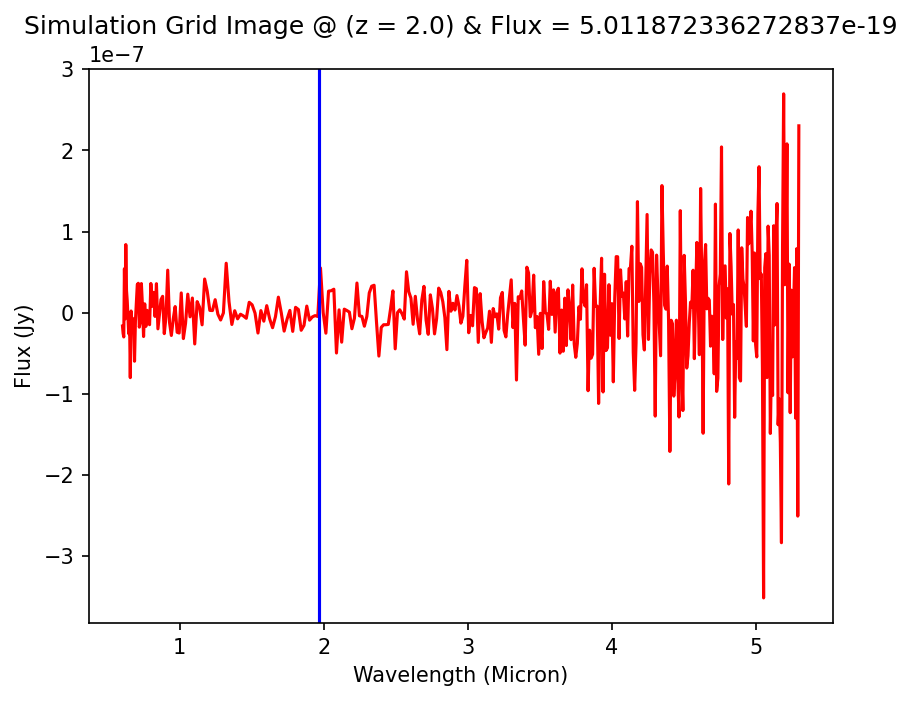

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 6.309573444802097e-19
Amp: 1.9758161689134892e-20, Mu: 19688.4, Sigma: 12.739827004320286


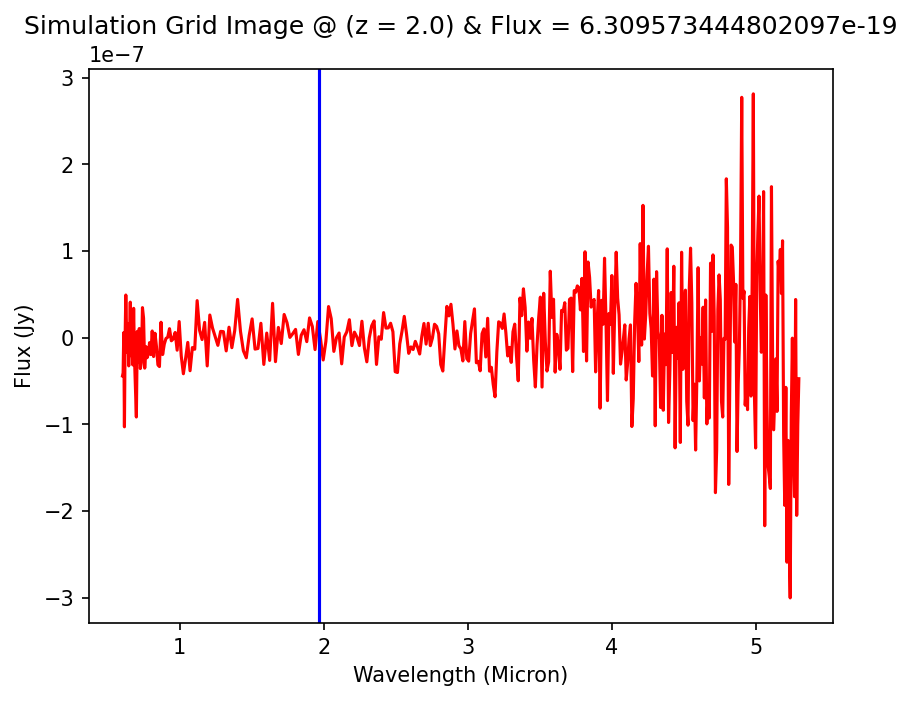

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 7.943282347243049e-19
Amp: 2.4874051840789966e-20, Mu: 19688.4, Sigma: 12.739827004320286


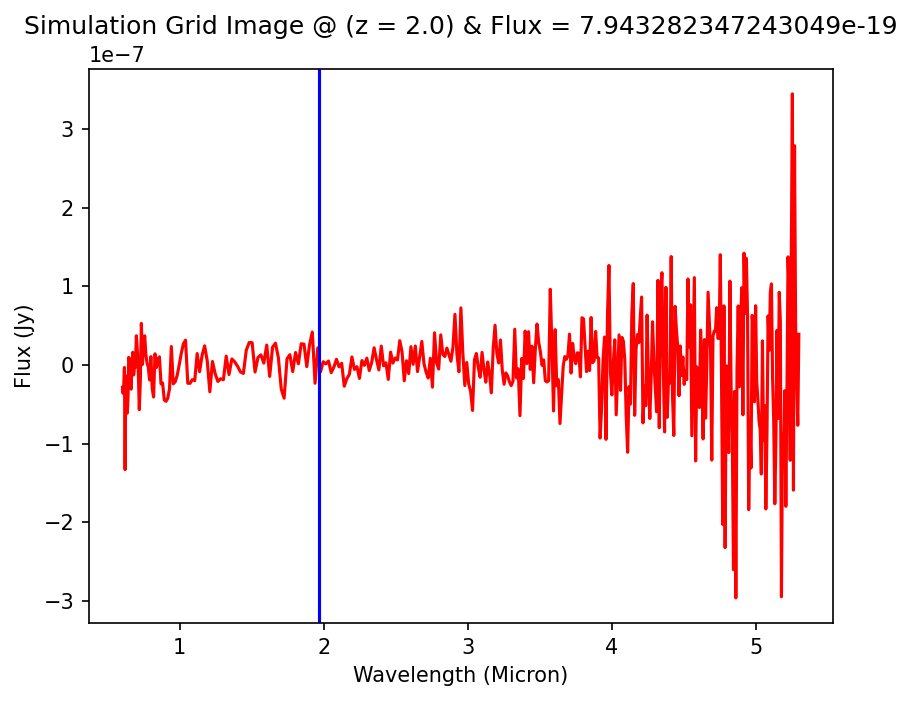

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.0000000000000328e-18
Amp: 3.131457595665608e-20, Mu: 19688.4, Sigma: 12.739827004320286


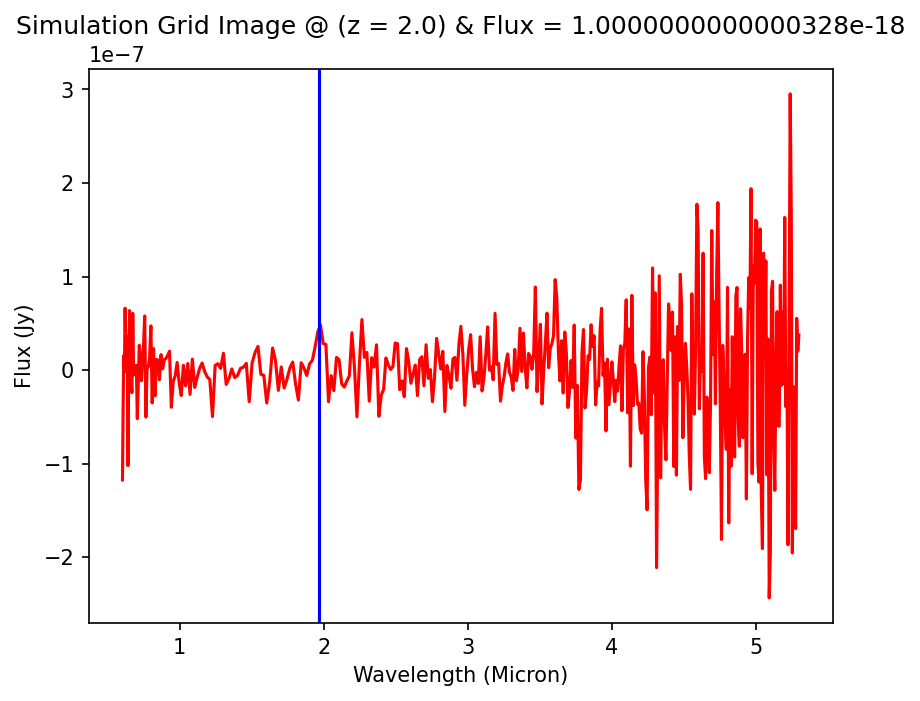

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.2589254117942125e-18
Amp: 3.94227154313931e-20, Mu: 19688.4, Sigma: 12.739827004320286


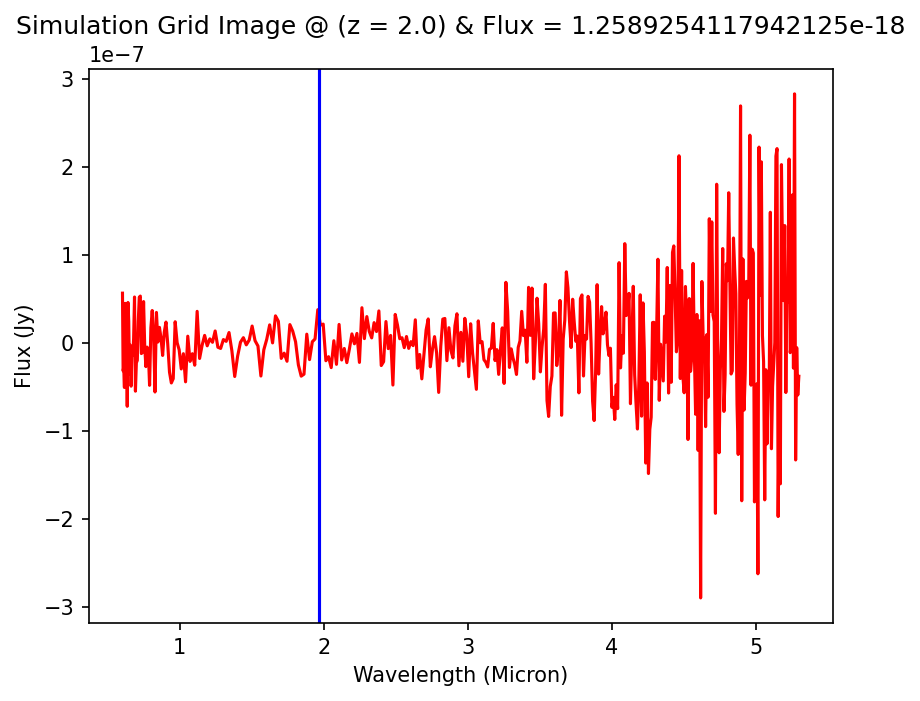

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.5848931924611758e-18
Amp: 4.9630258258511e-20, Mu: 19688.4, Sigma: 12.739827004320286


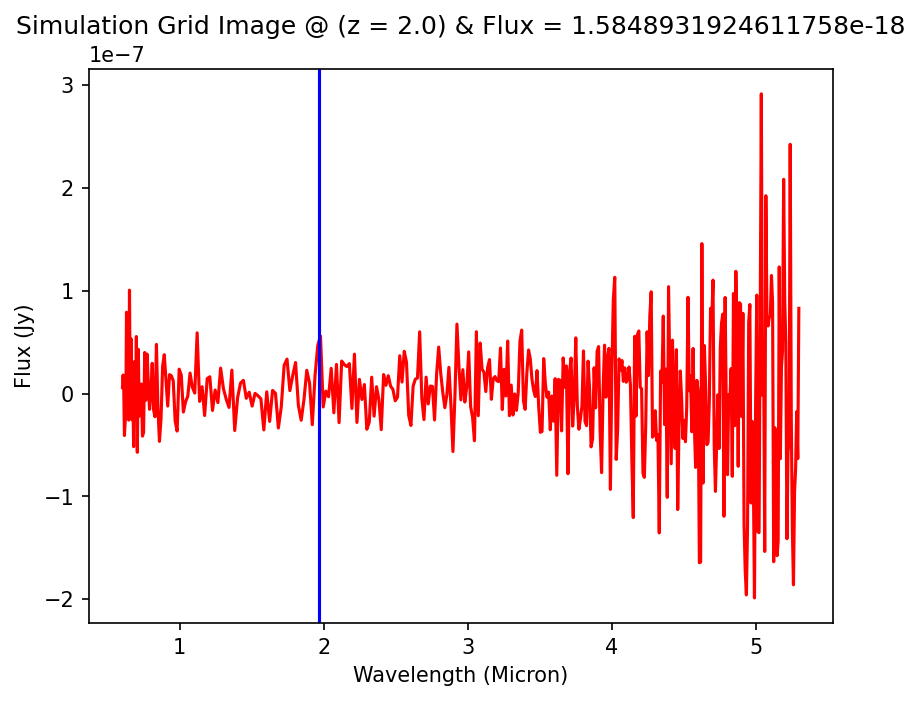

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.9952623149689645e-18
Amp: 6.248079331554703e-20, Mu: 19688.4, Sigma: 12.739827004320286


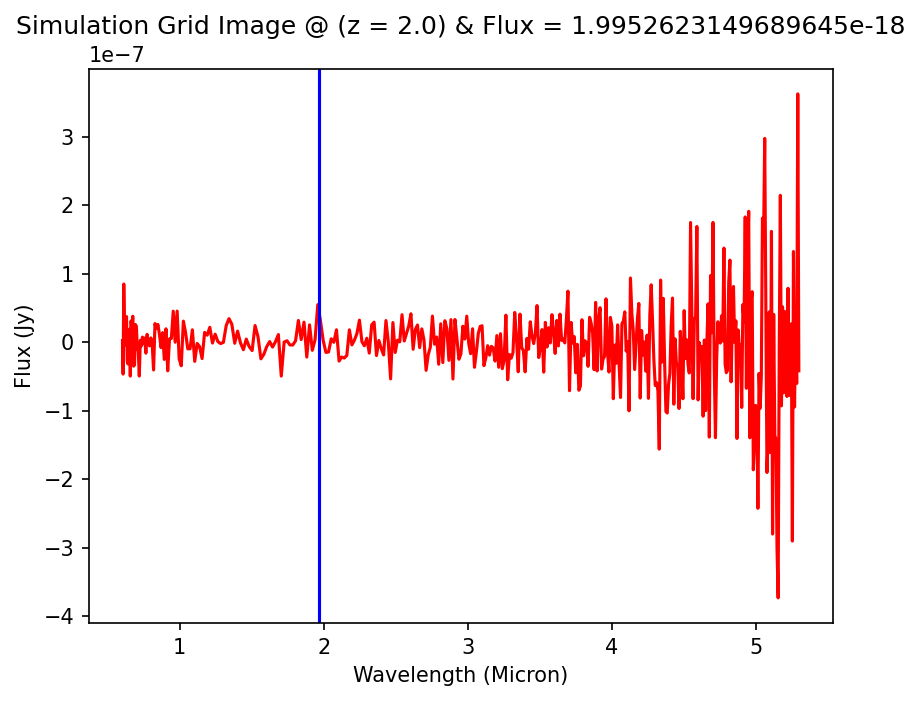

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 2.511886431509695e-18
Amp: 7.865865845400155e-20, Mu: 19688.4, Sigma: 12.739827004320286


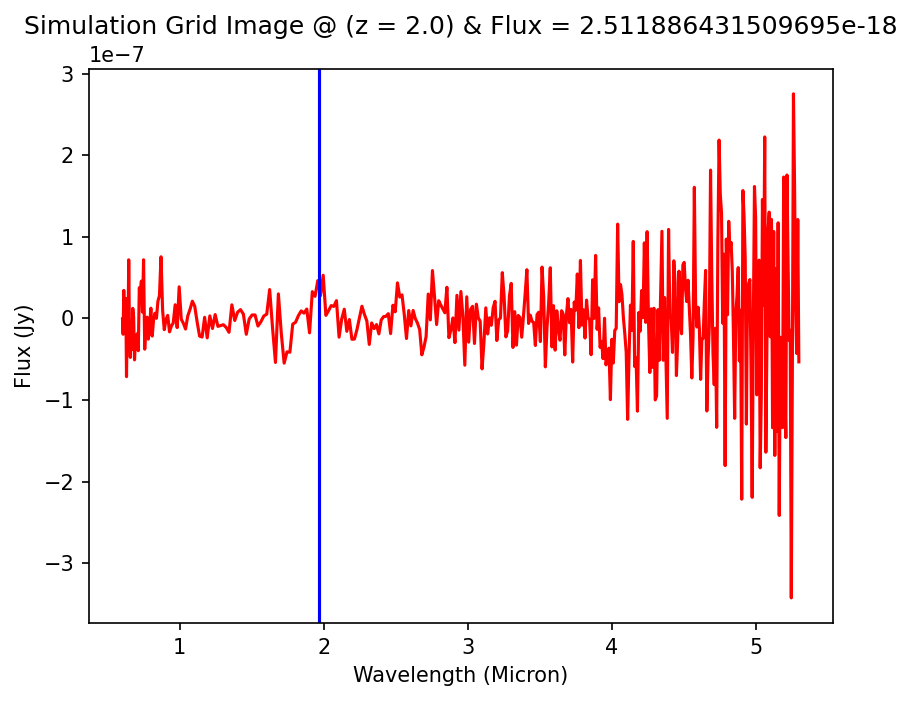

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 3.1622776601685347e-18
Amp: 9.902538398538098e-20, Mu: 19688.4, Sigma: 12.739827004320286


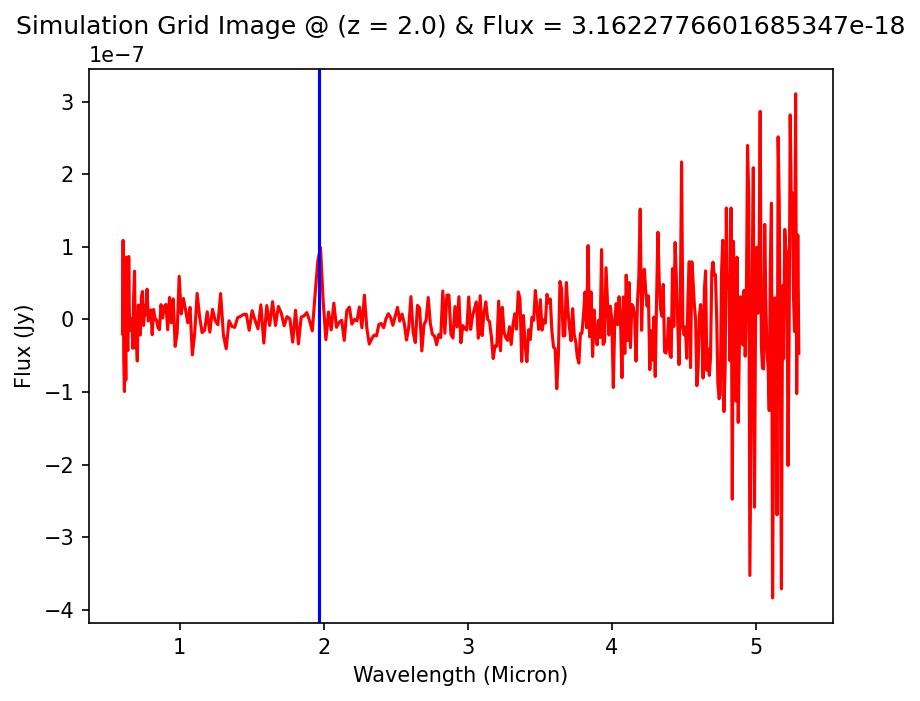

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 3.981071705535181e-18
Amp: 1.2466557231187169e-19, Mu: 19688.4, Sigma: 12.739827004320286


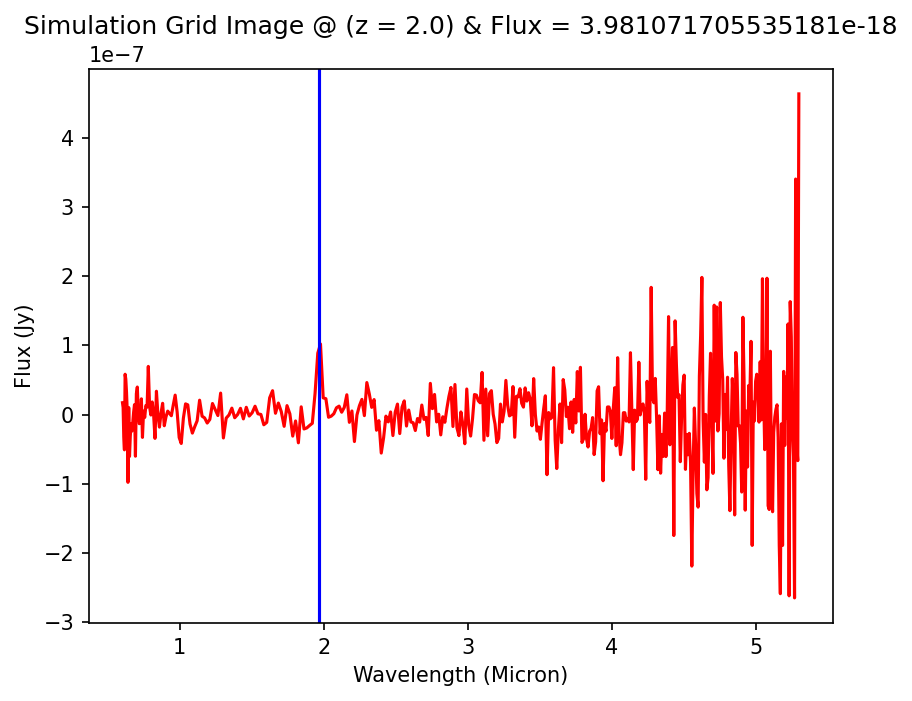

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 5.011872336273001e-18
Amp: 1.569446569592791e-19, Mu: 19688.4, Sigma: 12.739827004320286


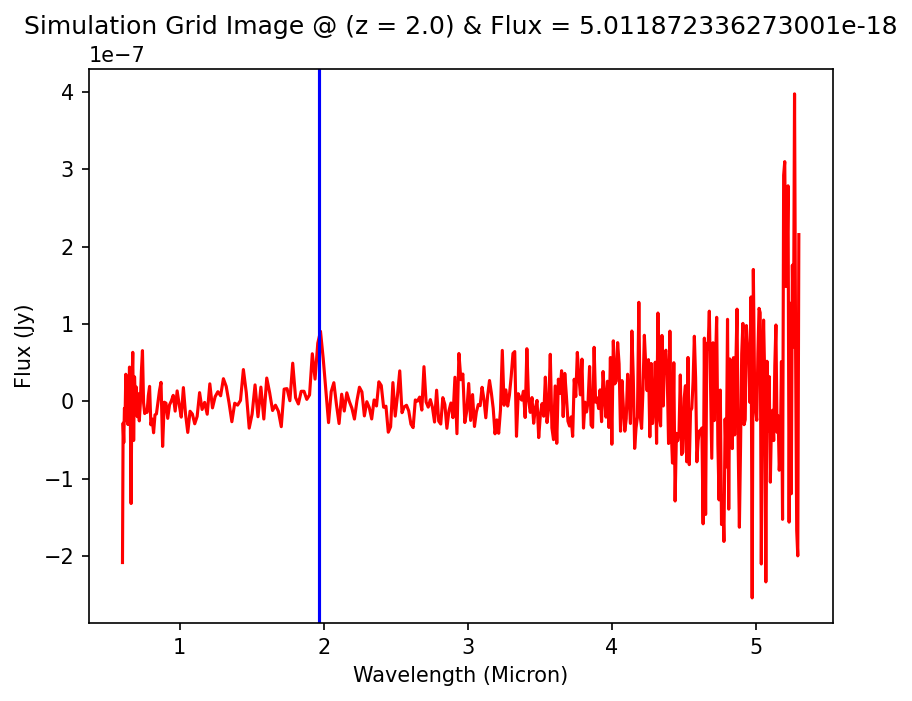

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 6.3095734448023044e-18
Amp: 1.975816168913554e-19, Mu: 19688.4, Sigma: 12.739827004320286


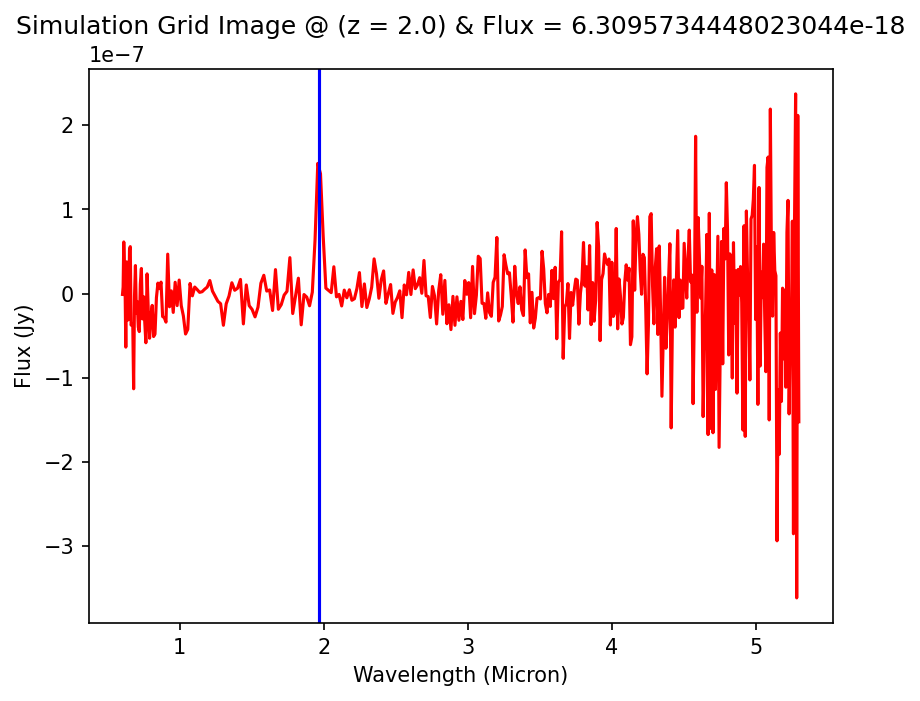

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 7.943282347243309e-18
Amp: 2.4874051840790777e-19, Mu: 19688.4, Sigma: 12.739827004320286


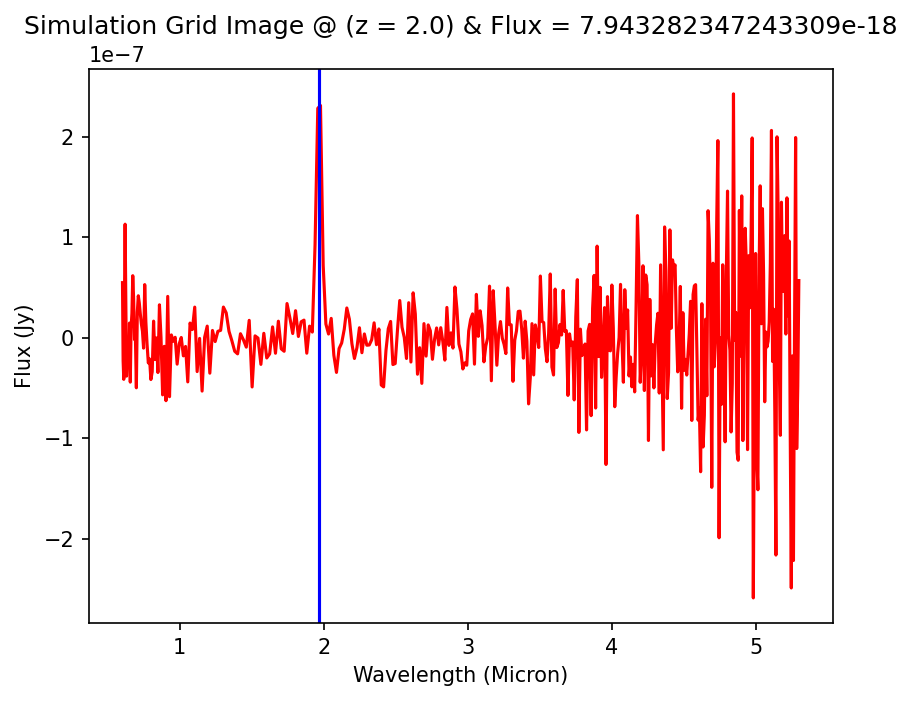

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.0000000000000654e-17
Amp: 3.1314575956657094e-19, Mu: 19688.4, Sigma: 12.739827004320286


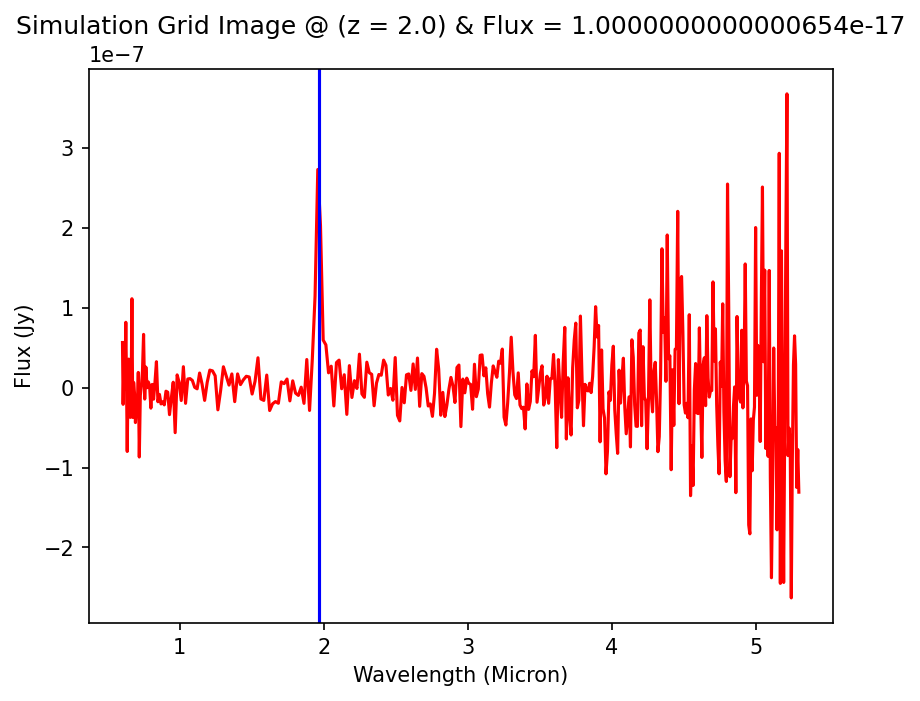

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.2589254117942538e-17
Amp: 3.942271543139439e-19, Mu: 19688.4, Sigma: 12.739827004320286


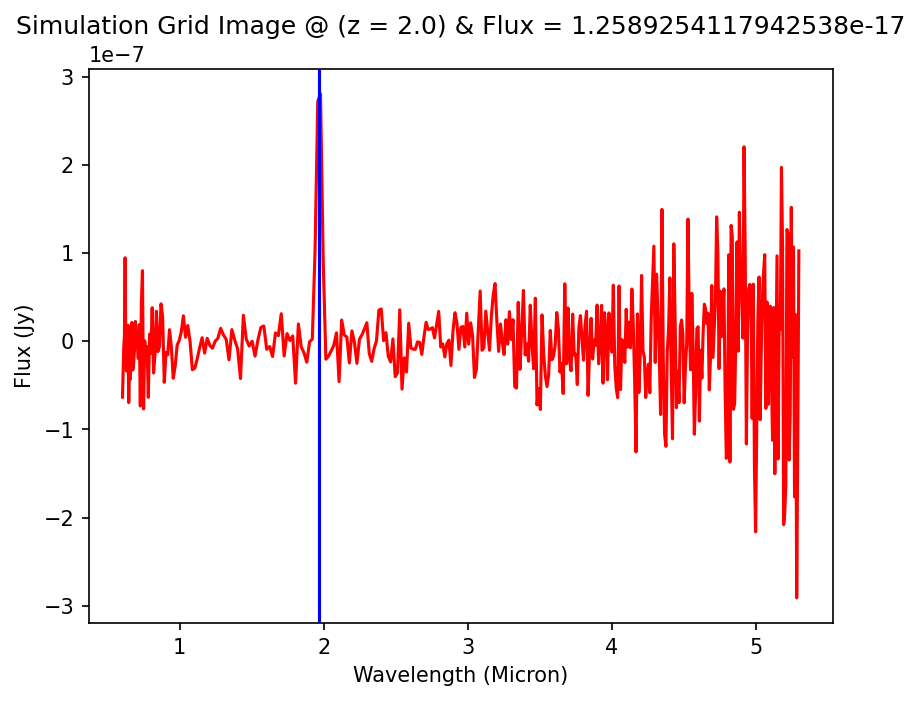

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.5848931924612275e-17
Amp: 4.963025825851262e-19, Mu: 19688.4, Sigma: 12.739827004320286


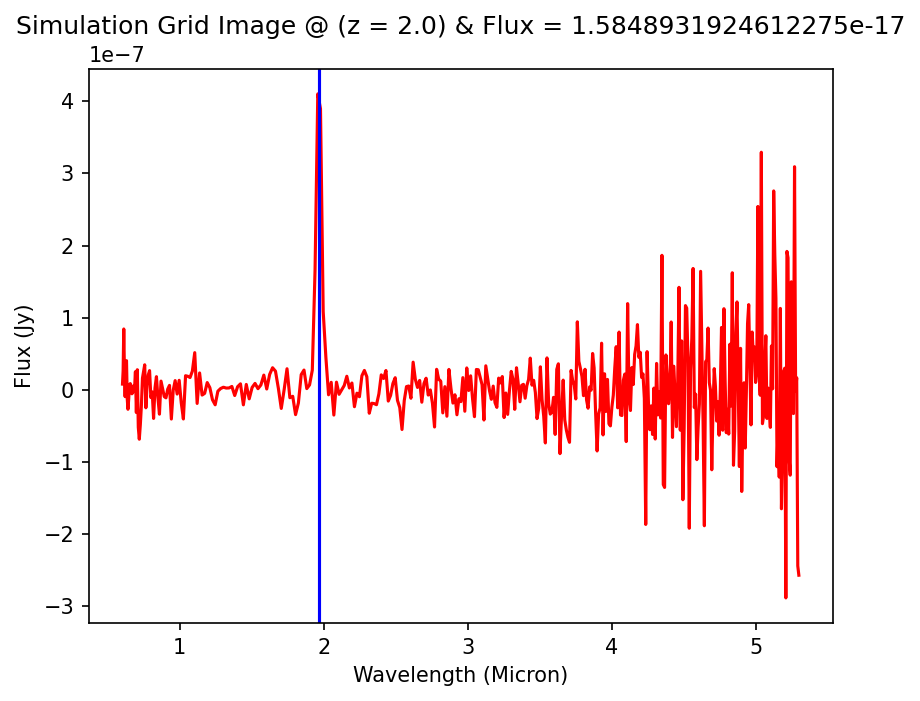

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.9952623149690297e-17
Amp: 6.248079331554907e-19, Mu: 19688.4, Sigma: 12.739827004320286


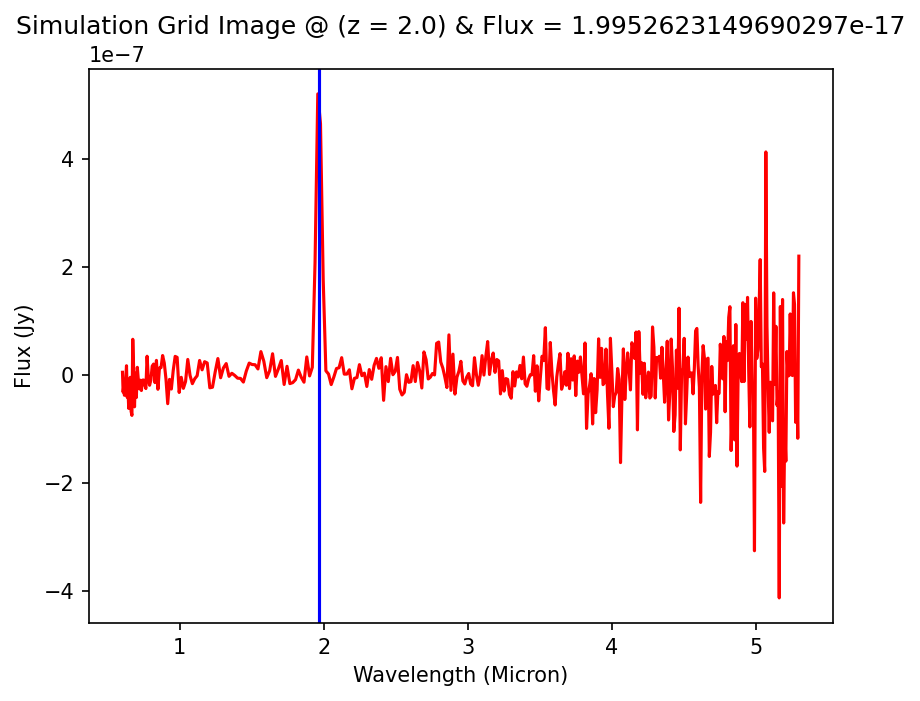

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 2.5118864315097773e-17
Amp: 7.865865845400412e-19, Mu: 19688.4, Sigma: 12.739827004320286


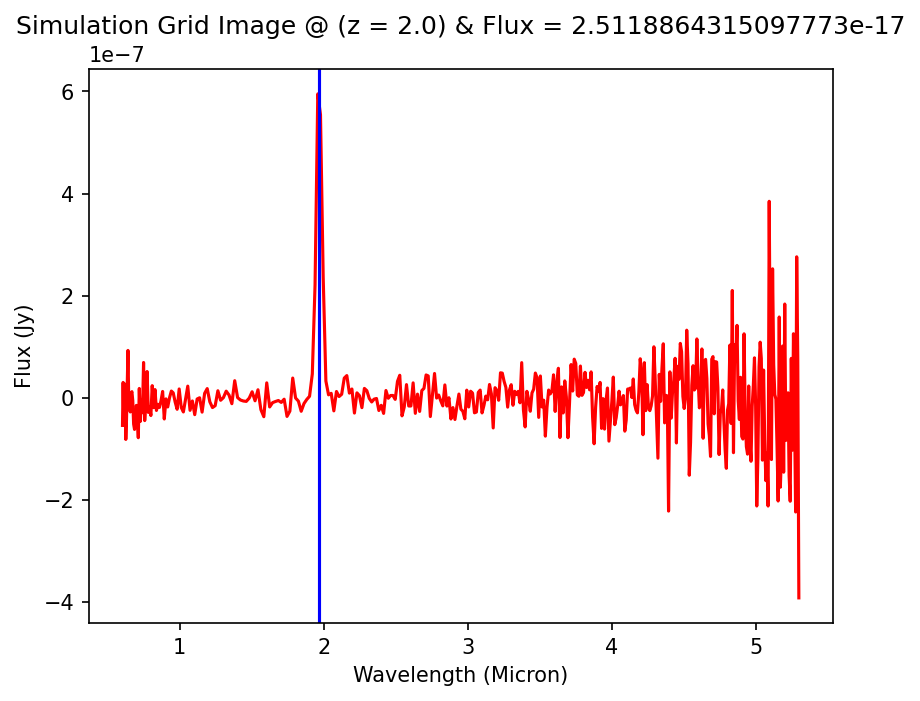

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 3.162277660168638e-17
Amp: 9.90253839853842e-19, Mu: 19688.4, Sigma: 12.739827004320286


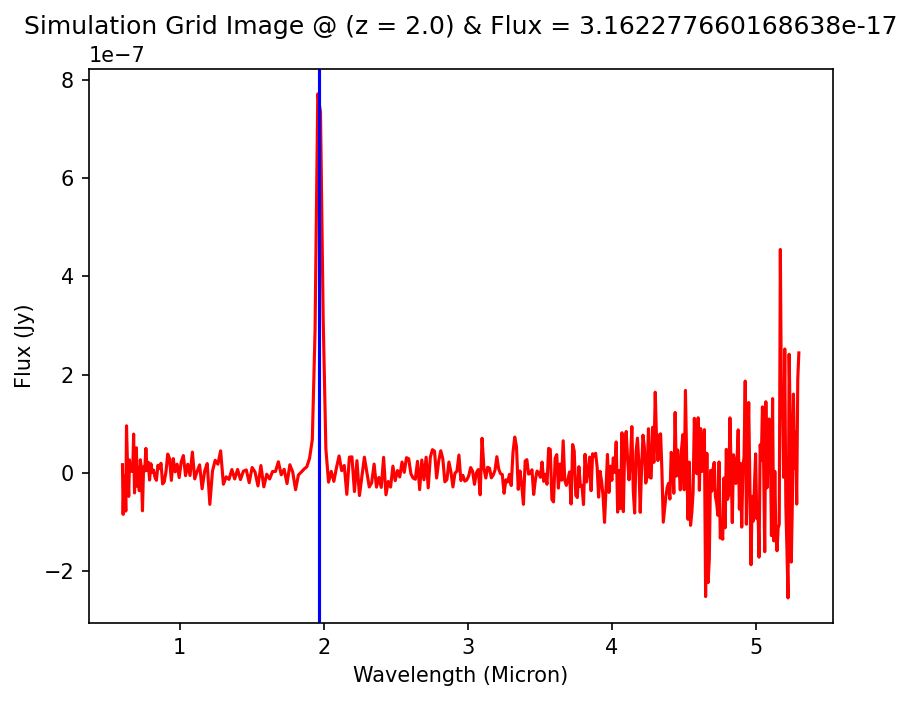

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 3.981071705535311e-17
Amp: 1.2466557231187574e-18, Mu: 19688.4, Sigma: 12.739827004320286


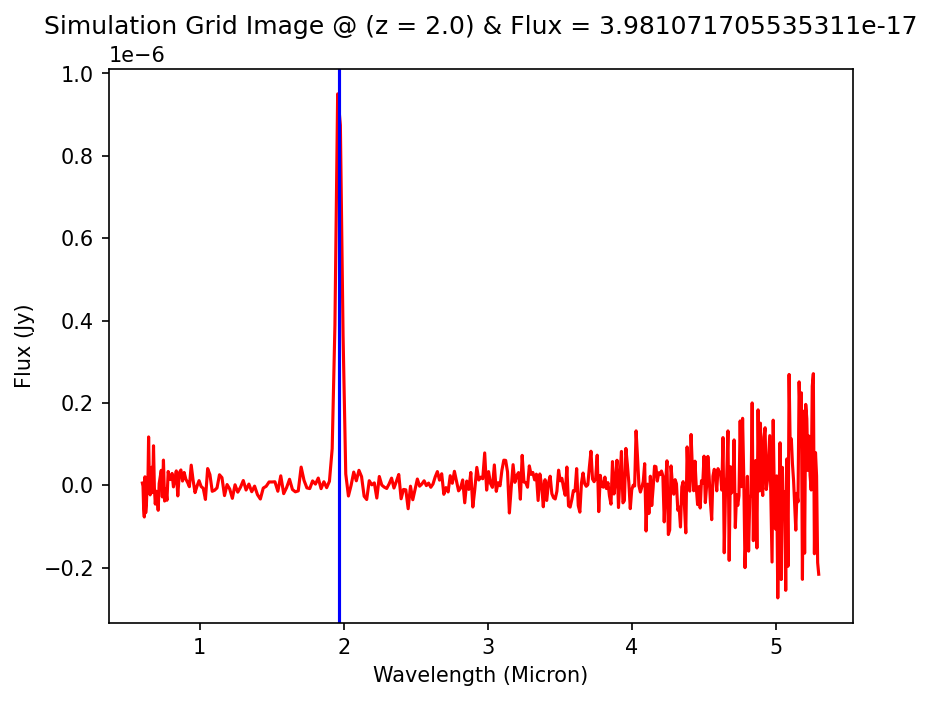

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 5.0118723362731656e-17
Amp: 1.5694465695928423e-18, Mu: 19688.4, Sigma: 12.739827004320286


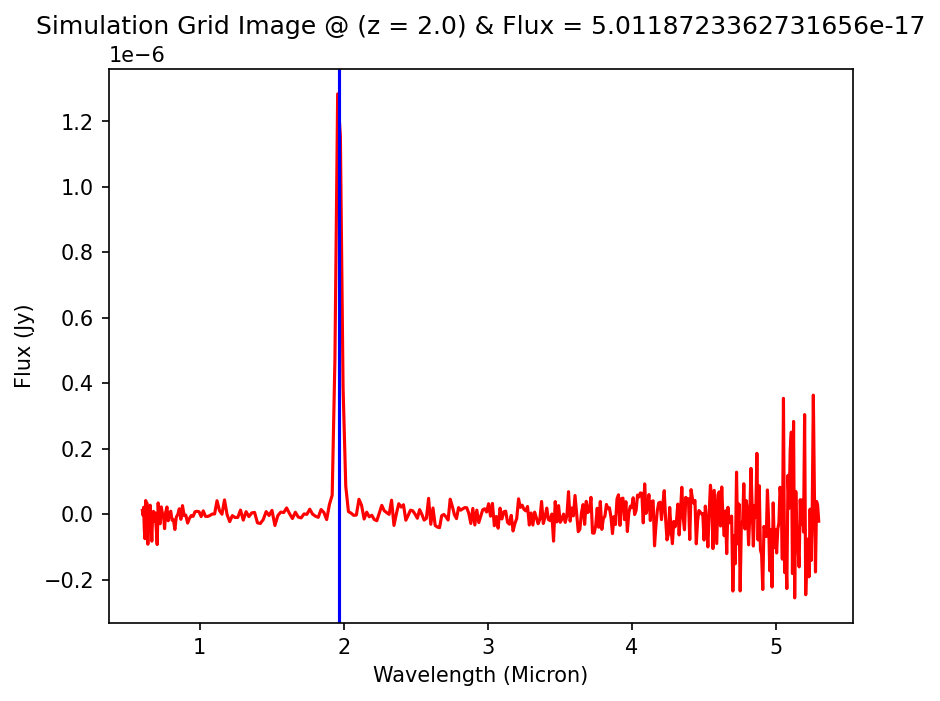

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 6.309573444802511e-17
Amp: 1.9758161689136186e-18, Mu: 19688.4, Sigma: 12.739827004320286


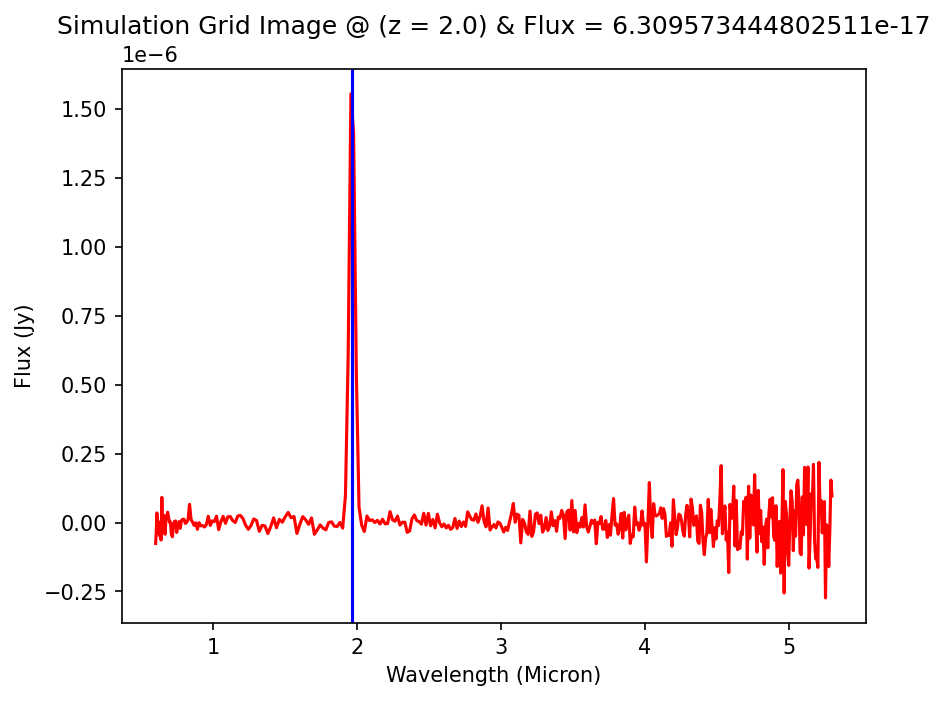

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 7.943282347243569e-17
Amp: 2.4874051840791594e-18, Mu: 19688.4, Sigma: 12.739827004320286


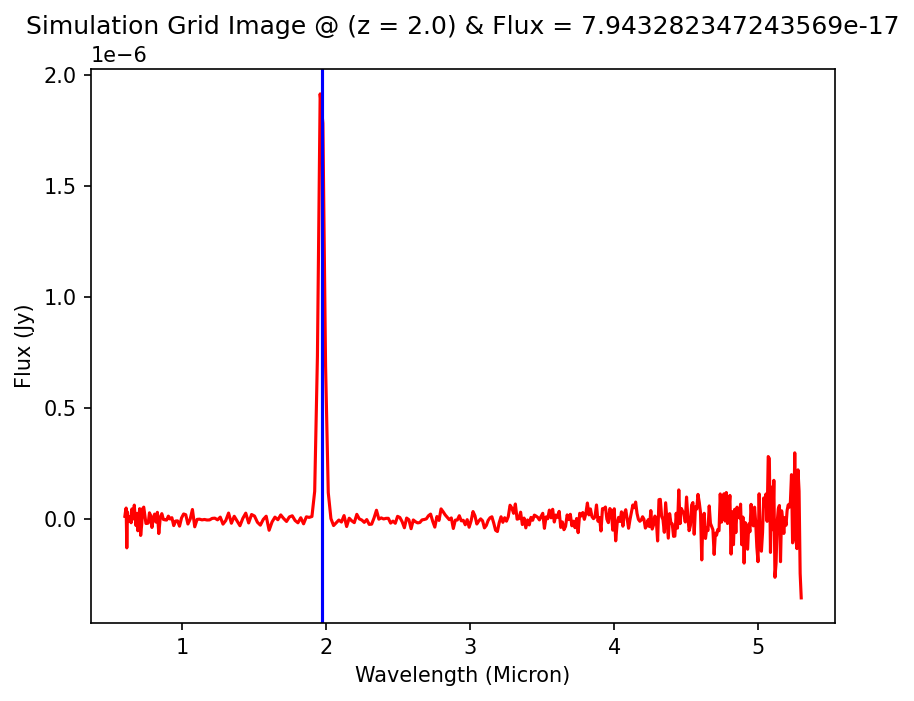

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.0, FWHM: 10, Integrated Flux: 1.0000000000000982e-16
Amp: 3.1314575956658124e-18, Mu: 19688.4, Sigma: 12.739827004320286


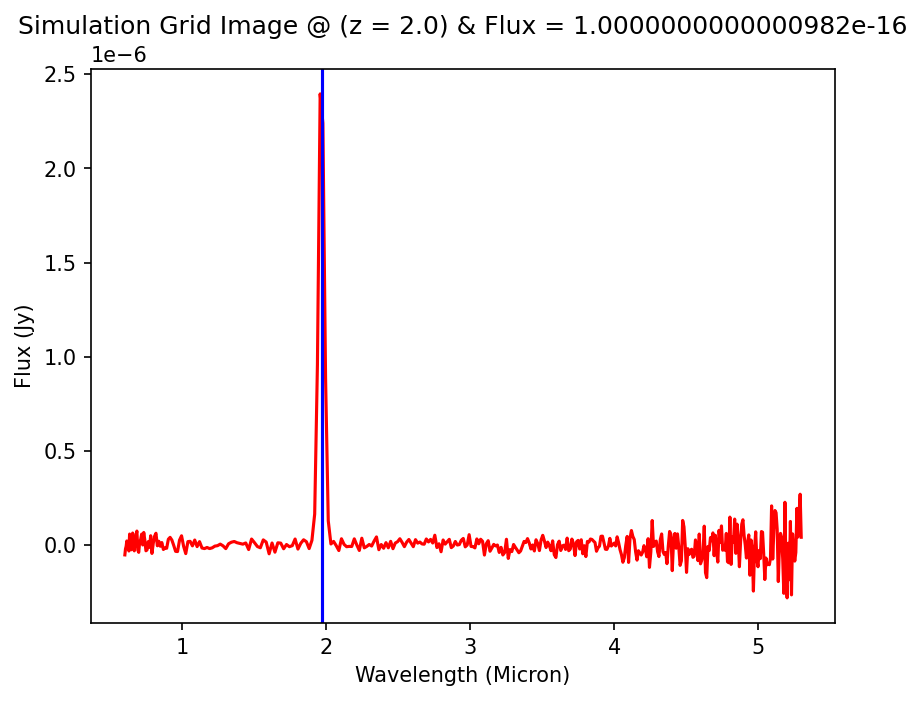

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1e-19
Amp: 2.6841065105704324e-21, Mu: 22969.8, Sigma: 14.863131505040334


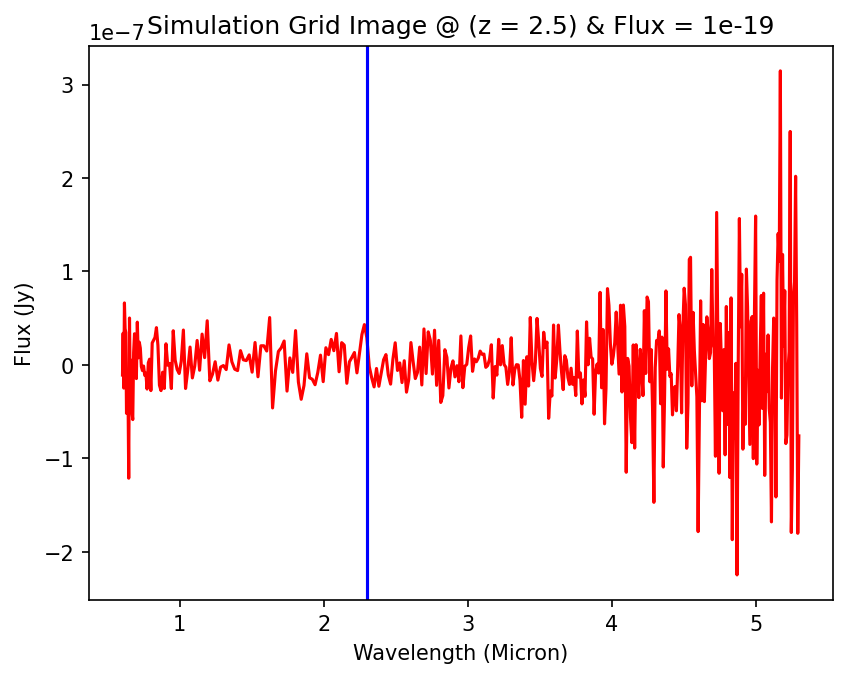

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.2589254117941713e-19
Amp: 3.379089894119298e-21, Mu: 22969.8, Sigma: 14.863131505040334


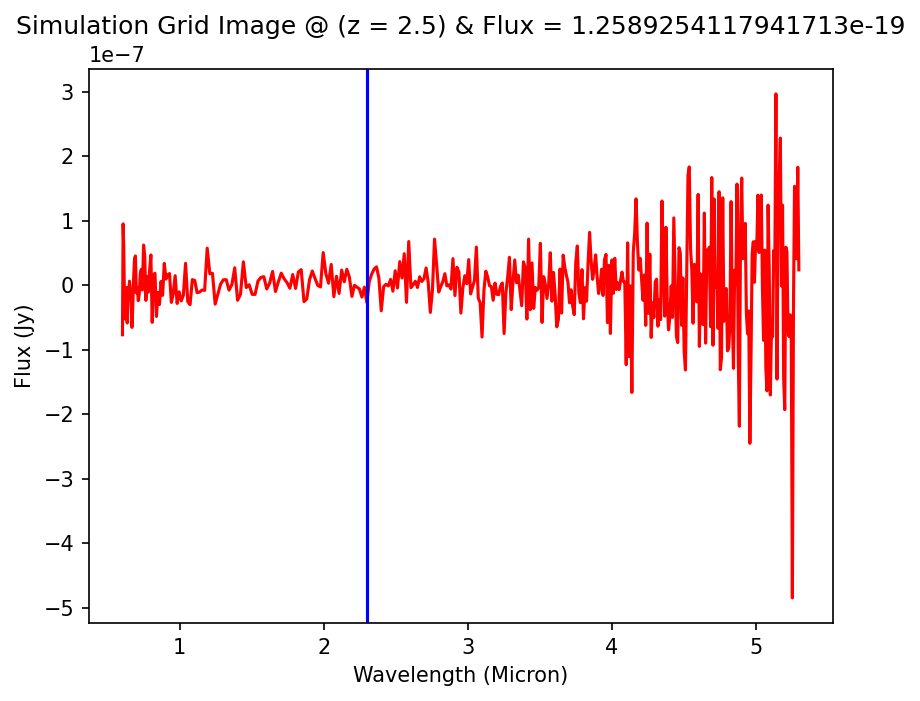

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.584893192461124e-19
Amp: 4.254022136443661e-21, Mu: 22969.8, Sigma: 14.863131505040334


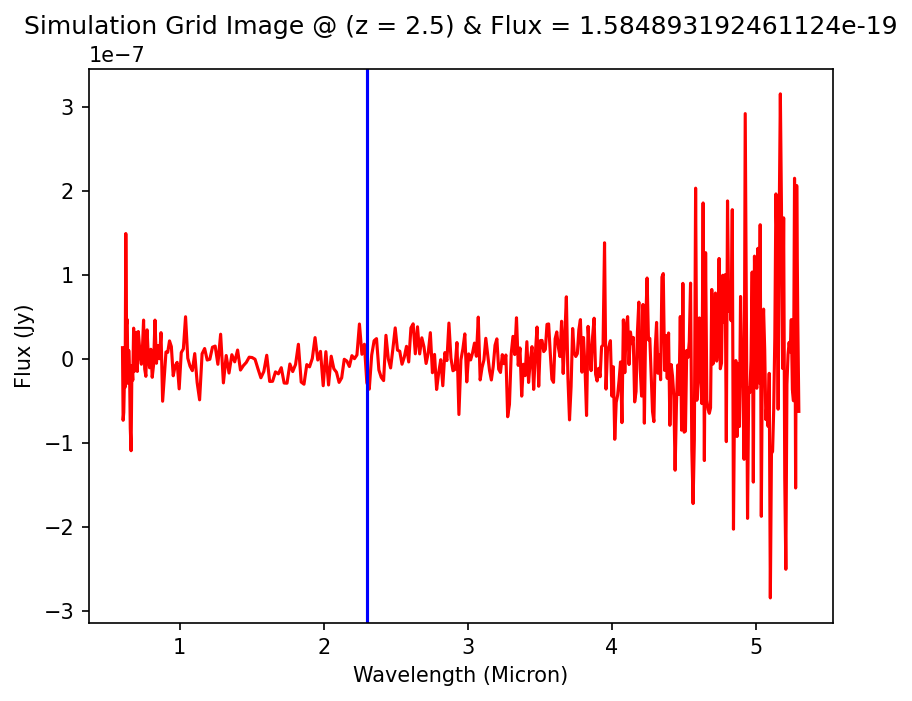

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.995262314968899e-19
Amp: 5.355496569903855e-21, Mu: 22969.8, Sigma: 14.863131505040334


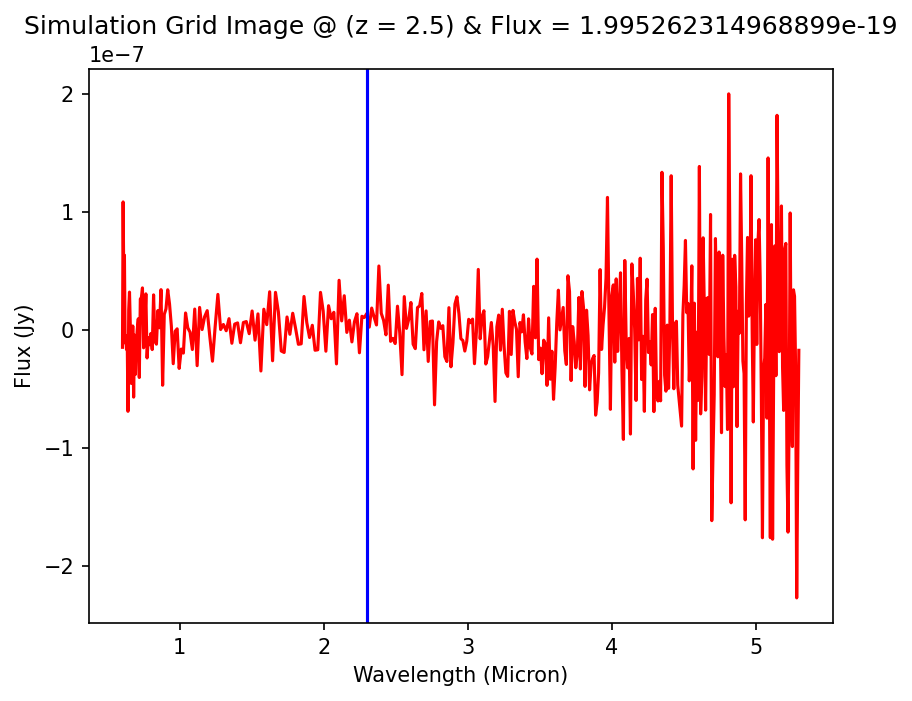

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 2.511886431509613e-19
Amp: 6.7421707246284835e-21, Mu: 22969.8, Sigma: 14.863131505040334


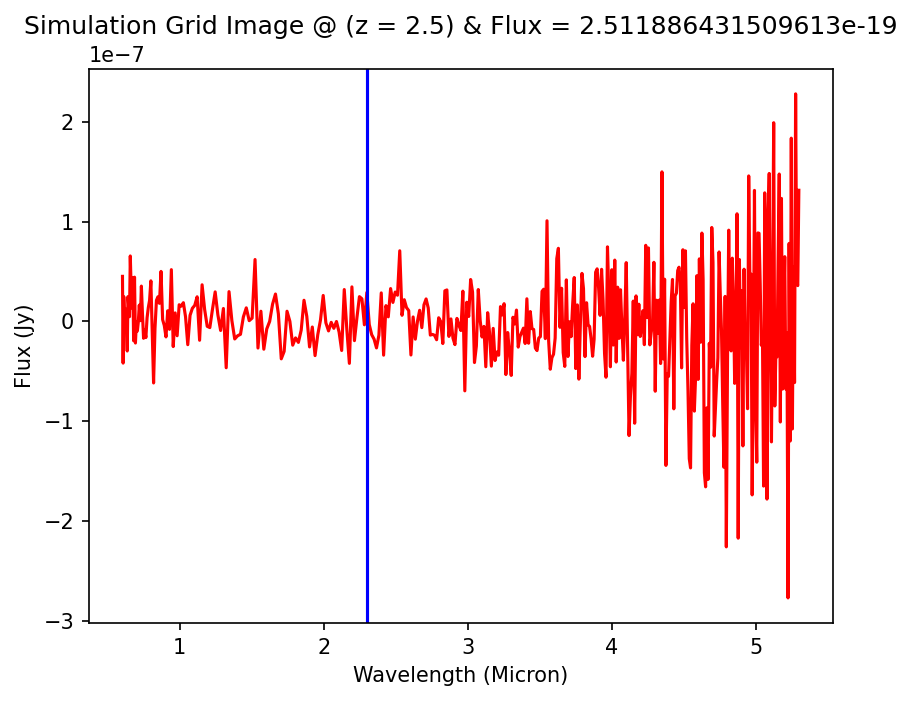

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 3.162277660168431e-19
Amp: 8.48789005588952e-21, Mu: 22969.8, Sigma: 14.863131505040334


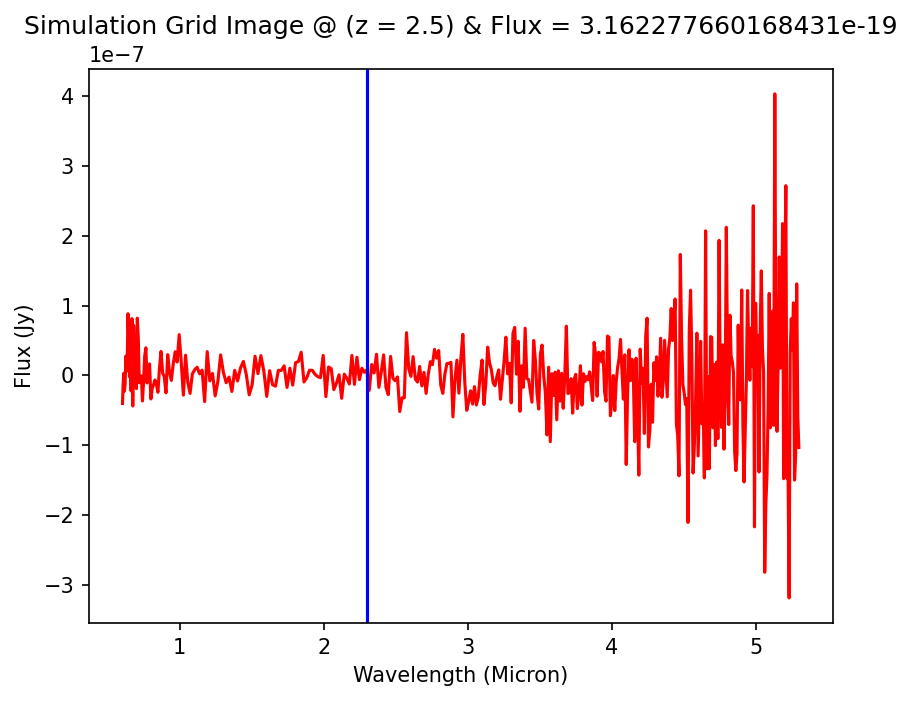

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 3.981071705535051e-19
Amp: 1.0685620483874366e-20, Mu: 22969.8, Sigma: 14.863131505040334


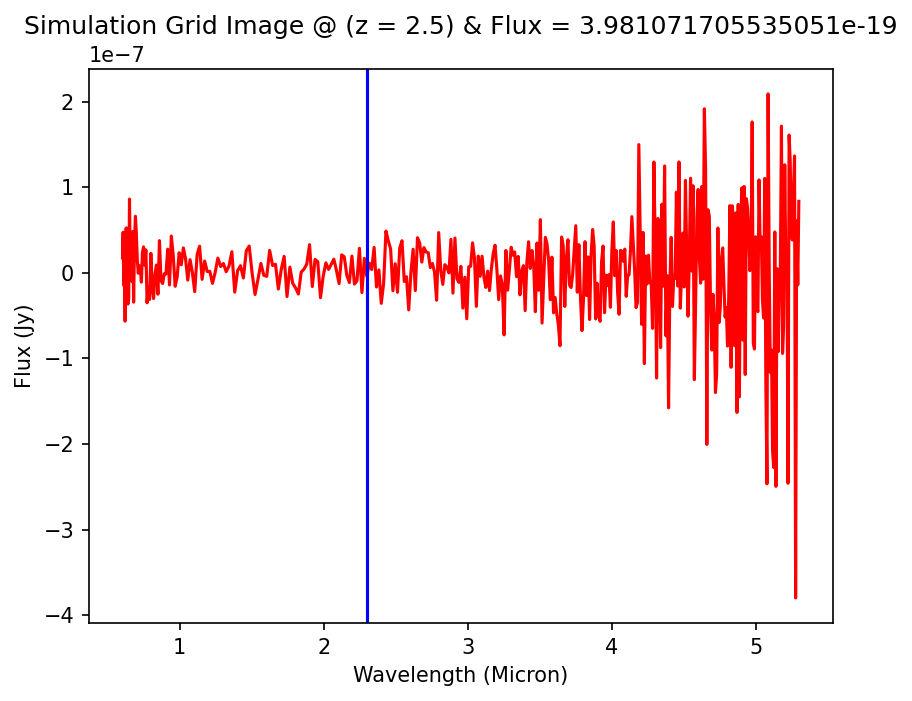

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 5.011872336272837e-19
Amp: 1.3452399167937767e-20, Mu: 22969.8, Sigma: 14.863131505040334


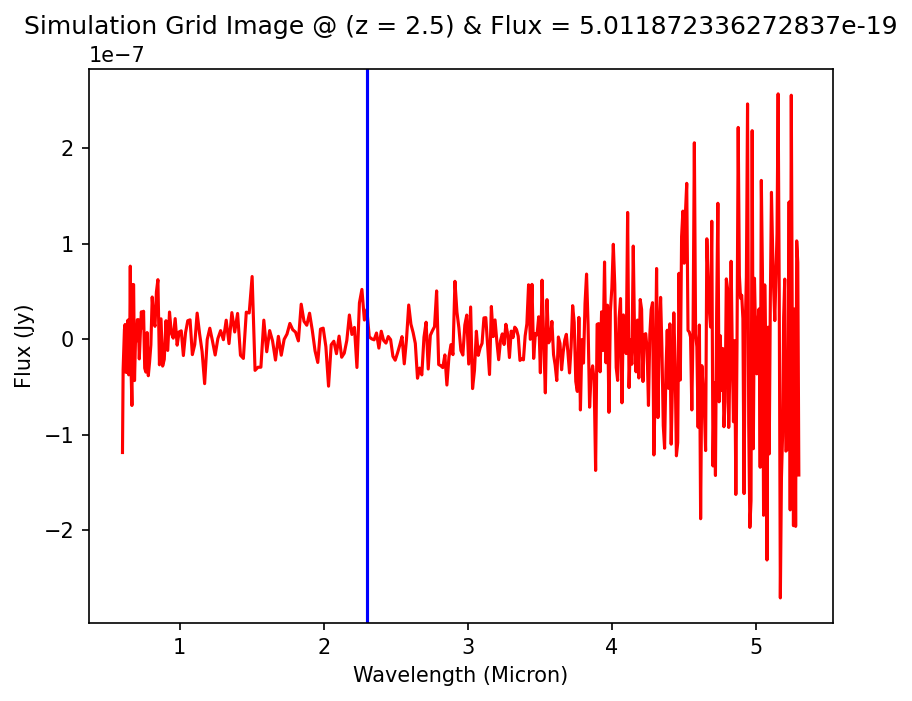

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 6.309573444802097e-19
Amp: 1.6935567162115622e-20, Mu: 22969.8, Sigma: 14.863131505040334


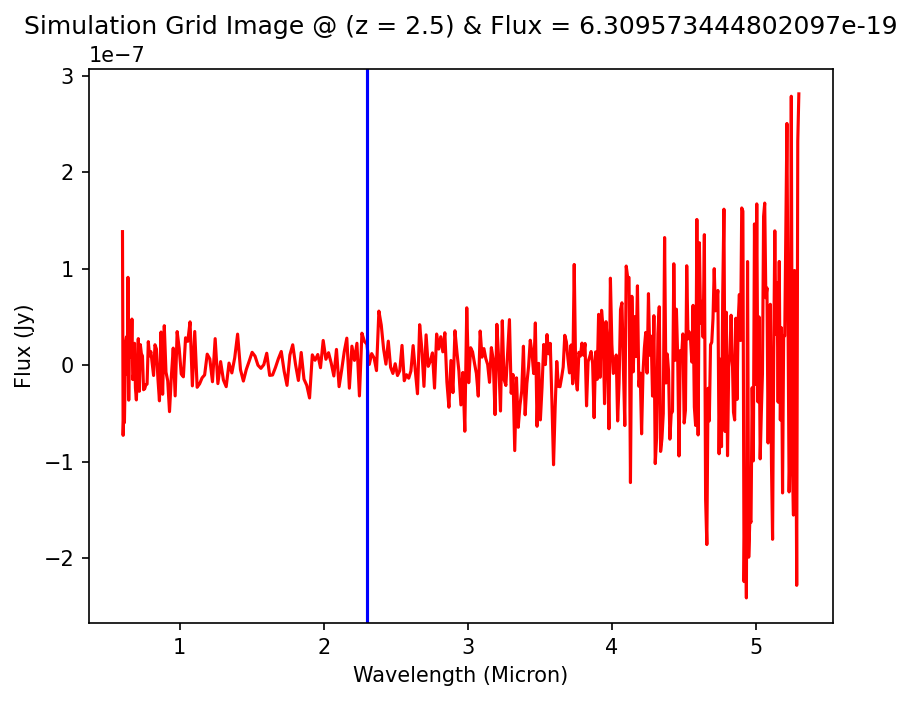

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 7.943282347243049e-19
Amp: 2.1320615863534254e-20, Mu: 22969.8, Sigma: 14.863131505040334


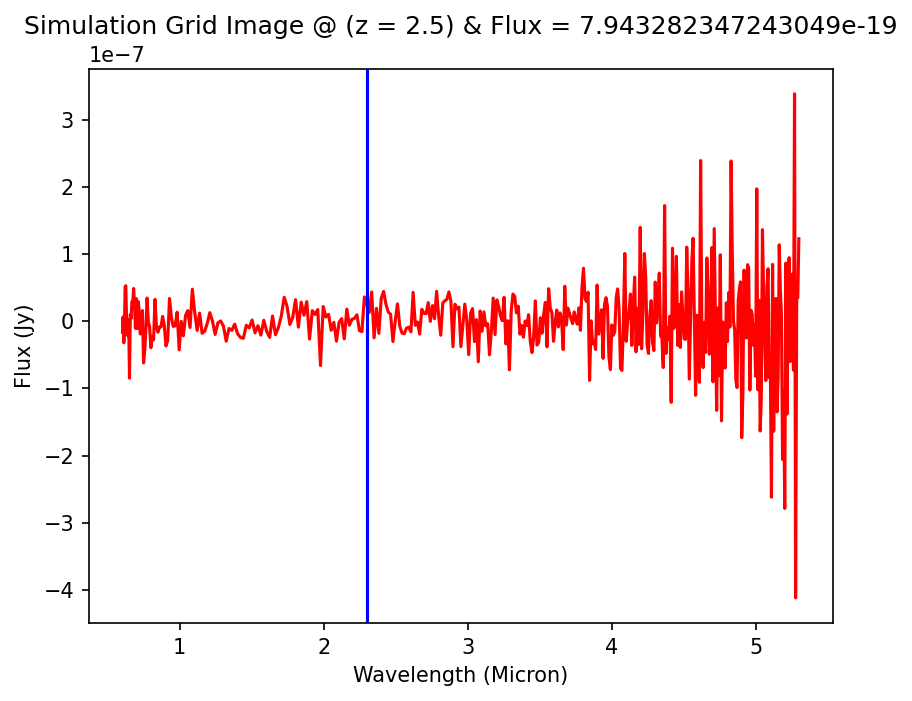

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.0000000000000328e-18
Amp: 2.6841065105705206e-20, Mu: 22969.8, Sigma: 14.863131505040334


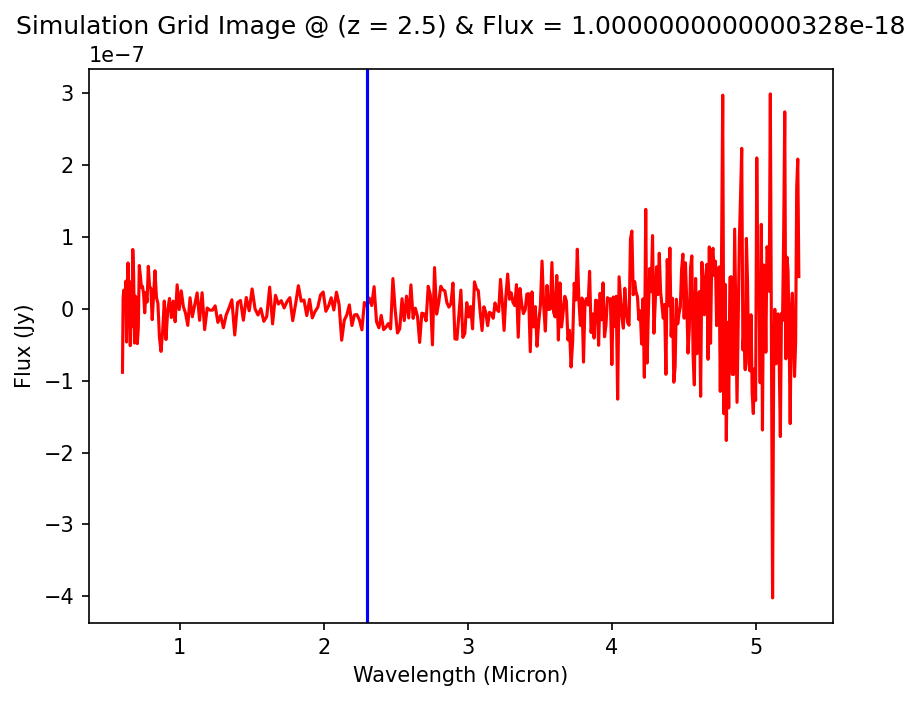

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.2589254117942125e-18
Amp: 3.379089894119409e-20, Mu: 22969.8, Sigma: 14.863131505040334


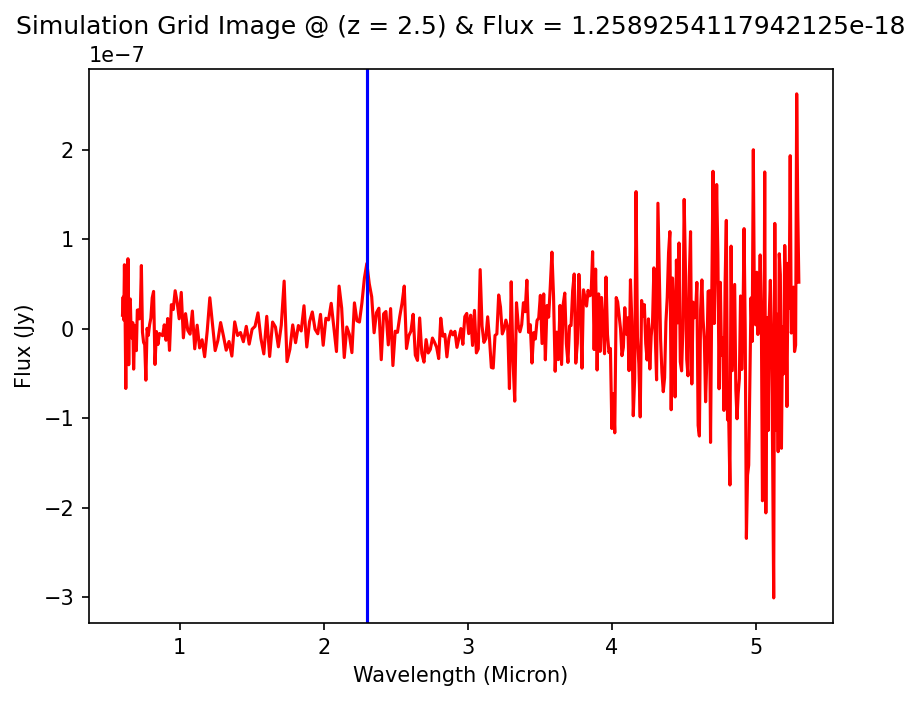

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.5848931924611758e-18
Amp: 4.2540221364437995e-20, Mu: 22969.8, Sigma: 14.863131505040334


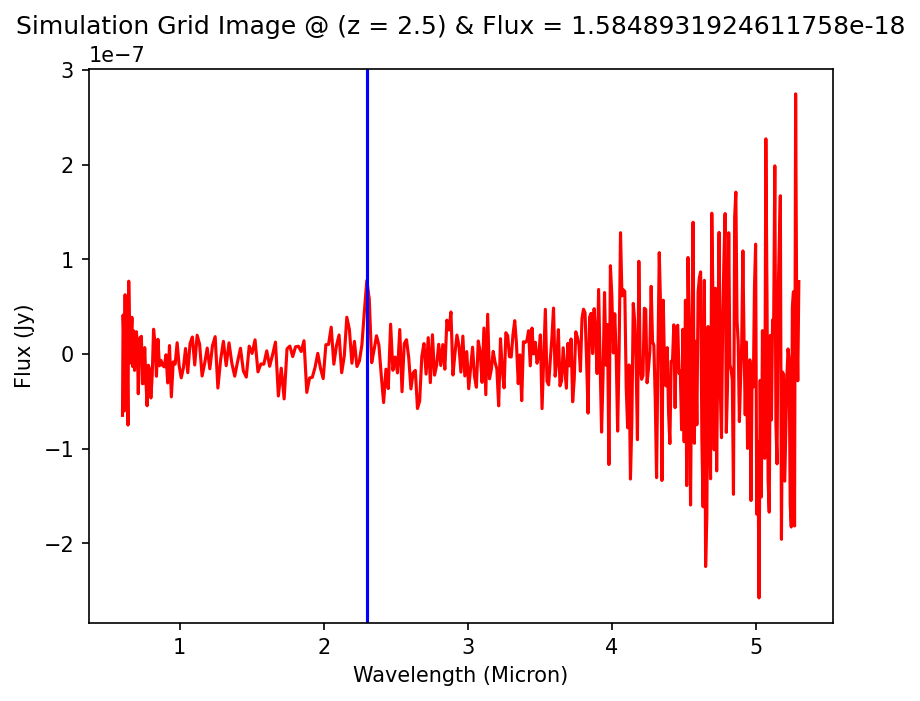

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.9952623149689645e-18
Amp: 5.355496569904031e-20, Mu: 22969.8, Sigma: 14.863131505040334


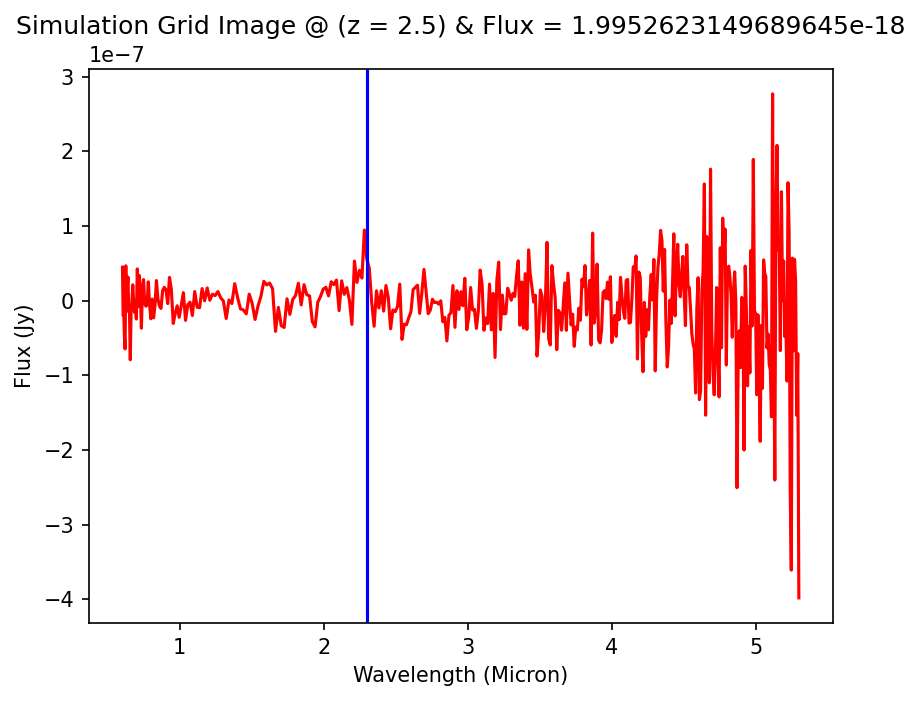

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 2.511886431509695e-18
Amp: 6.742170724628704e-20, Mu: 22969.8, Sigma: 14.863131505040334


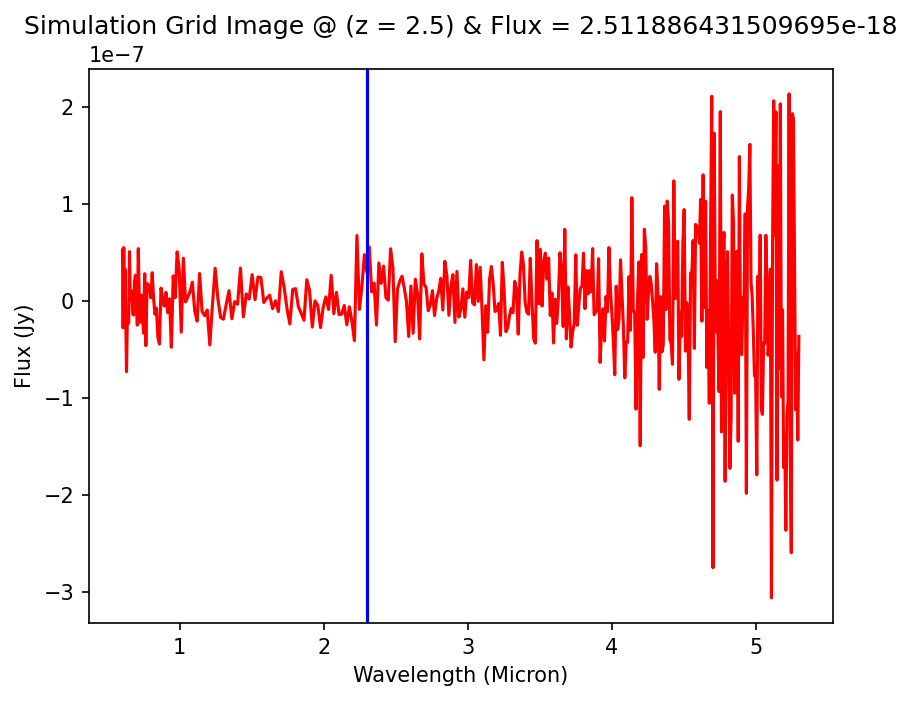

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 3.1622776601685347e-18
Amp: 8.487890055889798e-20, Mu: 22969.8, Sigma: 14.863131505040334


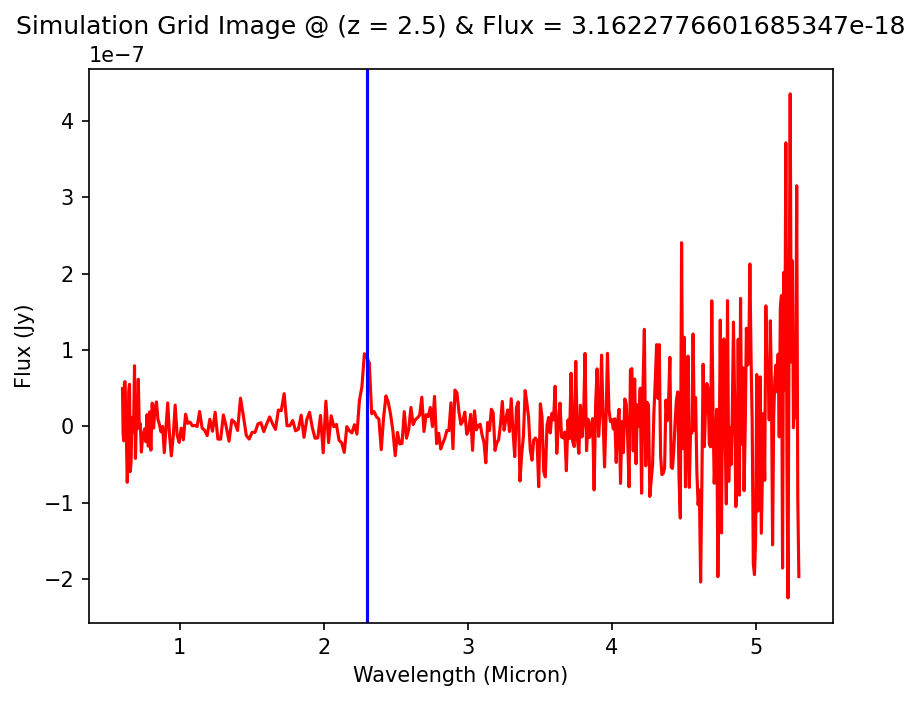

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 3.981071705535181e-18
Amp: 1.0685620483874715e-19, Mu: 22969.8, Sigma: 14.863131505040334


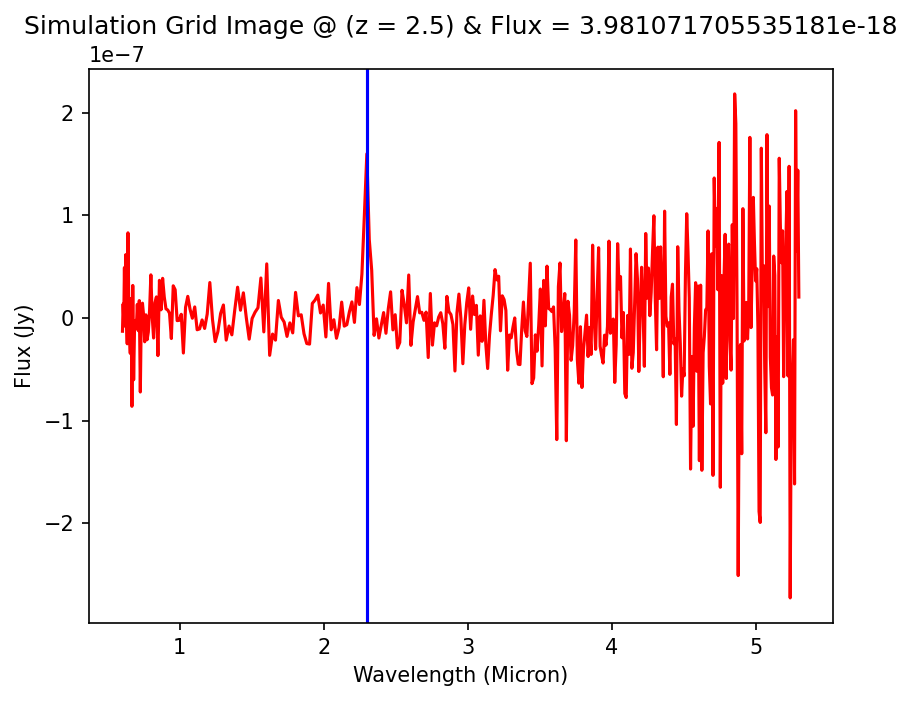

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 5.011872336273001e-18
Amp: 1.3452399167938208e-19, Mu: 22969.8, Sigma: 14.863131505040334


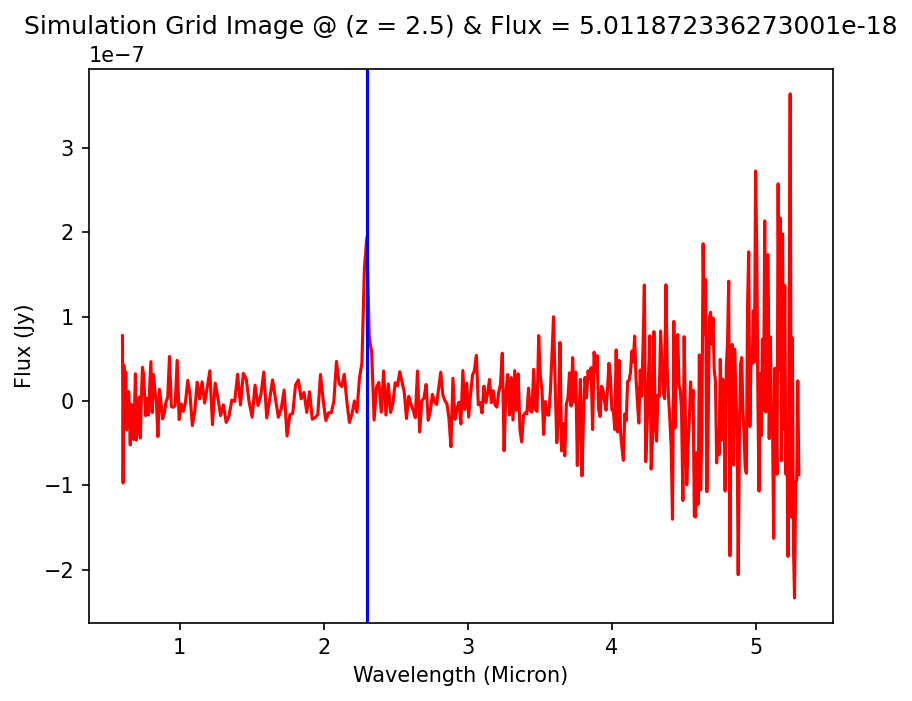

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 6.3095734448023044e-18
Amp: 1.6935567162116177e-19, Mu: 22969.8, Sigma: 14.863131505040334


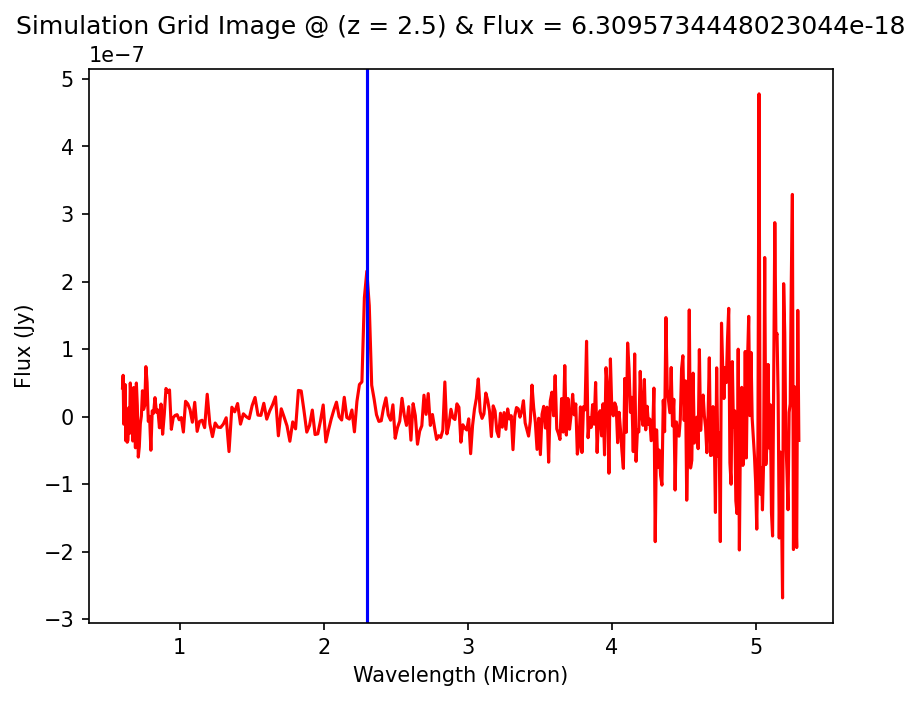

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 7.943282347243309e-18
Amp: 2.1320615863534953e-19, Mu: 22969.8, Sigma: 14.863131505040334


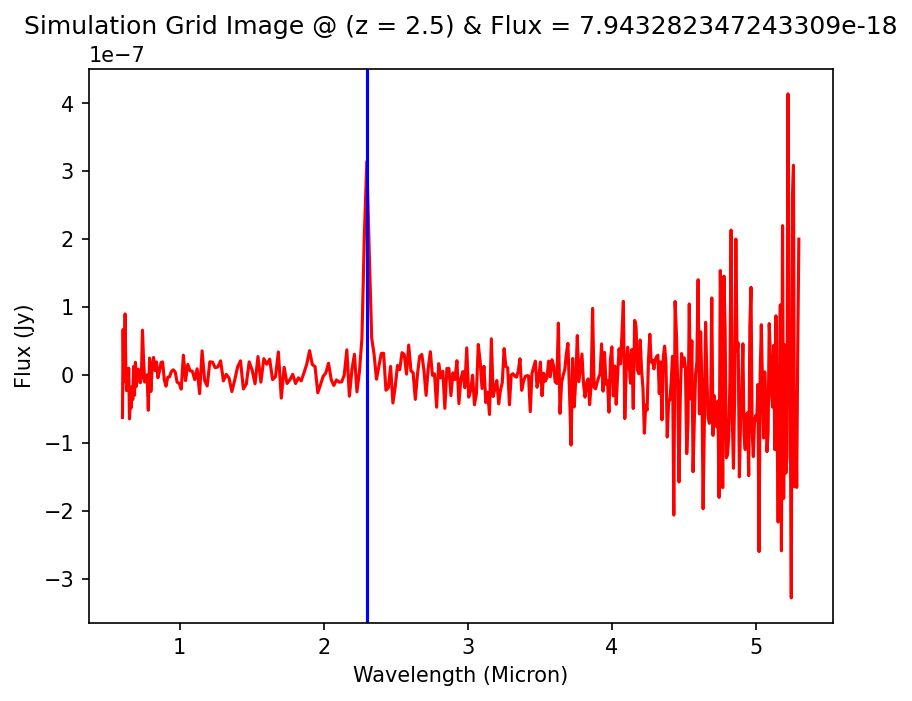

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.0000000000000654e-17
Amp: 2.6841065105706083e-19, Mu: 22969.8, Sigma: 14.863131505040334


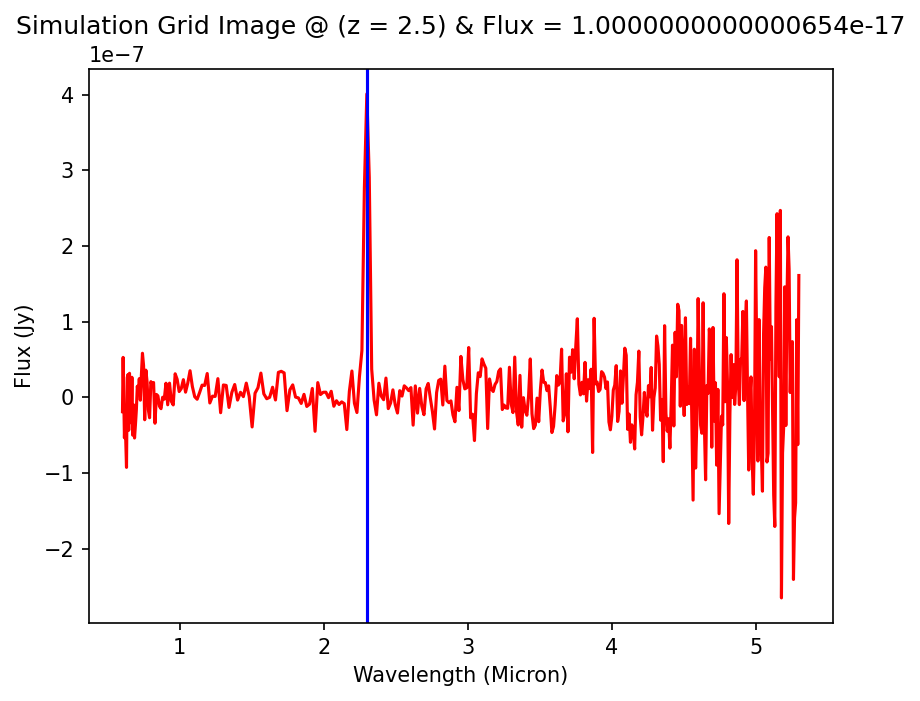

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.2589254117942538e-17
Amp: 3.3790898941195196e-19, Mu: 22969.8, Sigma: 14.863131505040334


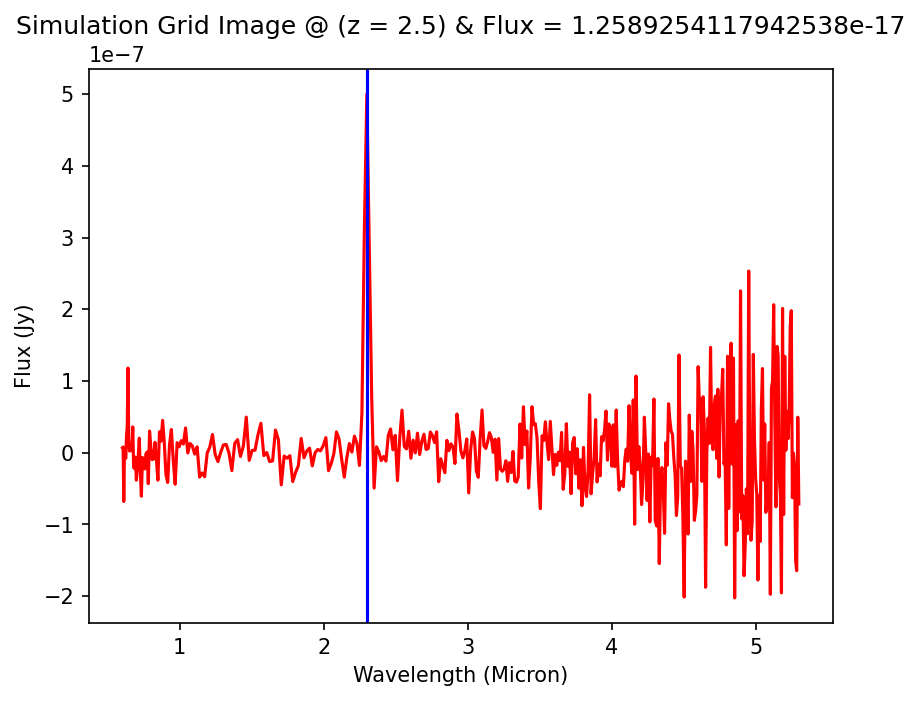

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.5848931924612275e-17
Amp: 4.2540221364439385e-19, Mu: 22969.8, Sigma: 14.863131505040334


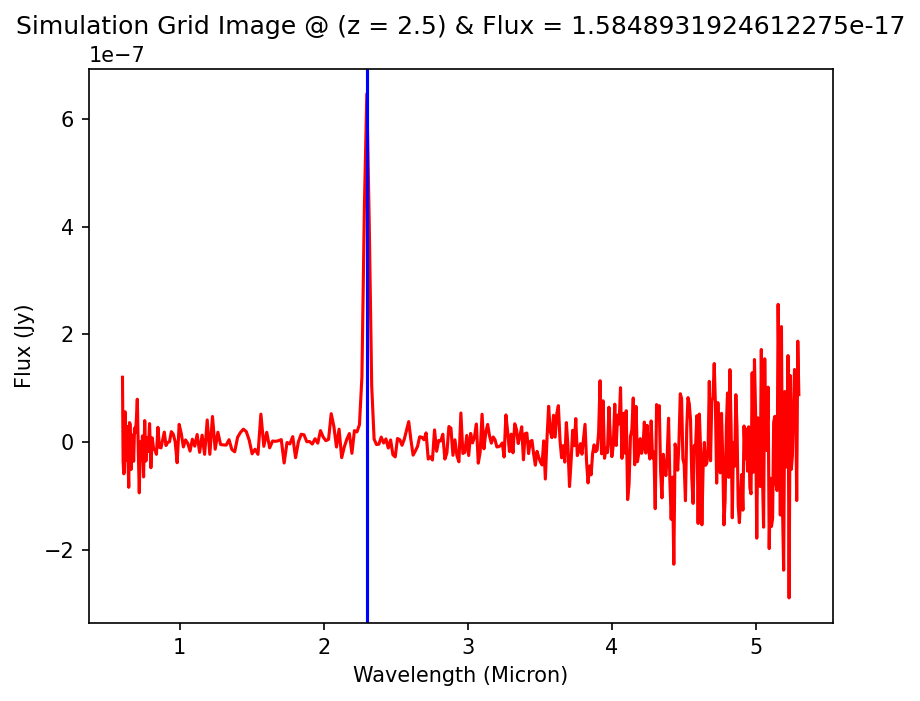

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.9952623149690297e-17
Amp: 5.355496569904206e-19, Mu: 22969.8, Sigma: 14.863131505040334


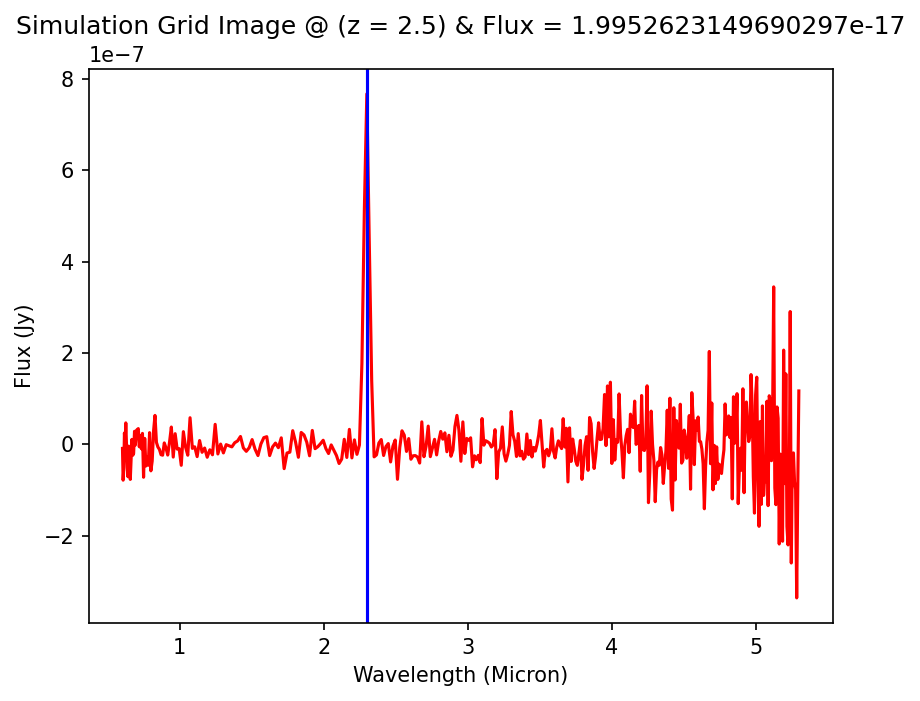

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 2.5118864315097773e-17
Amp: 6.742170724628924e-19, Mu: 22969.8, Sigma: 14.863131505040334


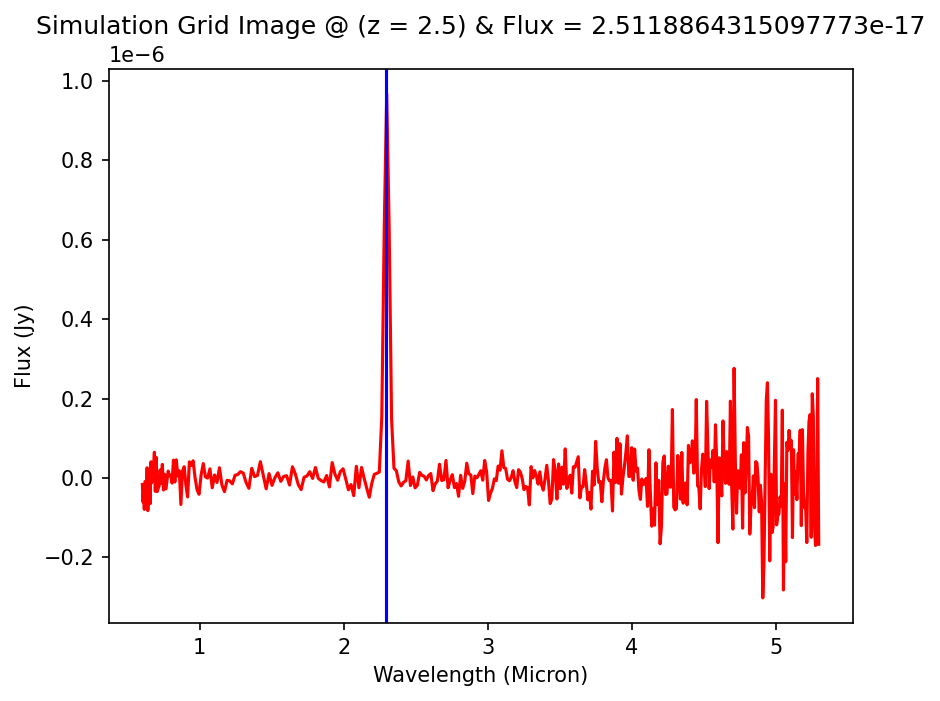

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 3.162277660168638e-17
Amp: 8.487890055890074e-19, Mu: 22969.8, Sigma: 14.863131505040334


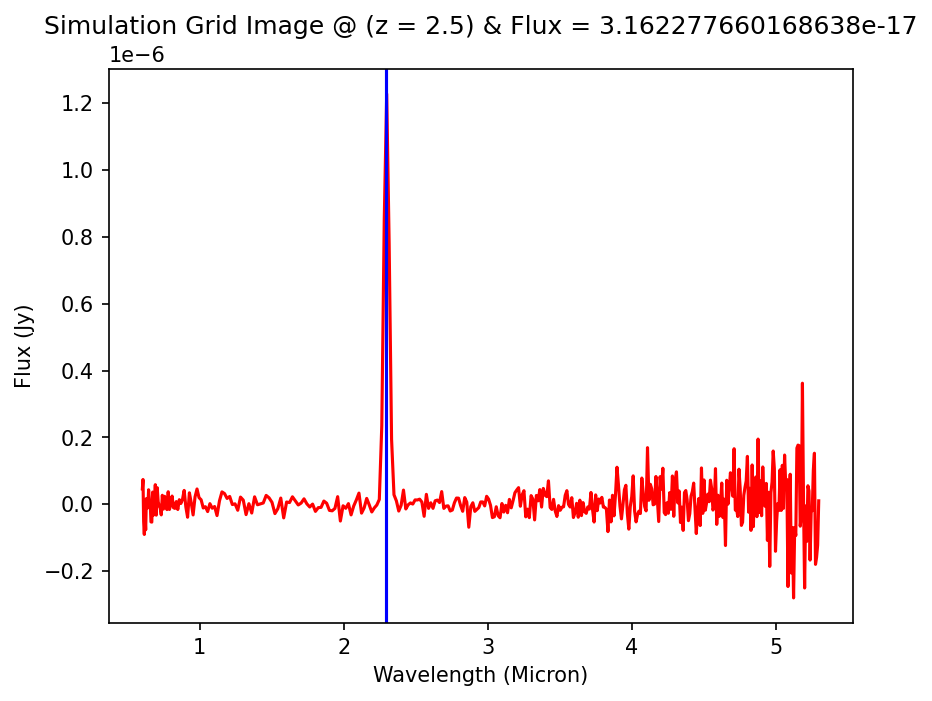

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 3.981071705535311e-17
Amp: 1.0685620483875064e-18, Mu: 22969.8, Sigma: 14.863131505040334


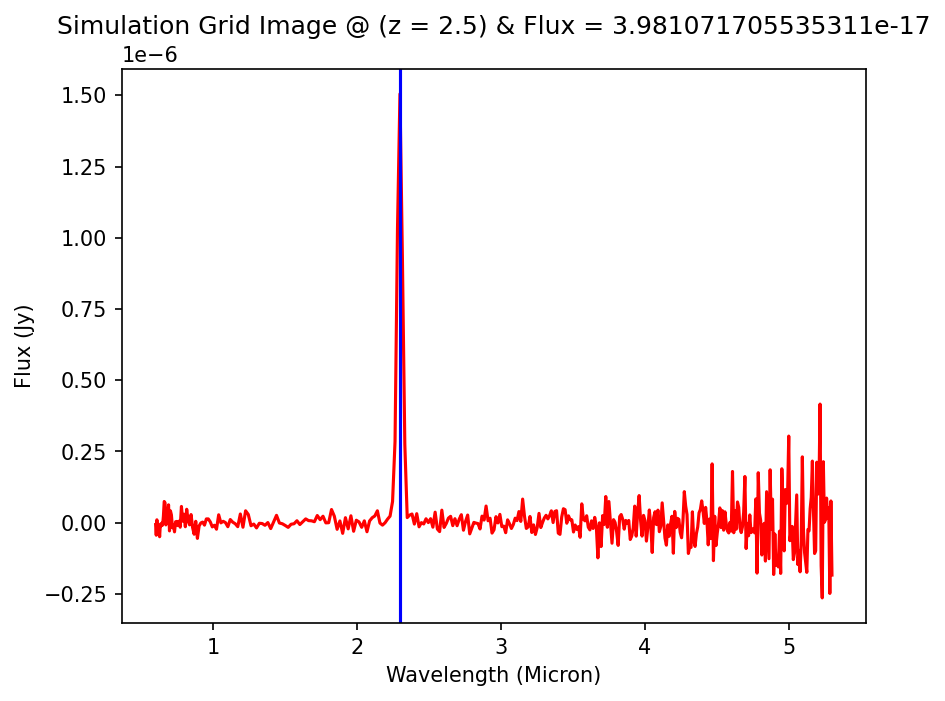

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 5.0118723362731656e-17
Amp: 1.3452399167938648e-18, Mu: 22969.8, Sigma: 14.863131505040334


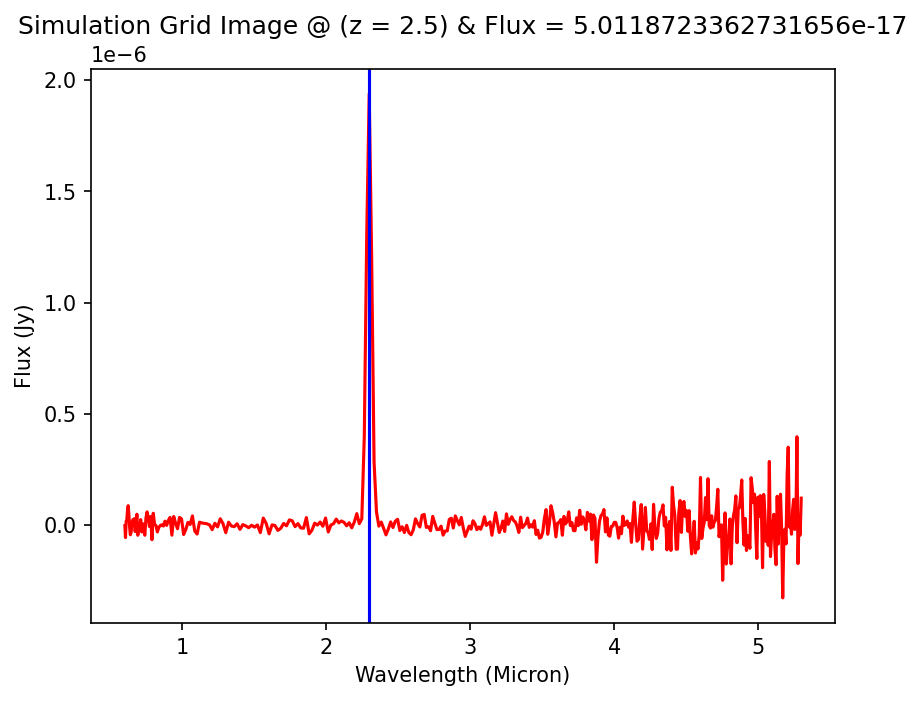

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 6.309573444802511e-17
Amp: 1.6935567162116731e-18, Mu: 22969.8, Sigma: 14.863131505040334


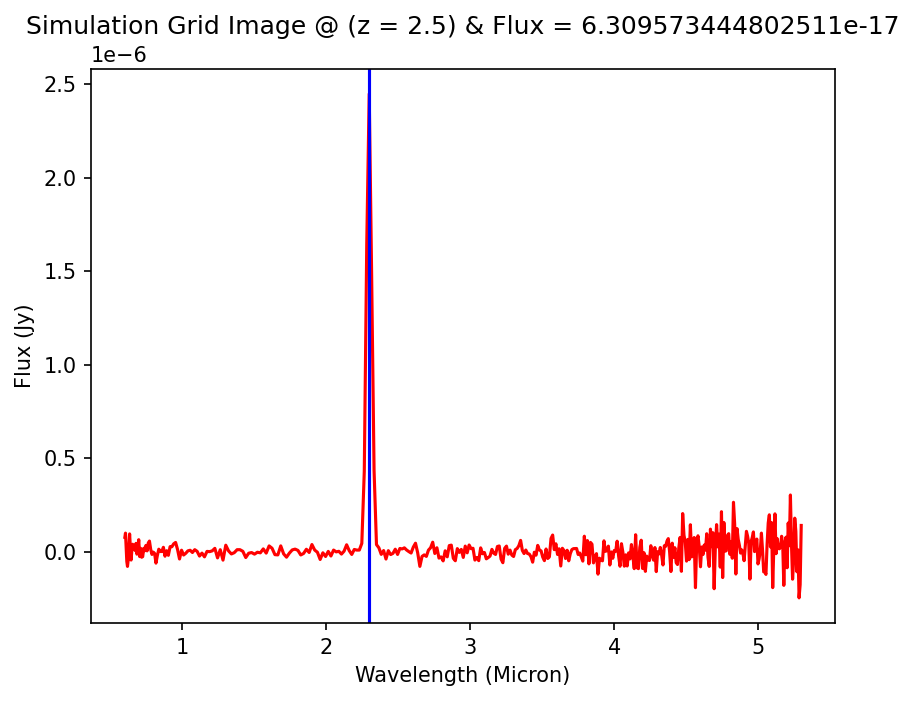

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 7.943282347243569e-17
Amp: 2.1320615863535653e-18, Mu: 22969.8, Sigma: 14.863131505040334


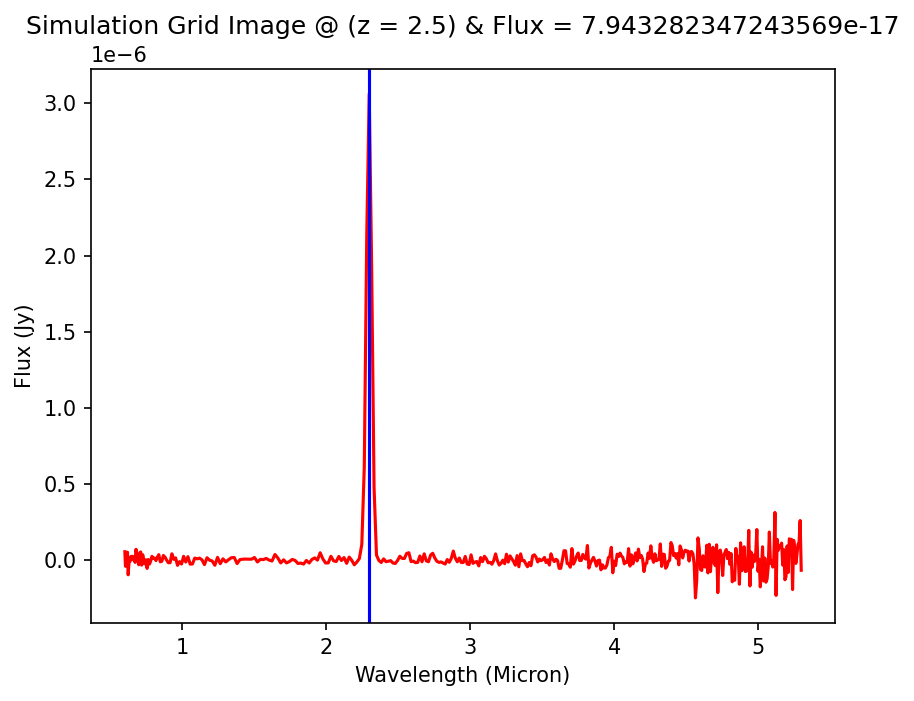

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 2.5, FWHM: 10, Integrated Flux: 1.0000000000000982e-16
Amp: 2.6841065105706962e-18, Mu: 22969.8, Sigma: 14.863131505040334


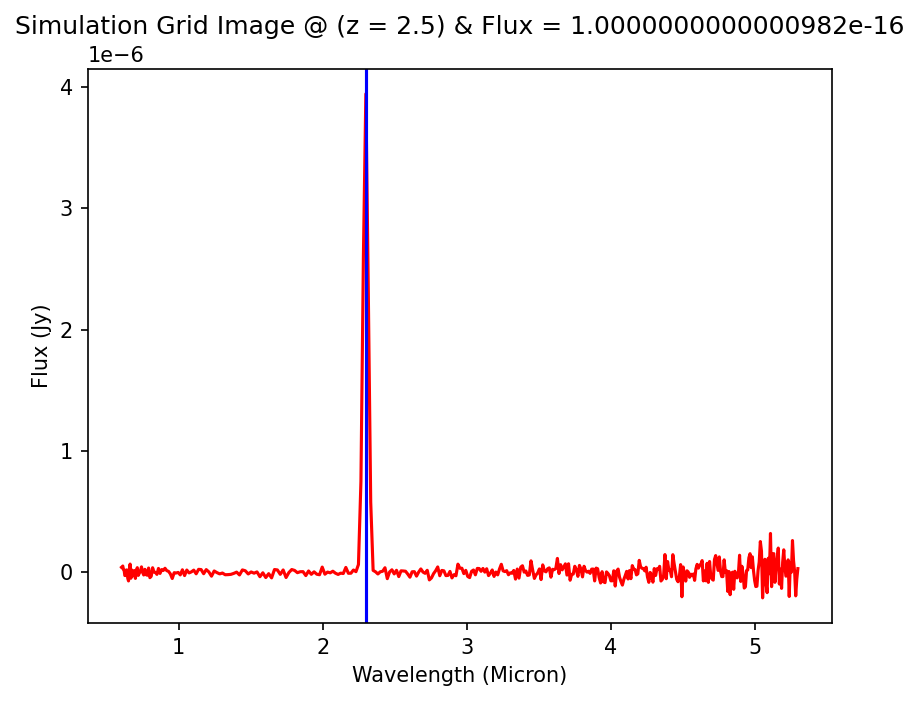

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1e-19
Amp: 2.3485931967491284e-21, Mu: 26251.2, Sigma: 16.986436005760382


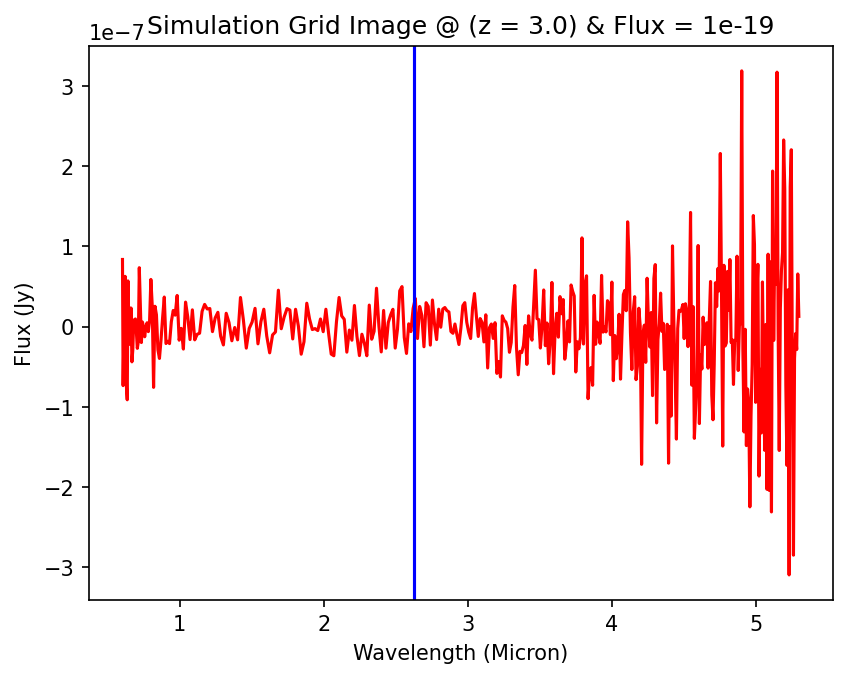

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.2589254117941713e-19
Amp: 2.9567036573543855e-21, Mu: 26251.2, Sigma: 16.986436005760382


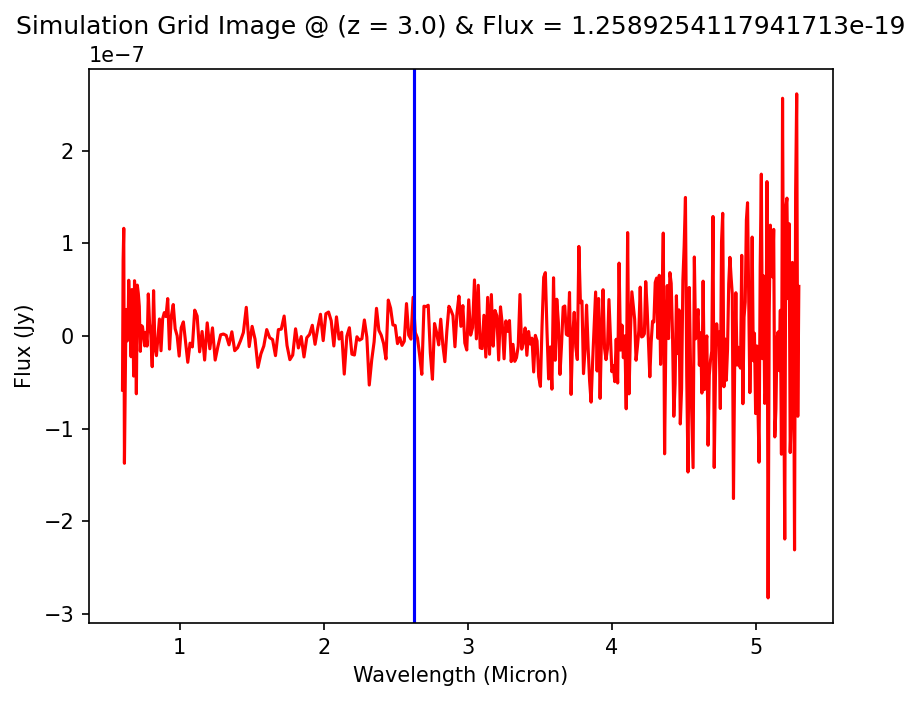

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.584893192461124e-19
Amp: 3.7222693693882024e-21, Mu: 26251.2, Sigma: 16.986436005760382


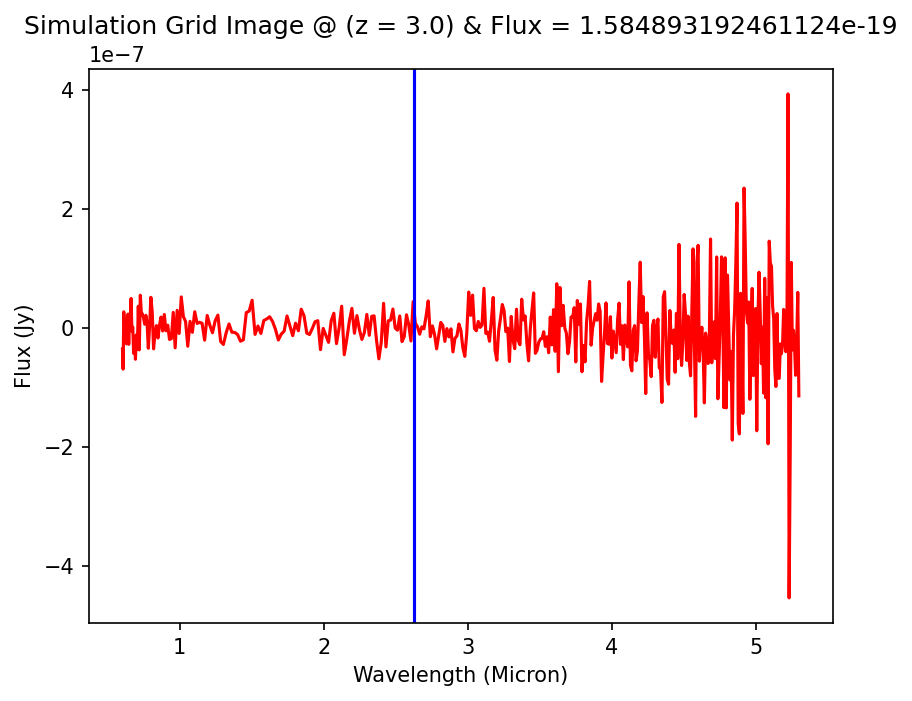

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.995262314968899e-19
Amp: 4.686059498665873e-21, Mu: 26251.2, Sigma: 16.986436005760382


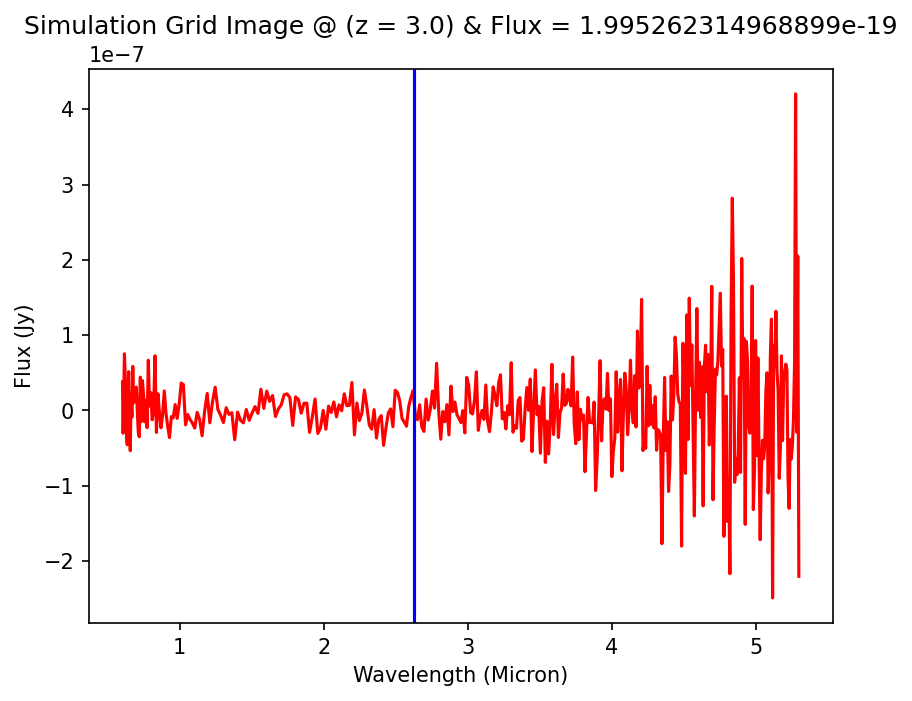

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 2.511886431509613e-19
Amp: 5.899399384049923e-21, Mu: 26251.2, Sigma: 16.986436005760382


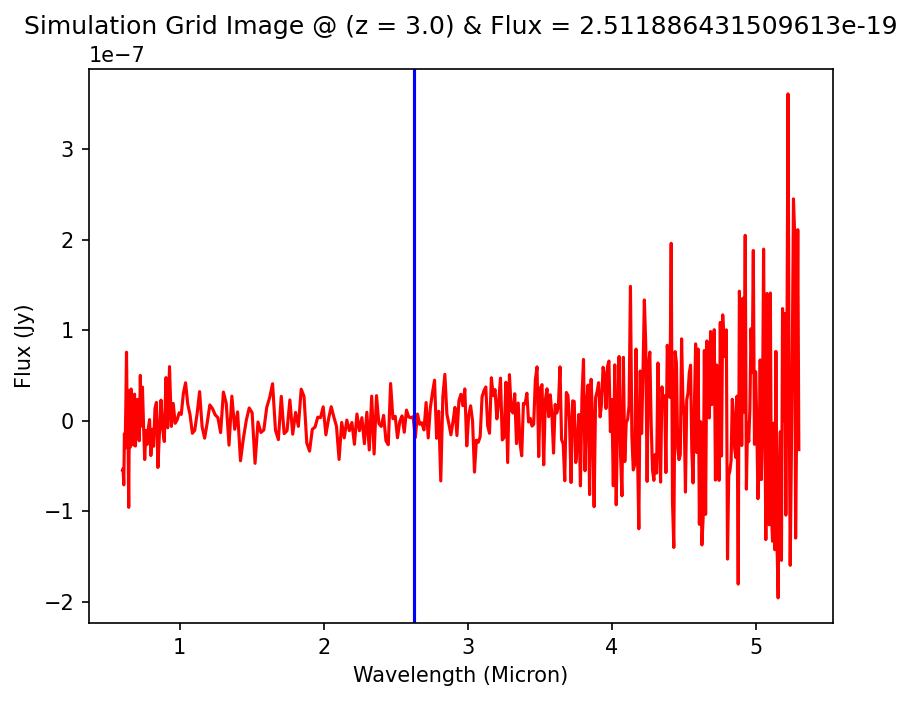

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 3.162277660168431e-19
Amp: 7.426903798903329e-21, Mu: 26251.2, Sigma: 16.986436005760382


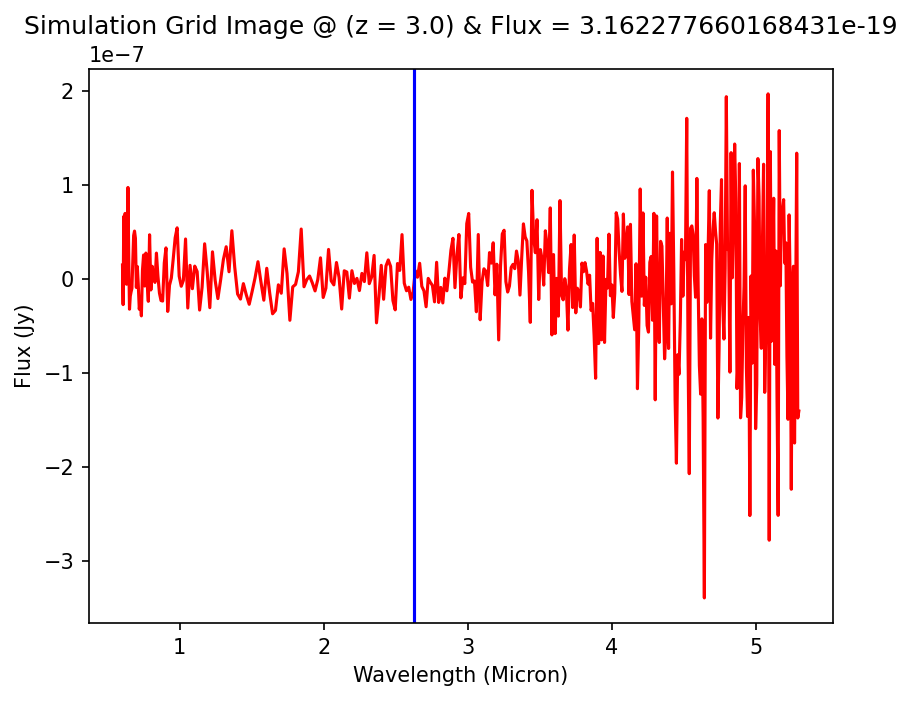

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 3.981071705535051e-19
Amp: 9.349917923390069e-21, Mu: 26251.2, Sigma: 16.986436005760382


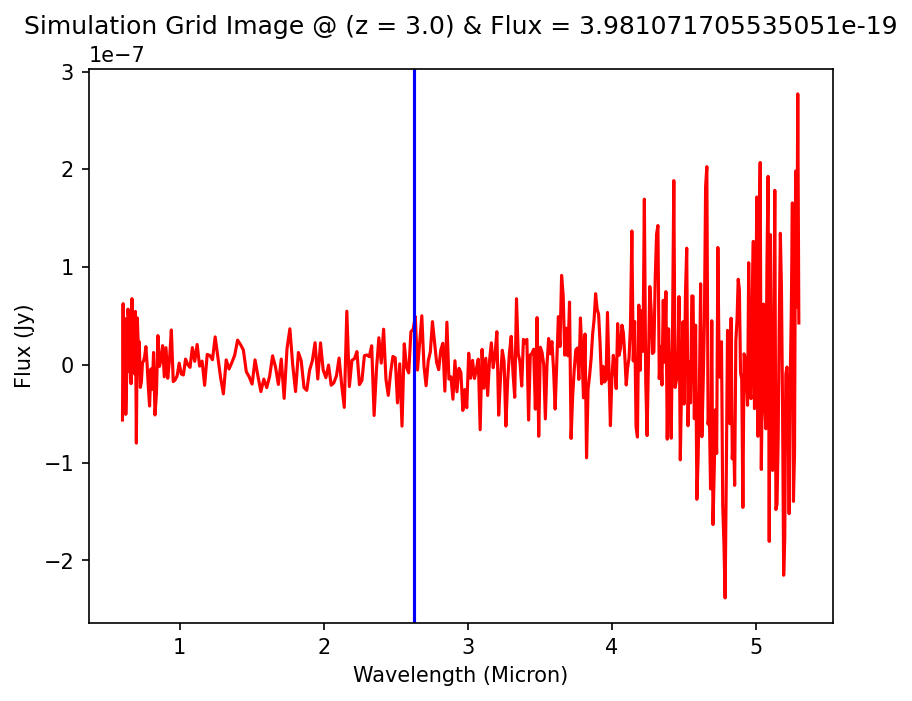

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 5.011872336272837e-19
Amp: 1.1770849271945544e-20, Mu: 26251.2, Sigma: 16.986436005760382


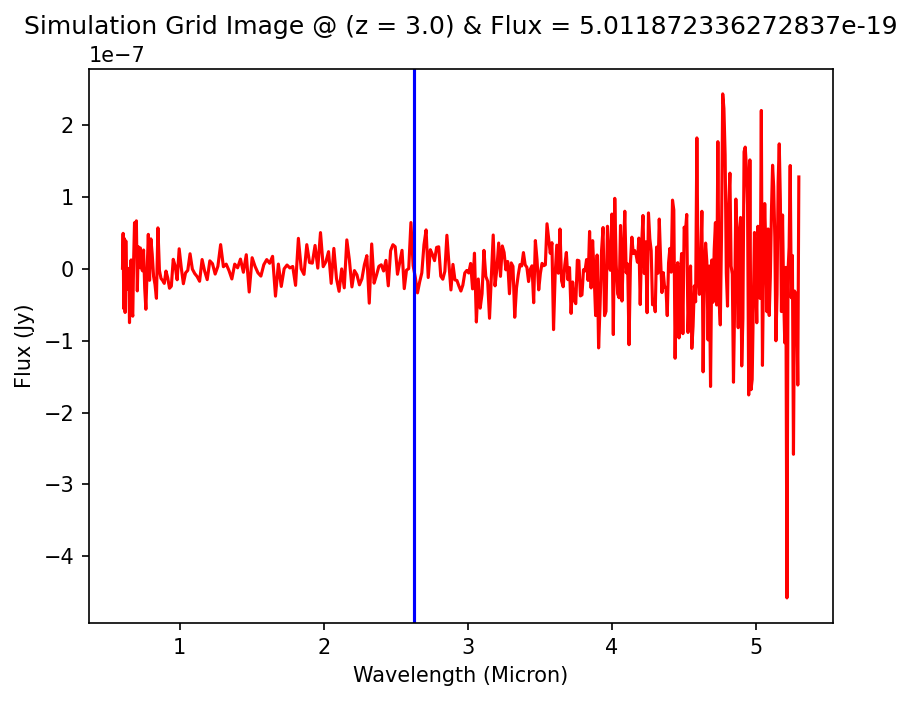

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 6.309573444802097e-19
Amp: 1.4818621266851167e-20, Mu: 26251.2, Sigma: 16.986436005760382


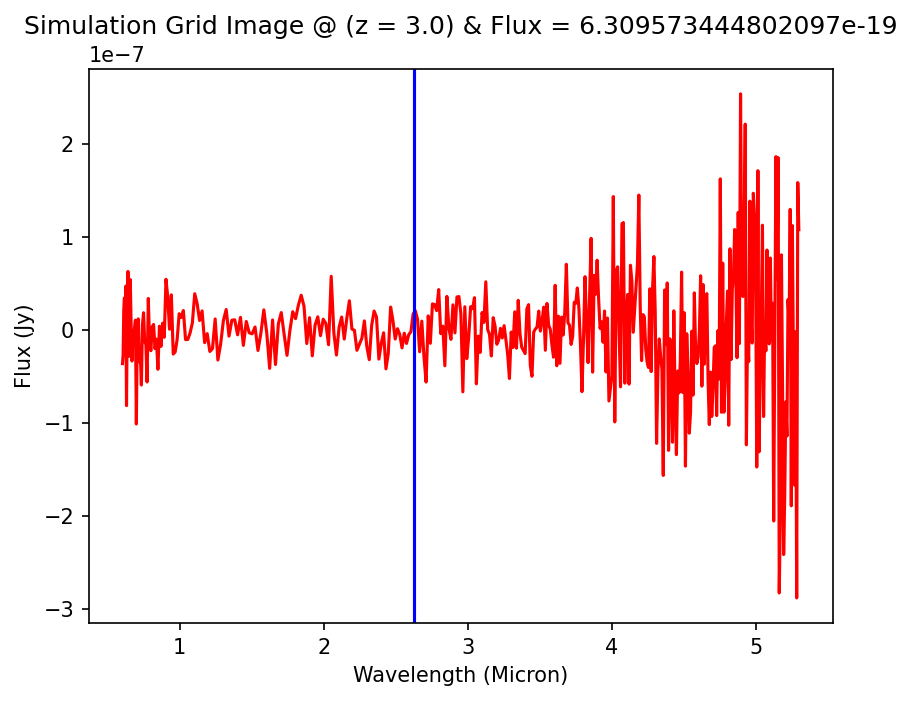

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 7.943282347243049e-19
Amp: 1.8655538880592472e-20, Mu: 26251.2, Sigma: 16.986436005760382


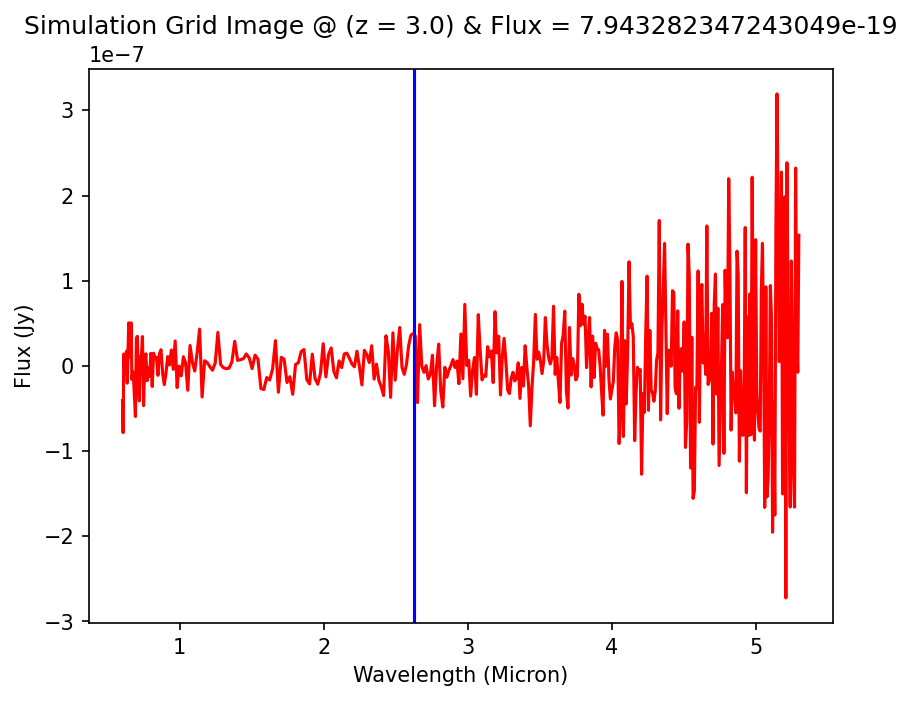

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.0000000000000328e-18
Amp: 2.3485931967492053e-20, Mu: 26251.2, Sigma: 16.986436005760382


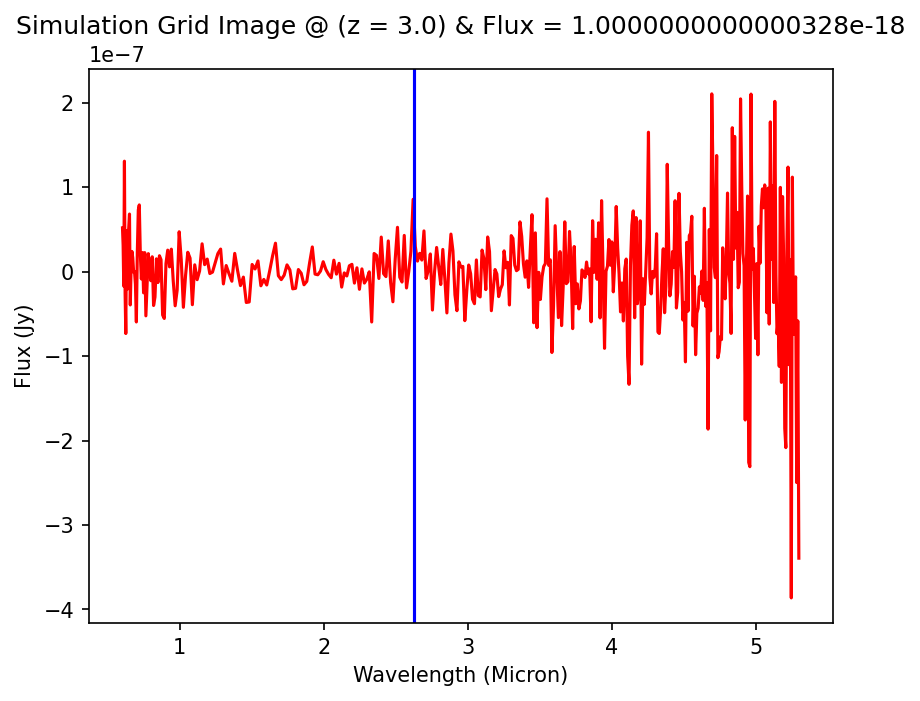

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.2589254117942125e-18
Amp: 2.9567036573544826e-20, Mu: 26251.2, Sigma: 16.986436005760382


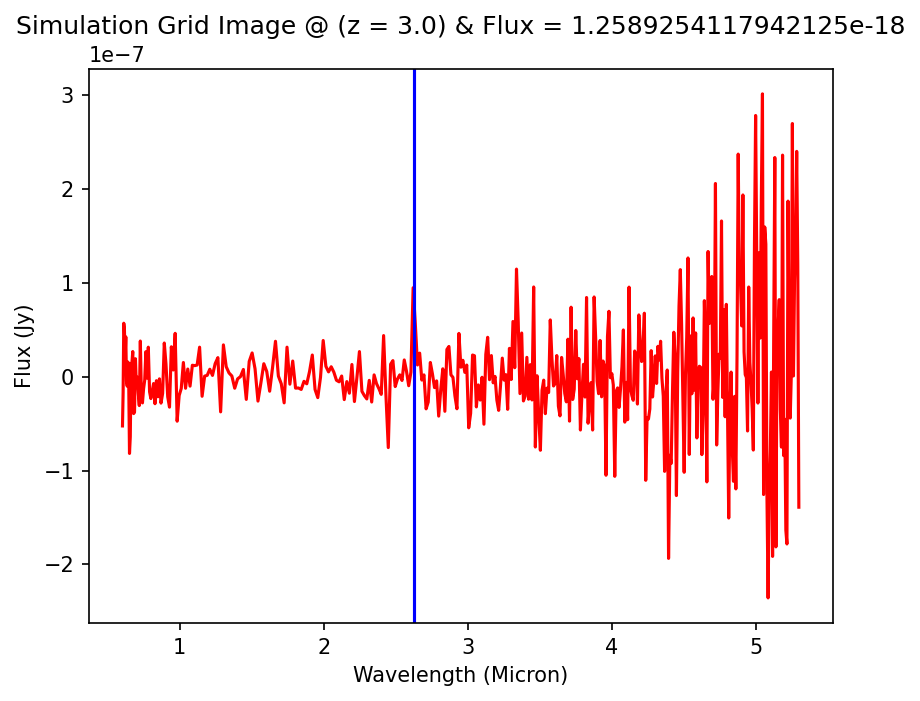

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.5848931924611758e-18
Amp: 3.722269369388324e-20, Mu: 26251.2, Sigma: 16.986436005760382


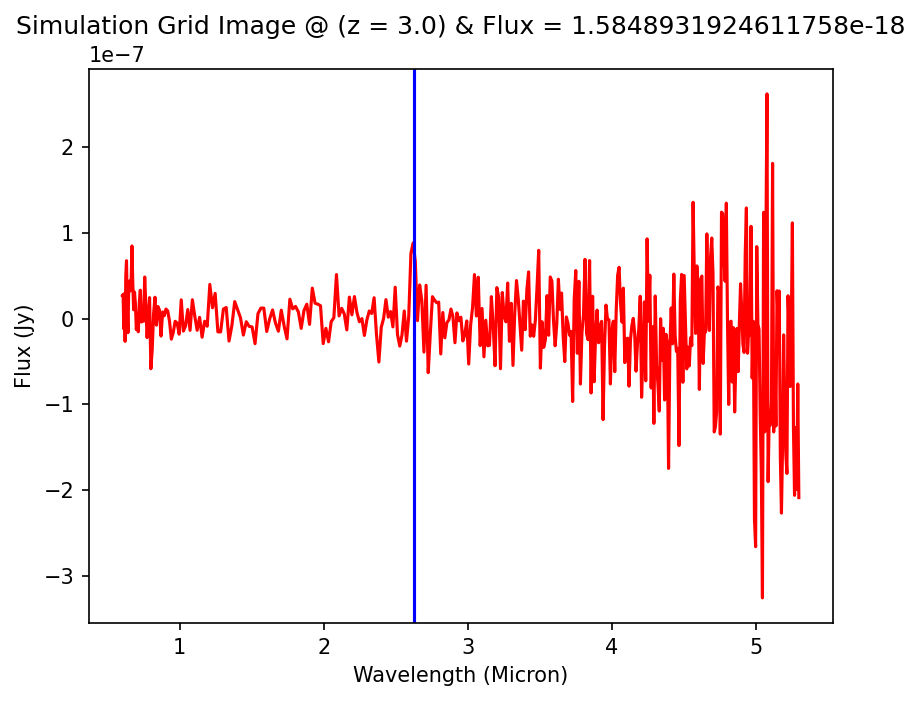

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.9952623149689645e-18
Amp: 4.686059498666026e-20, Mu: 26251.2, Sigma: 16.986436005760382


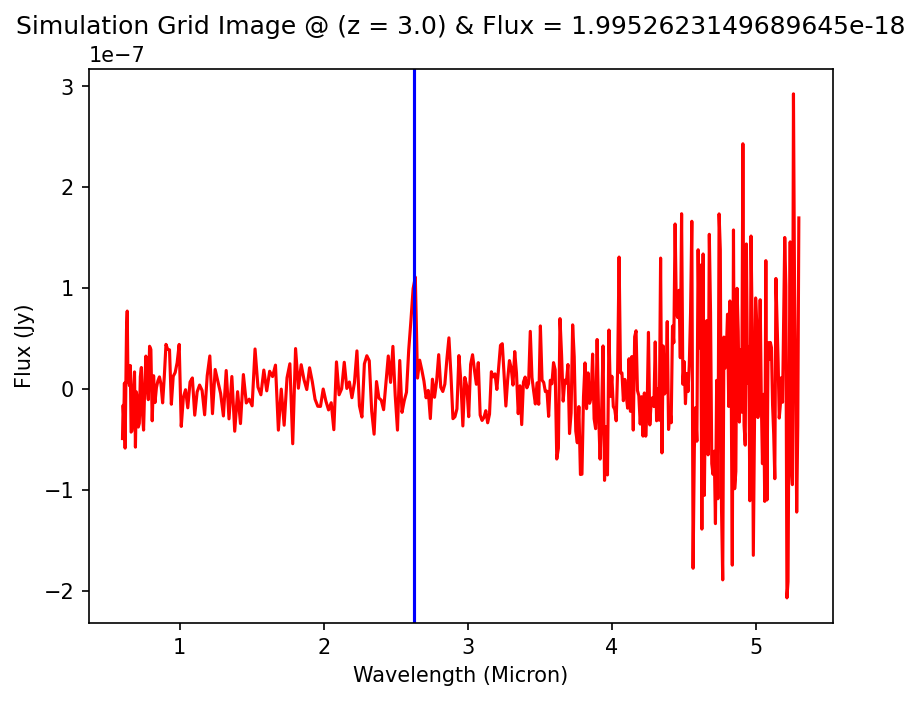

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 2.511886431509695e-18
Amp: 5.899399384050114e-20, Mu: 26251.2, Sigma: 16.986436005760382


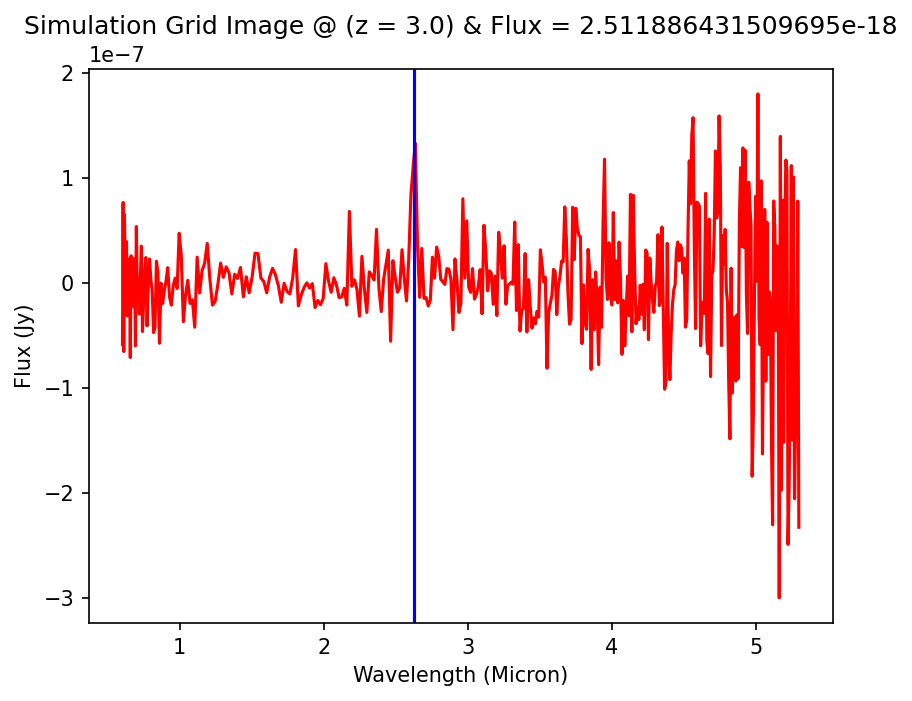

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 3.1622776601685347e-18
Amp: 7.426903798903573e-20, Mu: 26251.2, Sigma: 16.986436005760382


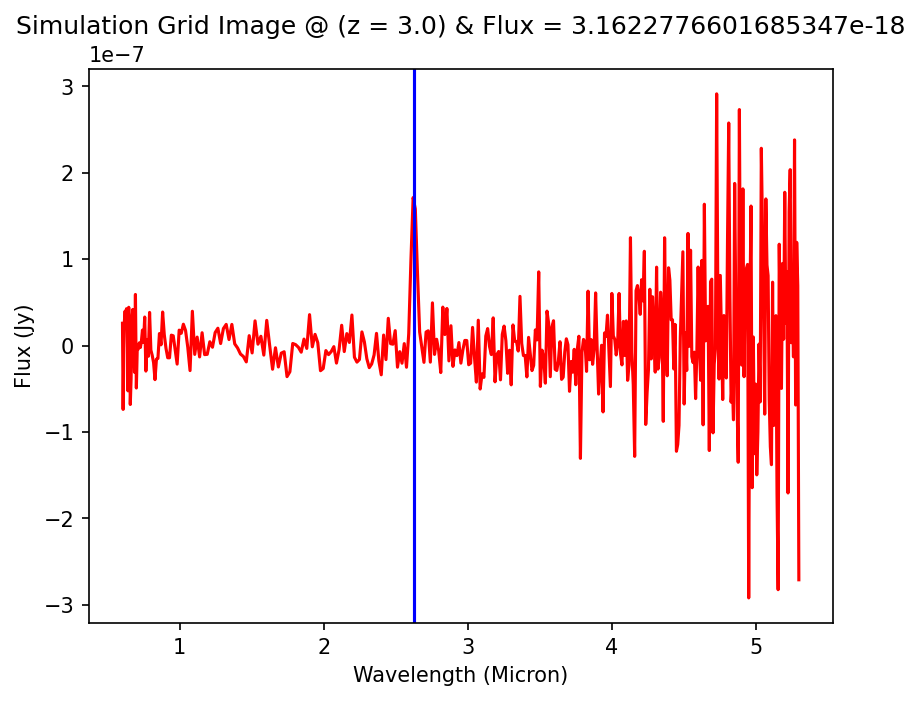

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 3.981071705535181e-18
Amp: 9.349917923390375e-20, Mu: 26251.2, Sigma: 16.986436005760382


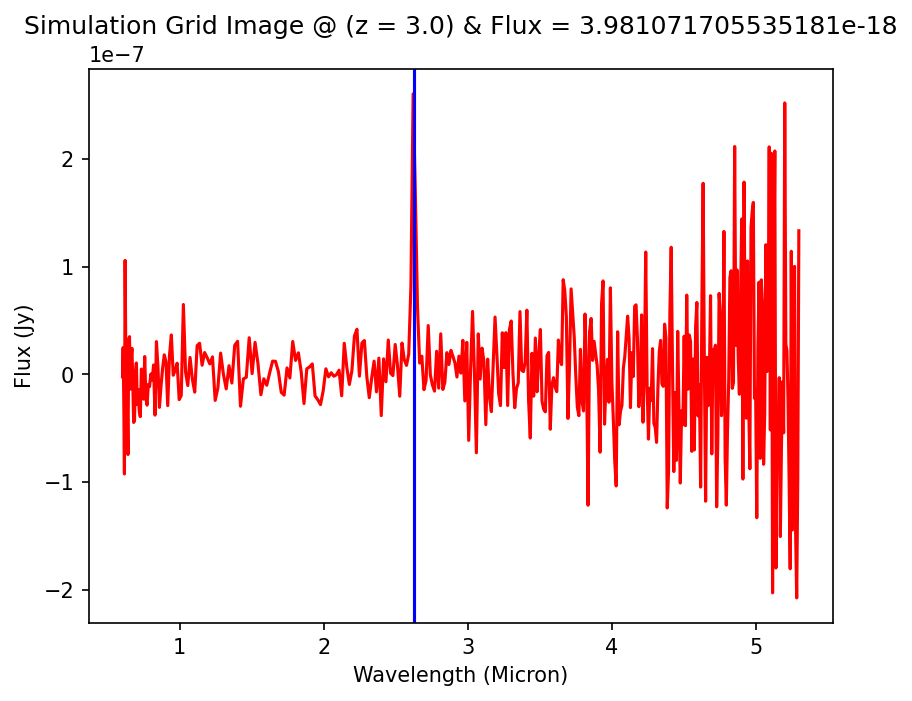

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 5.011872336273001e-18
Amp: 1.177084927194593e-19, Mu: 26251.2, Sigma: 16.986436005760382


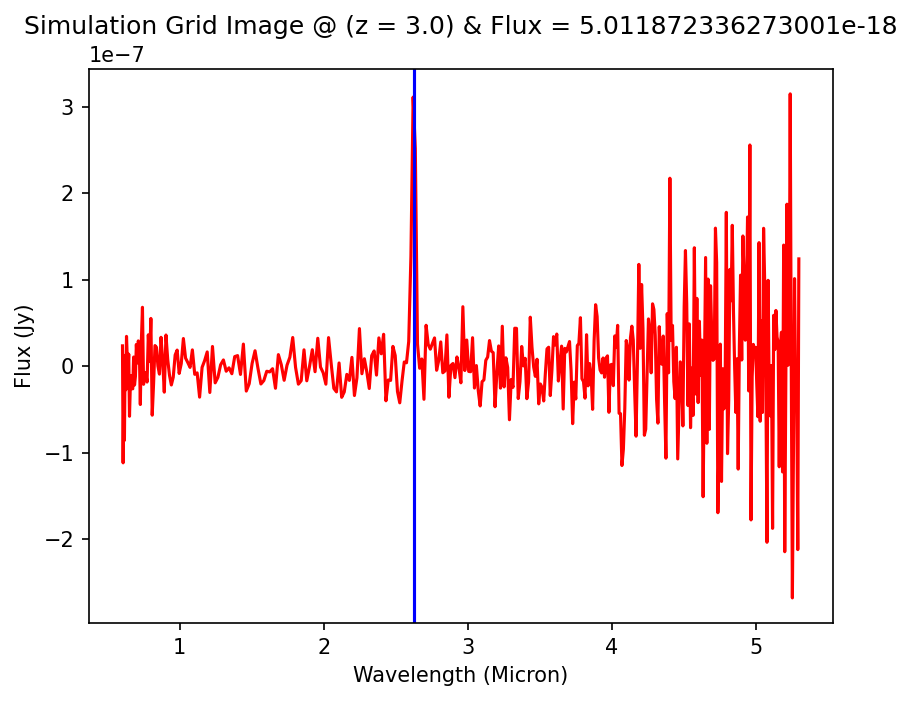

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 6.3095734448023044e-18
Amp: 1.4818621266851653e-19, Mu: 26251.2, Sigma: 16.986436005760382


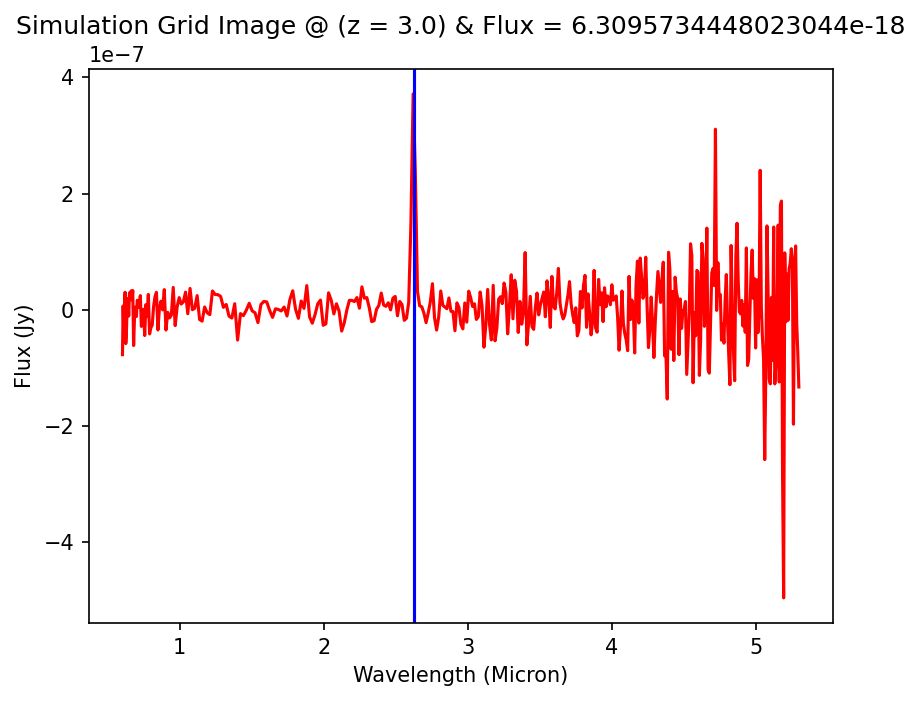

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 7.943282347243309e-18
Amp: 1.8655538880593083e-19, Mu: 26251.2, Sigma: 16.986436005760382


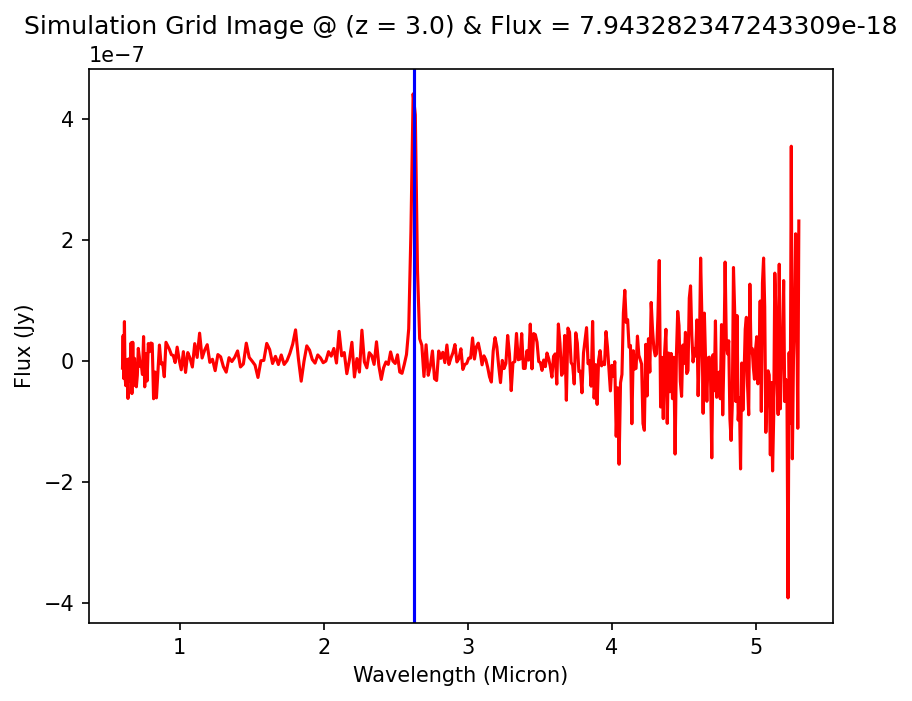

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.0000000000000654e-17
Amp: 2.348593196749282e-19, Mu: 26251.2, Sigma: 16.986436005760382


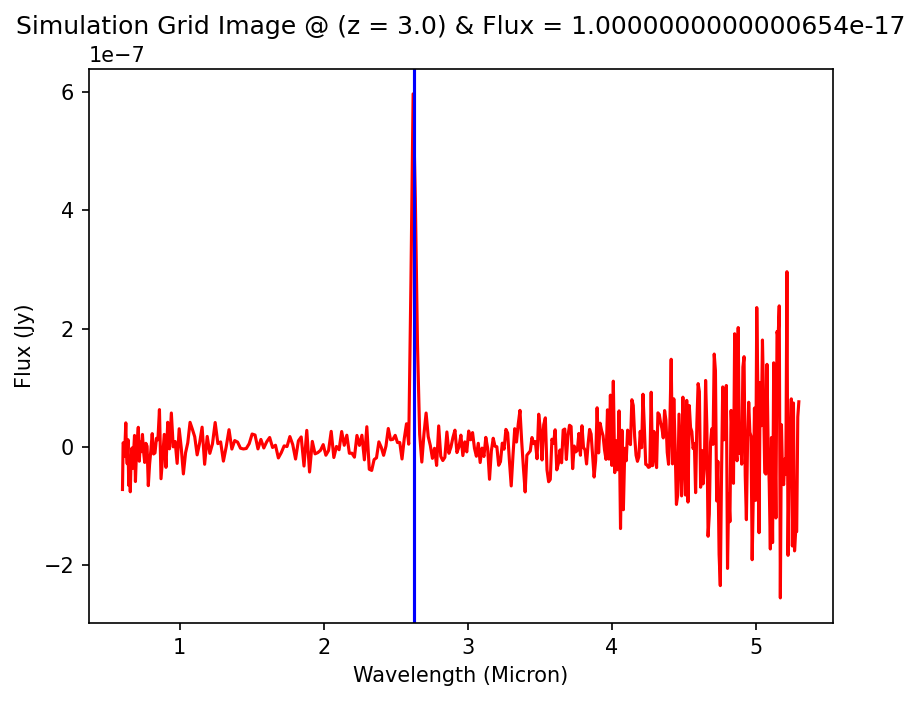

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.2589254117942538e-17
Amp: 2.9567036573545793e-19, Mu: 26251.2, Sigma: 16.986436005760382


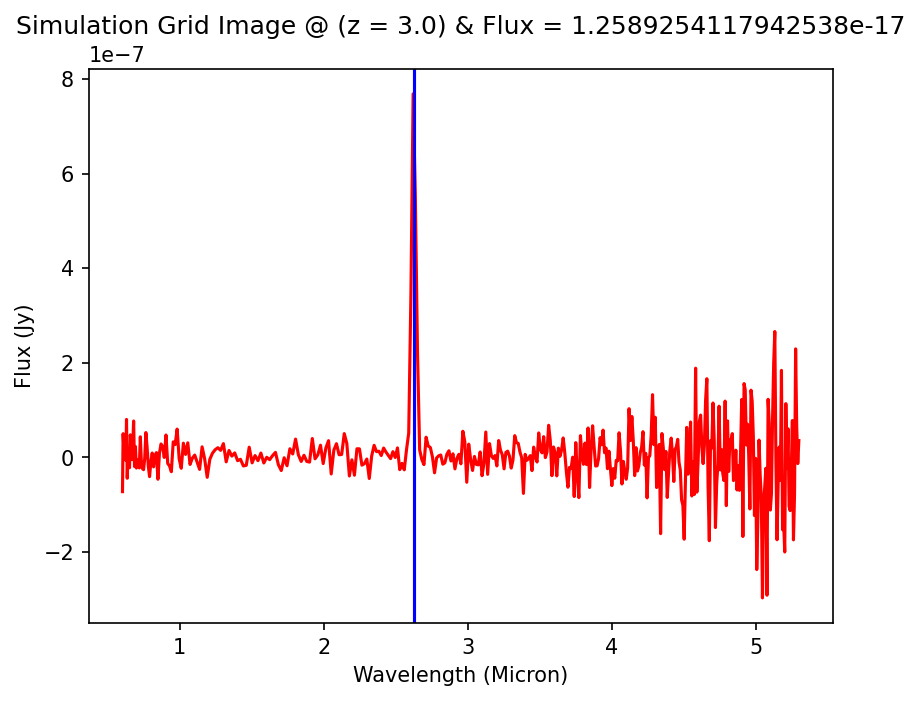

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.5848931924612275e-17
Amp: 3.7222693693884456e-19, Mu: 26251.2, Sigma: 16.986436005760382


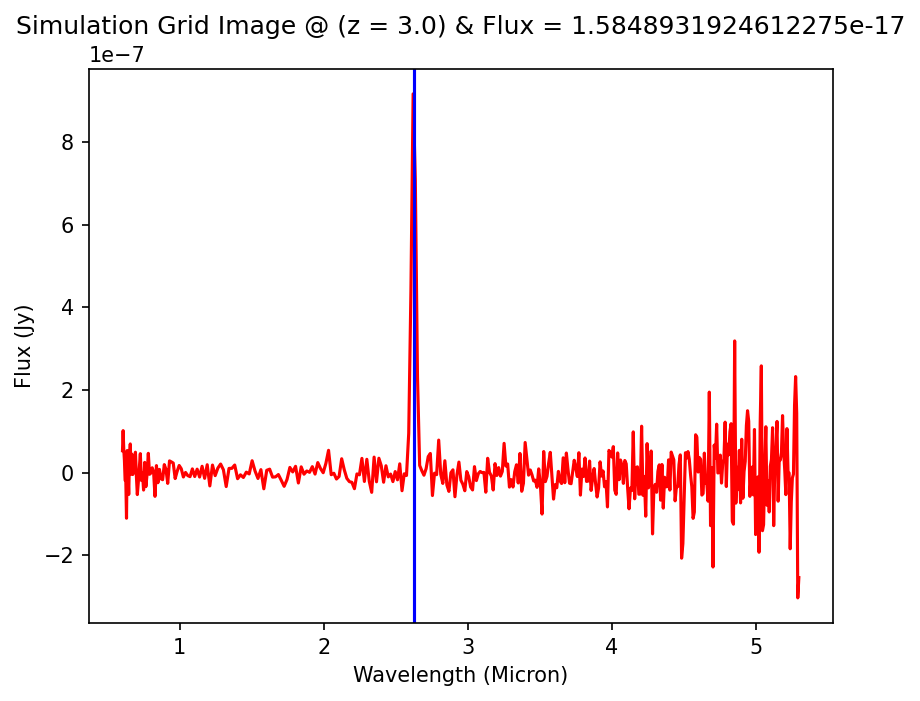

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.9952623149690297e-17
Amp: 4.68605949866618e-19, Mu: 26251.2, Sigma: 16.986436005760382


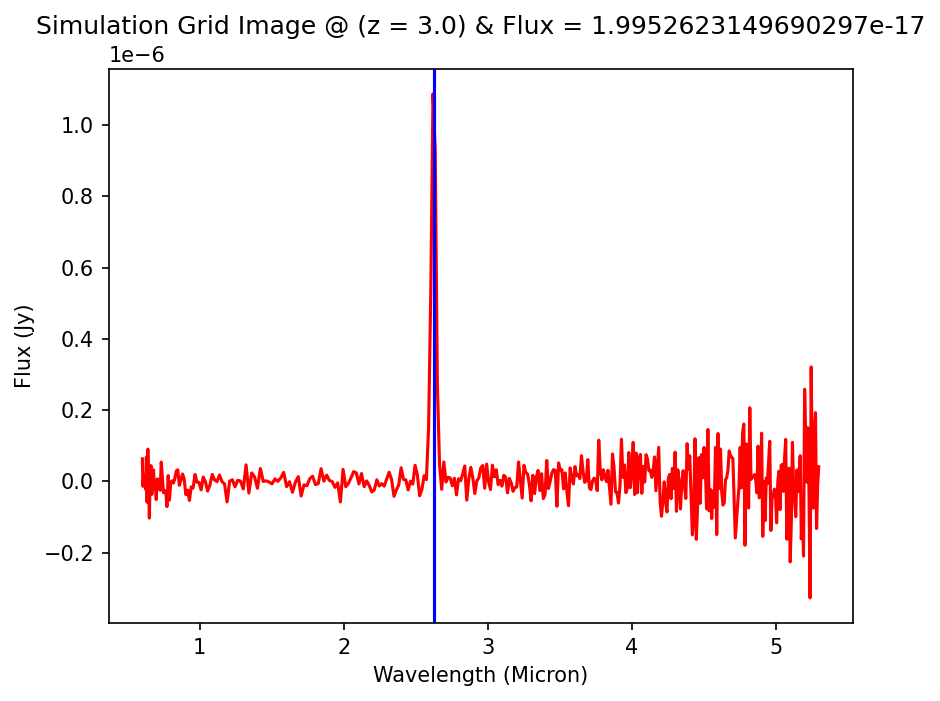

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 2.5118864315097773e-17
Amp: 5.899399384050309e-19, Mu: 26251.2, Sigma: 16.986436005760382


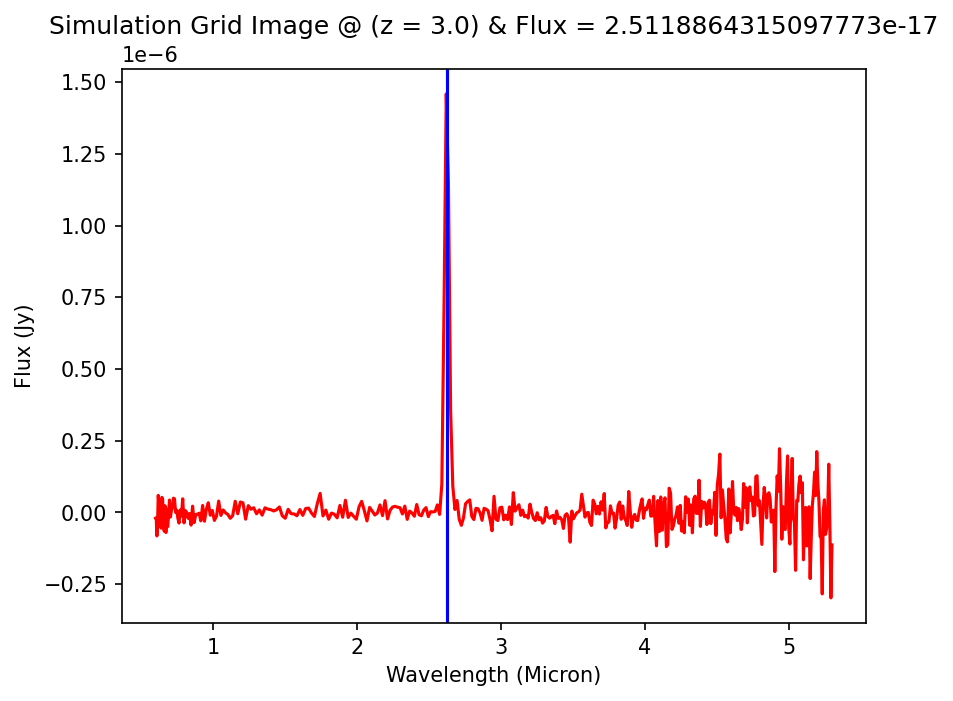

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 3.162277660168638e-17
Amp: 7.426903798903815e-19, Mu: 26251.2, Sigma: 16.986436005760382


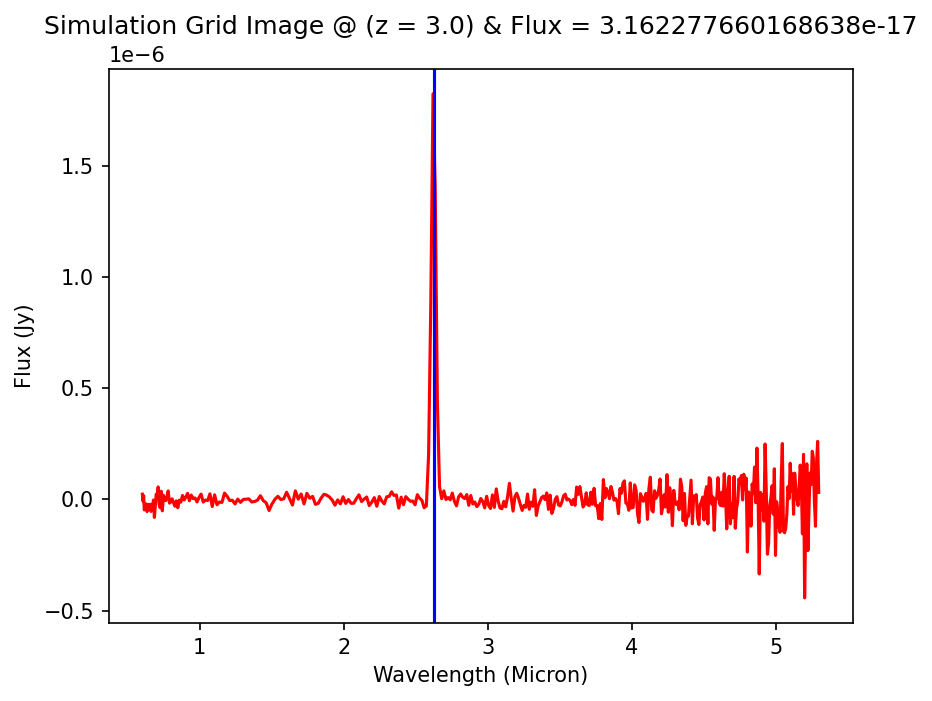

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 3.981071705535311e-17
Amp: 9.34991792339068e-19, Mu: 26251.2, Sigma: 16.986436005760382


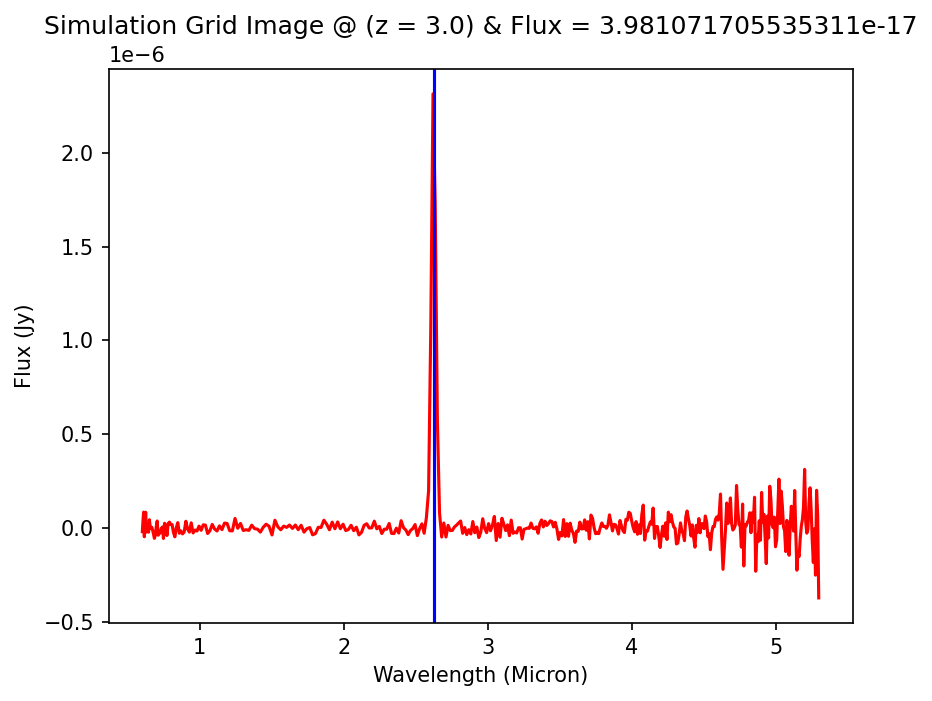

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 5.0118723362731656e-17
Amp: 1.1770849271946316e-18, Mu: 26251.2, Sigma: 16.986436005760382


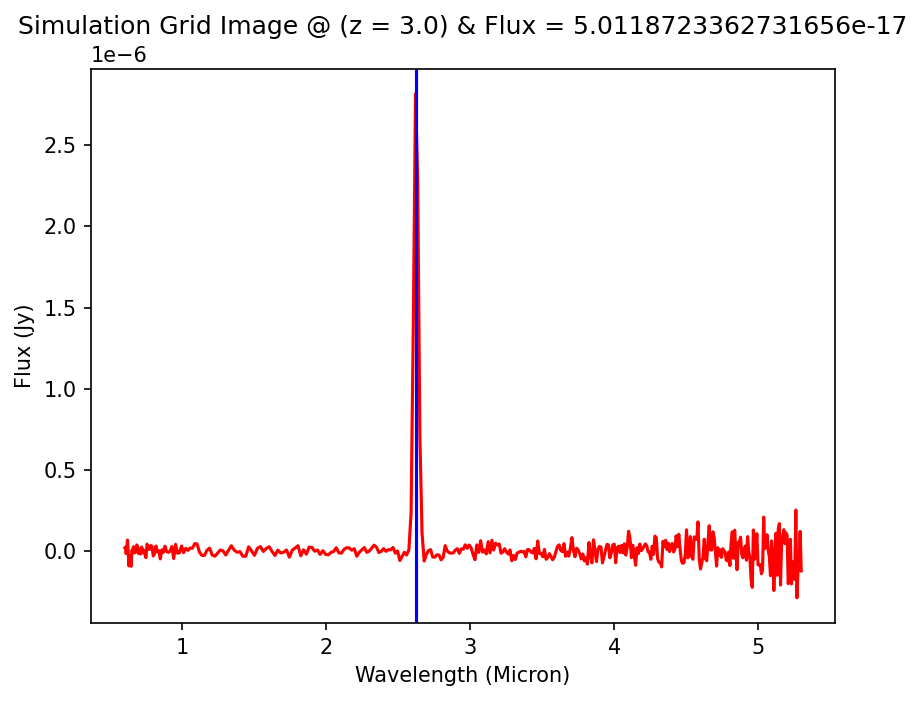

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 6.309573444802511e-17
Amp: 1.481862126685214e-18, Mu: 26251.2, Sigma: 16.986436005760382


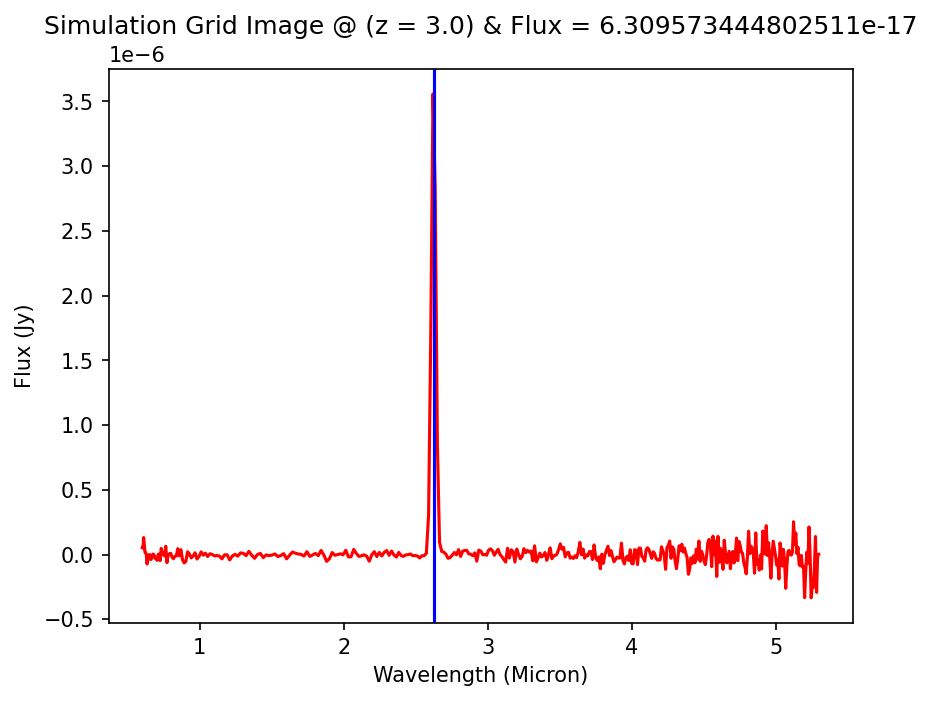

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 7.943282347243569e-17
Amp: 1.865553888059369e-18, Mu: 26251.2, Sigma: 16.986436005760382


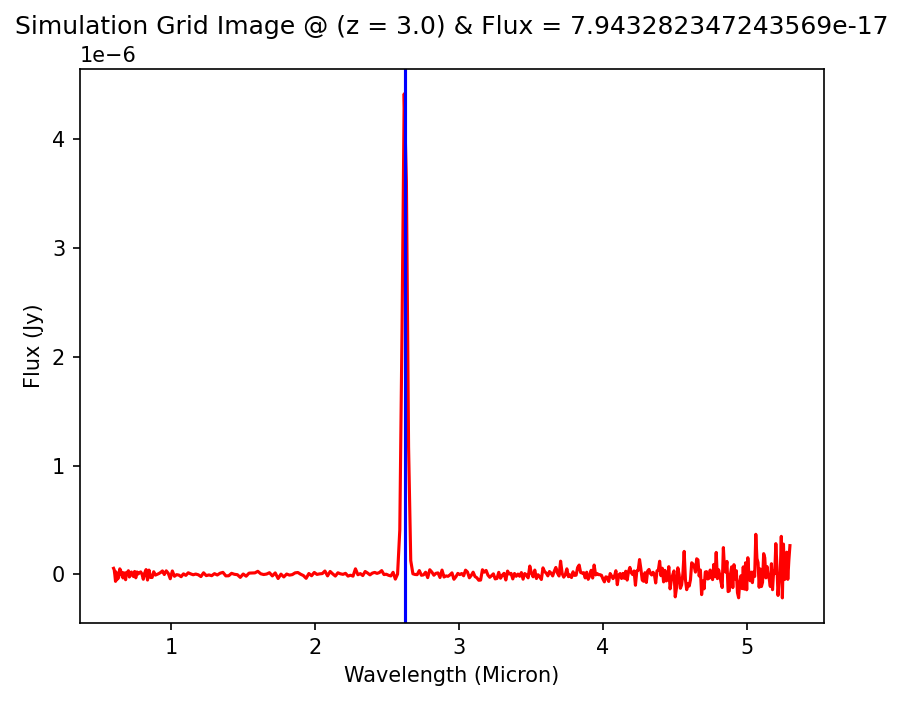

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.0, FWHM: 10, Integrated Flux: 1.0000000000000982e-16
Amp: 2.3485931967493588e-18, Mu: 26251.2, Sigma: 16.986436005760382


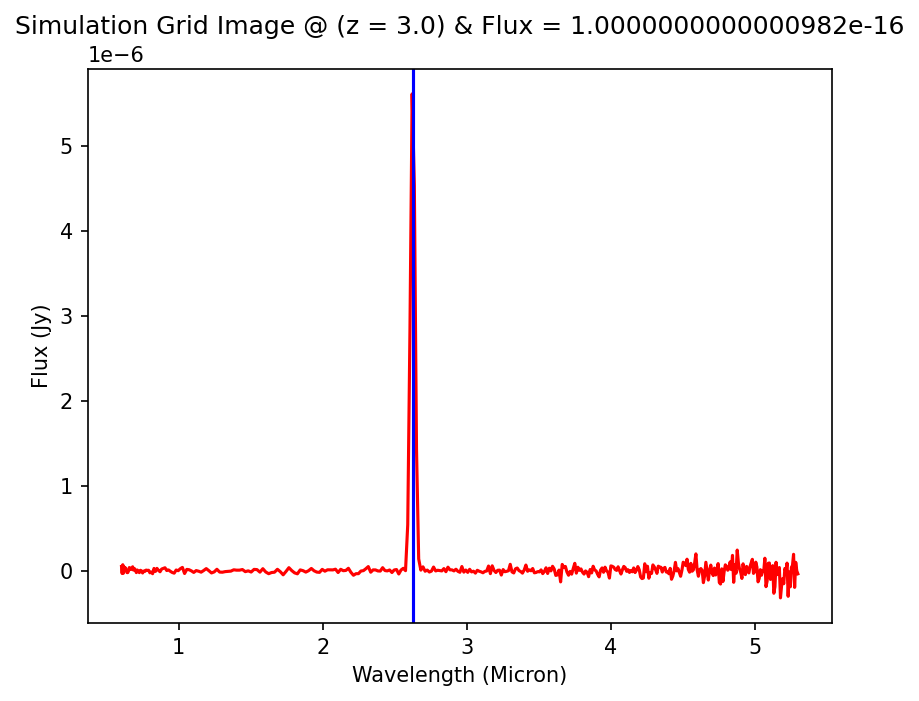

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1e-19
Amp: 2.0876383971103366e-21, Mu: 29532.600000000002, Sigma: 19.109740506480428


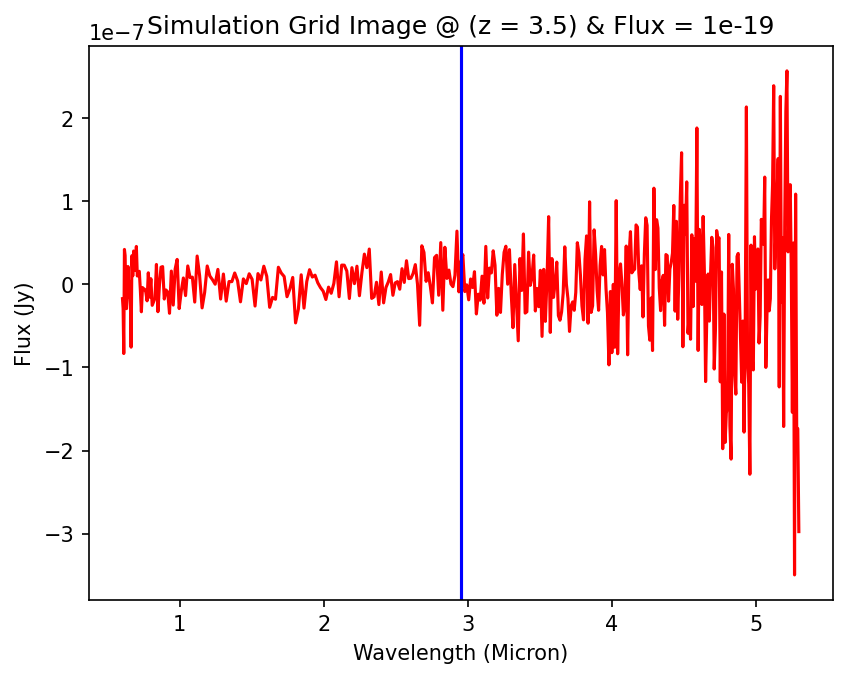

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.2589254117941713e-19
Amp: 2.6281810287594545e-21, Mu: 29532.600000000002, Sigma: 19.109740506480428


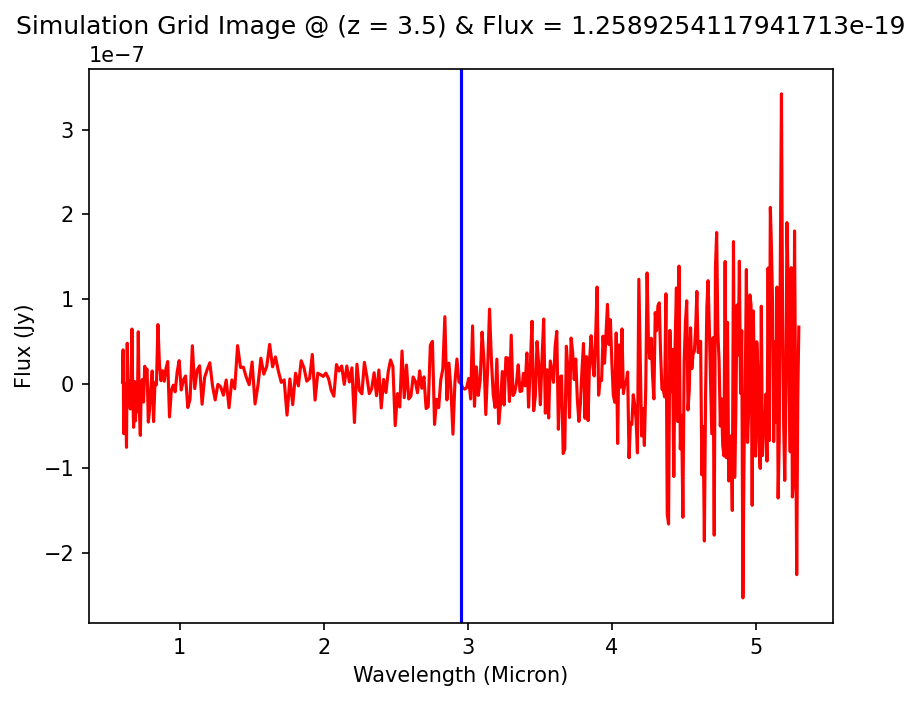

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.584893192461124e-19
Amp: 3.308683883900625e-21, Mu: 29532.600000000002, Sigma: 19.109740506480428


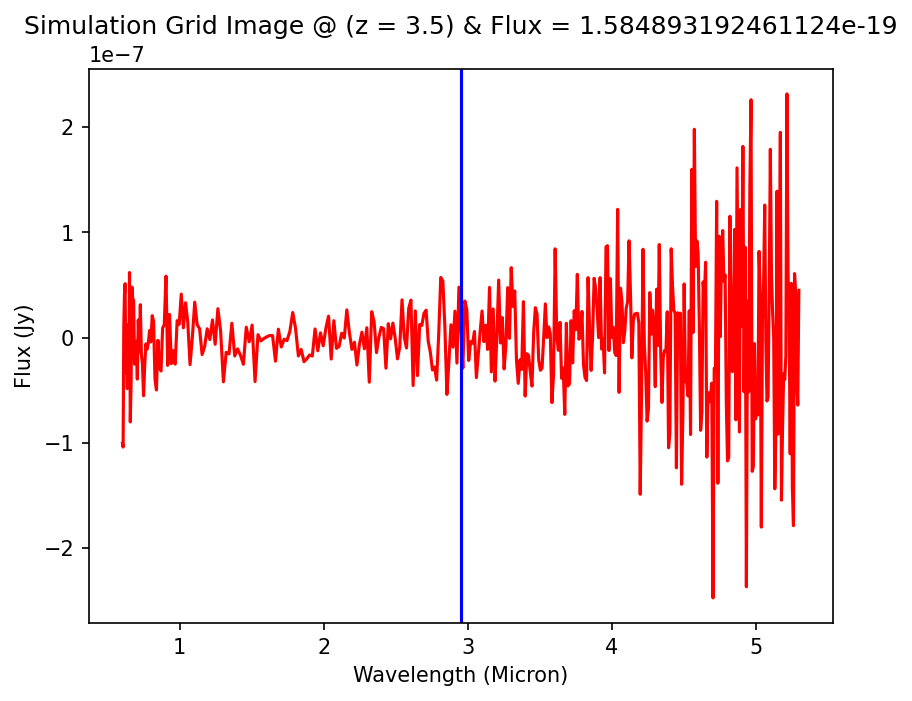

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.995262314968899e-19
Amp: 4.165386221036333e-21, Mu: 29532.600000000002, Sigma: 19.109740506480428


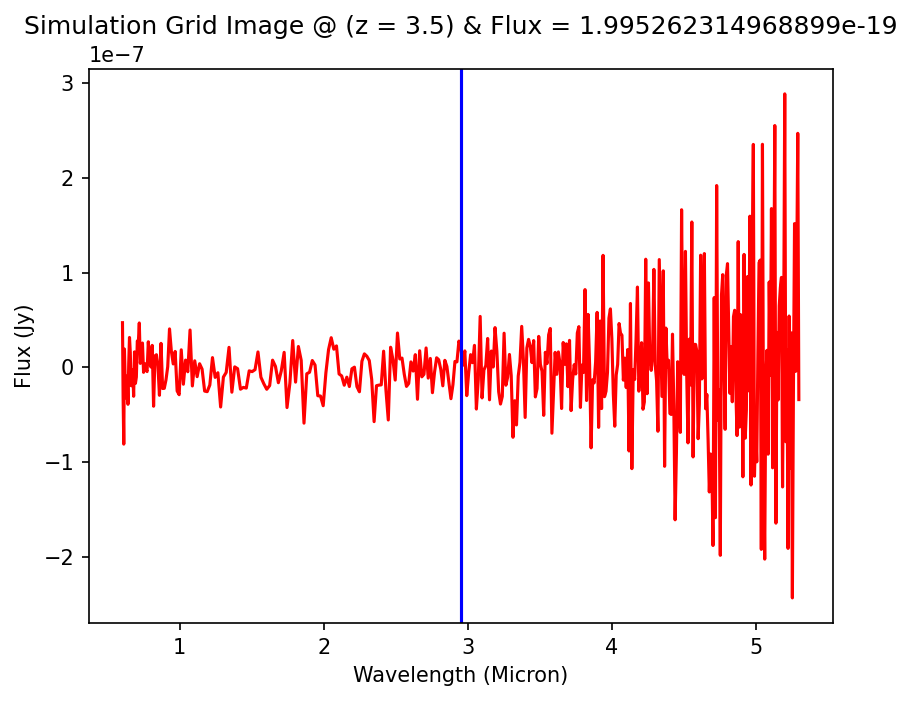

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 2.511886431509613e-19
Amp: 5.2439105635999326e-21, Mu: 29532.600000000002, Sigma: 19.109740506480428


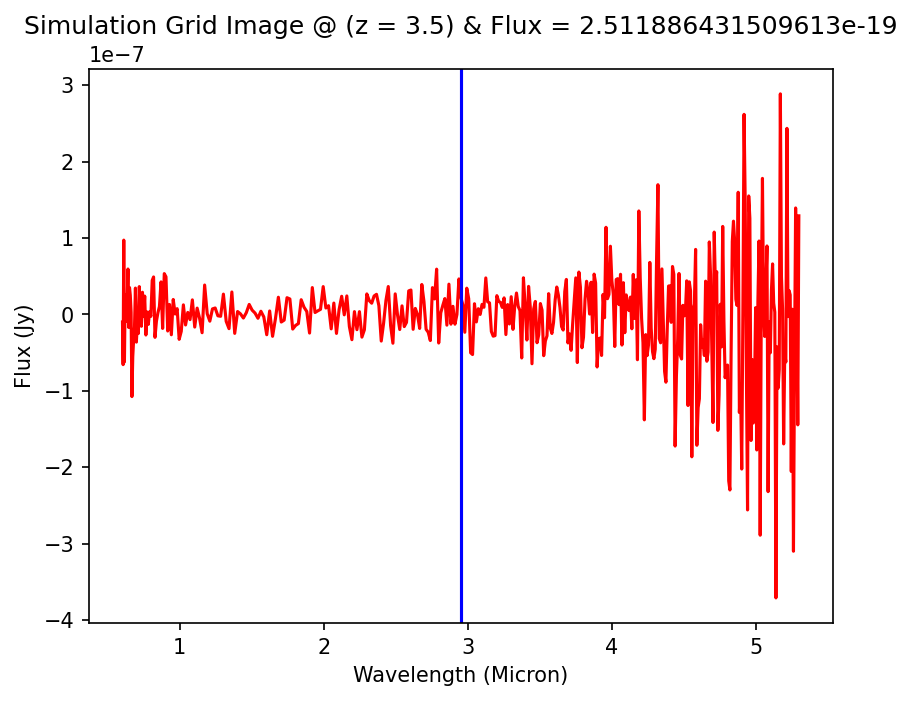

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 3.162277660168431e-19
Amp: 6.60169226569185e-21, Mu: 29532.600000000002, Sigma: 19.109740506480428


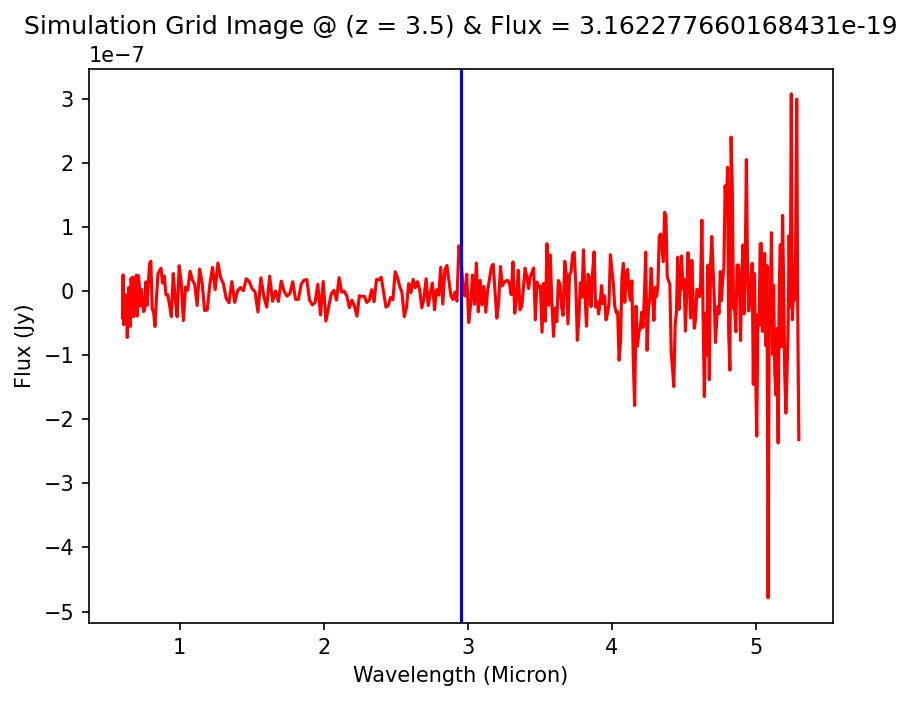

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 3.981071705535051e-19
Amp: 8.311038154124508e-21, Mu: 29532.600000000002, Sigma: 19.109740506480428


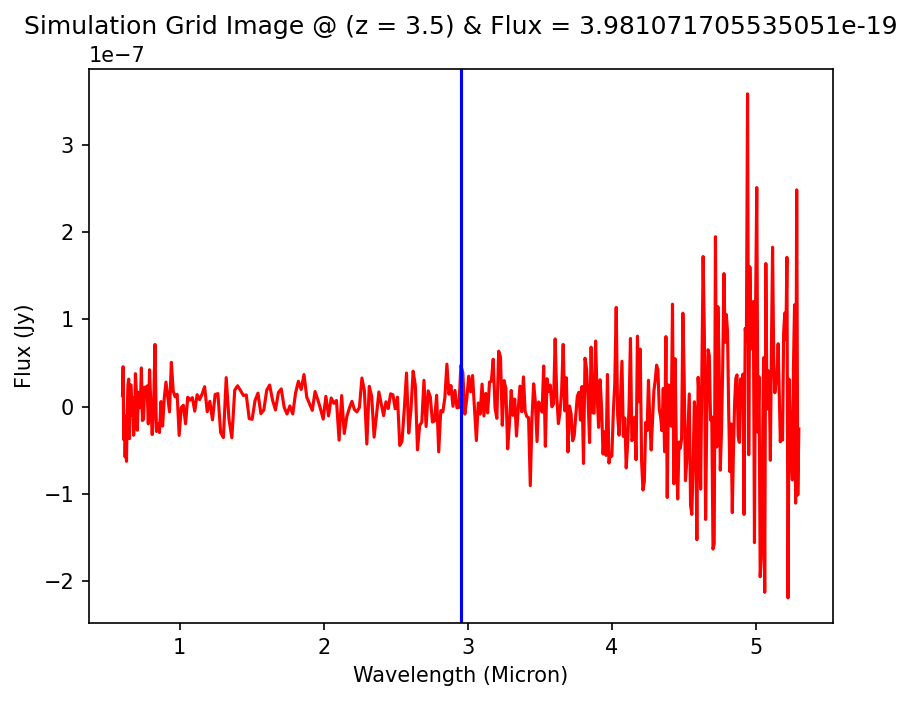

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 5.011872336272837e-19
Amp: 1.0462977130618265e-20, Mu: 29532.600000000002, Sigma: 19.109740506480428


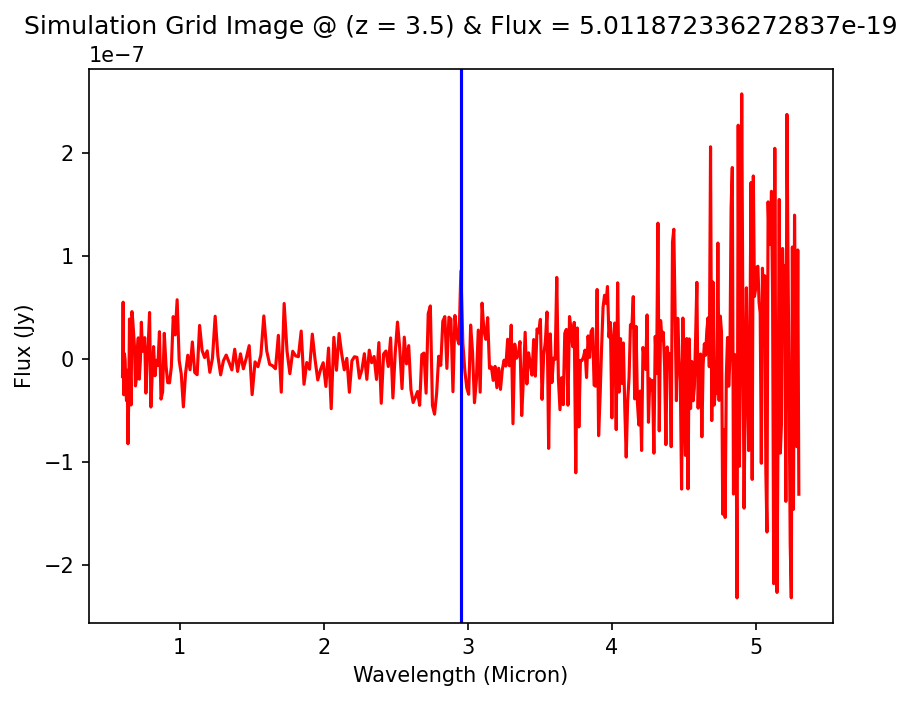

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 6.309573444802097e-19
Amp: 1.3172107792756596e-20, Mu: 29532.600000000002, Sigma: 19.109740506480428


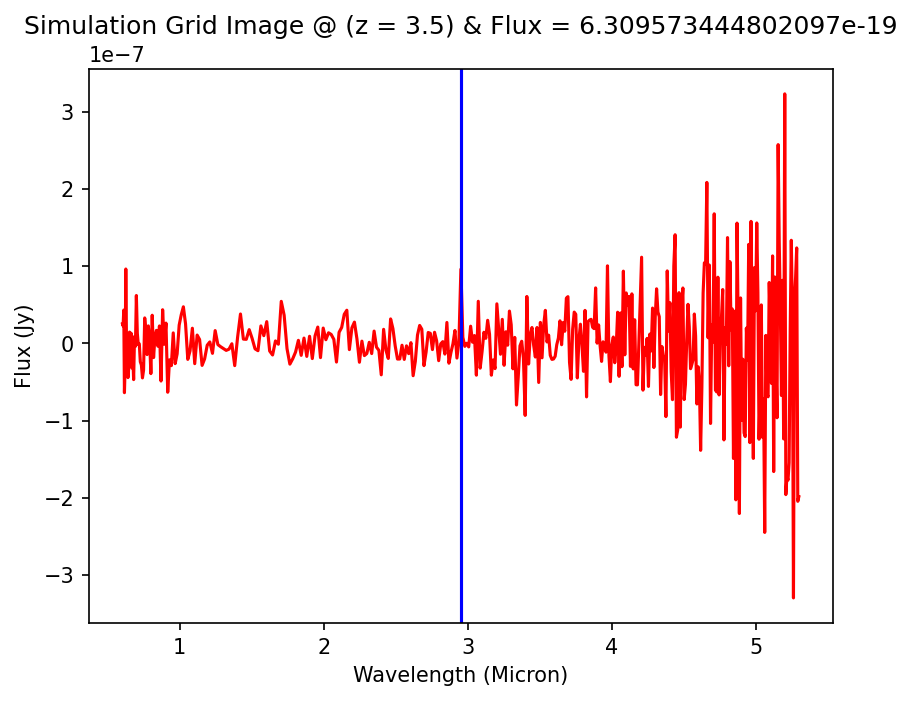

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 7.943282347243049e-19
Amp: 1.6582701227193313e-20, Mu: 29532.600000000002, Sigma: 19.109740506480428


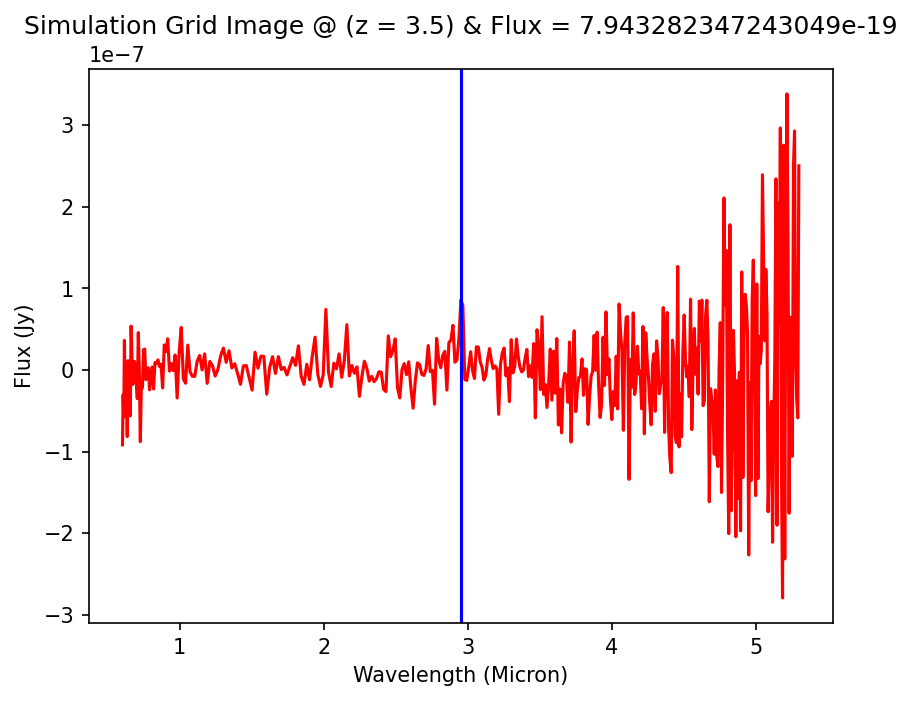

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.0000000000000328e-18
Amp: 2.0876383971104053e-20, Mu: 29532.600000000002, Sigma: 19.109740506480428


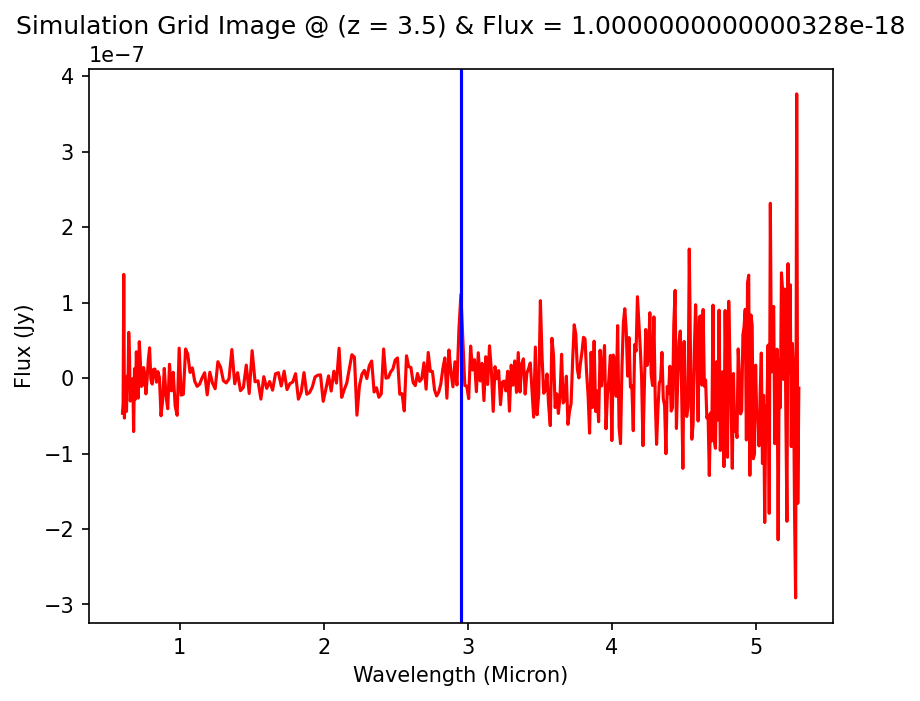

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.2589254117942125e-18
Amp: 2.6281810287595405e-20, Mu: 29532.600000000002, Sigma: 19.109740506480428


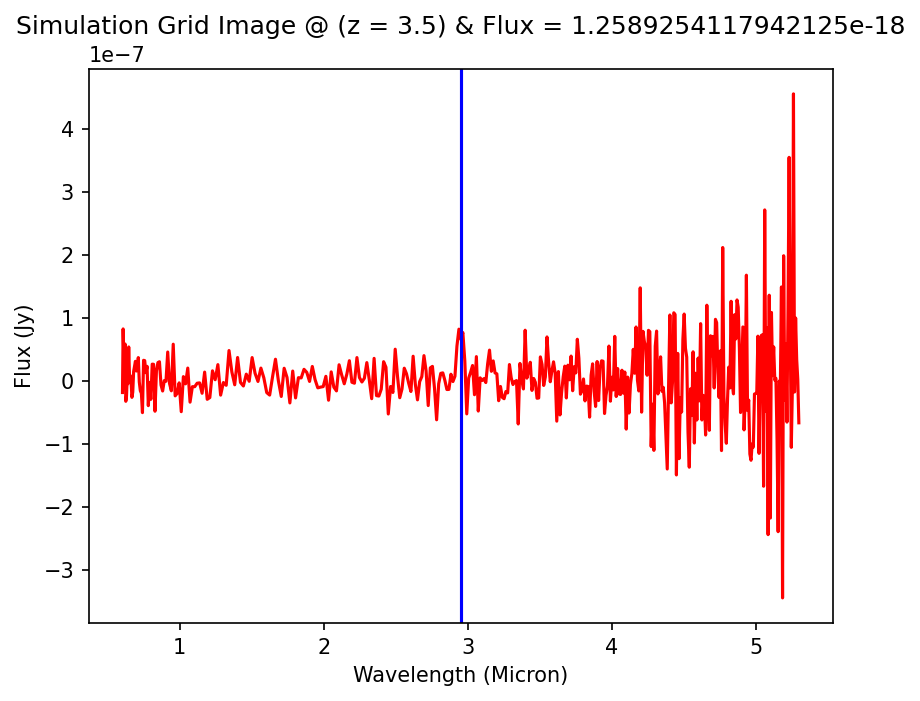

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.5848931924611758e-18
Amp: 3.3086838839007334e-20, Mu: 29532.600000000002, Sigma: 19.109740506480428


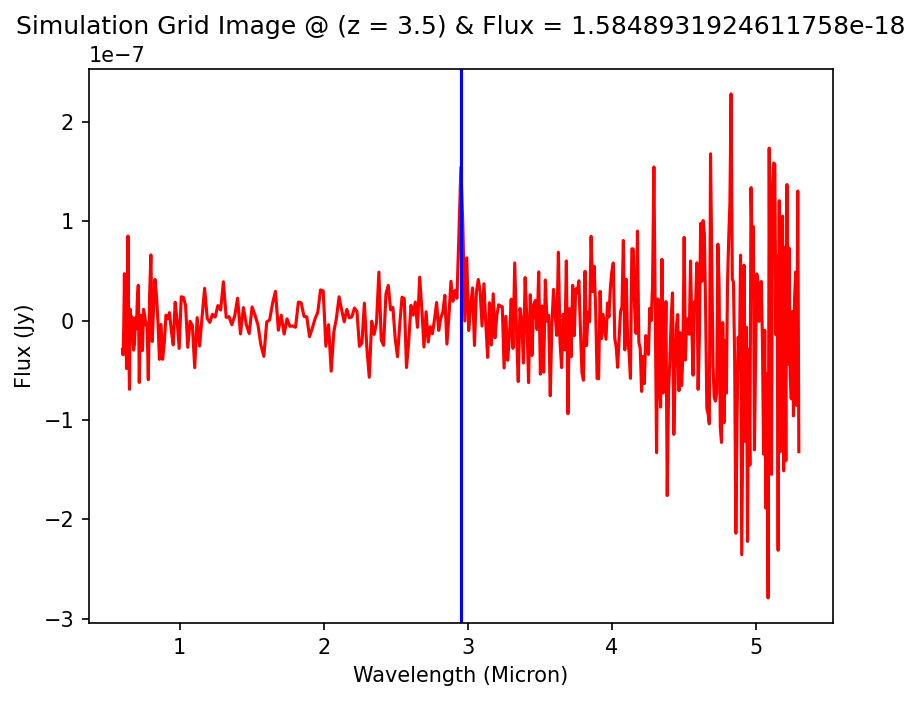

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.9952623149689645e-18
Amp: 4.165386221036469e-20, Mu: 29532.600000000002, Sigma: 19.109740506480428


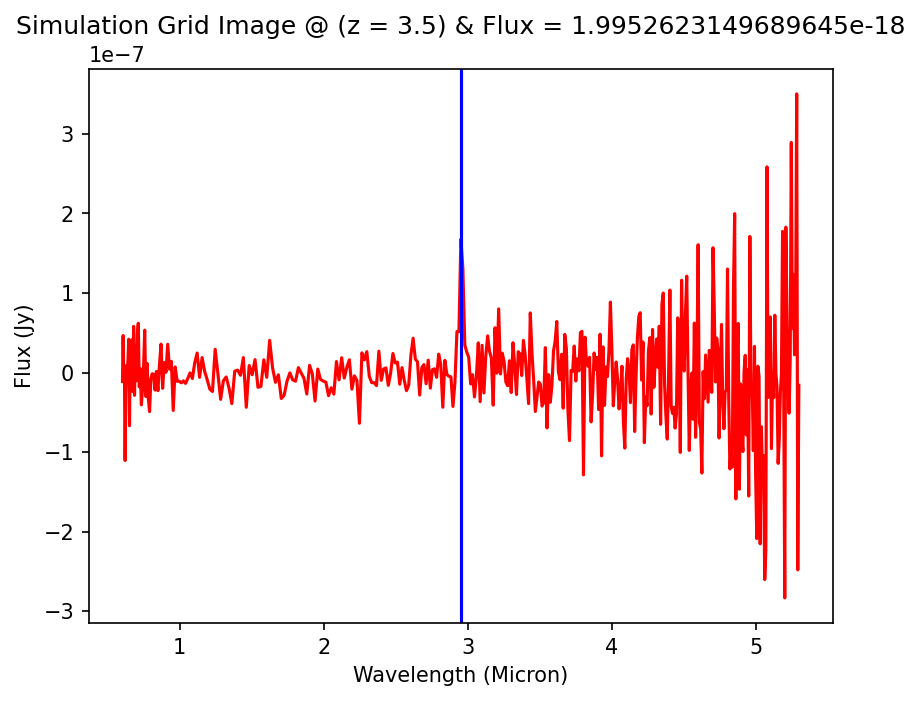

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 2.511886431509695e-18
Amp: 5.2439105636001037e-20, Mu: 29532.600000000002, Sigma: 19.109740506480428


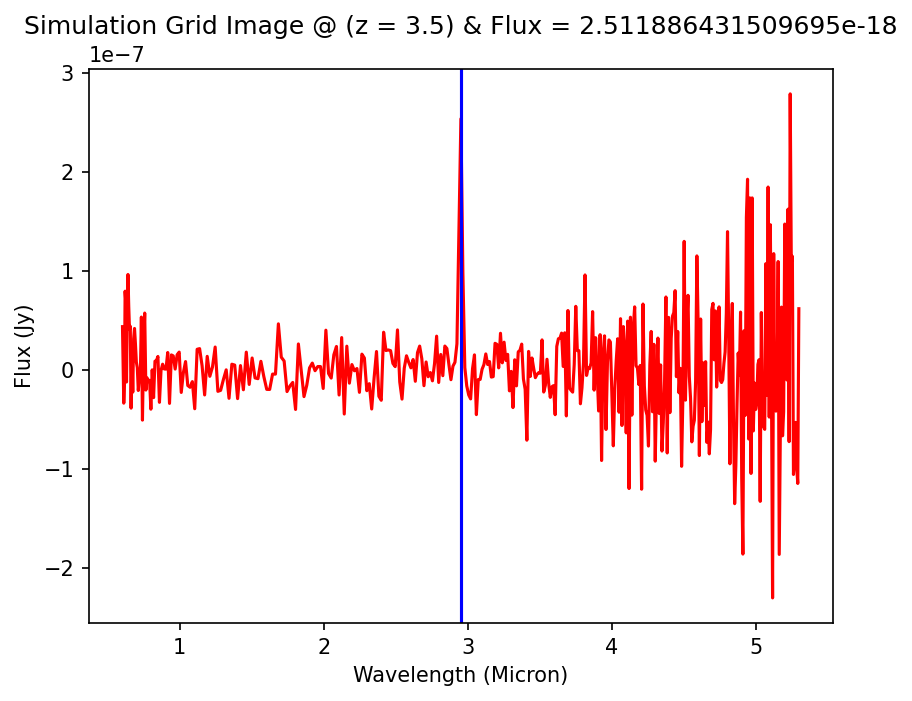

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 3.1622776601685347e-18
Amp: 6.601692265692066e-20, Mu: 29532.600000000002, Sigma: 19.109740506480428


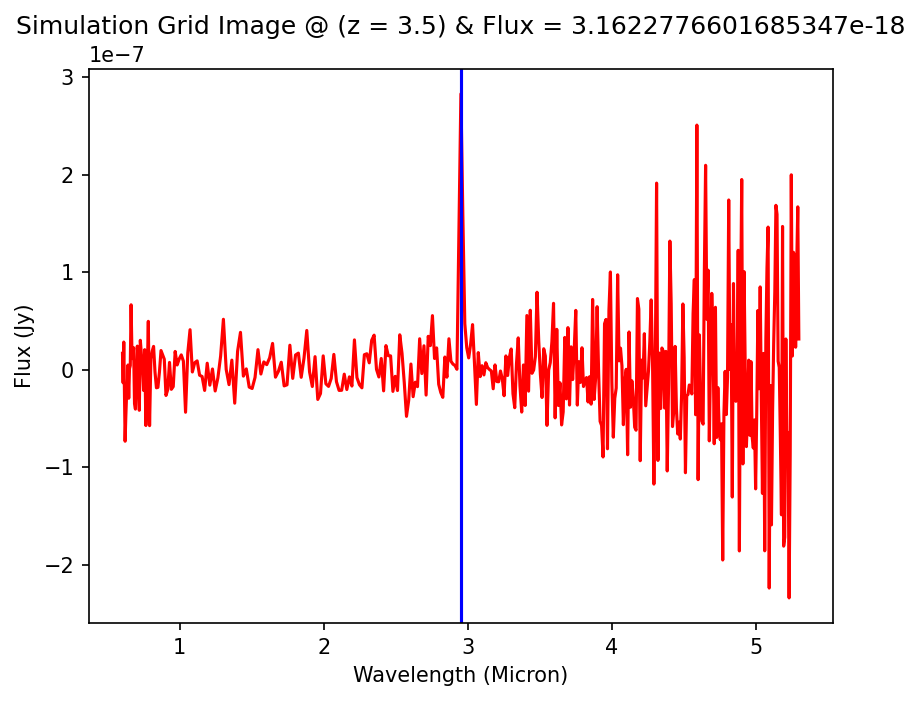

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 3.981071705535181e-18
Amp: 8.31103815412478e-20, Mu: 29532.600000000002, Sigma: 19.109740506480428


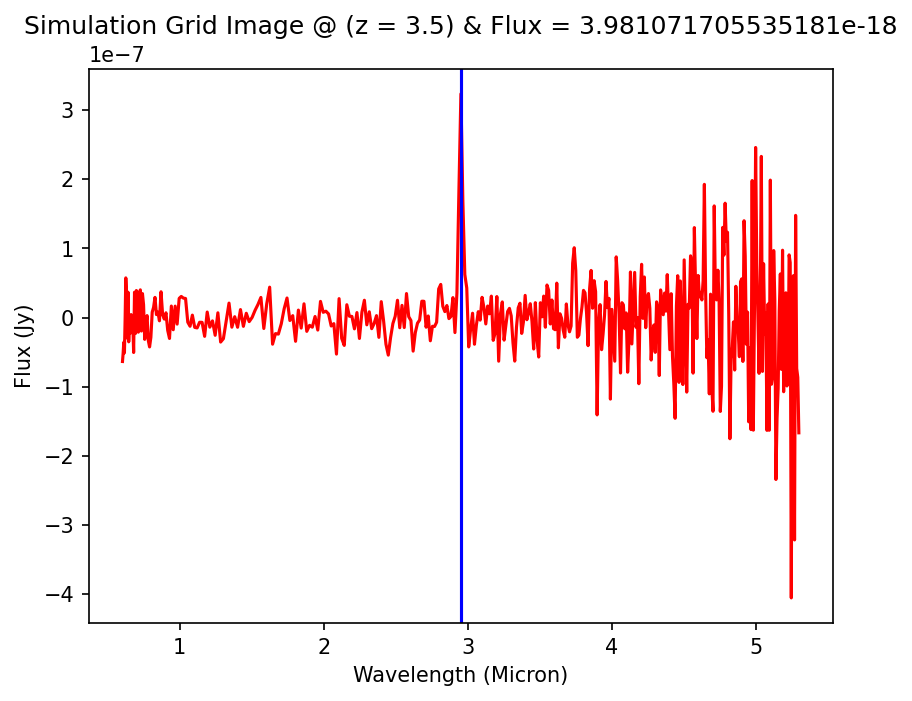

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 5.011872336273001e-18
Amp: 1.0462977130618607e-19, Mu: 29532.600000000002, Sigma: 19.109740506480428


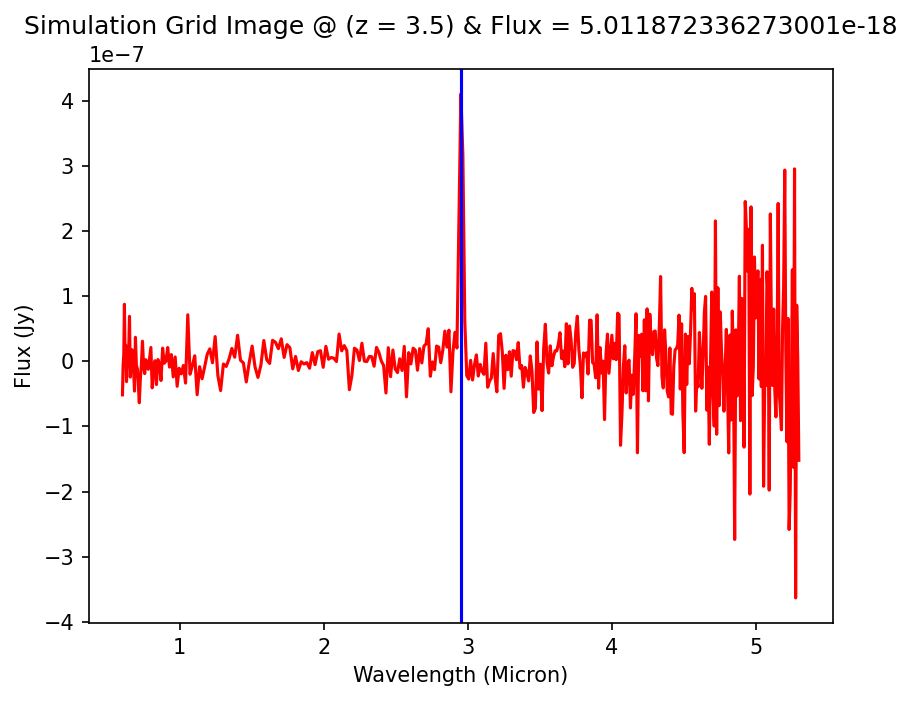

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 6.3095734448023044e-18
Amp: 1.3172107792757028e-19, Mu: 29532.600000000002, Sigma: 19.109740506480428


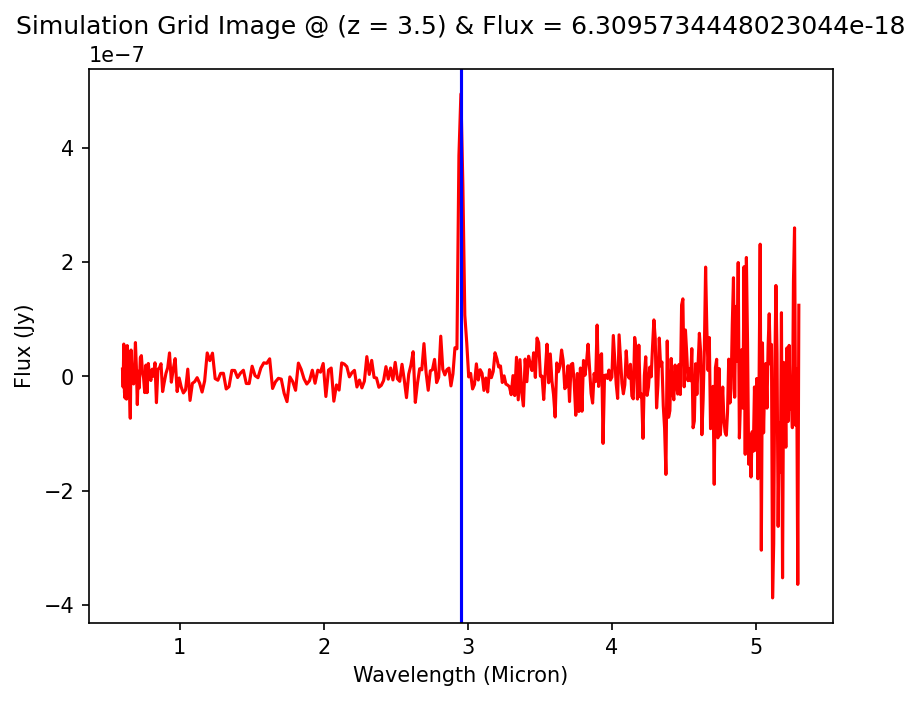

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 7.943282347243309e-18
Amp: 1.6582701227193853e-19, Mu: 29532.600000000002, Sigma: 19.109740506480428


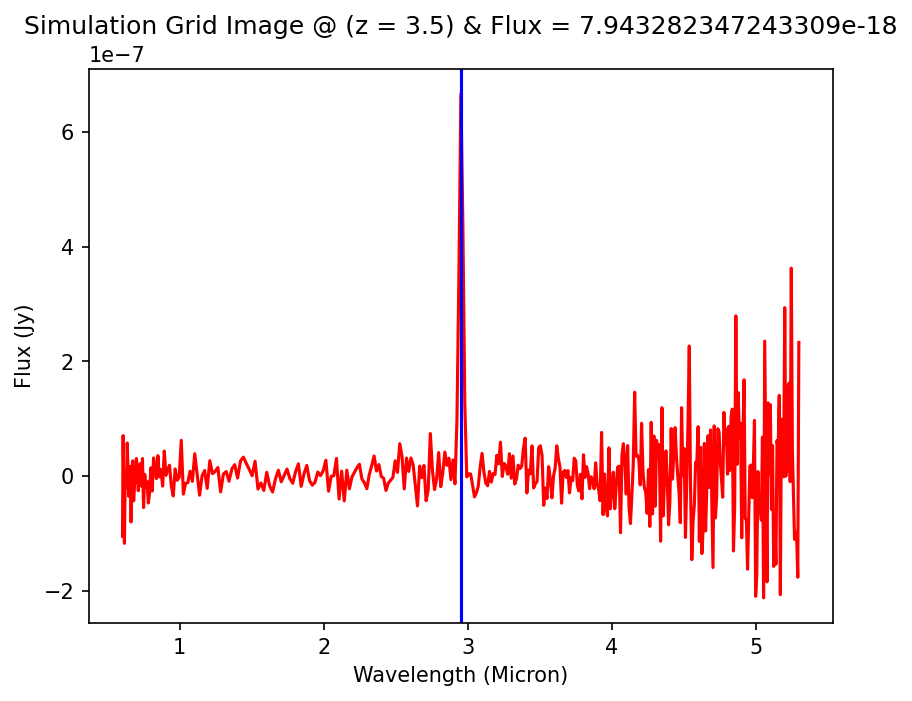

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.0000000000000654e-17
Amp: 2.0876383971104734e-19, Mu: 29532.600000000002, Sigma: 19.109740506480428


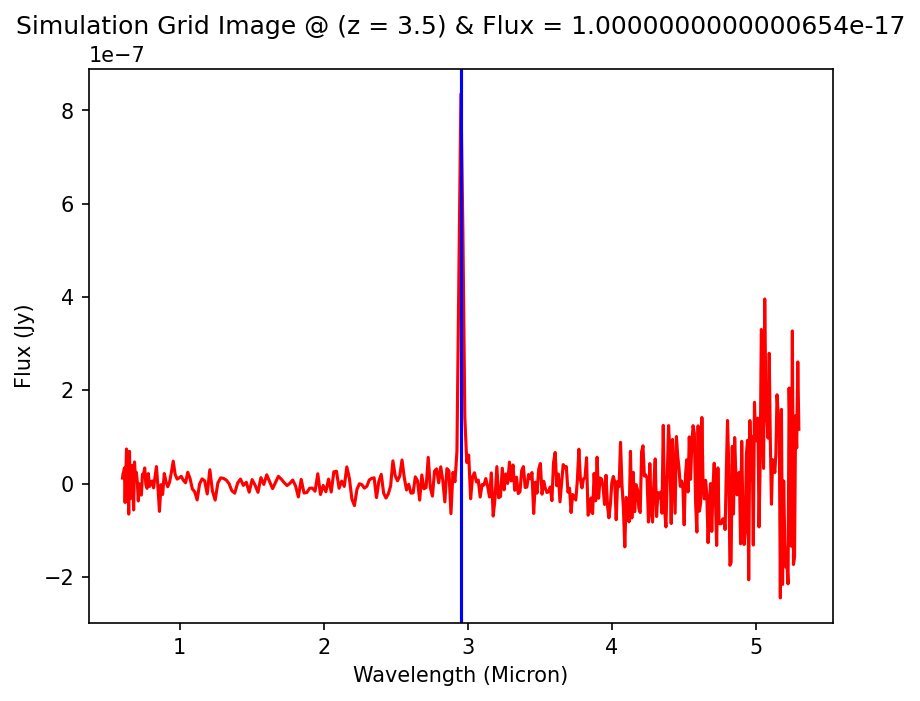

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.2589254117942538e-17
Amp: 2.6281810287596265e-19, Mu: 29532.600000000002, Sigma: 19.109740506480428


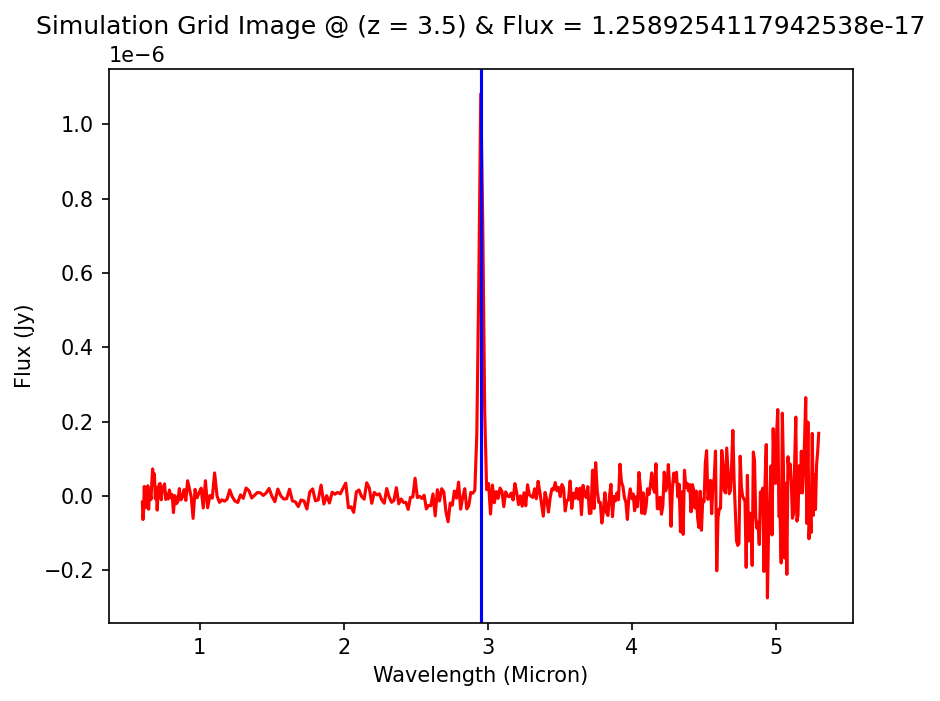

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.5848931924612275e-17
Amp: 3.3086838839008417e-19, Mu: 29532.600000000002, Sigma: 19.109740506480428


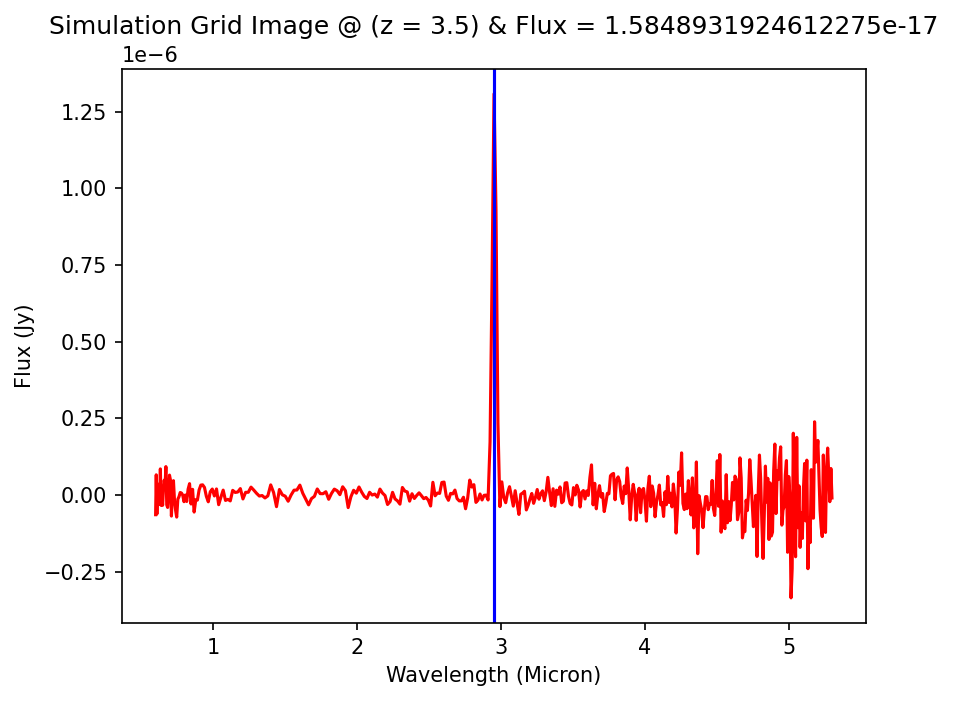

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.9952623149690297e-17
Amp: 4.165386221036605e-19, Mu: 29532.600000000002, Sigma: 19.109740506480428


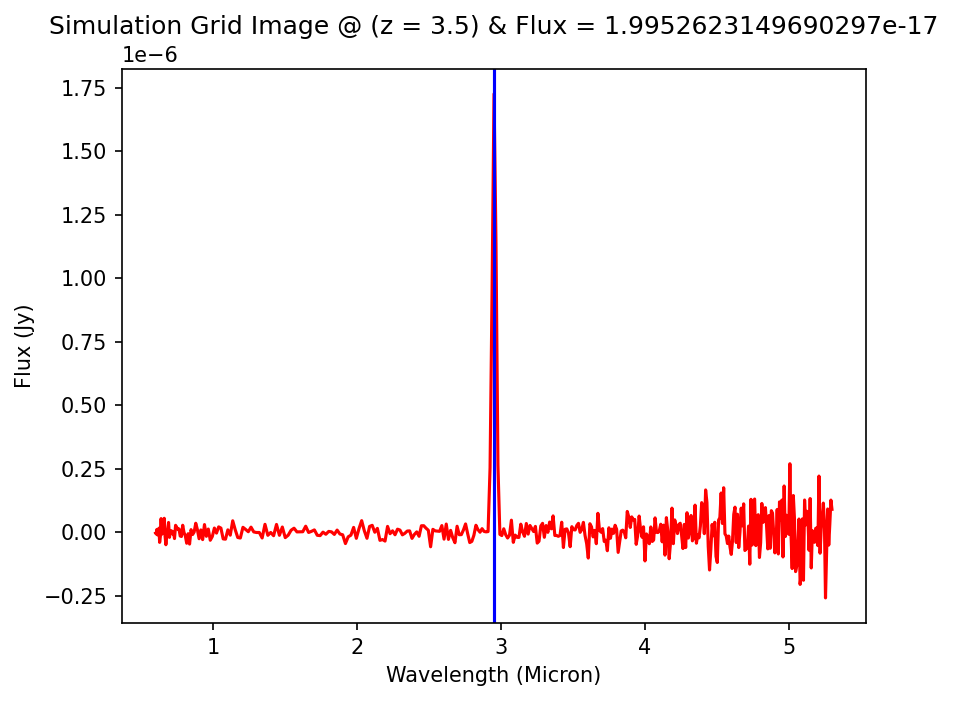

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 2.5118864315097773e-17
Amp: 5.243910563600275e-19, Mu: 29532.600000000002, Sigma: 19.109740506480428


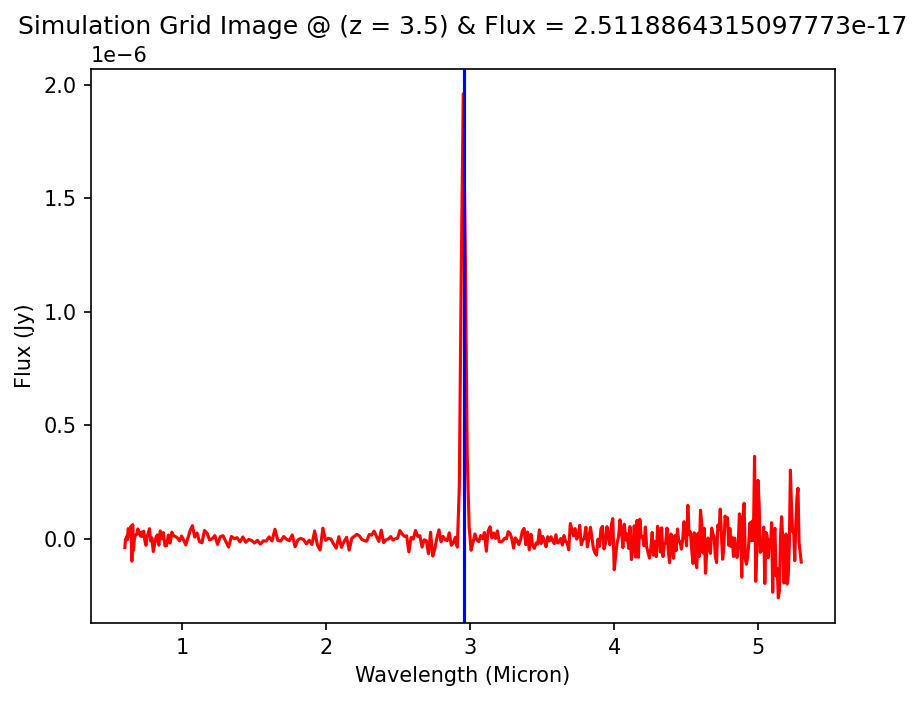

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 3.162277660168638e-17
Amp: 6.601692265692281e-19, Mu: 29532.600000000002, Sigma: 19.109740506480428


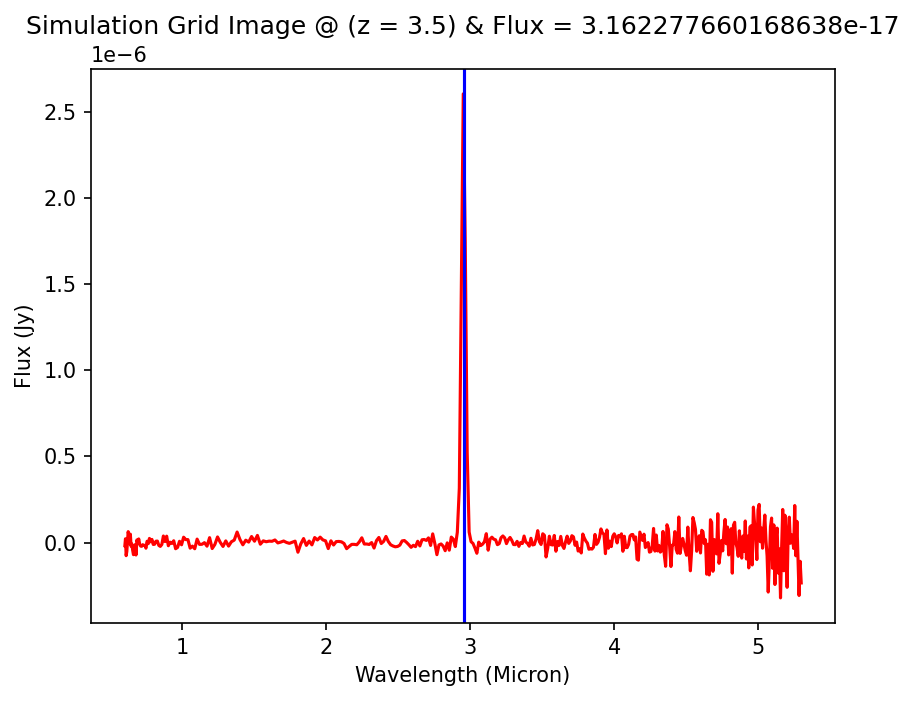

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 3.981071705535311e-17
Amp: 8.311038154125051e-19, Mu: 29532.600000000002, Sigma: 19.109740506480428


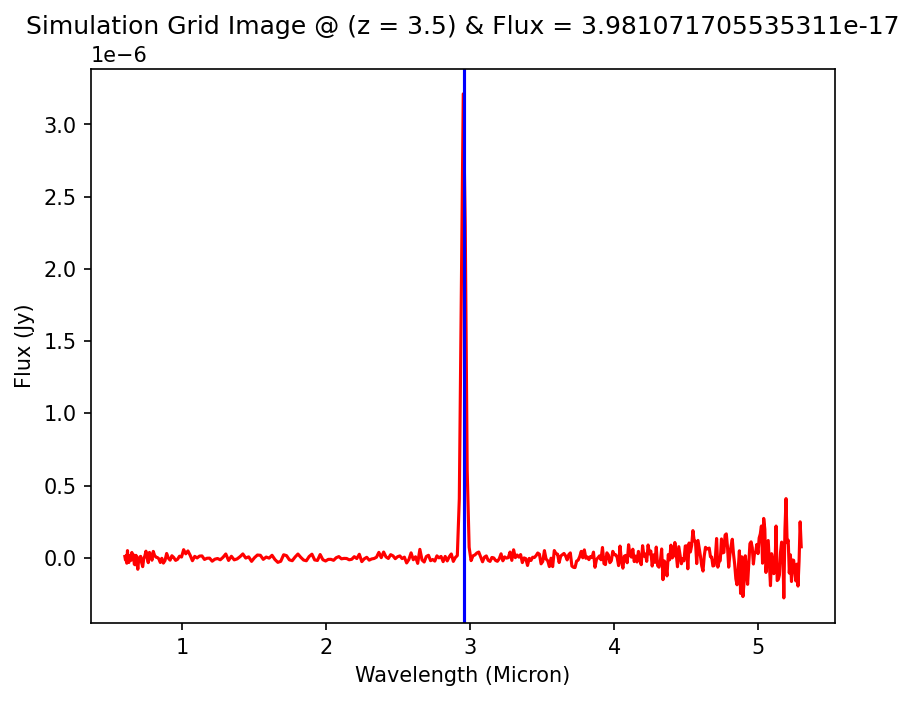

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 5.0118723362731656e-17
Amp: 1.046297713061895e-18, Mu: 29532.600000000002, Sigma: 19.109740506480428


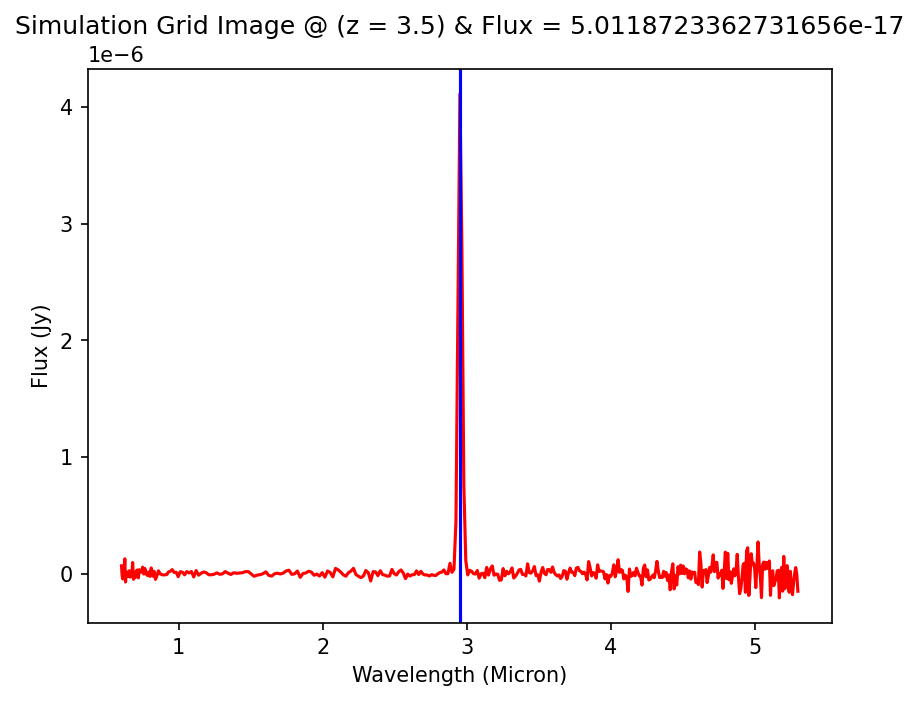

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 6.309573444802511e-17
Amp: 1.317210779275746e-18, Mu: 29532.600000000002, Sigma: 19.109740506480428


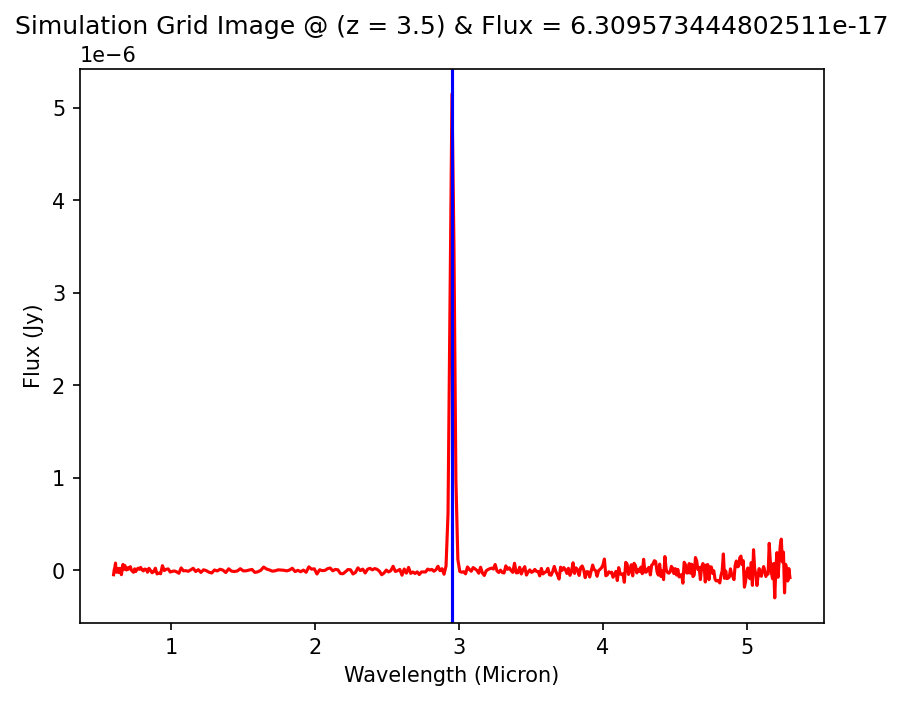

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 7.943282347243569e-17
Amp: 1.6582701227194397e-18, Mu: 29532.600000000002, Sigma: 19.109740506480428


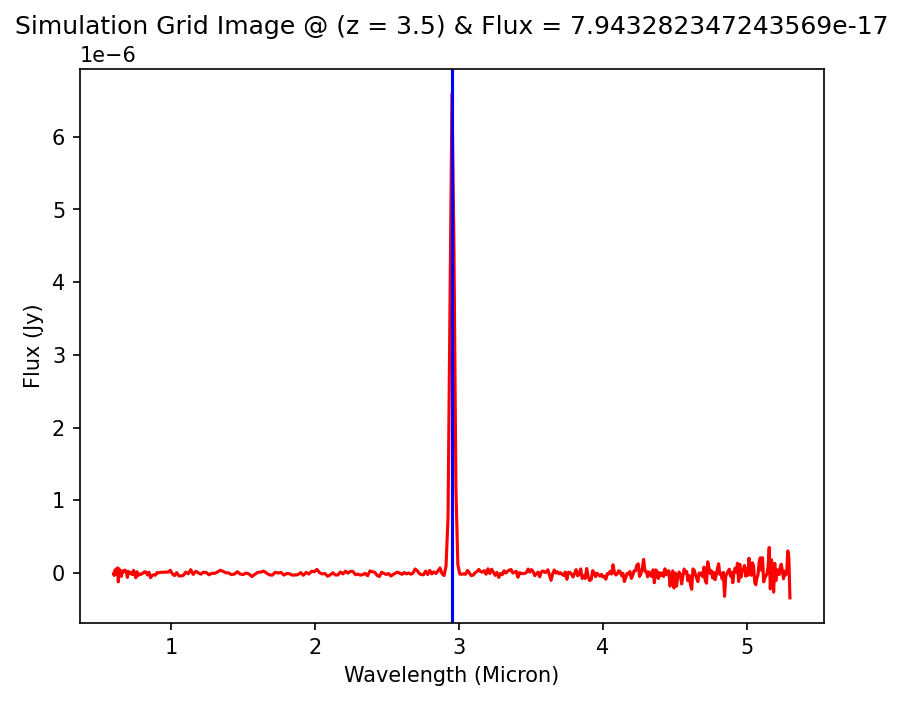

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 3.5, FWHM: 10, Integrated Flux: 1.0000000000000982e-16
Amp: 2.087638397110542e-18, Mu: 29532.600000000002, Sigma: 19.109740506480428


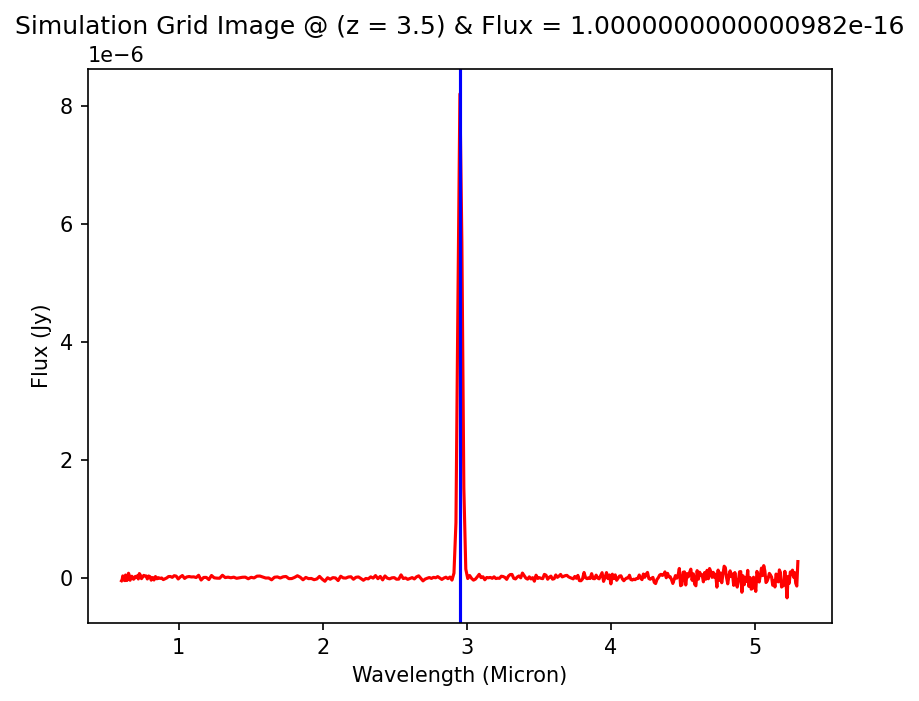

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1e-19
Amp: 1.8788745573993027e-21, Mu: 32814.0, Sigma: 21.233045007200477


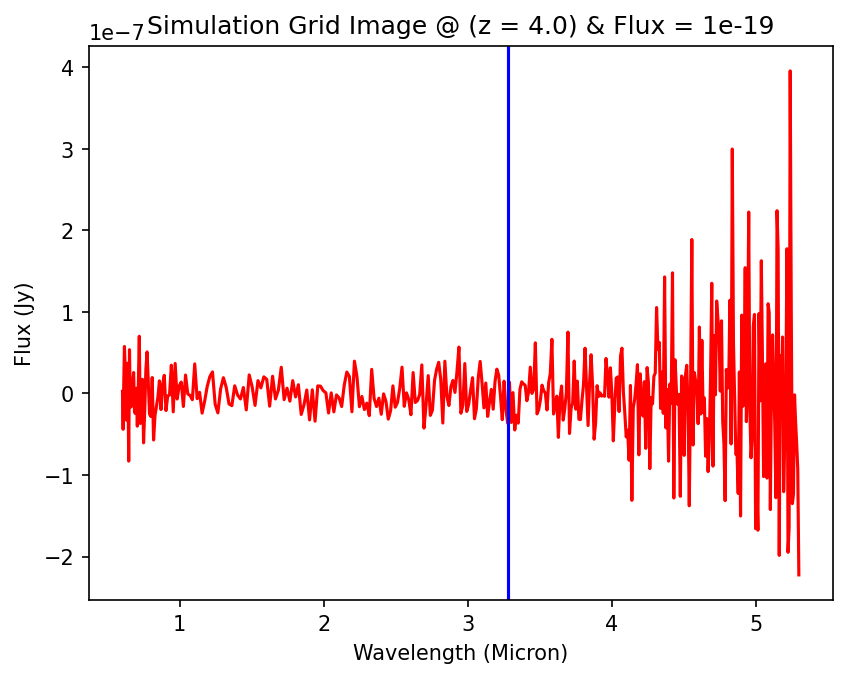

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.2589254117941713e-19
Amp: 2.3653629258835085e-21, Mu: 32814.0, Sigma: 21.233045007200477


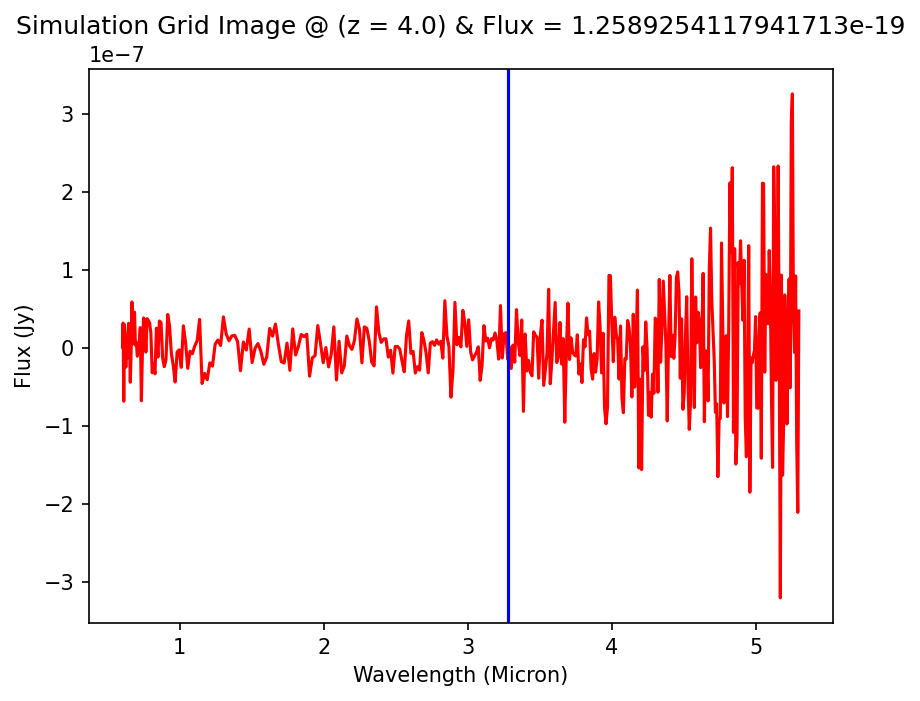

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.584893192461124e-19
Amp: 2.977815495510562e-21, Mu: 32814.0, Sigma: 21.233045007200477


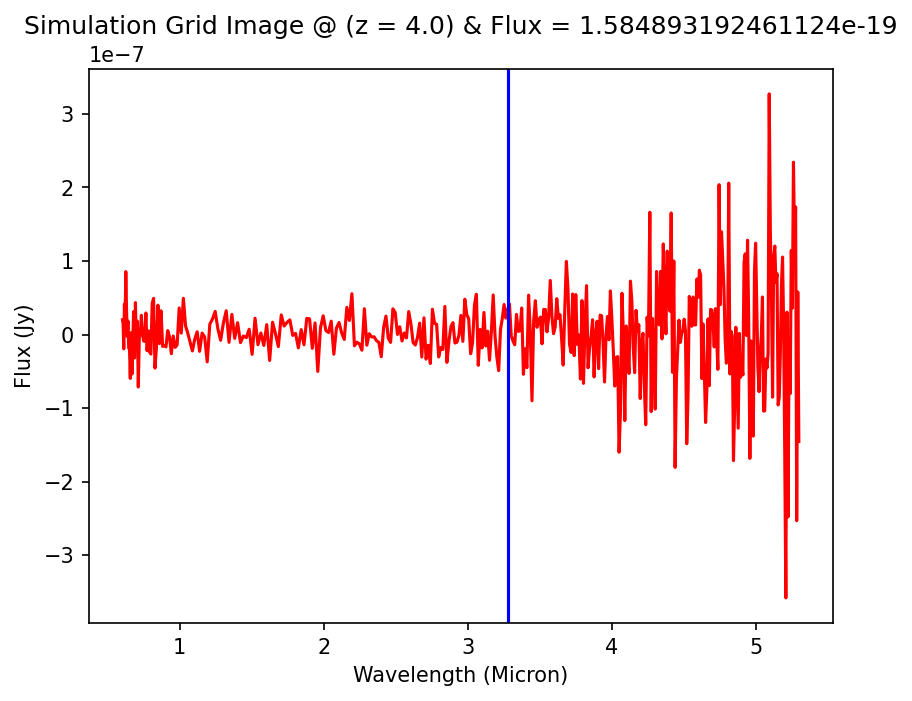

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.995262314968899e-19
Amp: 3.7488475989326985e-21, Mu: 32814.0, Sigma: 21.233045007200477


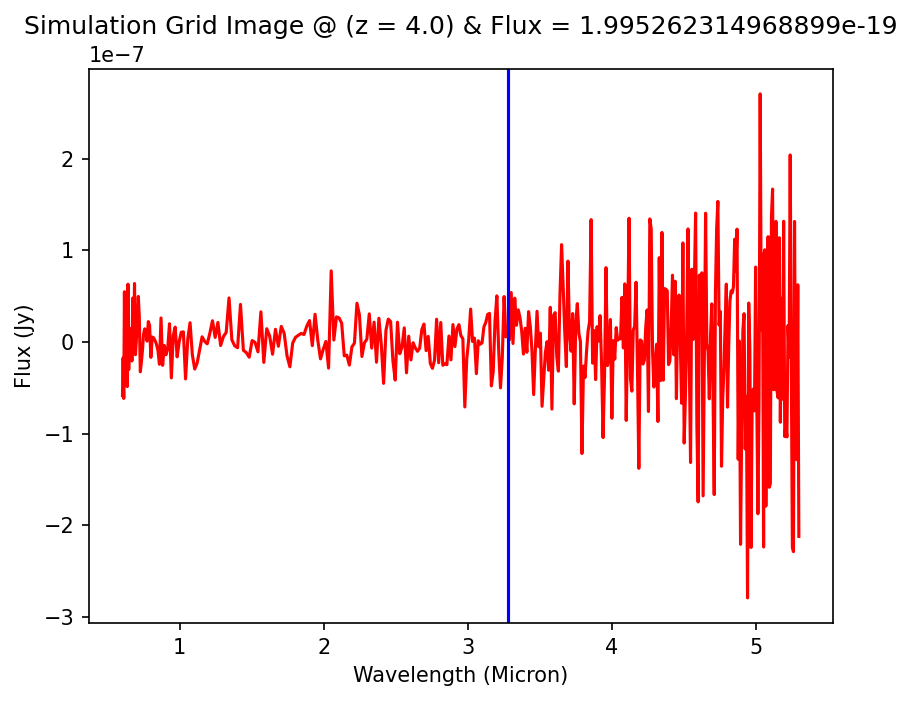

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 2.511886431509613e-19
Amp: 4.719519507239938e-21, Mu: 32814.0, Sigma: 21.233045007200477


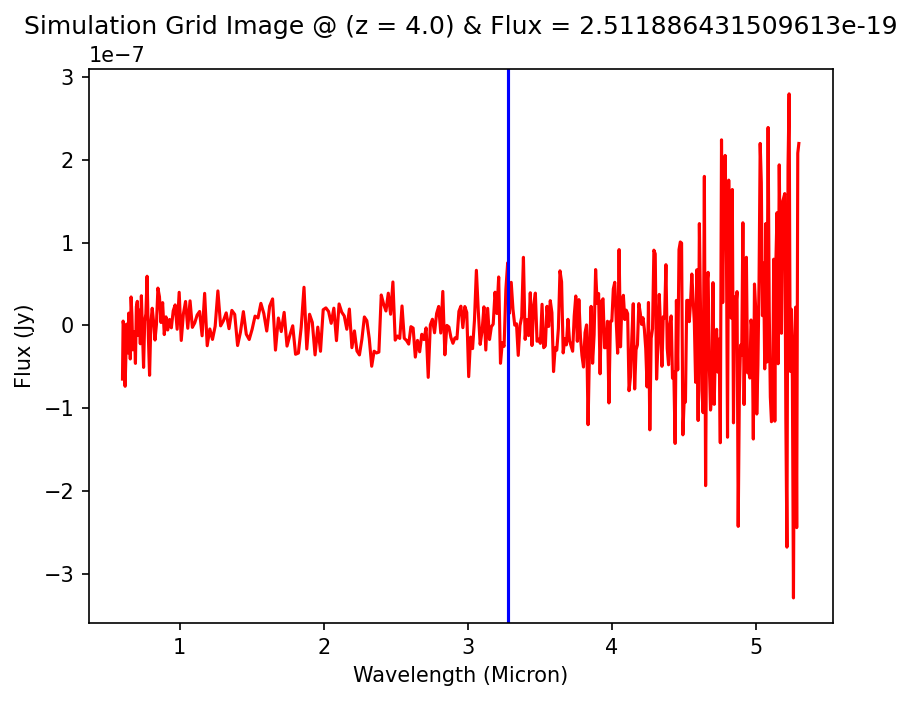

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 3.162277660168431e-19
Amp: 5.941523039122663e-21, Mu: 32814.0, Sigma: 21.233045007200477


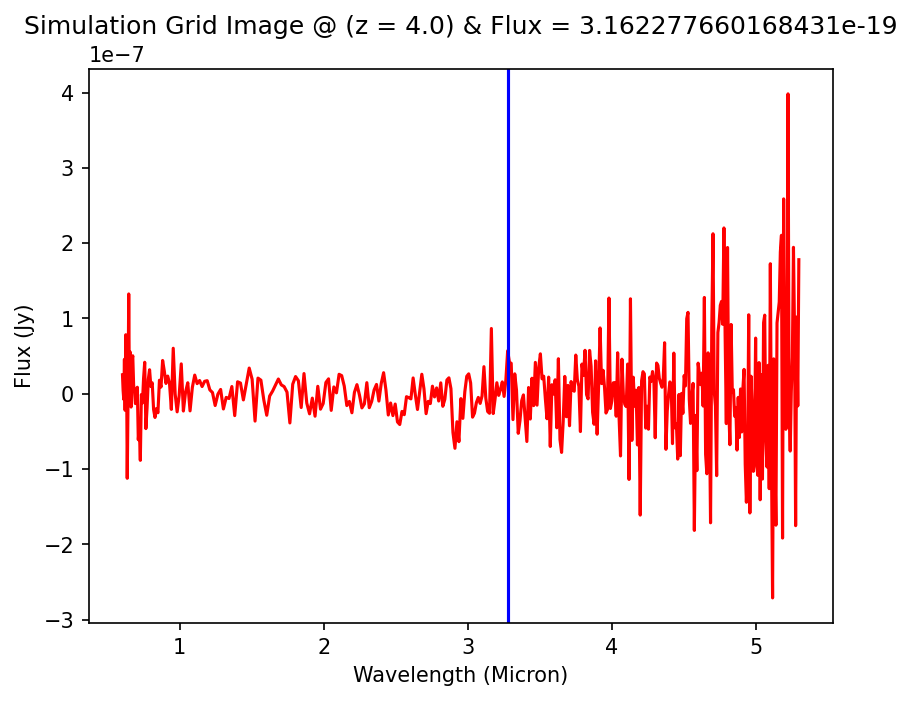

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 3.981071705535051e-19
Amp: 7.479934338712056e-21, Mu: 32814.0, Sigma: 21.233045007200477


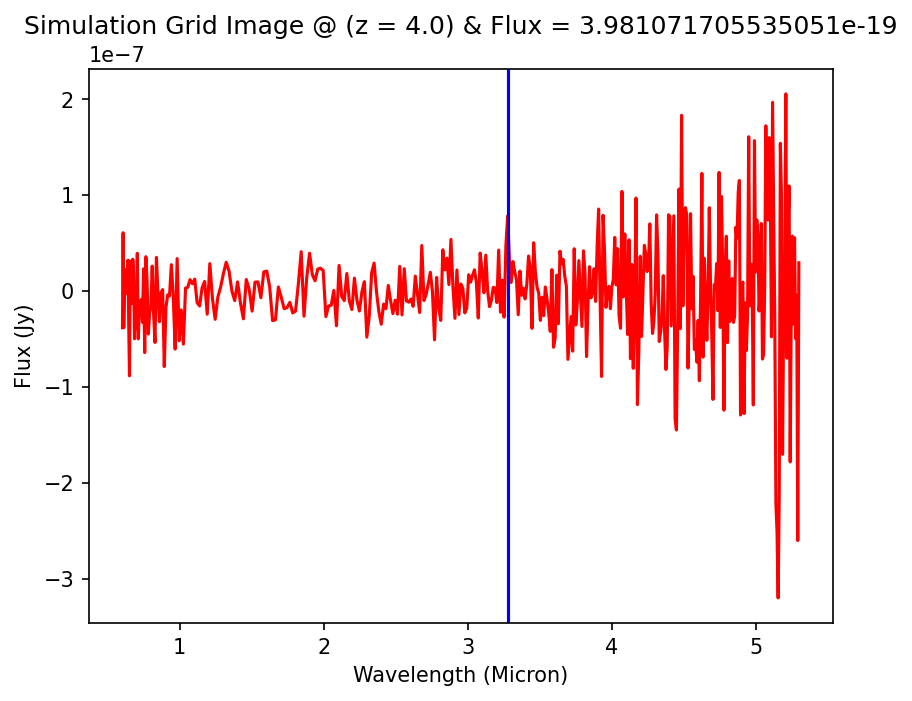

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 5.011872336272837e-19
Amp: 9.416679417556436e-21, Mu: 32814.0, Sigma: 21.233045007200477


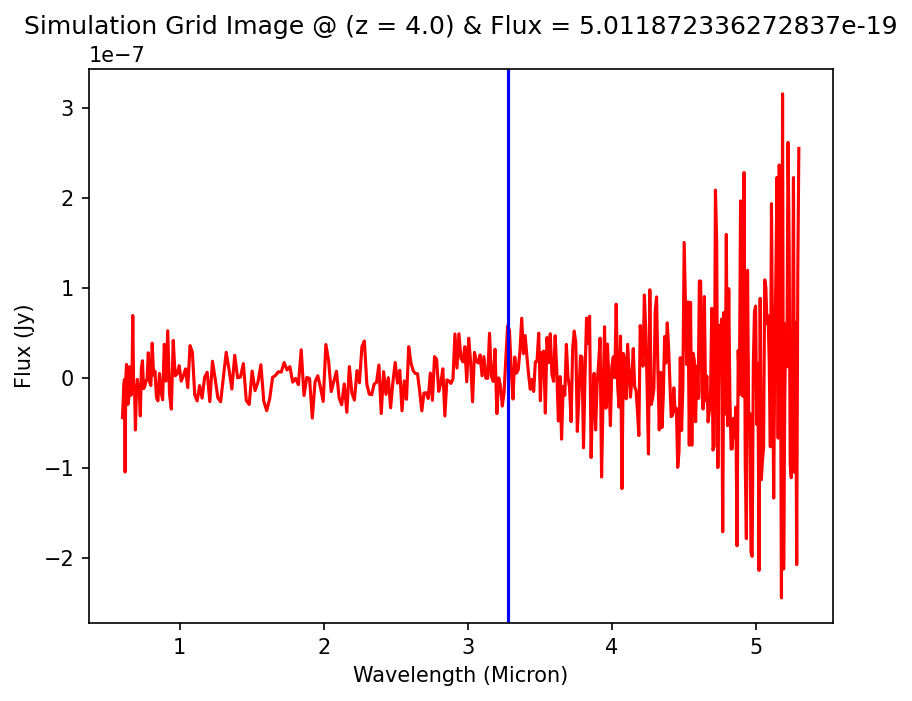

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 6.309573444802097e-19
Amp: 1.1854897013480933e-20, Mu: 32814.0, Sigma: 21.233045007200477


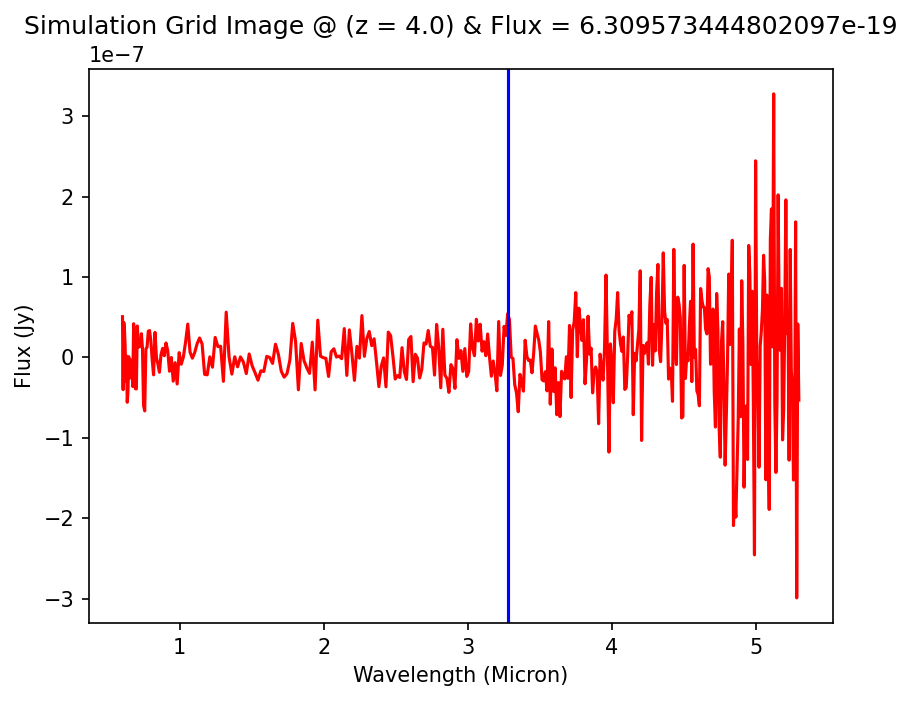

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 7.943282347243049e-19
Amp: 1.4924431104473978e-20, Mu: 32814.0, Sigma: 21.233045007200477


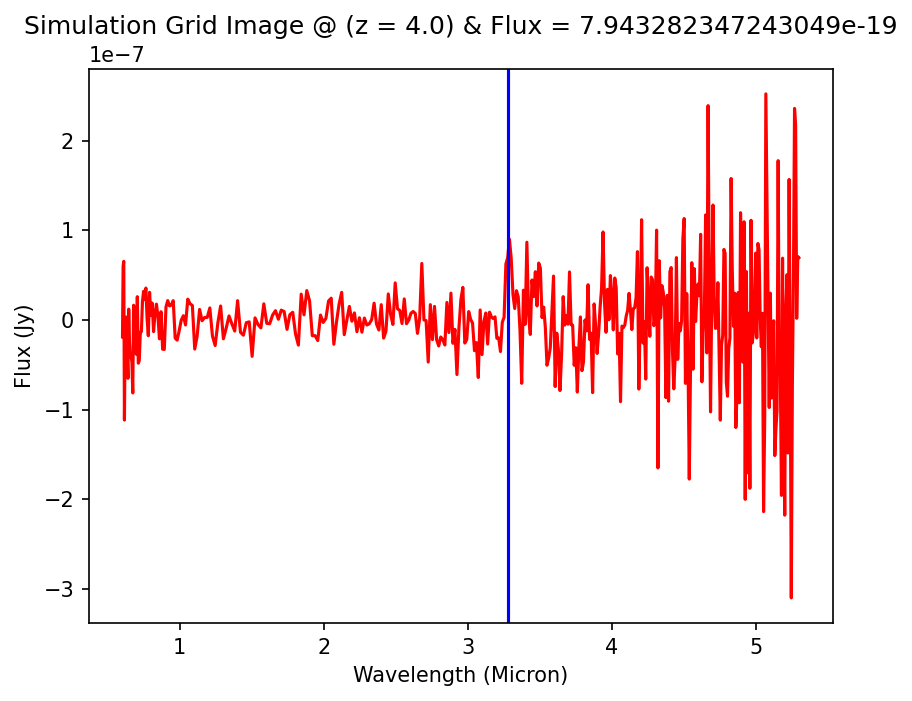

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.0000000000000328e-18
Amp: 1.8788745573993644e-20, Mu: 32814.0, Sigma: 21.233045007200477


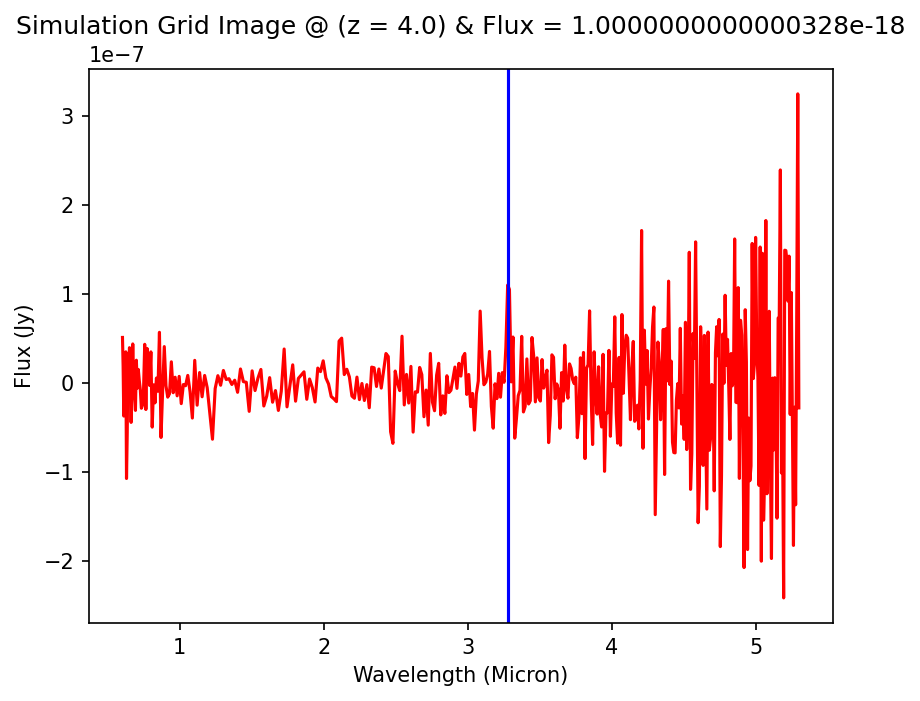

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.2589254117942125e-18
Amp: 2.365362925883586e-20, Mu: 32814.0, Sigma: 21.233045007200477


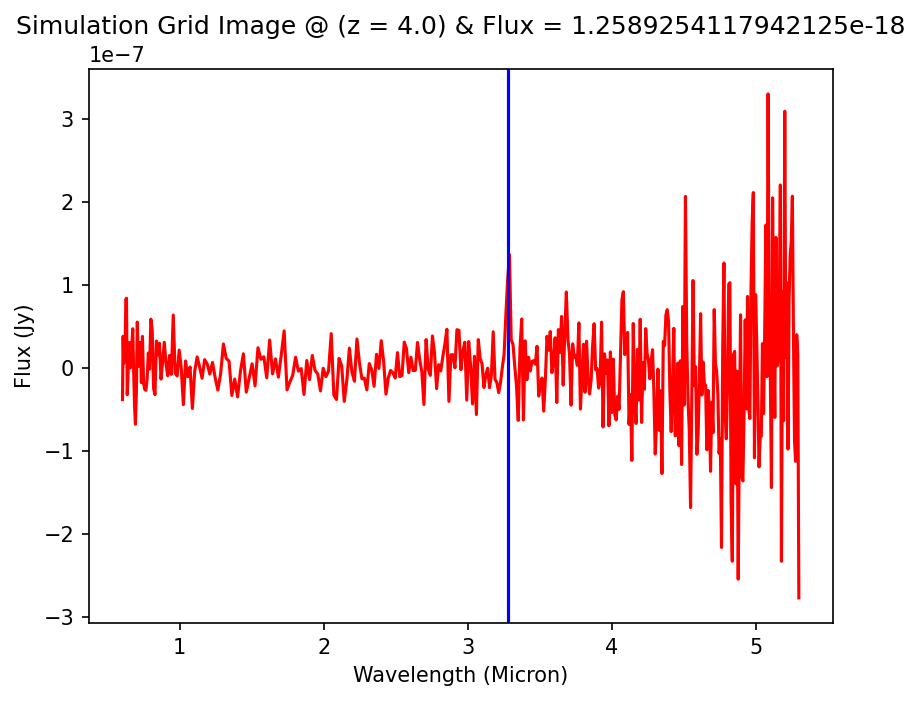

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.5848931924611758e-18
Amp: 2.9778154955106594e-20, Mu: 32814.0, Sigma: 21.233045007200477


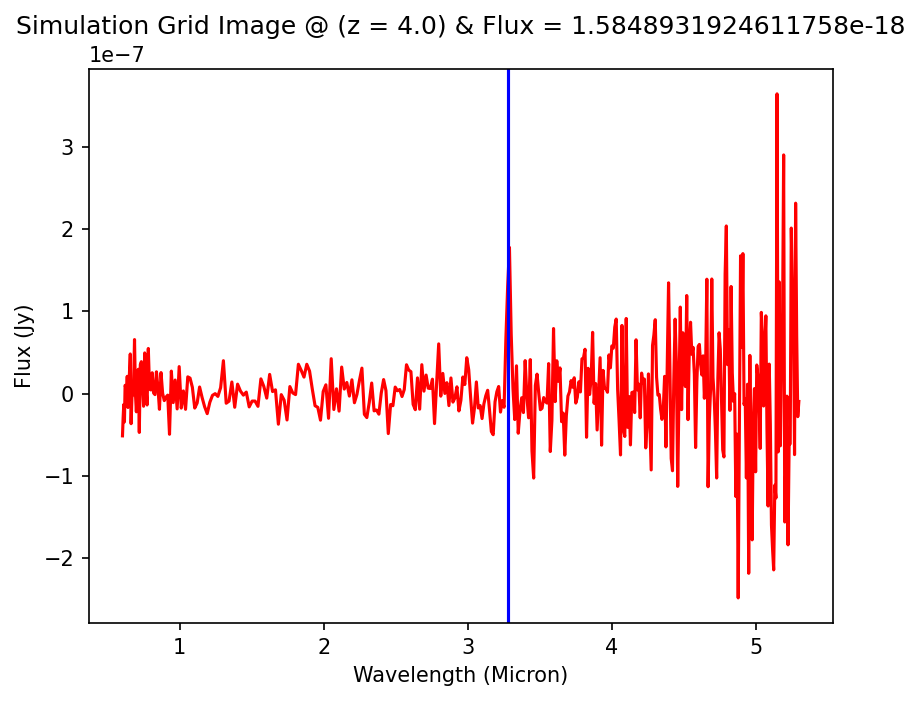

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.9952623149689645e-18
Amp: 3.748847598932821e-20, Mu: 32814.0, Sigma: 21.233045007200477


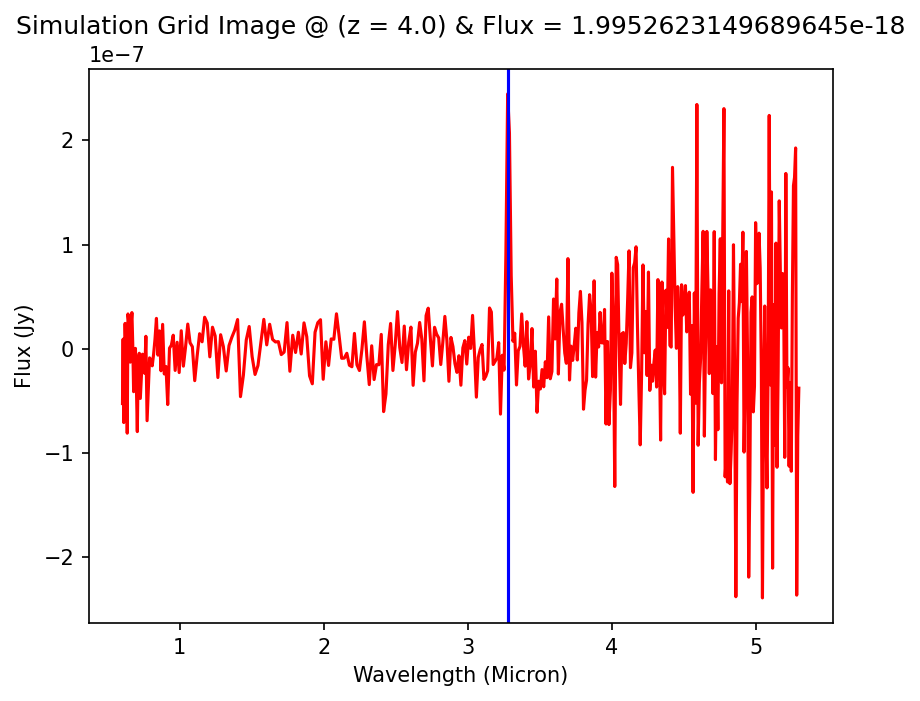

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 2.511886431509695e-18
Amp: 4.719519507240092e-20, Mu: 32814.0, Sigma: 21.233045007200477


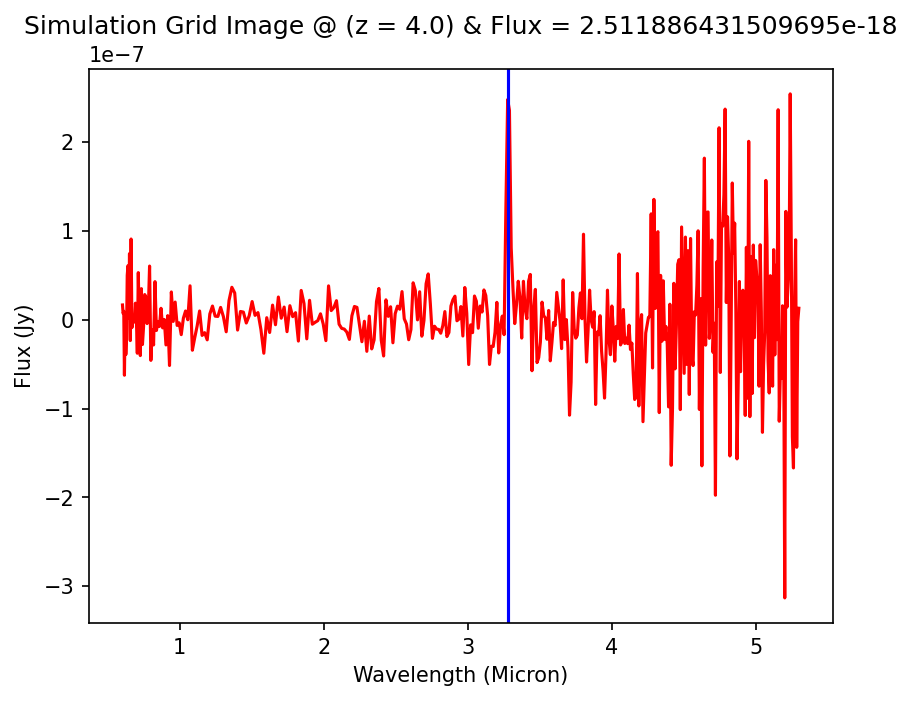

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 3.1622776601685347e-18
Amp: 5.941523039122858e-20, Mu: 32814.0, Sigma: 21.233045007200477


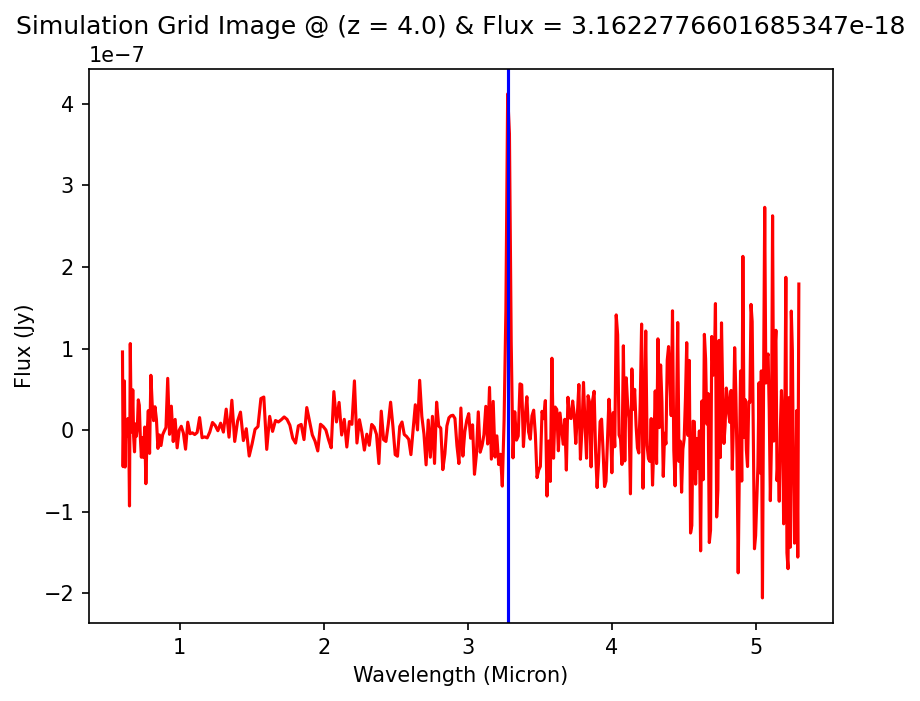

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 3.981071705535181e-18
Amp: 7.4799343387123e-20, Mu: 32814.0, Sigma: 21.233045007200477


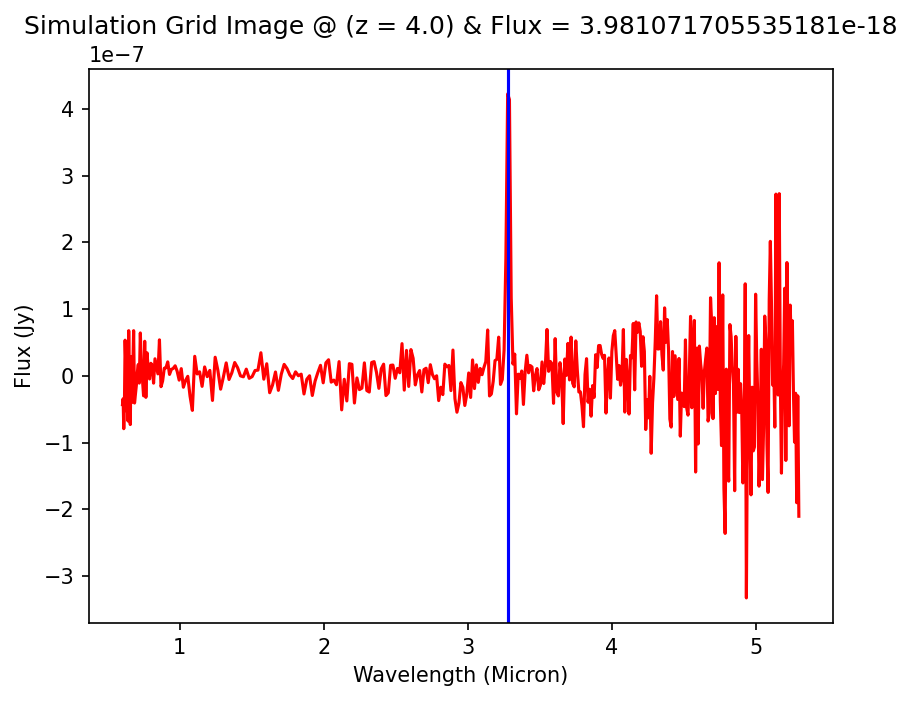

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 5.011872336273001e-18
Amp: 9.416679417556745e-20, Mu: 32814.0, Sigma: 21.233045007200477


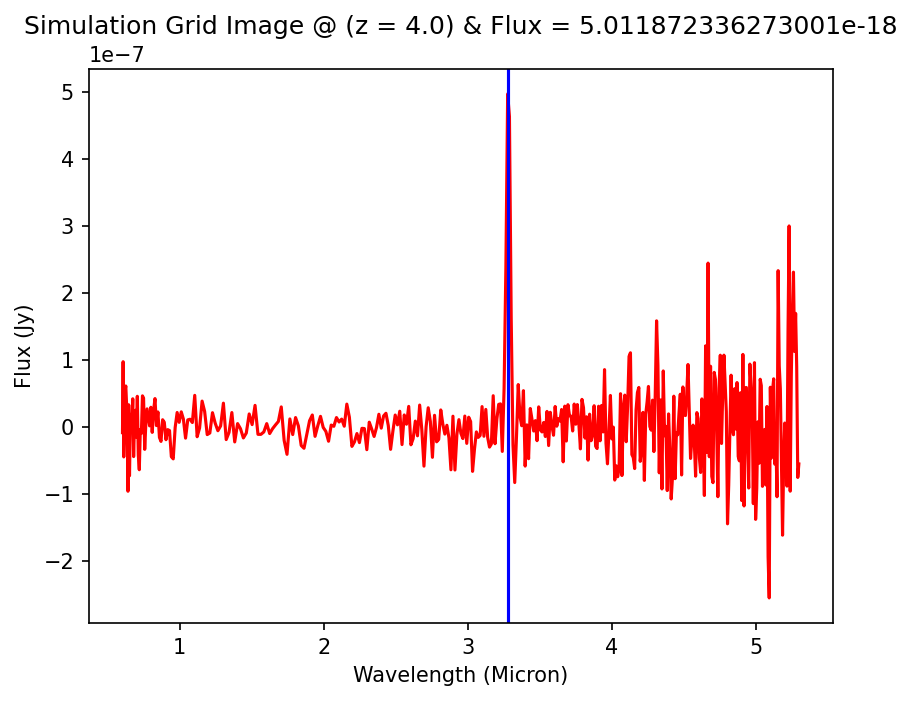

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 6.3095734448023044e-18
Amp: 1.1854897013481324e-19, Mu: 32814.0, Sigma: 21.233045007200477


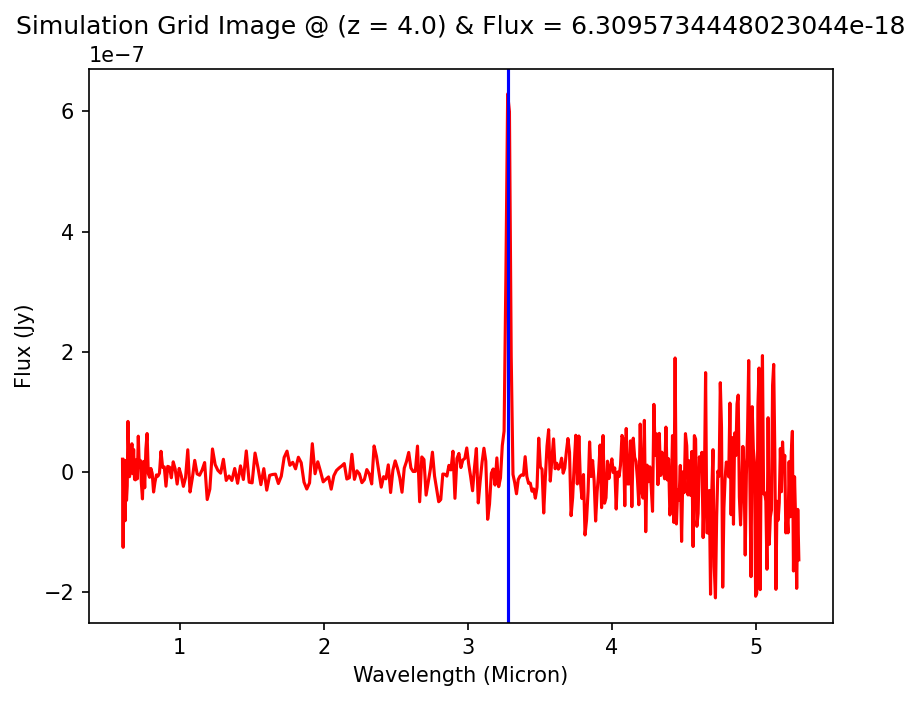

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 7.943282347243309e-18
Amp: 1.4924431104474466e-19, Mu: 32814.0, Sigma: 21.233045007200477


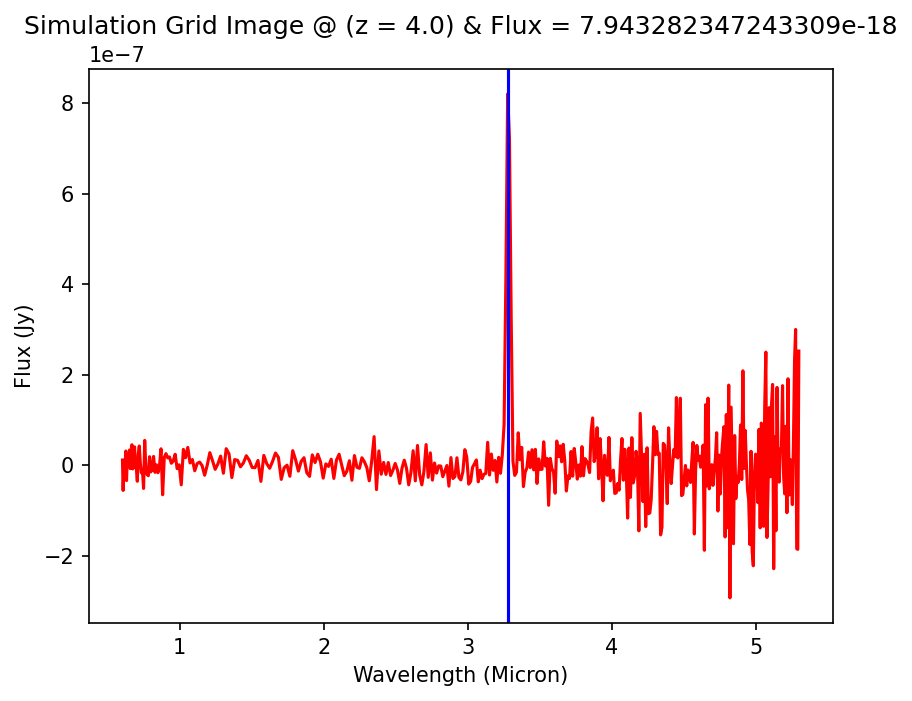

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.0000000000000654e-17
Amp: 1.8788745573994254e-19, Mu: 32814.0, Sigma: 21.233045007200477


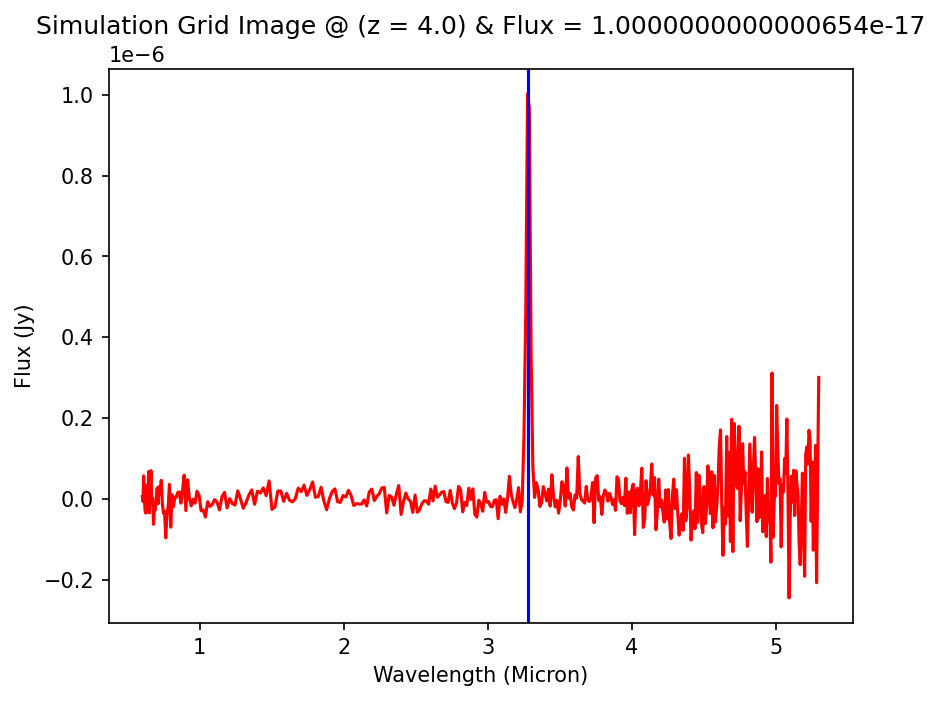

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.2589254117942538e-17
Amp: 2.365362925883663e-19, Mu: 32814.0, Sigma: 21.233045007200477


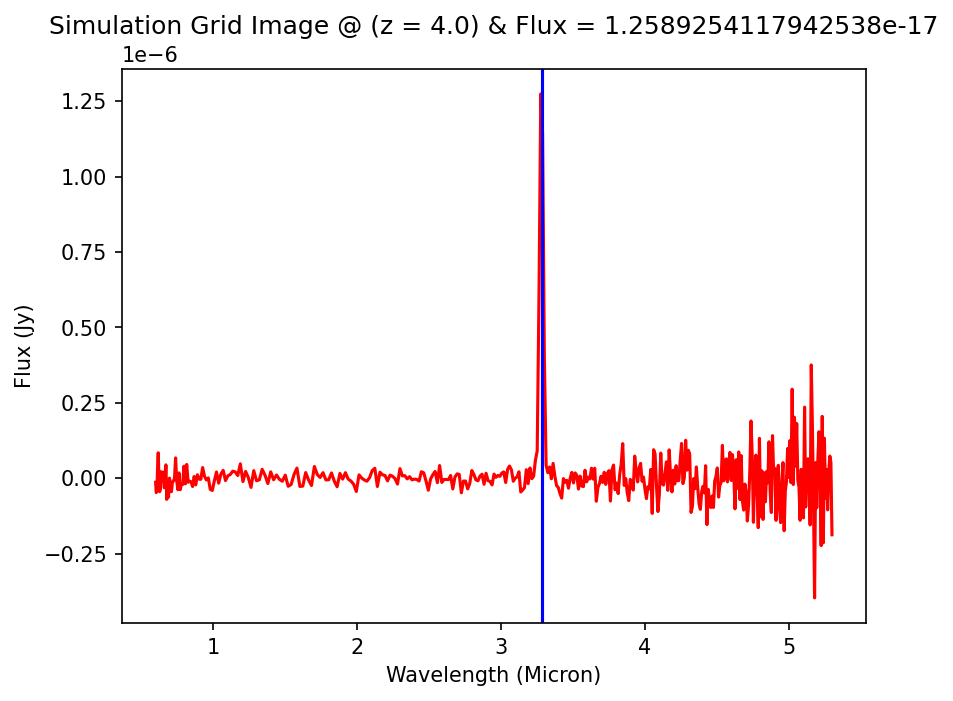

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.5848931924612275e-17
Amp: 2.9778154955107566e-19, Mu: 32814.0, Sigma: 21.233045007200477


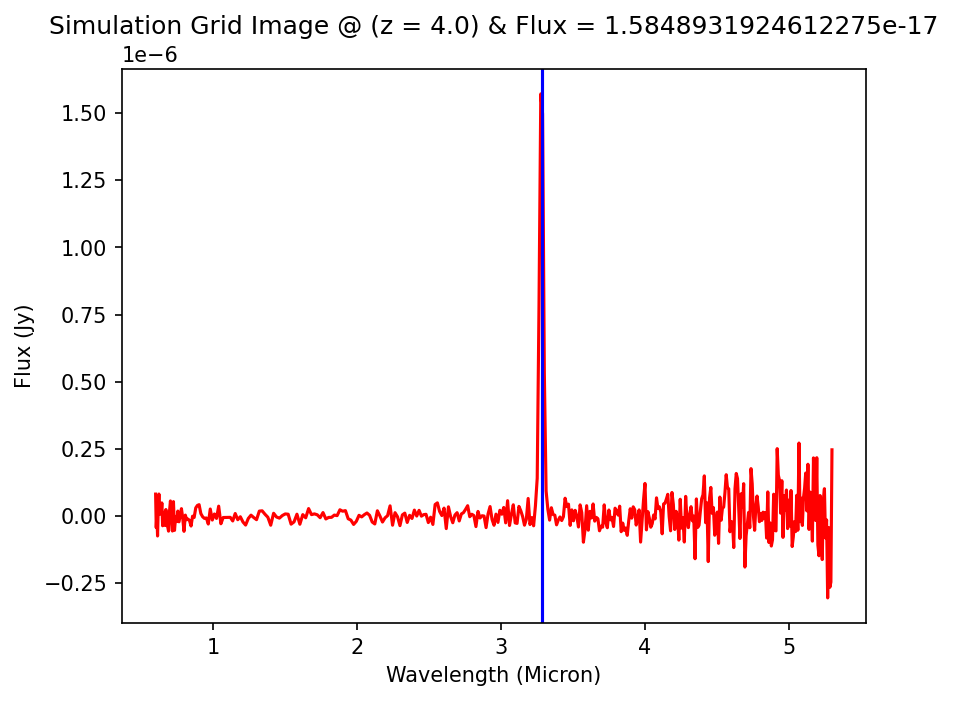

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.9952623149690297e-17
Amp: 3.7488475989329437e-19, Mu: 32814.0, Sigma: 21.233045007200477


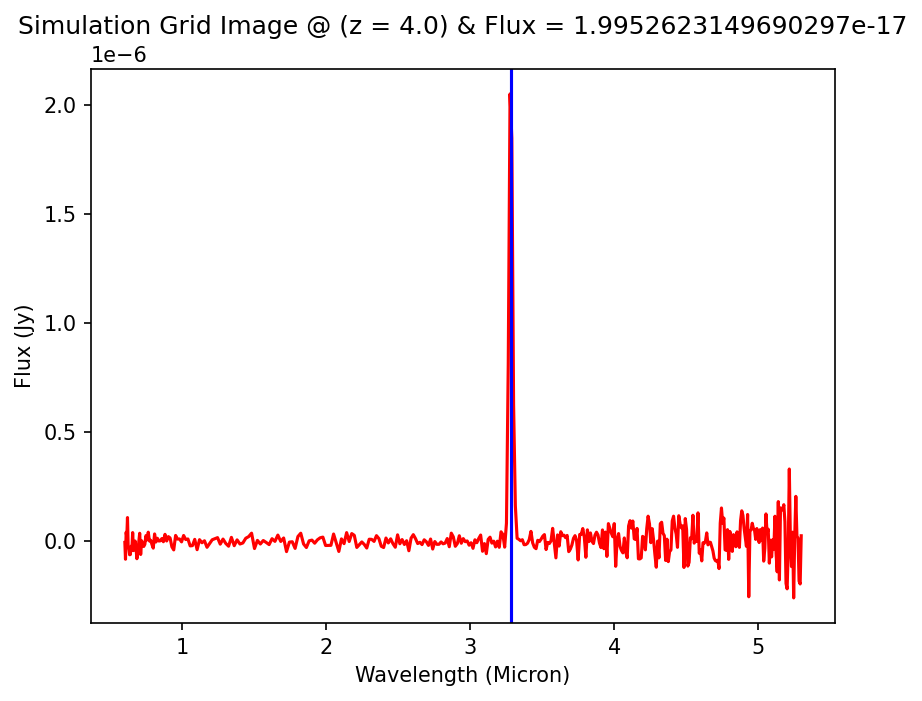

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 2.5118864315097773e-17
Amp: 4.719519507240247e-19, Mu: 32814.0, Sigma: 21.233045007200477


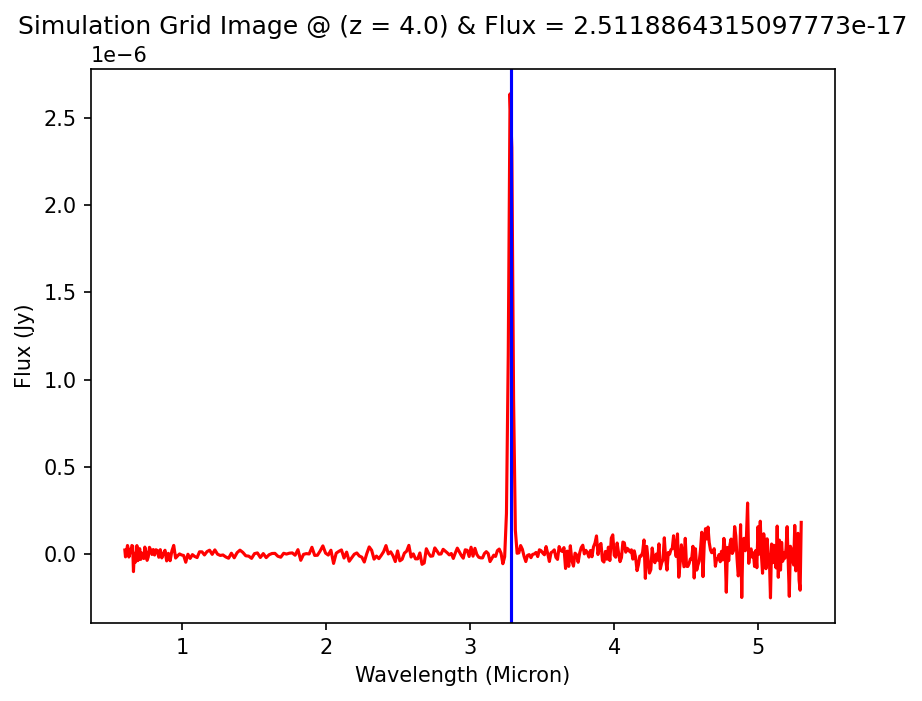

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 3.162277660168638e-17
Amp: 5.941523039123052e-19, Mu: 32814.0, Sigma: 21.233045007200477


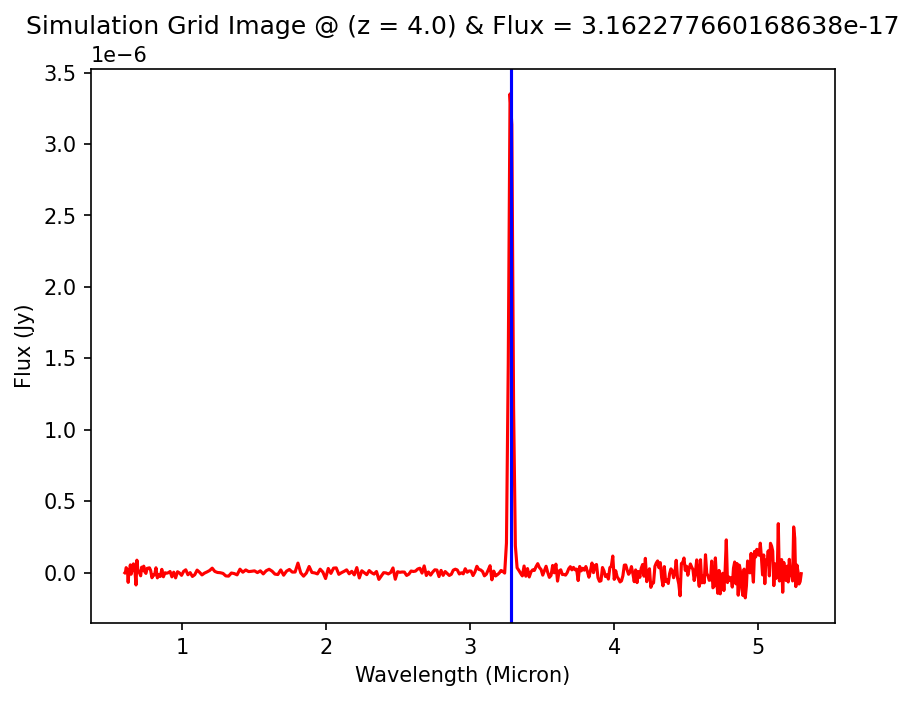

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 3.981071705535311e-17
Amp: 7.479934338712544e-19, Mu: 32814.0, Sigma: 21.233045007200477


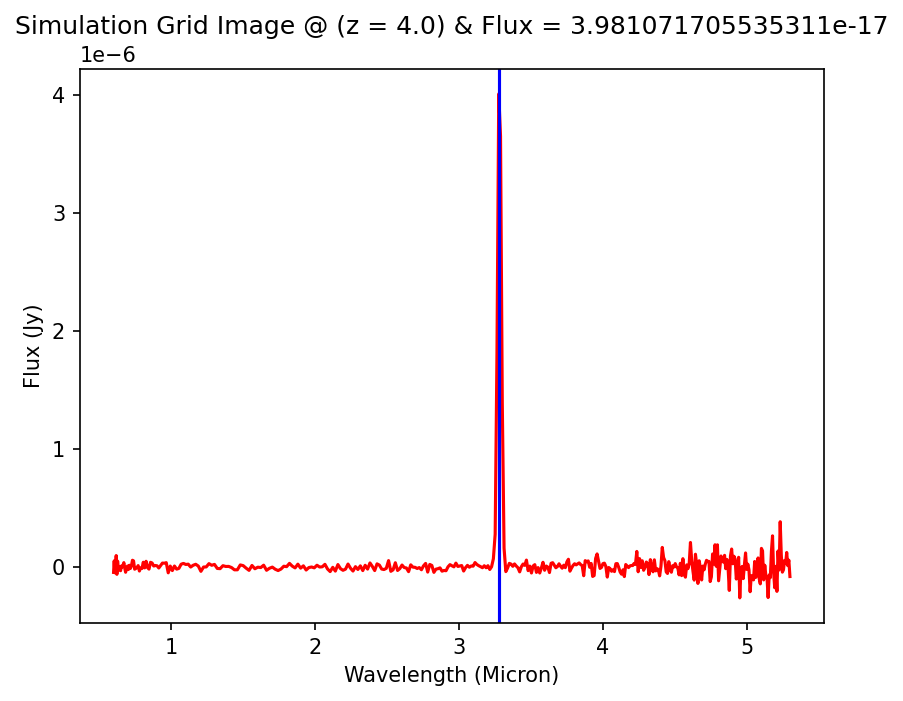

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 5.0118723362731656e-17
Amp: 9.416679417557054e-19, Mu: 32814.0, Sigma: 21.233045007200477


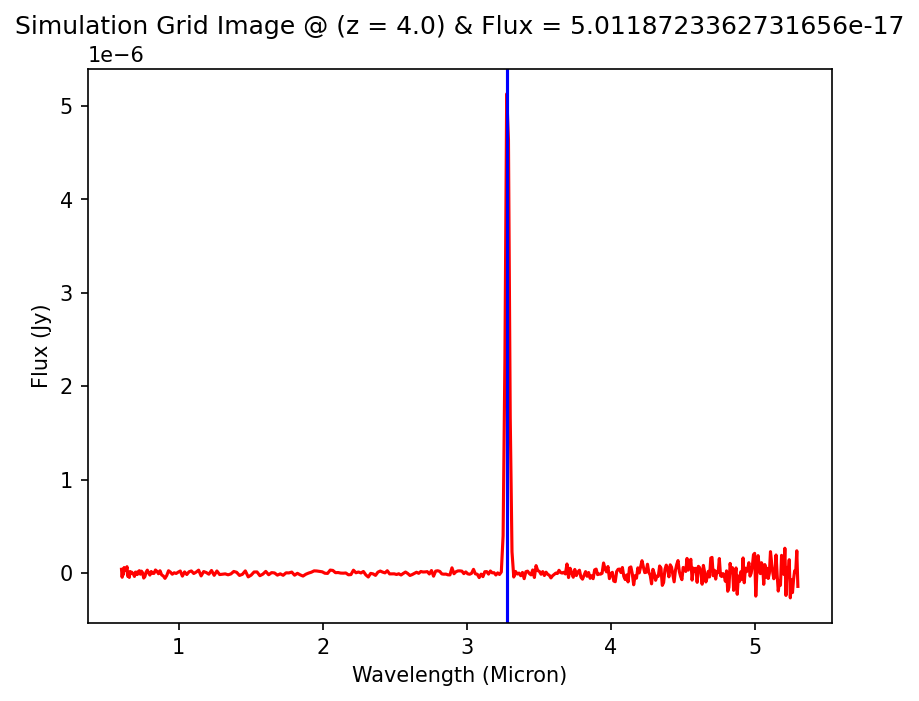

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 6.309573444802511e-17
Amp: 1.1854897013481711e-18, Mu: 32814.0, Sigma: 21.233045007200477


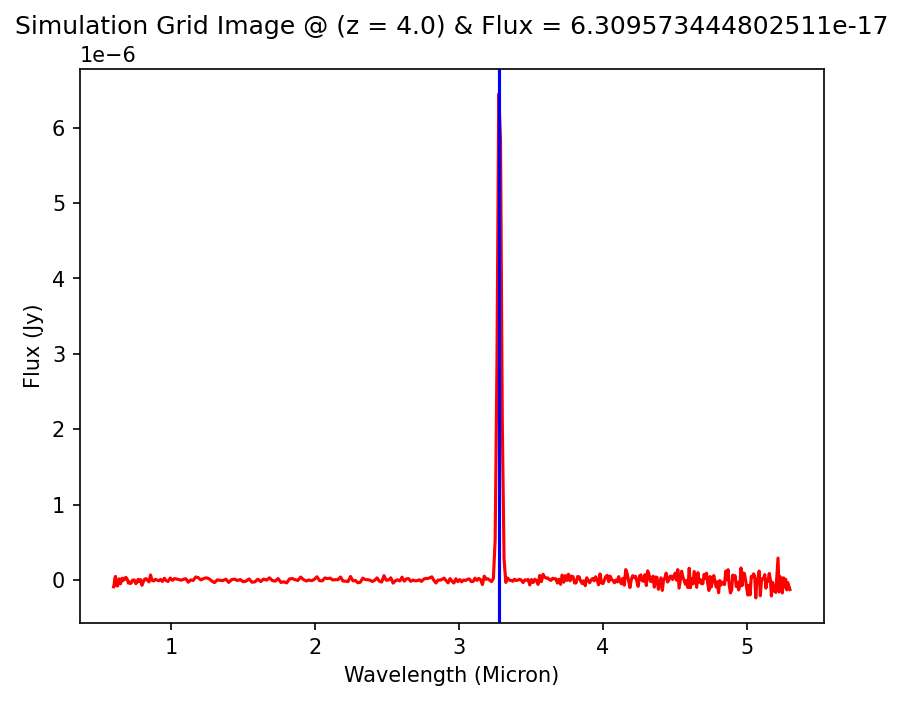

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 7.943282347243569e-17
Amp: 1.4924431104474956e-18, Mu: 32814.0, Sigma: 21.233045007200477


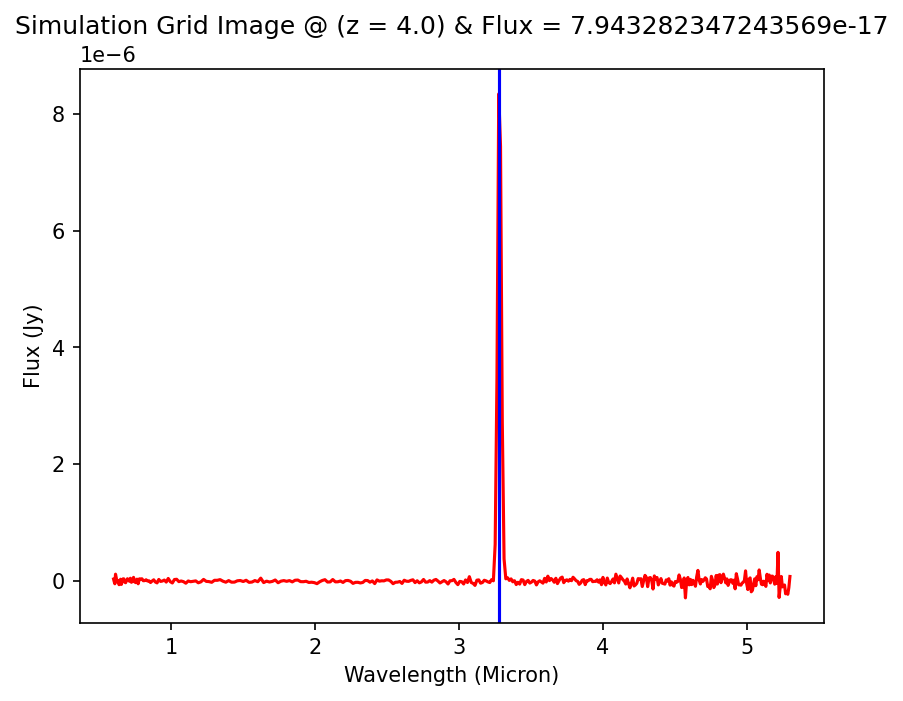

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.0, FWHM: 10, Integrated Flux: 1.0000000000000982e-16
Amp: 1.878874557399487e-18, Mu: 32814.0, Sigma: 21.233045007200477


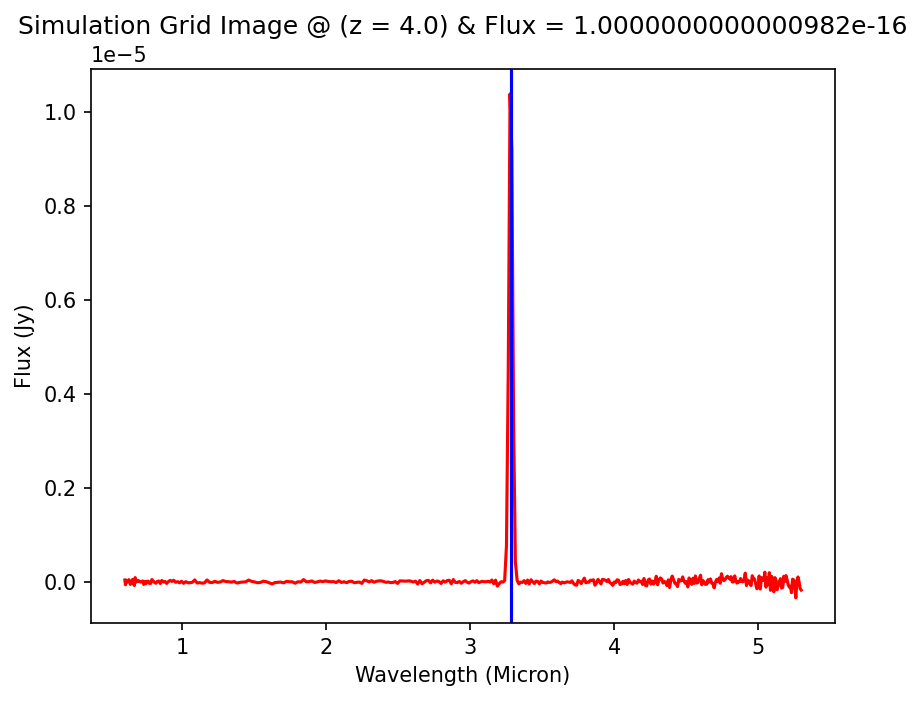

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1e-19
Amp: 1.7080677794539115e-21, Mu: 36095.4, Sigma: 23.356349507920527


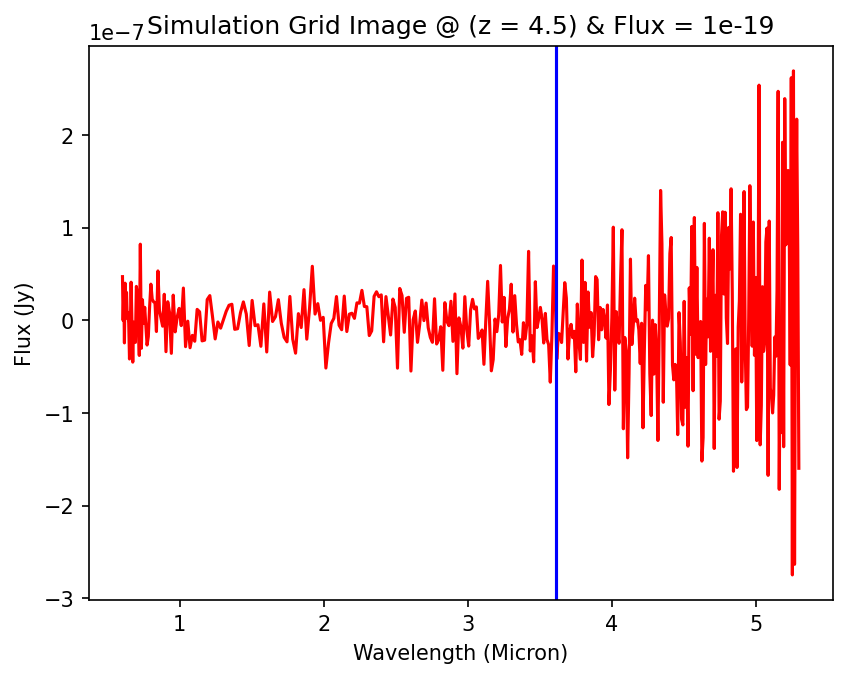

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.2589254117941713e-19
Amp: 2.1503299326213713e-21, Mu: 36095.4, Sigma: 23.356349507920527


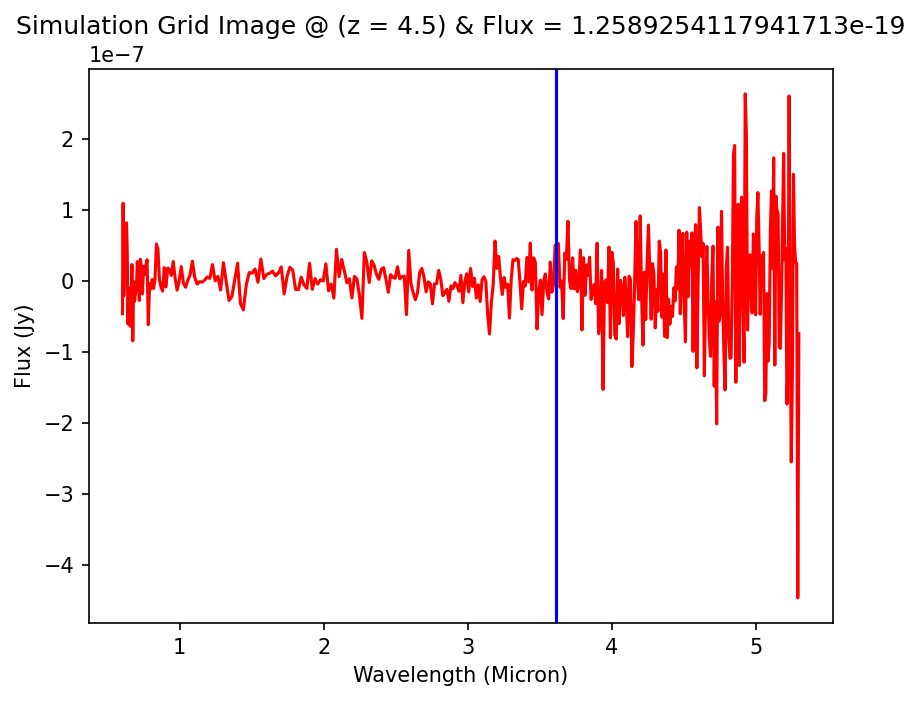

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.584893192461124e-19
Amp: 2.7071049959186925e-21, Mu: 36095.4, Sigma: 23.356349507920527


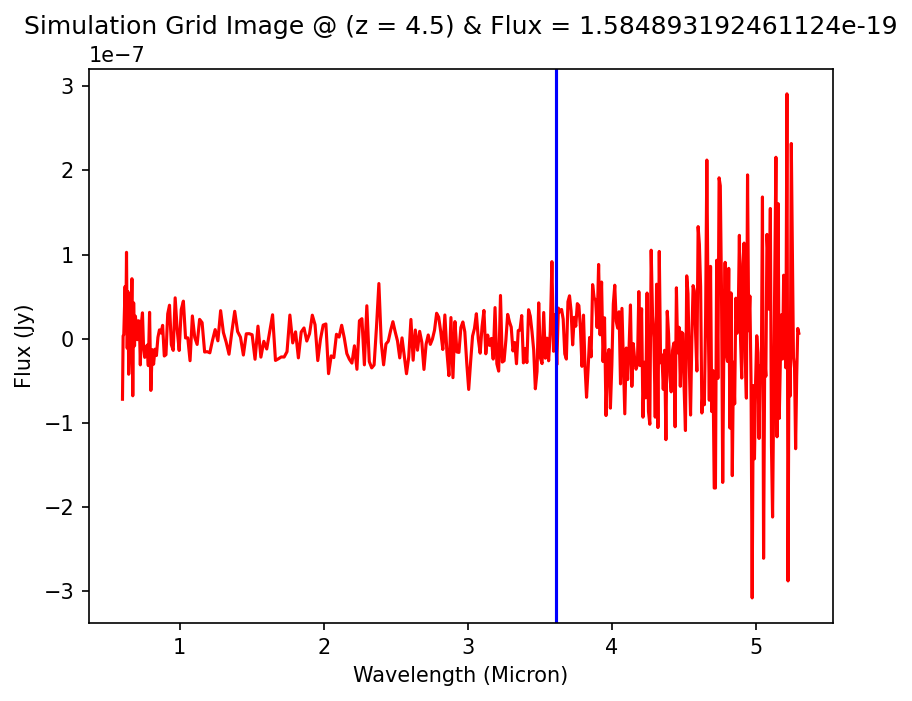

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.995262314968899e-19
Amp: 3.408043271756998e-21, Mu: 36095.4, Sigma: 23.356349507920527


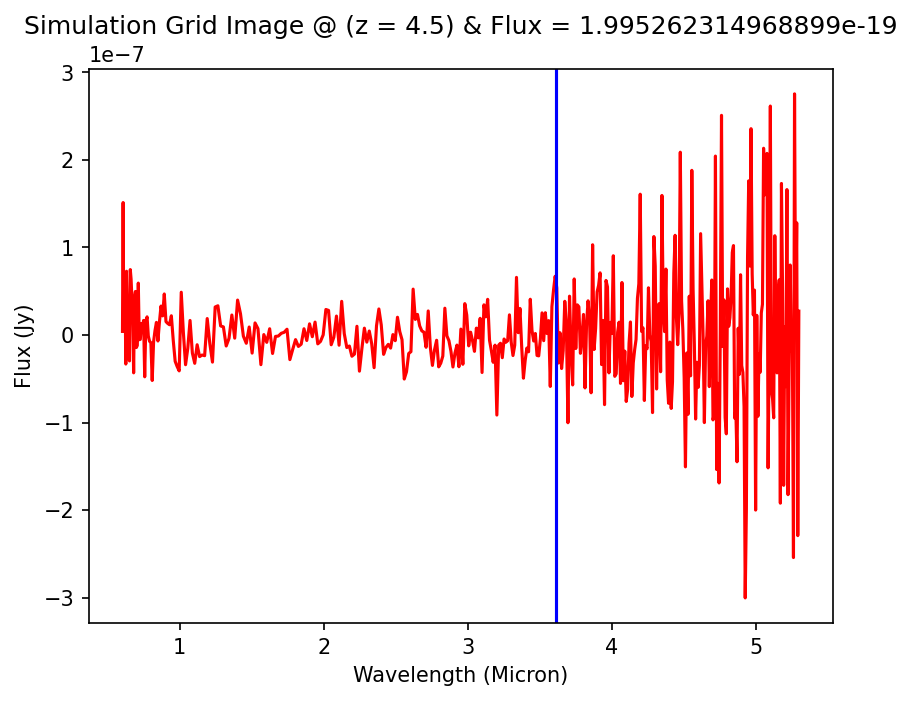

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 2.511886431509613e-19
Amp: 4.290472279309034e-21, Mu: 36095.4, Sigma: 23.356349507920527


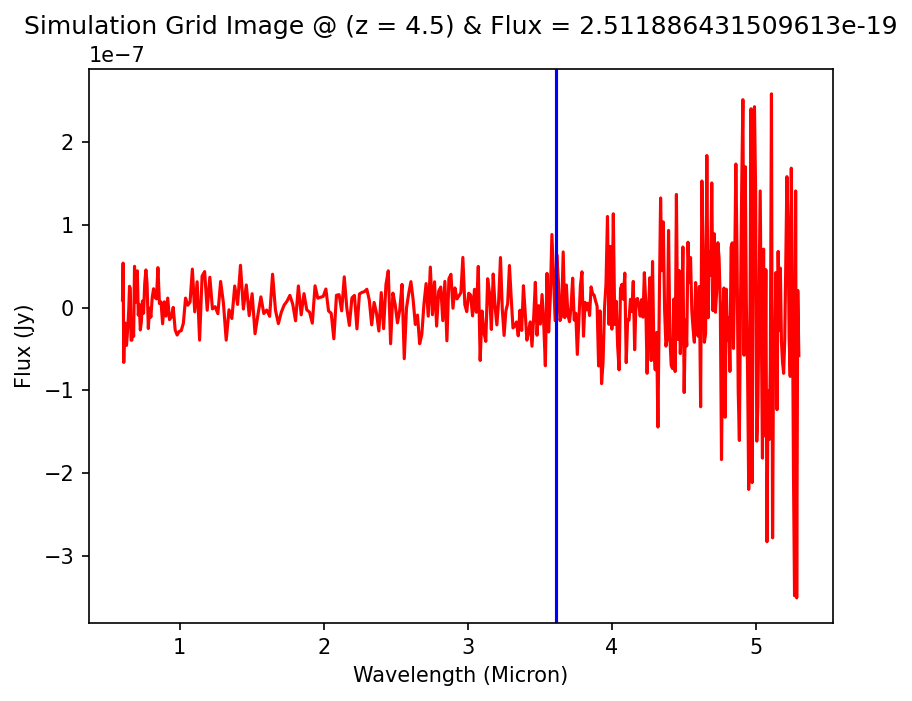

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 3.162277660168431e-19
Amp: 5.4013845810206025e-21, Mu: 36095.4, Sigma: 23.356349507920527


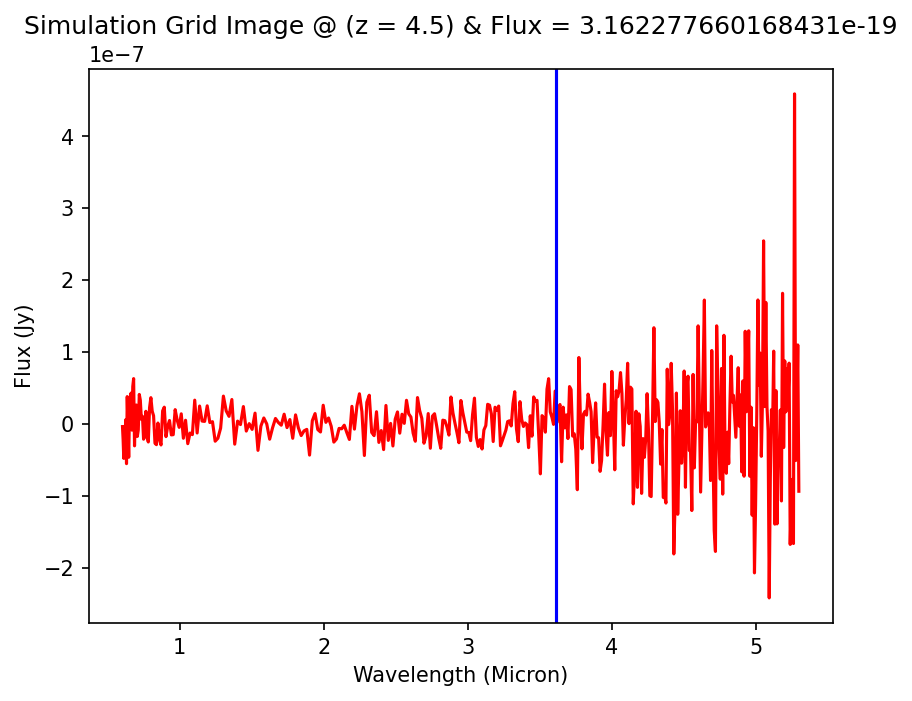

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 3.981071705535051e-19
Amp: 6.79994030792005e-21, Mu: 36095.4, Sigma: 23.356349507920527


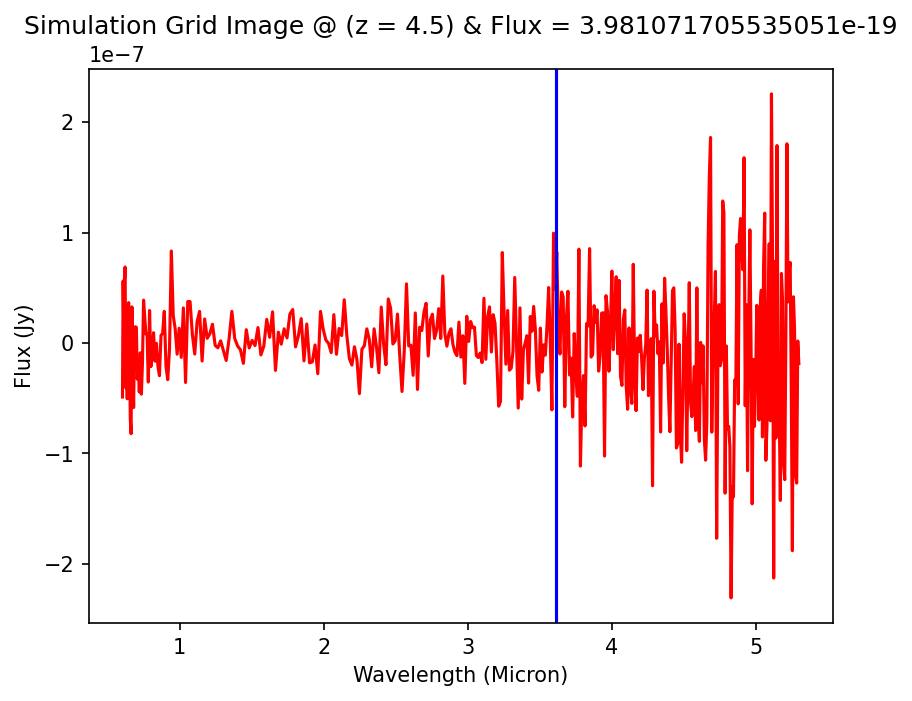

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 5.011872336272837e-19
Amp: 8.560617652324033e-21, Mu: 36095.4, Sigma: 23.356349507920527


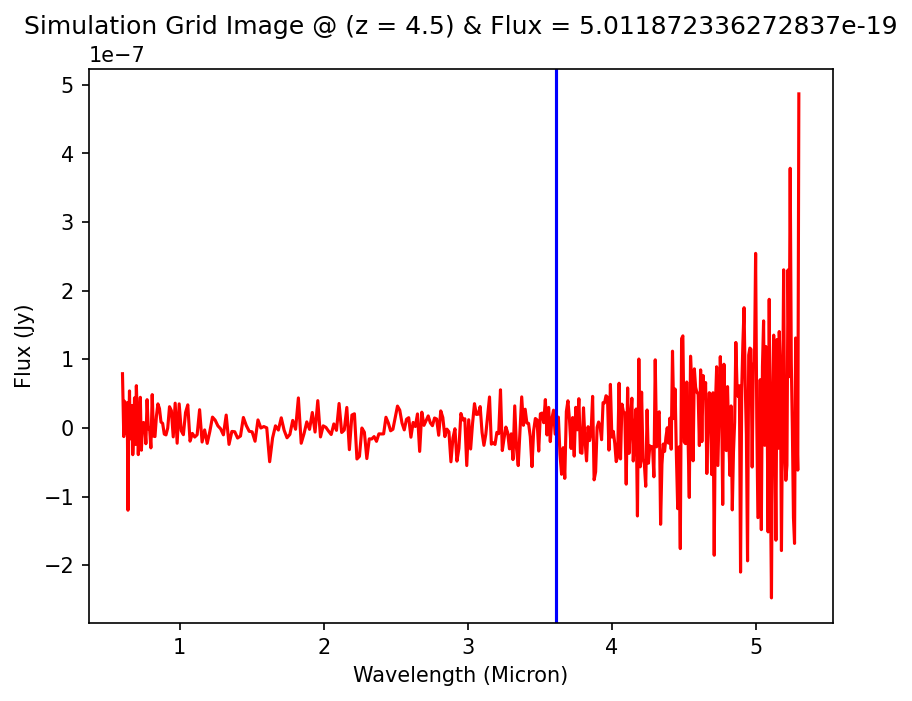

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 6.309573444802097e-19
Amp: 1.0777179103164484e-20, Mu: 36095.4, Sigma: 23.356349507920527


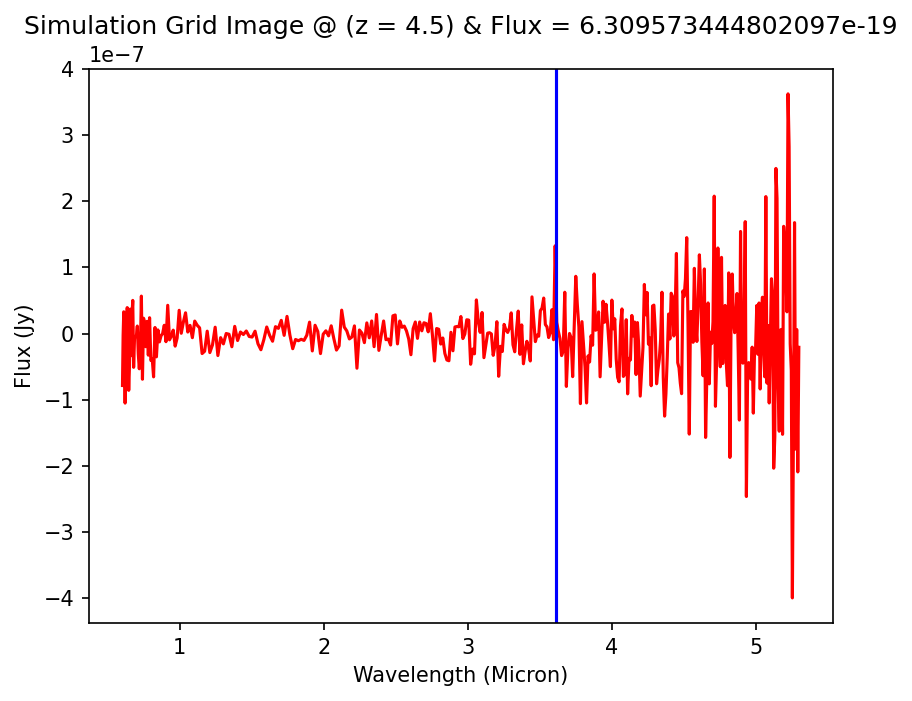

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 7.943282347243049e-19
Amp: 1.3567664640430888e-20, Mu: 36095.4, Sigma: 23.356349507920527


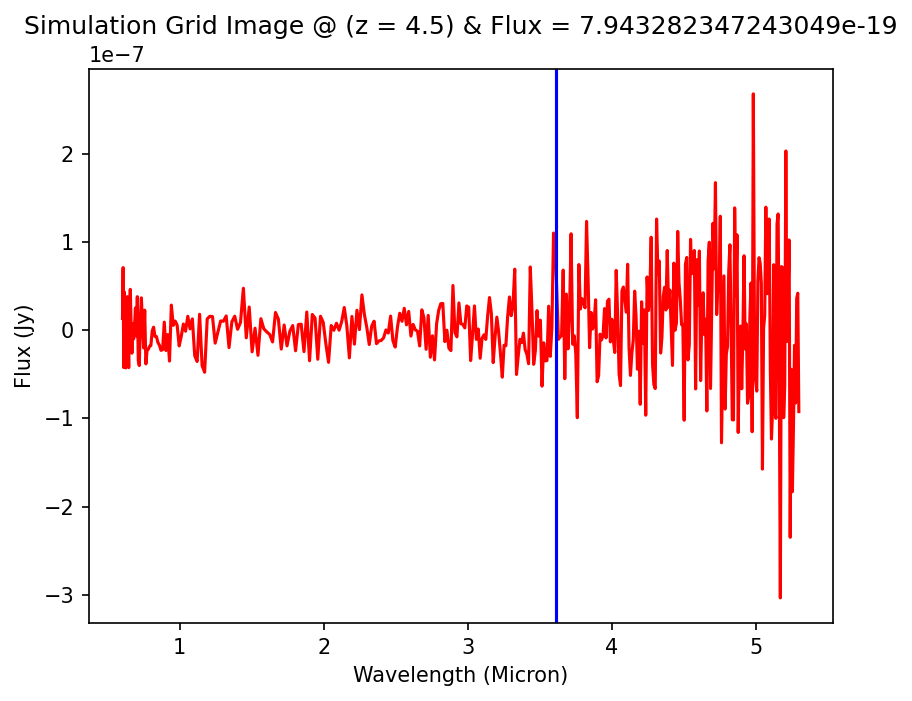

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.0000000000000328e-18
Amp: 1.7080677794539674e-20, Mu: 36095.4, Sigma: 23.356349507920527


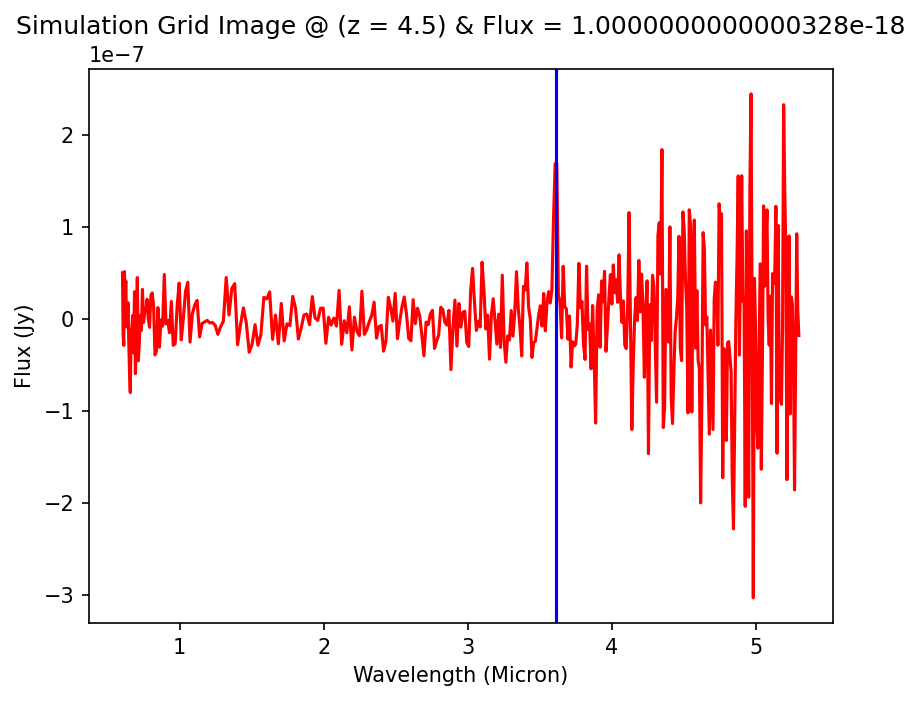

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.2589254117942125e-18
Amp: 2.1503299326214416e-20, Mu: 36095.4, Sigma: 23.356349507920527


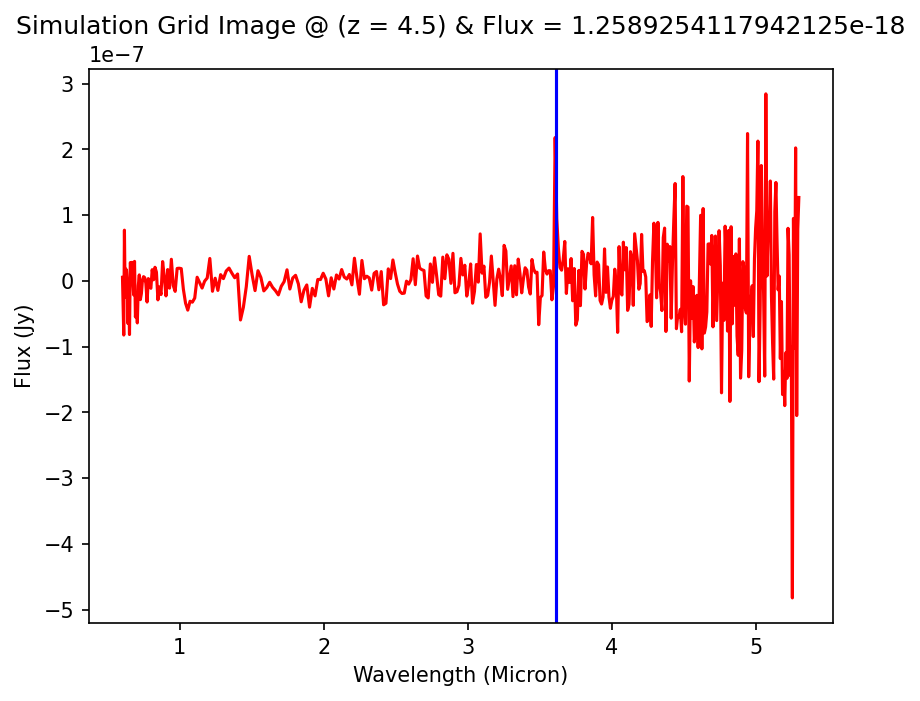

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.5848931924611758e-18
Amp: 2.7071049959187812e-20, Mu: 36095.4, Sigma: 23.356349507920527


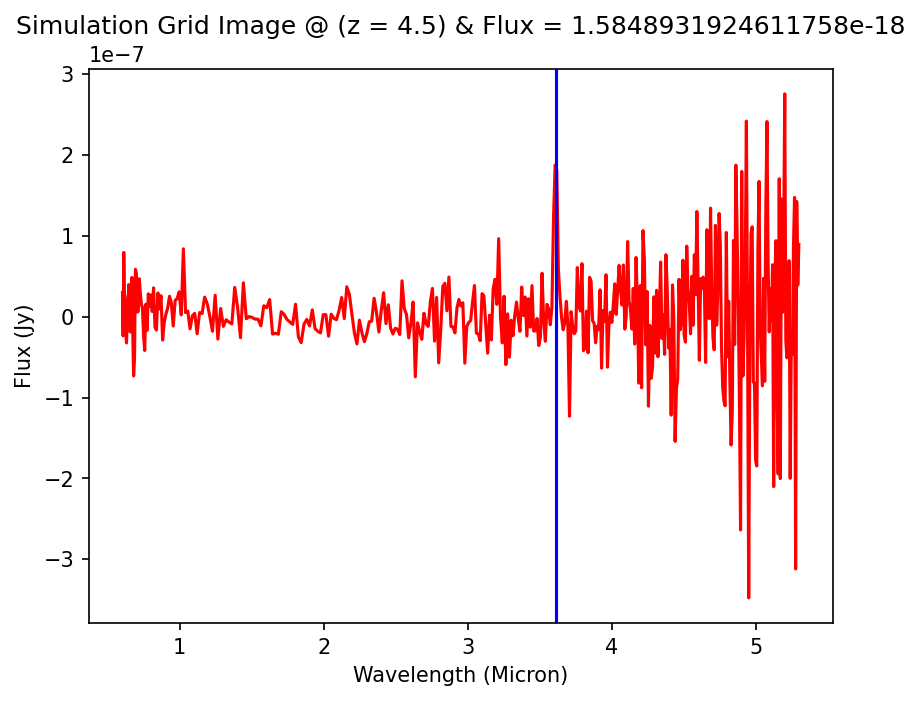

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.9952623149689645e-18
Amp: 3.40804327175711e-20, Mu: 36095.4, Sigma: 23.356349507920527


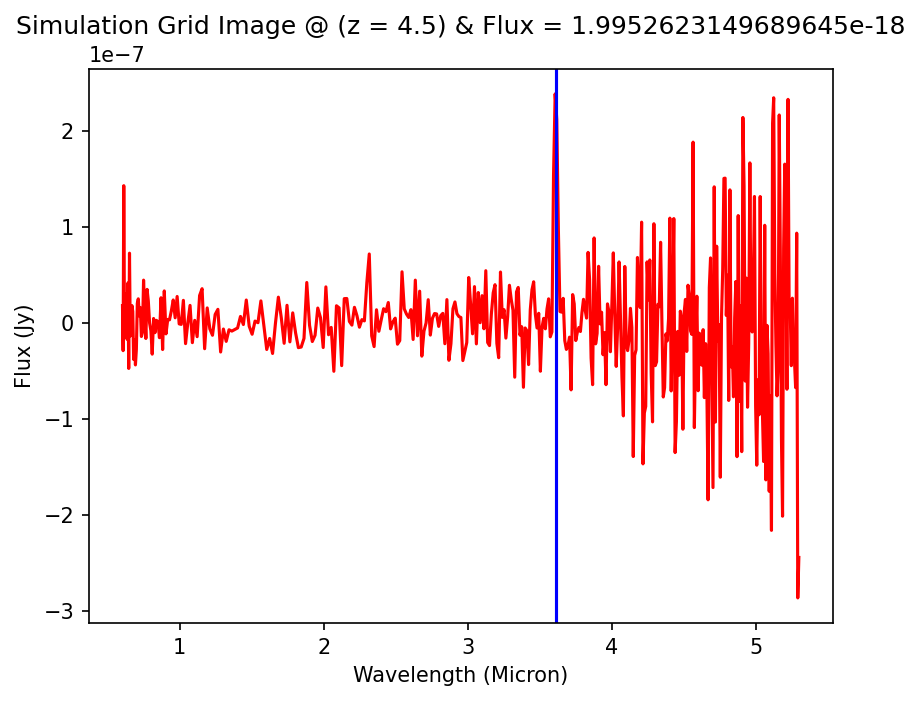

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 2.511886431509695e-18
Amp: 4.2904722793091743e-20, Mu: 36095.4, Sigma: 23.356349507920527


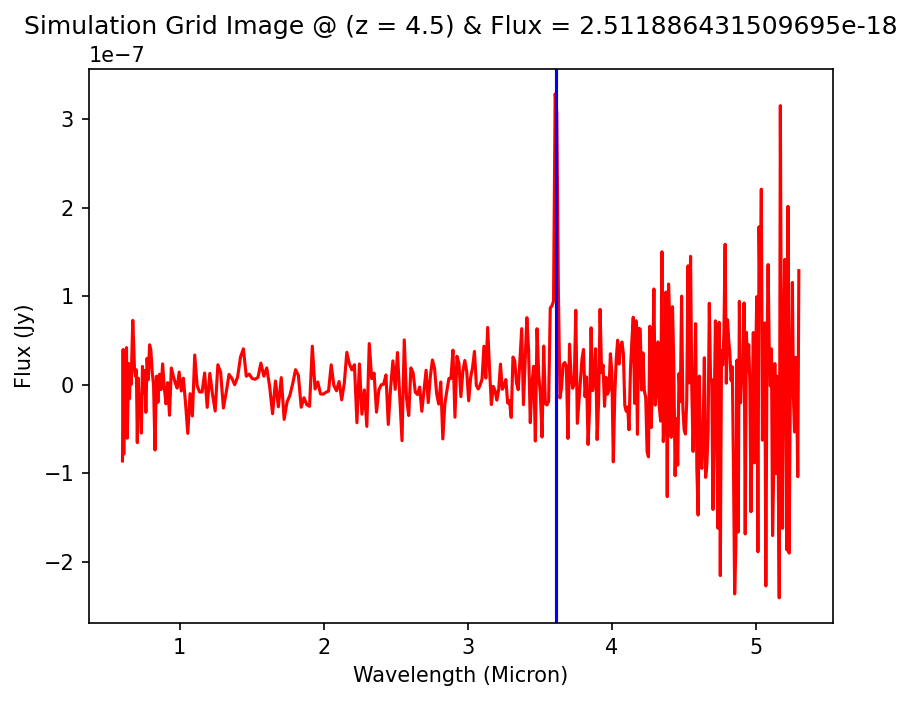

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 3.1622776601685347e-18
Amp: 5.4013845810207796e-20, Mu: 36095.4, Sigma: 23.356349507920527


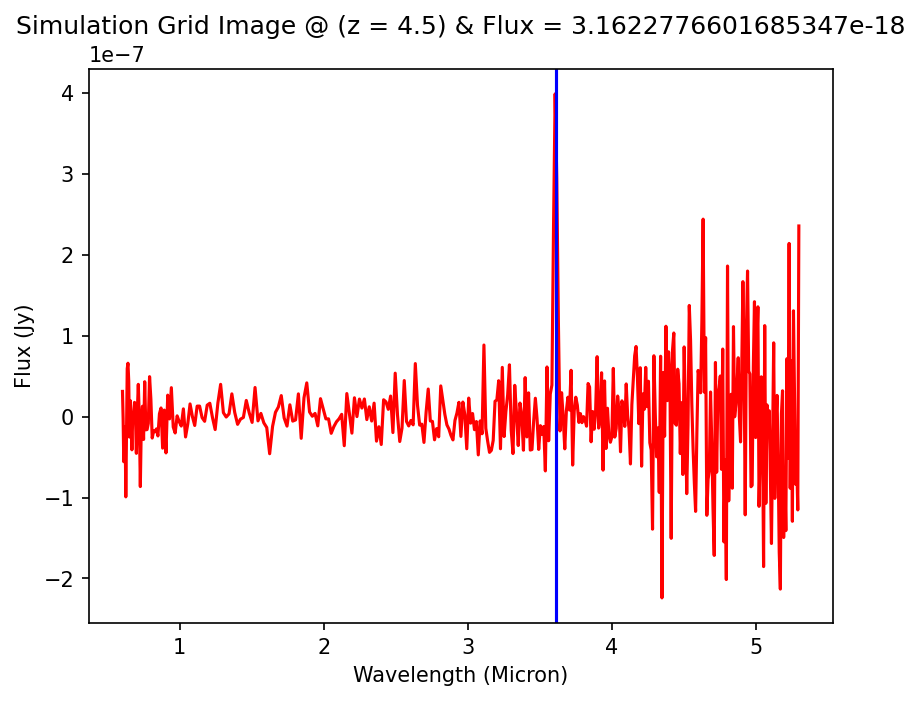

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 3.981071705535181e-18
Amp: 6.799940307920272e-20, Mu: 36095.4, Sigma: 23.356349507920527


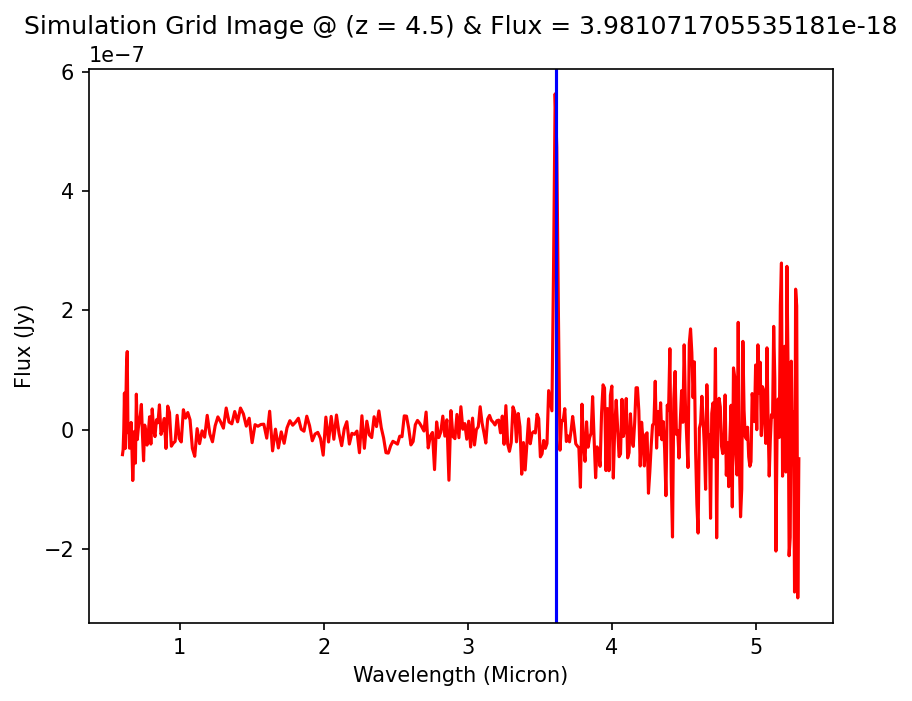

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 5.011872336273001e-18
Amp: 8.560617652324312e-20, Mu: 36095.4, Sigma: 23.356349507920527


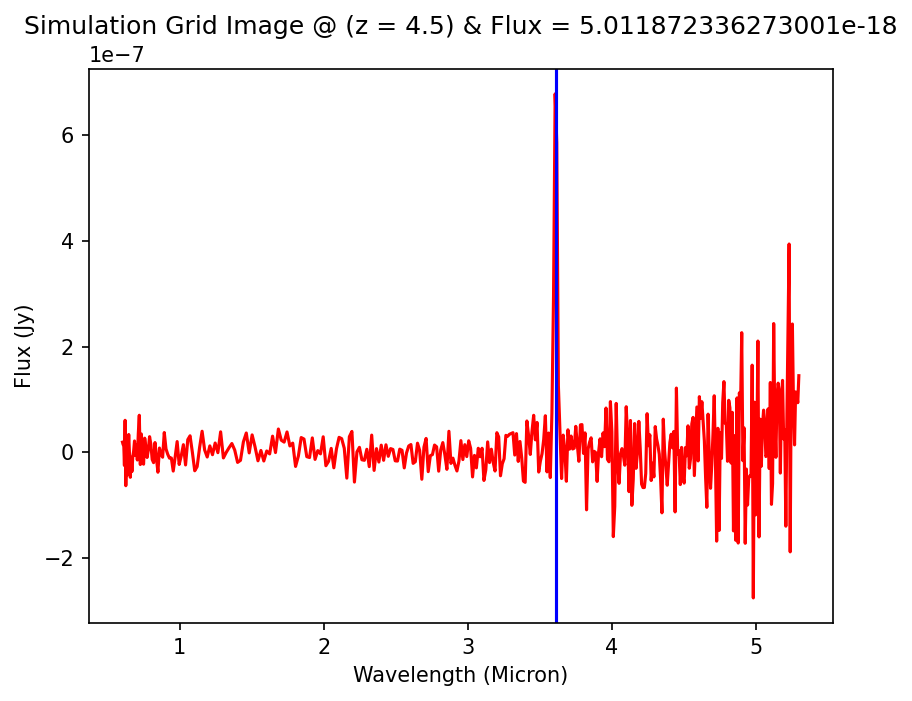

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 6.3095734448023044e-18
Amp: 1.0777179103164838e-19, Mu: 36095.4, Sigma: 23.356349507920527


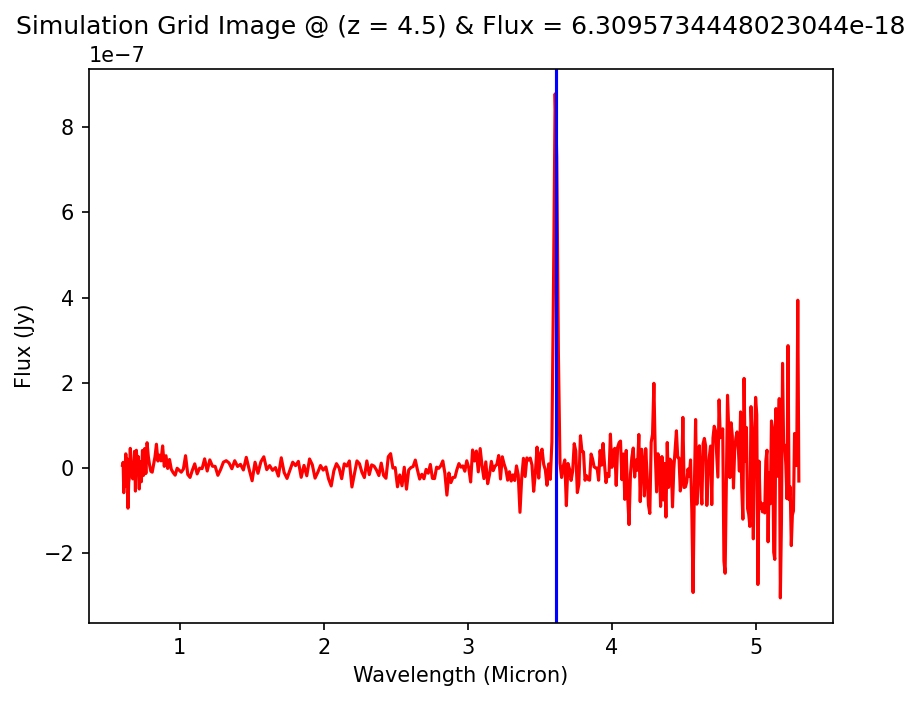

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 7.943282347243309e-18
Amp: 1.356766464043133e-19, Mu: 36095.4, Sigma: 23.356349507920527


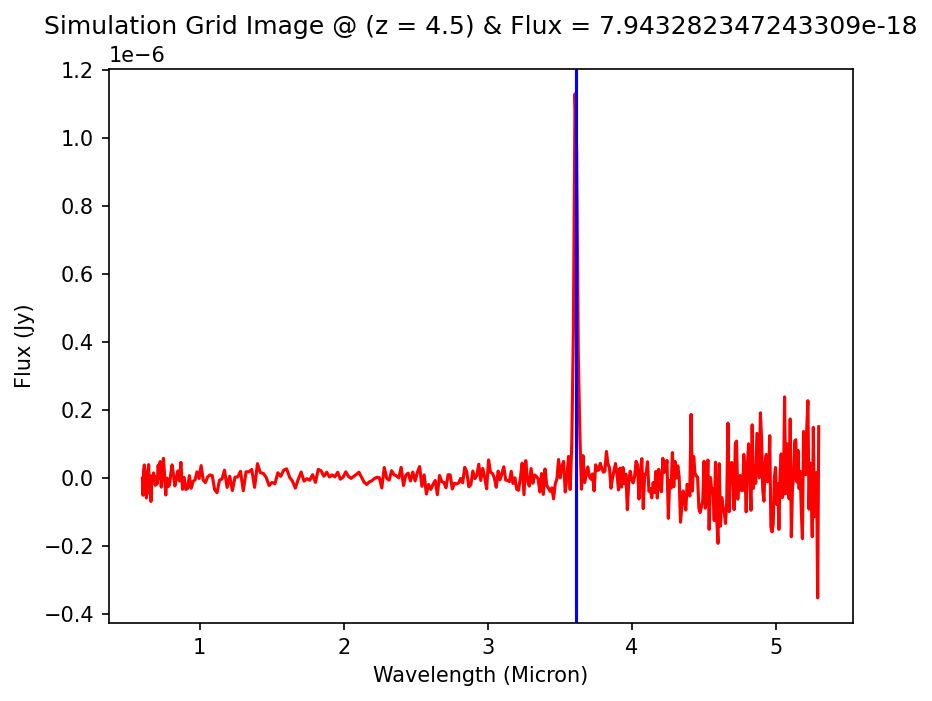

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.0000000000000654e-17
Amp: 1.708067779454023e-19, Mu: 36095.4, Sigma: 23.356349507920527


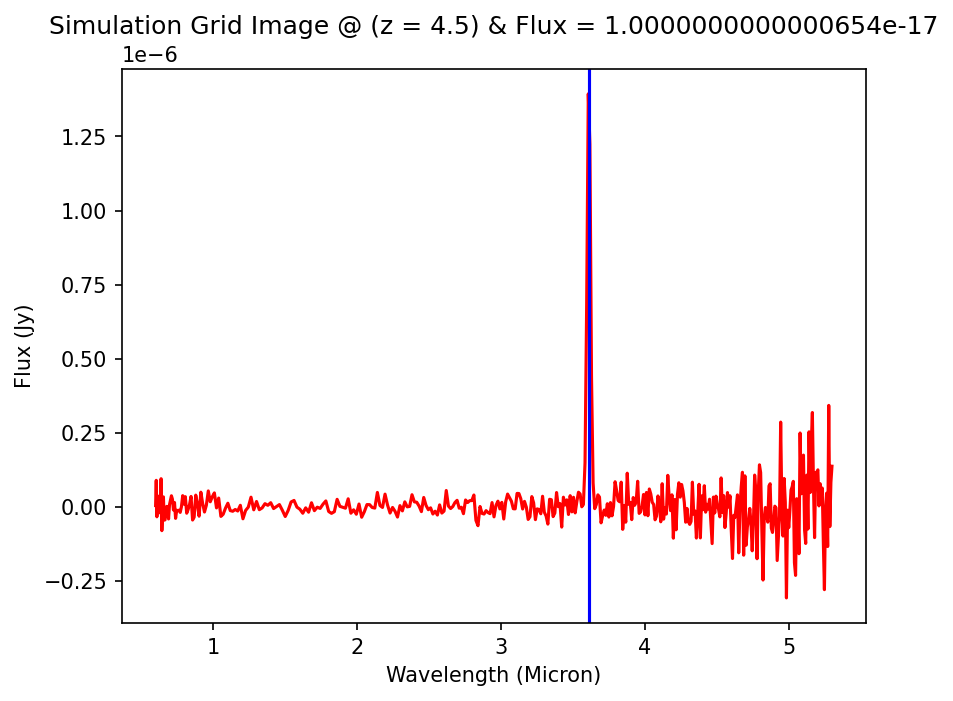

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.2589254117942538e-17
Amp: 2.150329932621512e-19, Mu: 36095.4, Sigma: 23.356349507920527


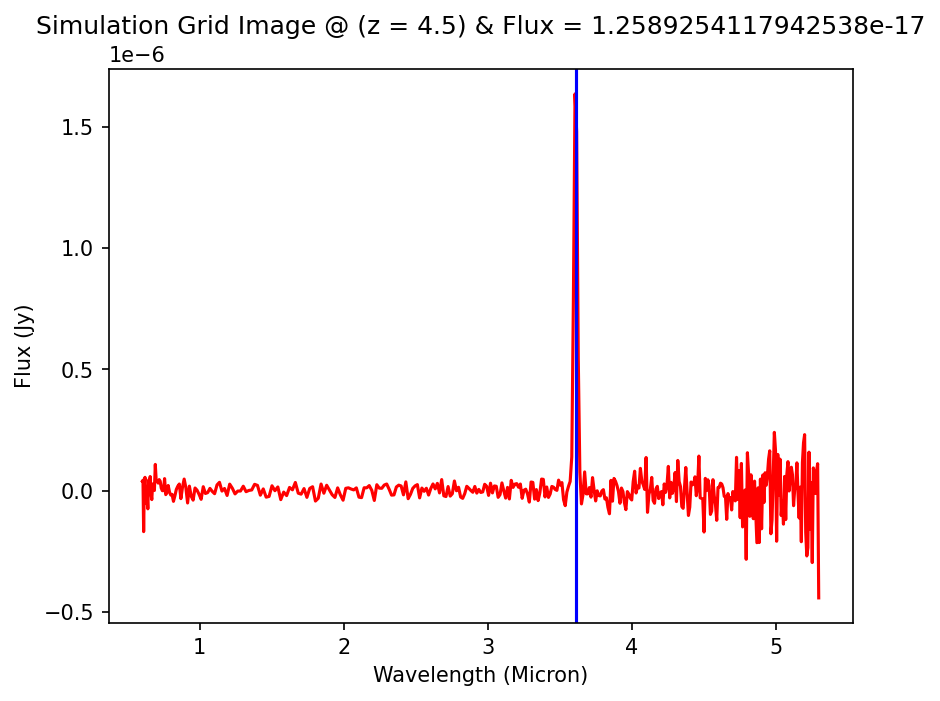

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.5848931924612275e-17
Amp: 2.7071049959188693e-19, Mu: 36095.4, Sigma: 23.356349507920527


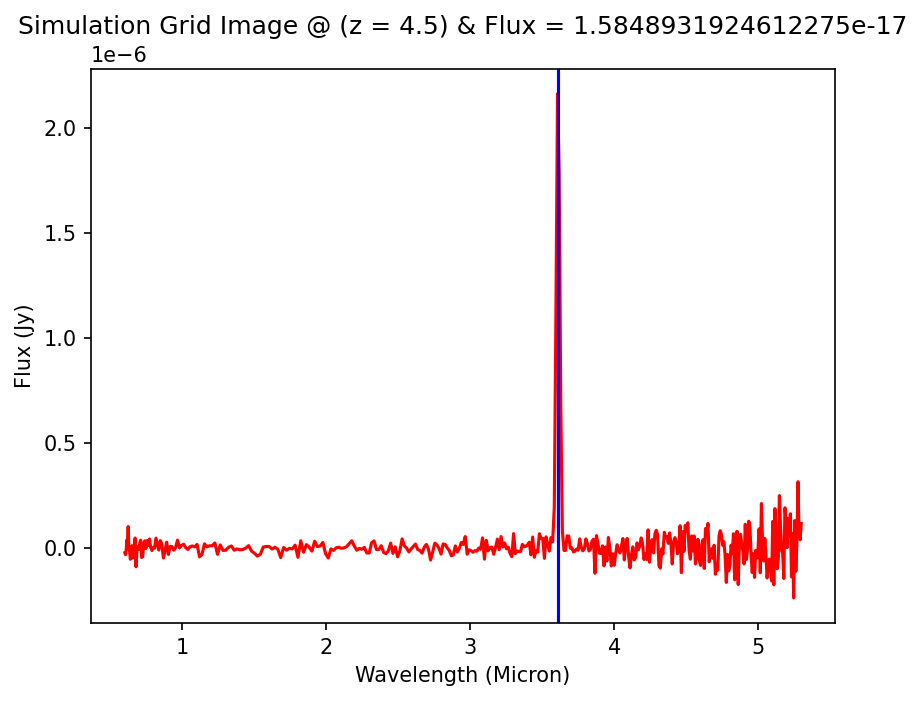

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.9952623149690297e-17
Amp: 3.408043271757221e-19, Mu: 36095.4, Sigma: 23.356349507920527


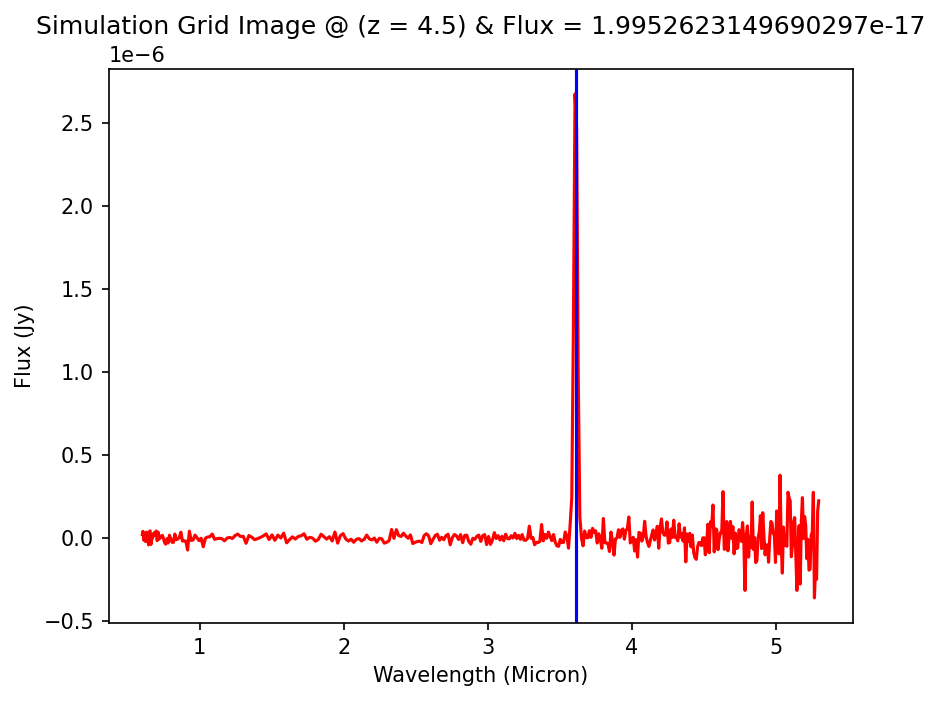

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 2.5118864315097773e-17
Amp: 4.290472279309315e-19, Mu: 36095.4, Sigma: 23.356349507920527


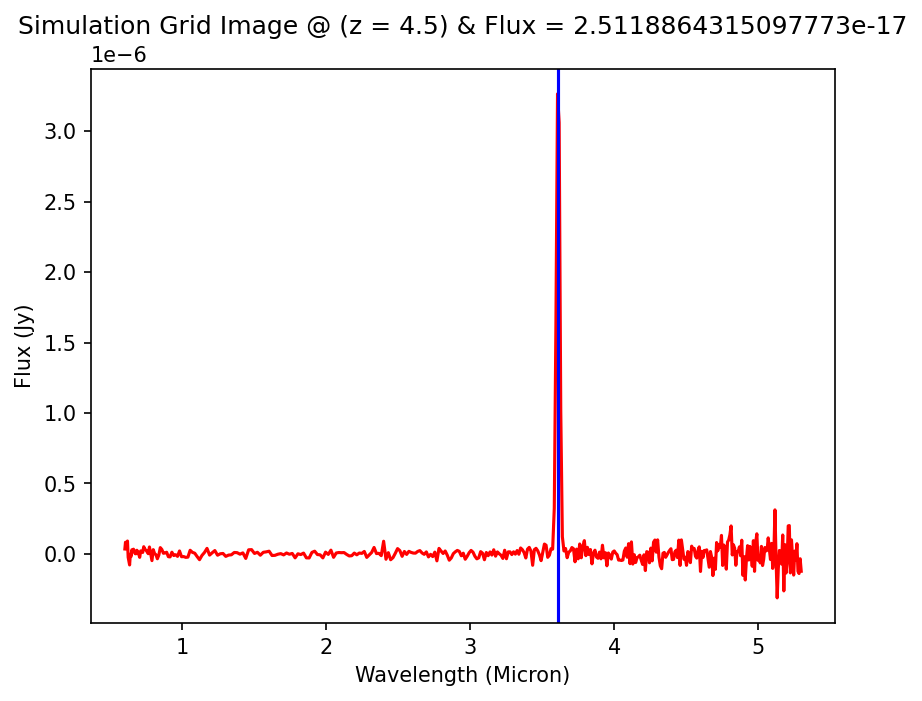

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 3.162277660168638e-17
Amp: 5.401384581020956e-19, Mu: 36095.4, Sigma: 23.356349507920527


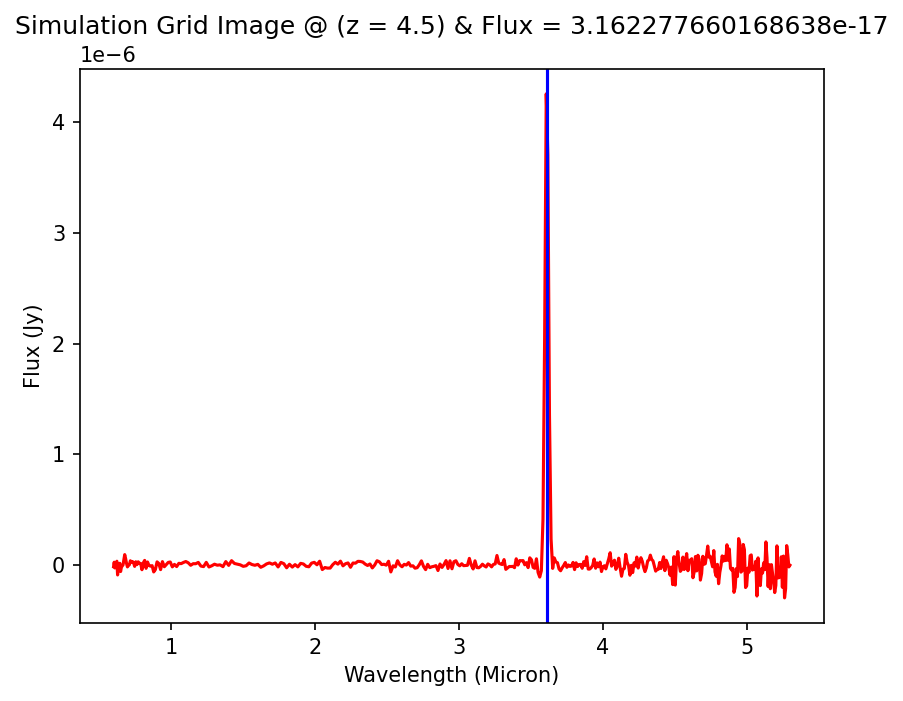

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 3.981071705535311e-17
Amp: 6.799940307920494e-19, Mu: 36095.4, Sigma: 23.356349507920527


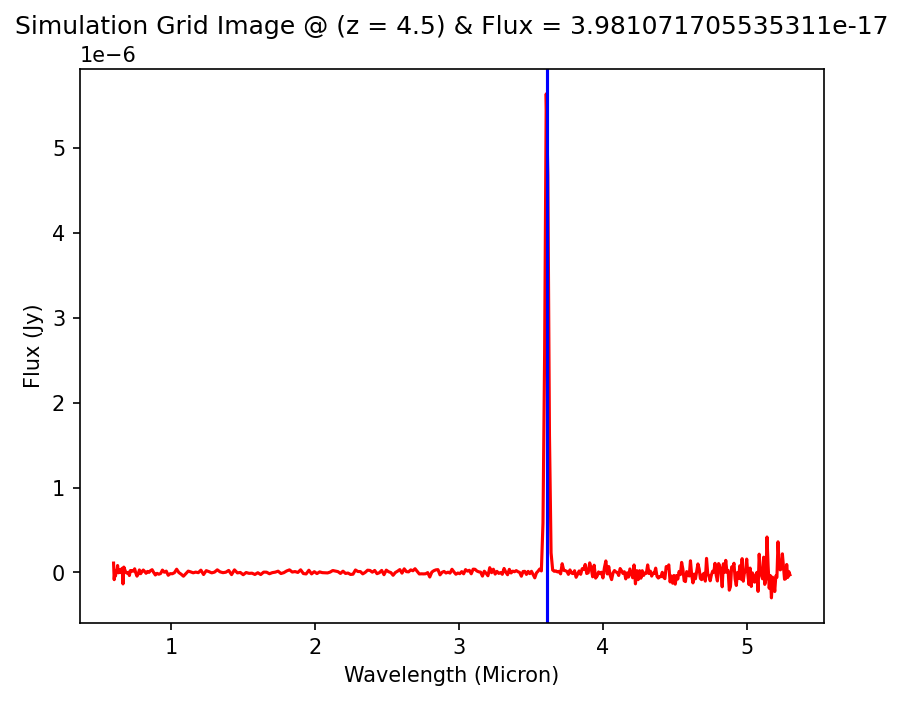

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 5.0118723362731656e-17
Amp: 8.560617652324593e-19, Mu: 36095.4, Sigma: 23.356349507920527


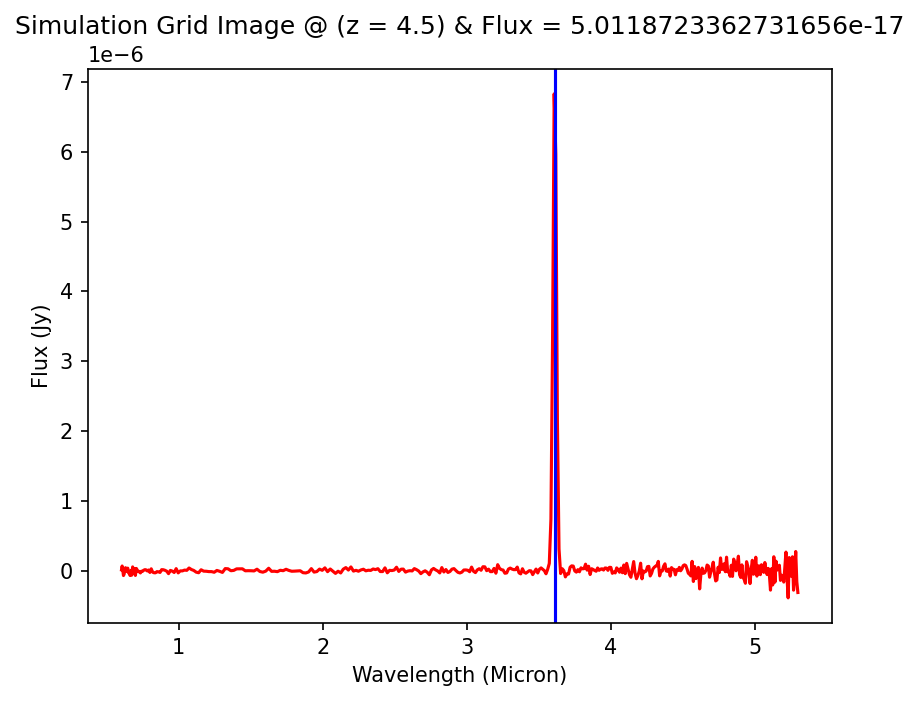

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 6.309573444802511e-17
Amp: 1.077717910316519e-18, Mu: 36095.4, Sigma: 23.356349507920527


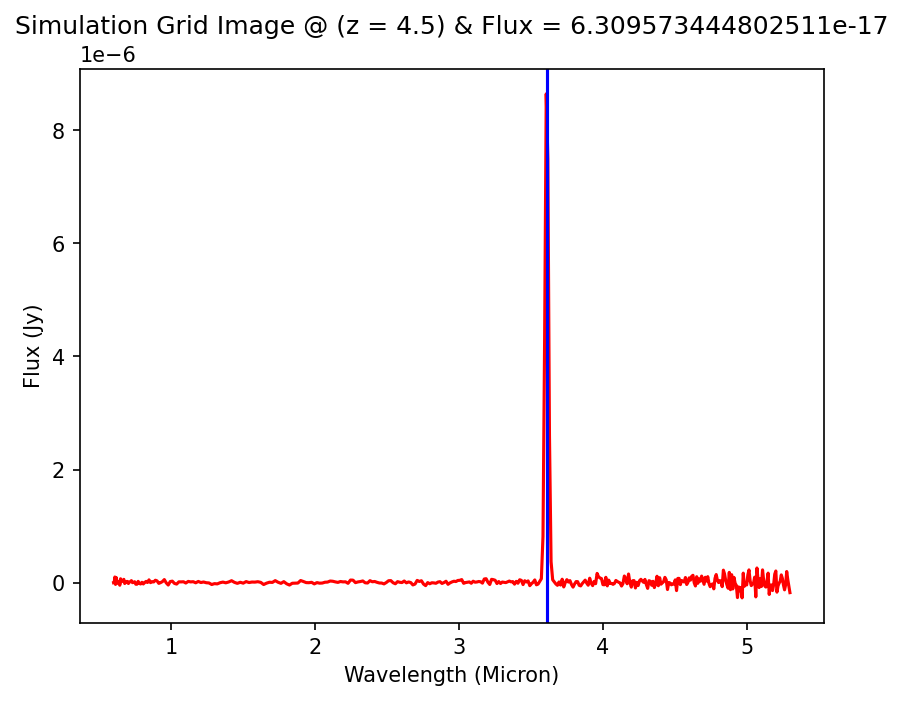

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 7.943282347243569e-17
Amp: 1.3567664640431776e-18, Mu: 36095.4, Sigma: 23.356349507920527


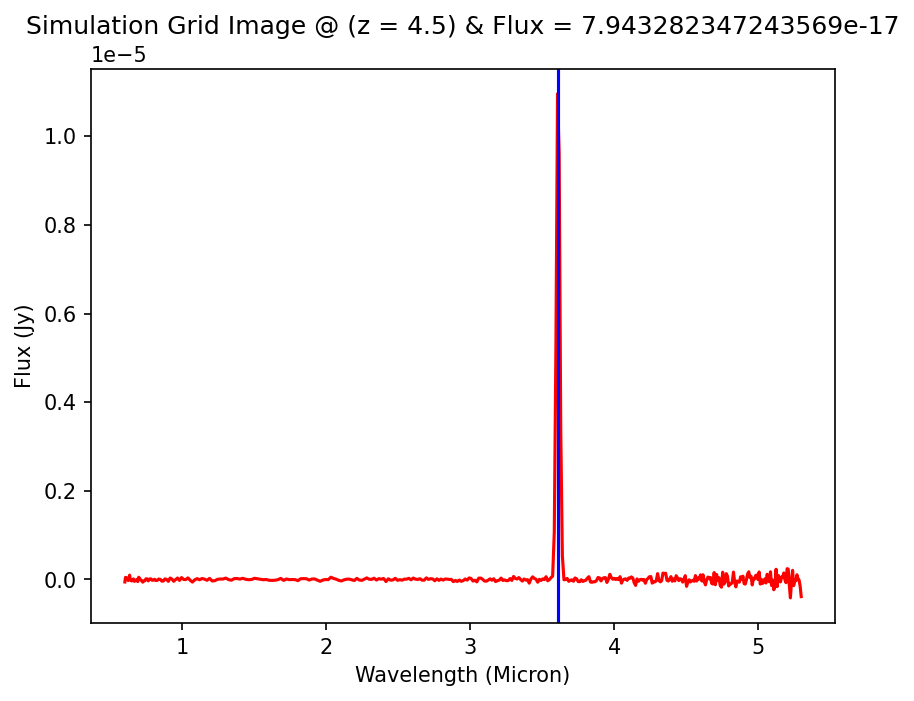

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 4.5, FWHM: 10, Integrated Flux: 1.0000000000000982e-16
Amp: 1.7080677794540792e-18, Mu: 36095.4, Sigma: 23.356349507920527


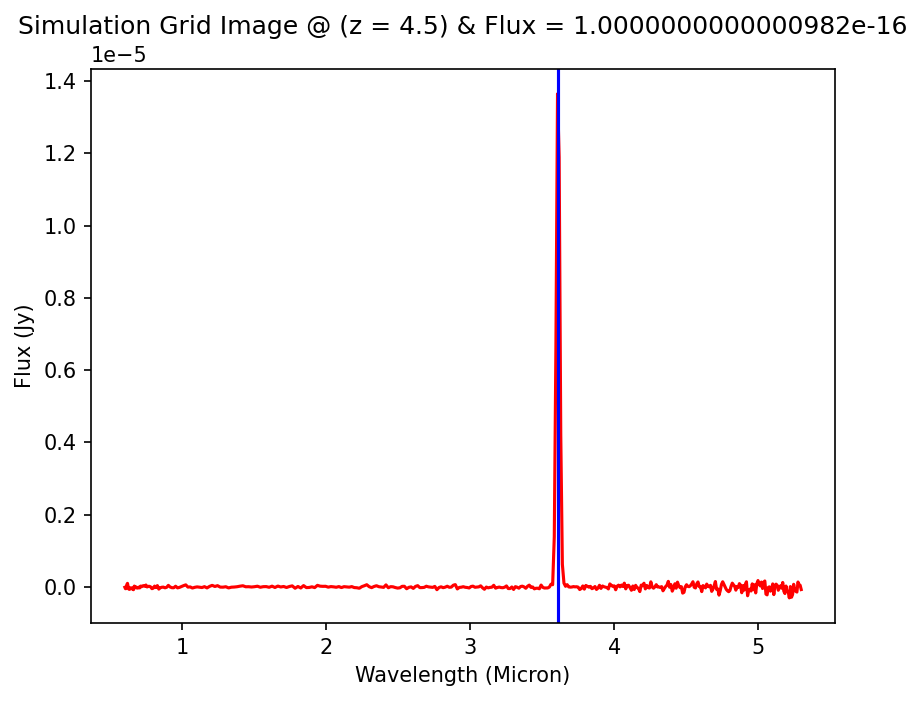

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1e-19
Amp: 1.5657287978327524e-21, Mu: 39376.8, Sigma: 25.479654008640573


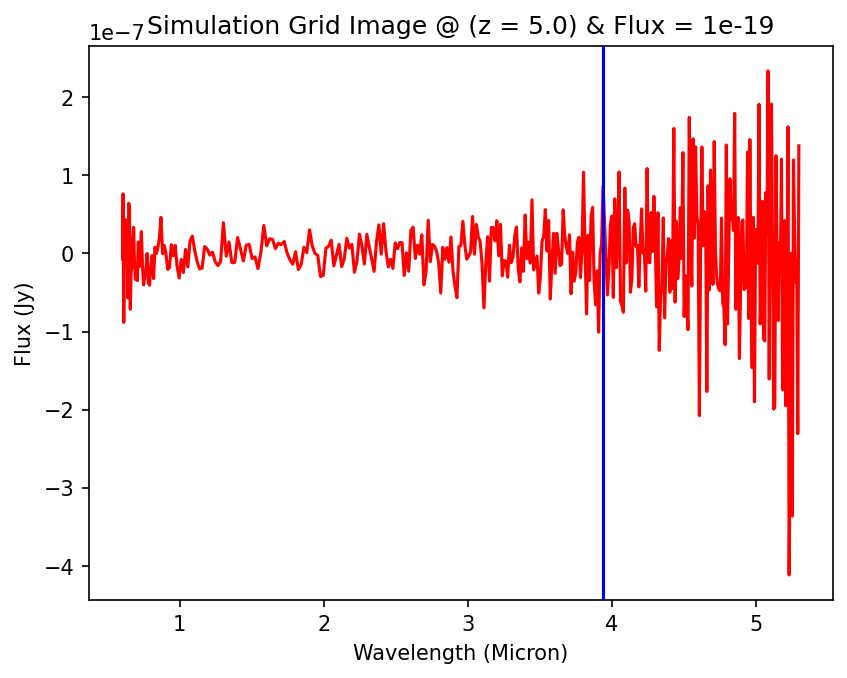

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.2589254117941713e-19
Amp: 1.9711357715695905e-21, Mu: 39376.8, Sigma: 25.479654008640573


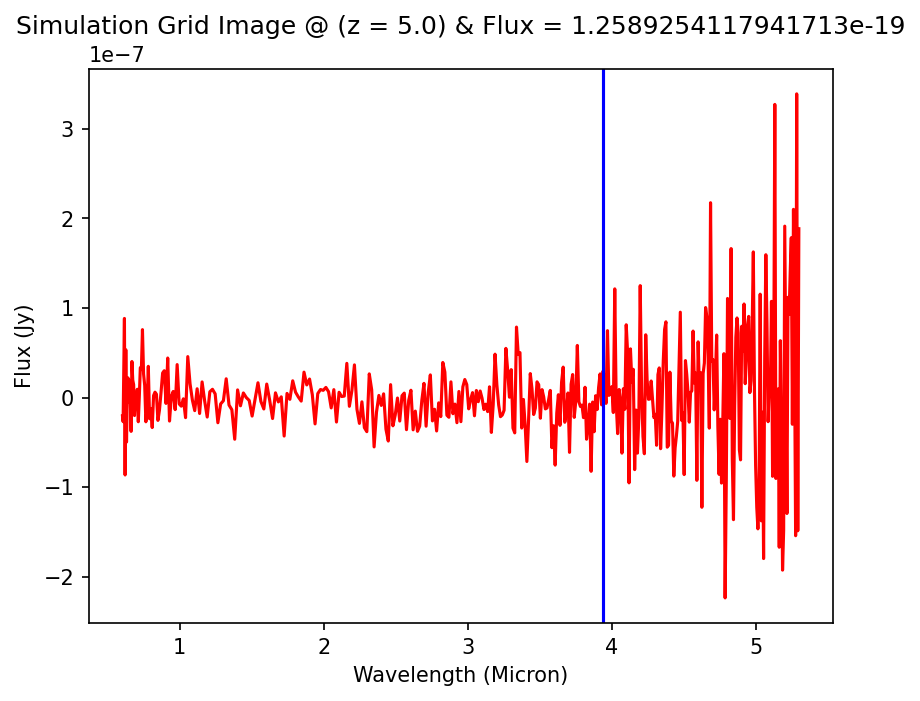

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.584893192461124e-19
Amp: 2.4815129129254685e-21, Mu: 39376.8, Sigma: 25.479654008640573


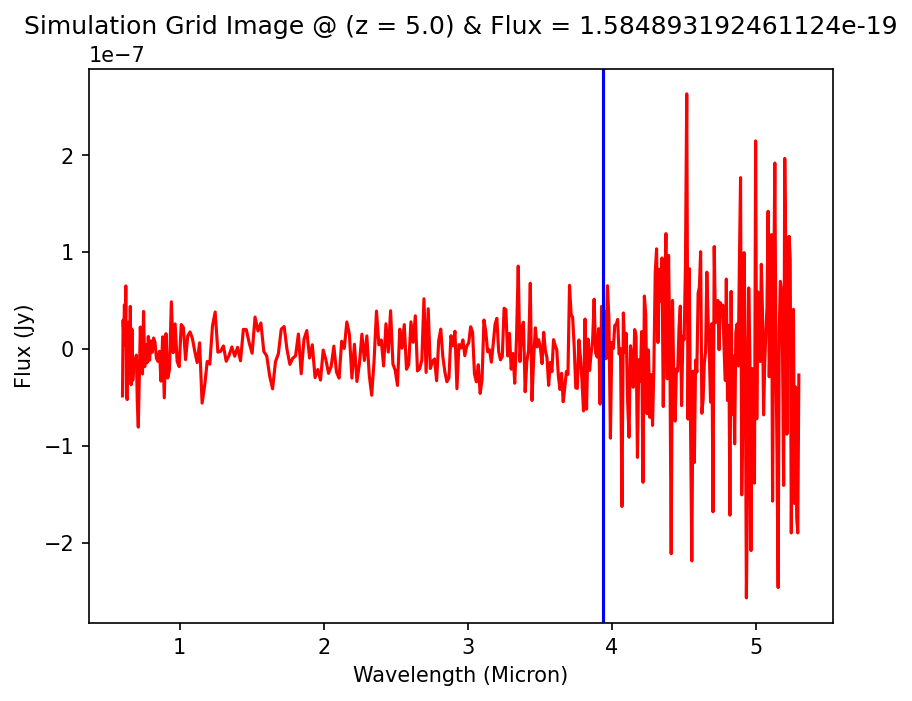

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.995262314968899e-19
Amp: 3.124039665777249e-21, Mu: 39376.8, Sigma: 25.479654008640573


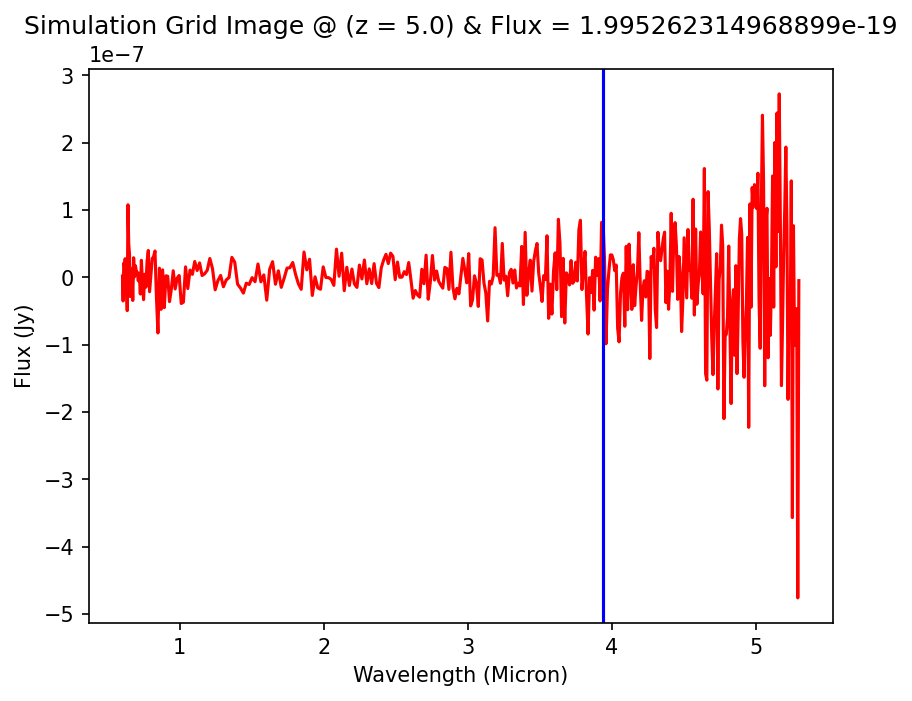

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 2.511886431509613e-19
Amp: 3.9329329226999485e-21, Mu: 39376.8, Sigma: 25.479654008640573


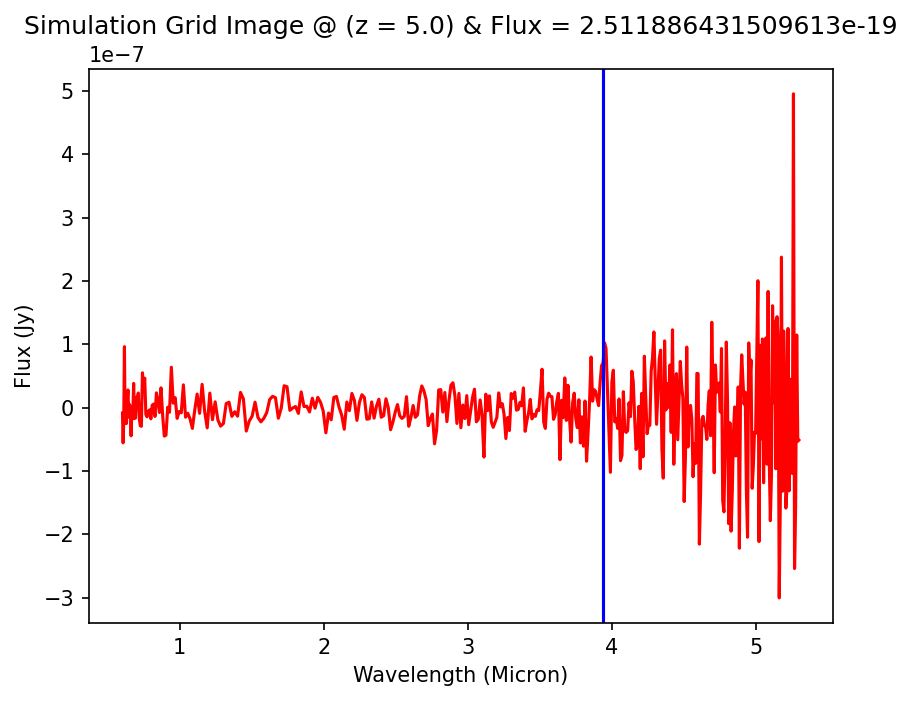

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 3.162277660168431e-19
Amp: 4.951269199268887e-21, Mu: 39376.8, Sigma: 25.479654008640573


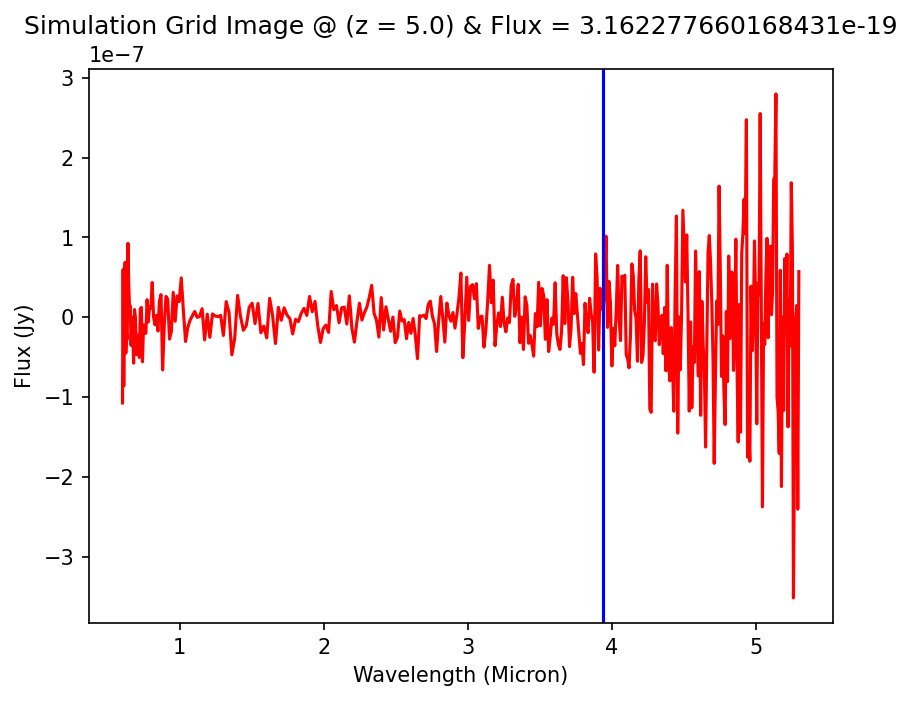

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 3.981071705535051e-19
Amp: 6.23327861559338e-21, Mu: 39376.8, Sigma: 25.479654008640573


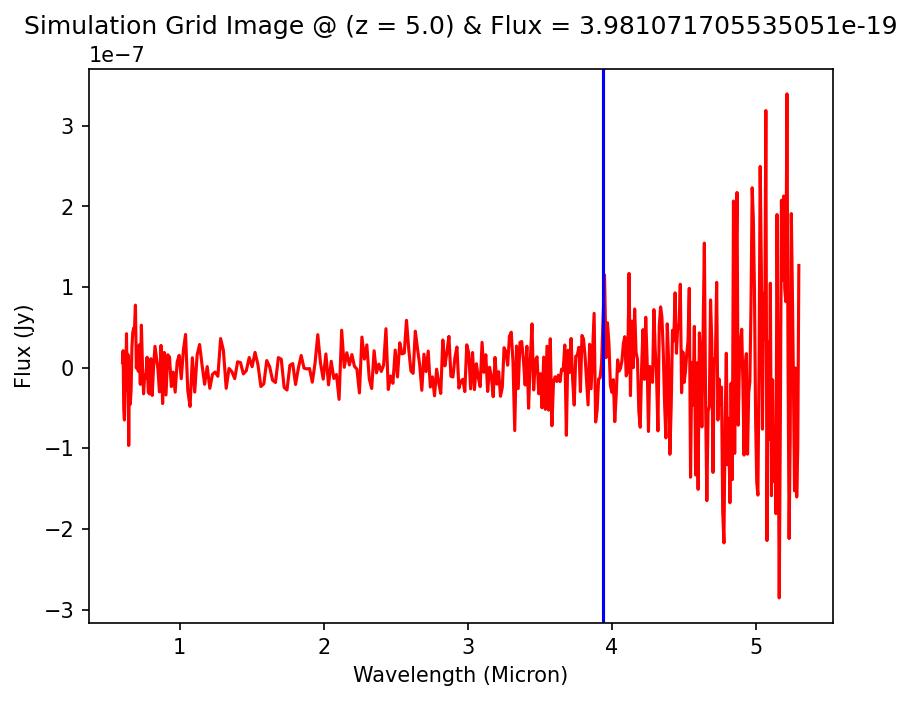

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 5.011872336272837e-19
Amp: 7.847232847963698e-21, Mu: 39376.8, Sigma: 25.479654008640573


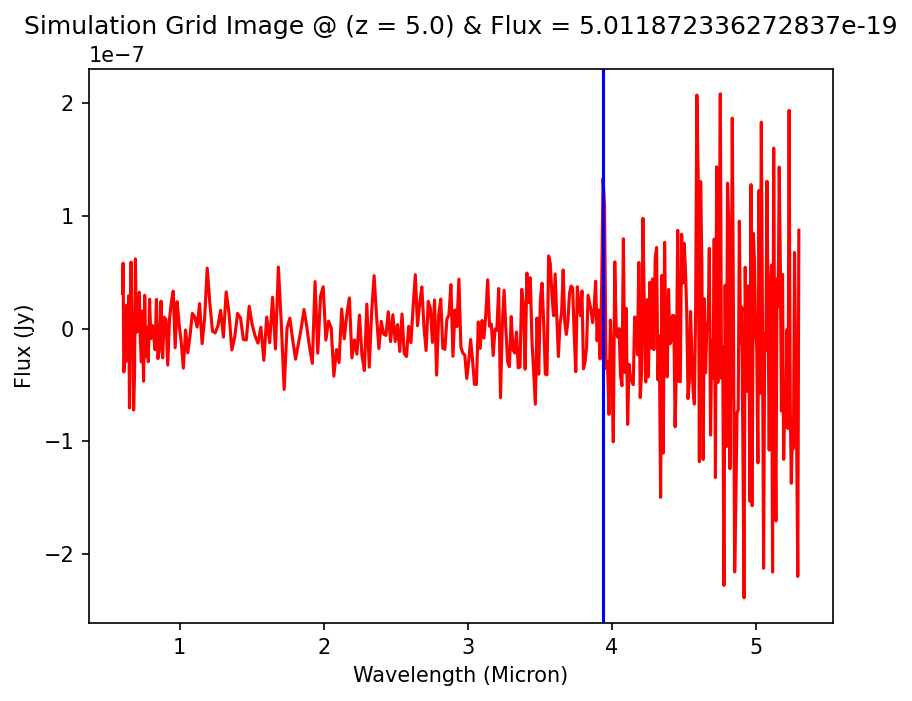

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 6.309573444802097e-19
Amp: 9.879080844567446e-21, Mu: 39376.8, Sigma: 25.479654008640573


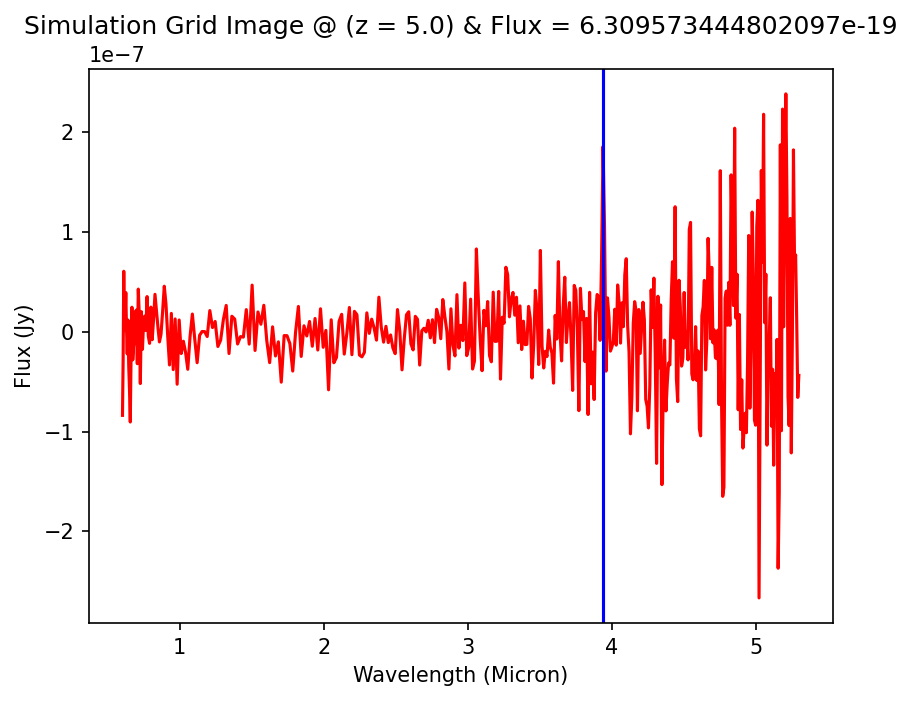

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 7.943282347243049e-19
Amp: 1.2437025920394983e-20, Mu: 39376.8, Sigma: 25.479654008640573


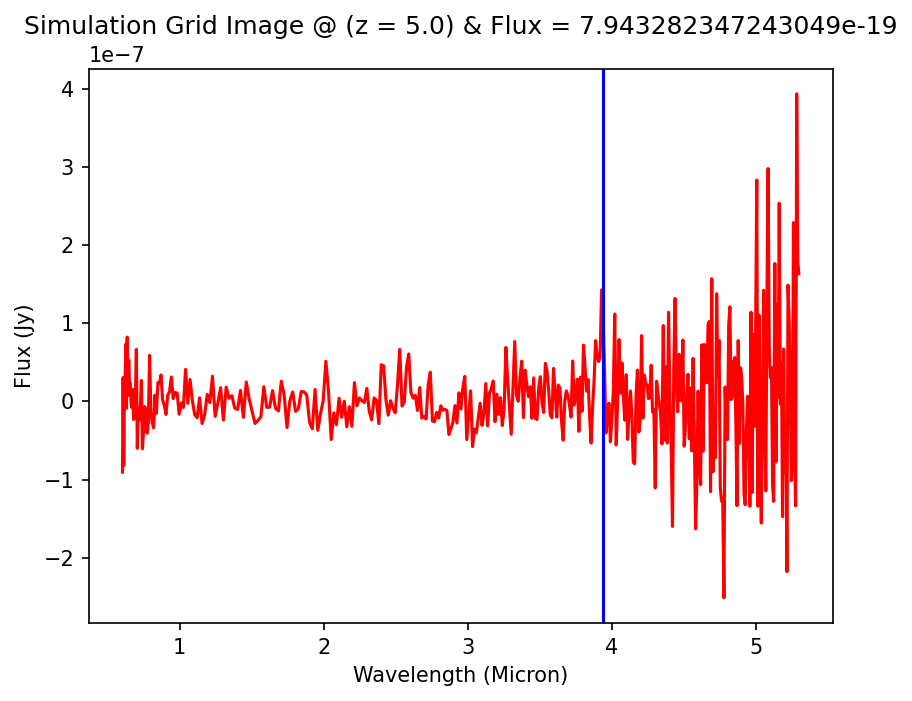

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.0000000000000328e-18
Amp: 1.565728797832804e-20, Mu: 39376.8, Sigma: 25.479654008640573


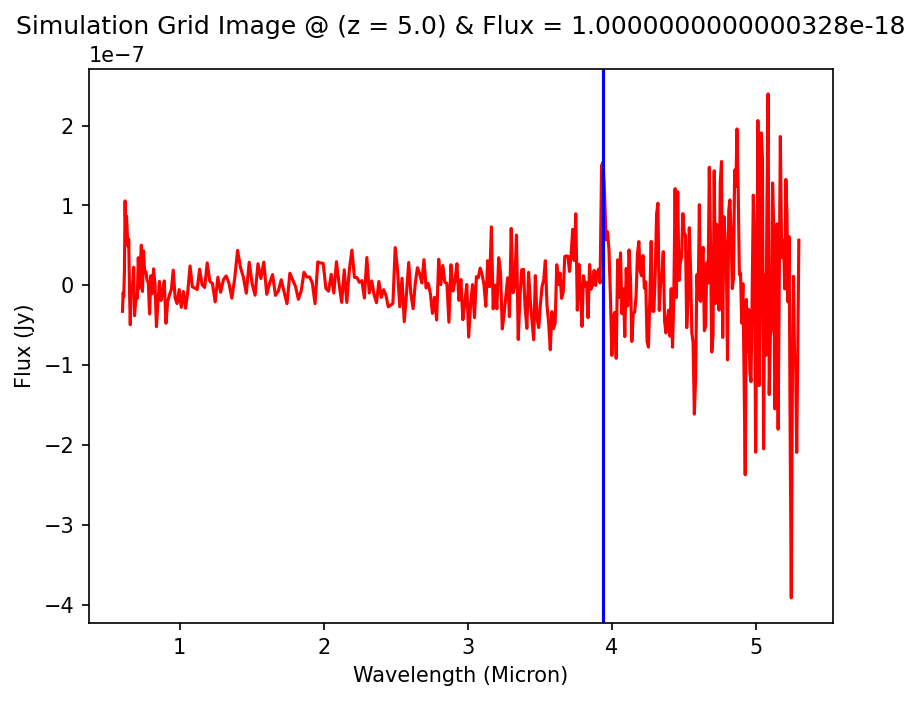

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.2589254117942125e-18
Amp: 1.971135771569655e-20, Mu: 39376.8, Sigma: 25.479654008640573


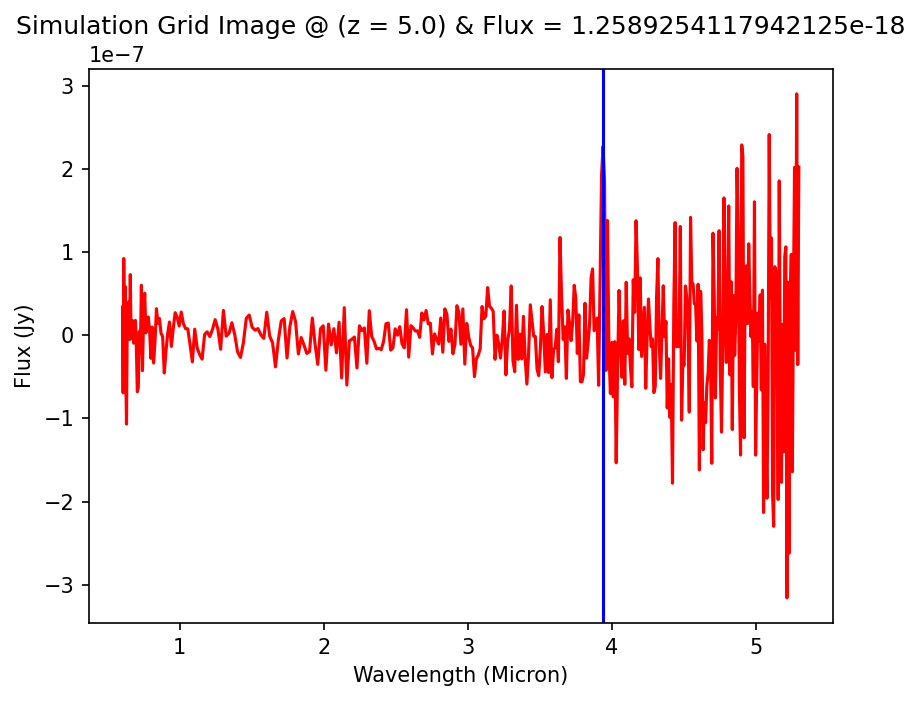

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.5848931924611758e-18
Amp: 2.48151291292555e-20, Mu: 39376.8, Sigma: 25.479654008640573


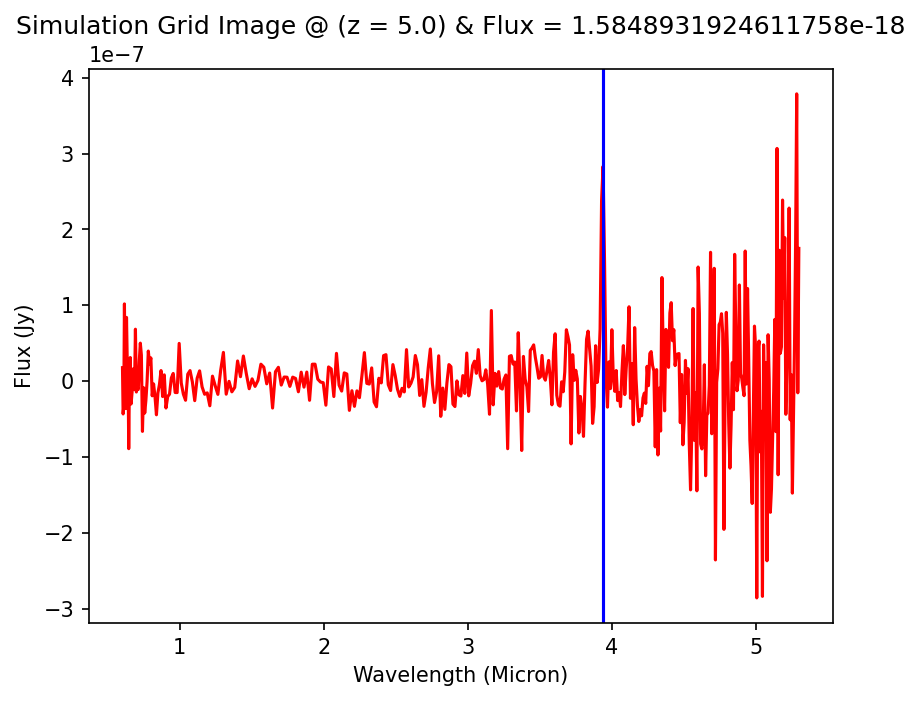

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.9952623149689645e-18
Amp: 3.1240396657773514e-20, Mu: 39376.8, Sigma: 25.479654008640573


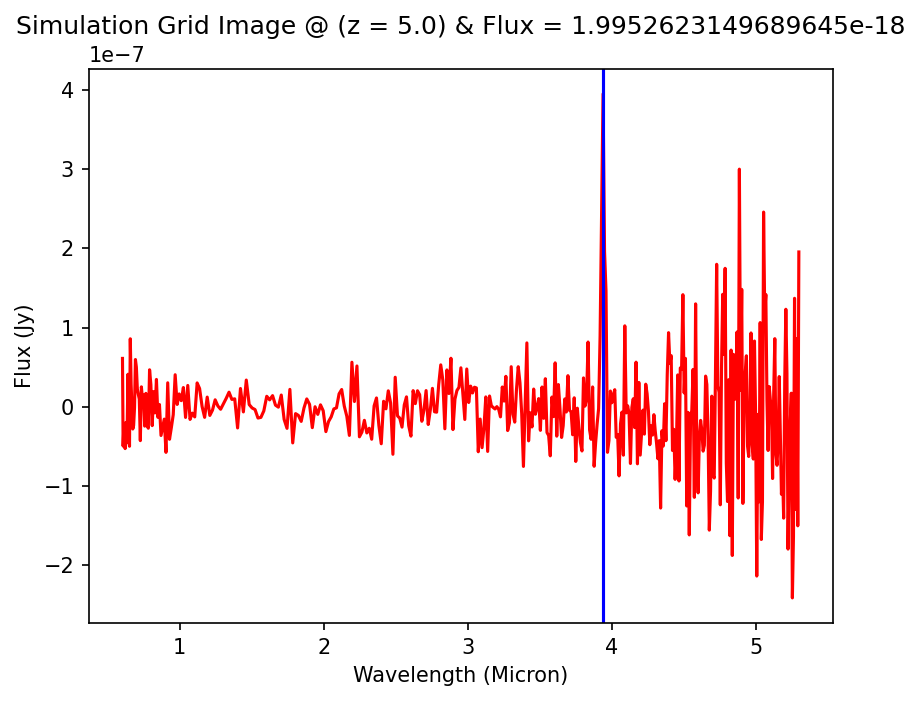

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 2.511886431509695e-18
Amp: 3.932932922700077e-20, Mu: 39376.8, Sigma: 25.479654008640573


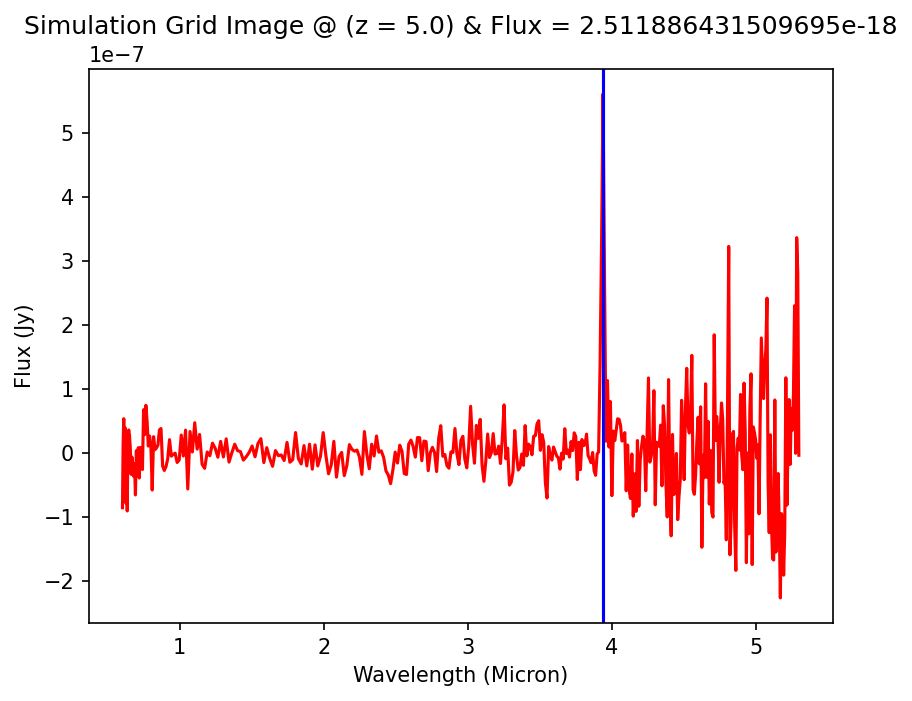

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 3.1622776601685347e-18
Amp: 4.951269199269049e-20, Mu: 39376.8, Sigma: 25.479654008640573


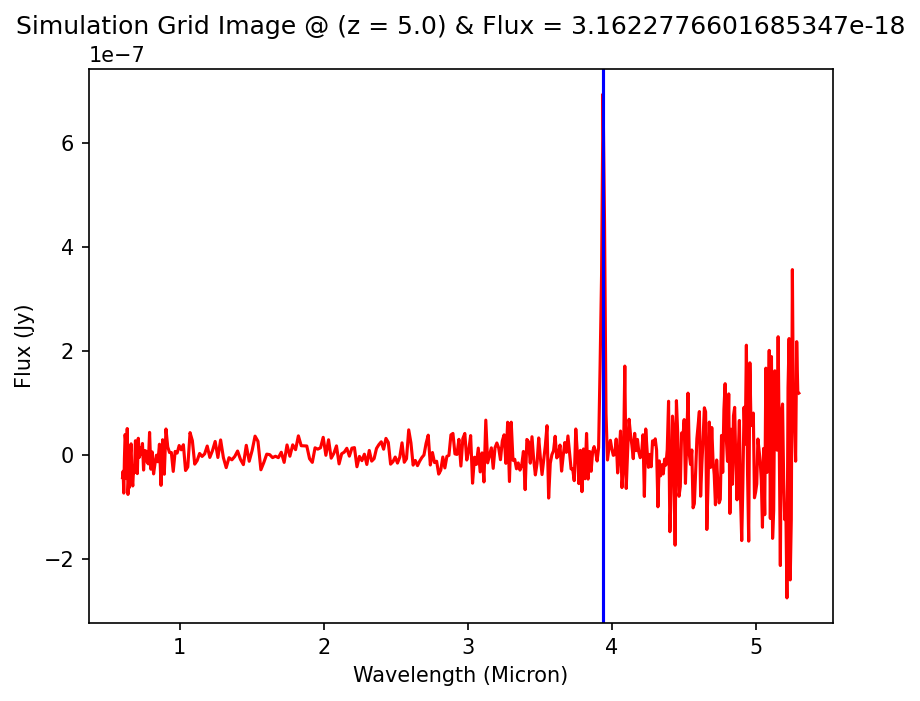

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 3.981071705535181e-18
Amp: 6.233278615593584e-20, Mu: 39376.8, Sigma: 25.479654008640573


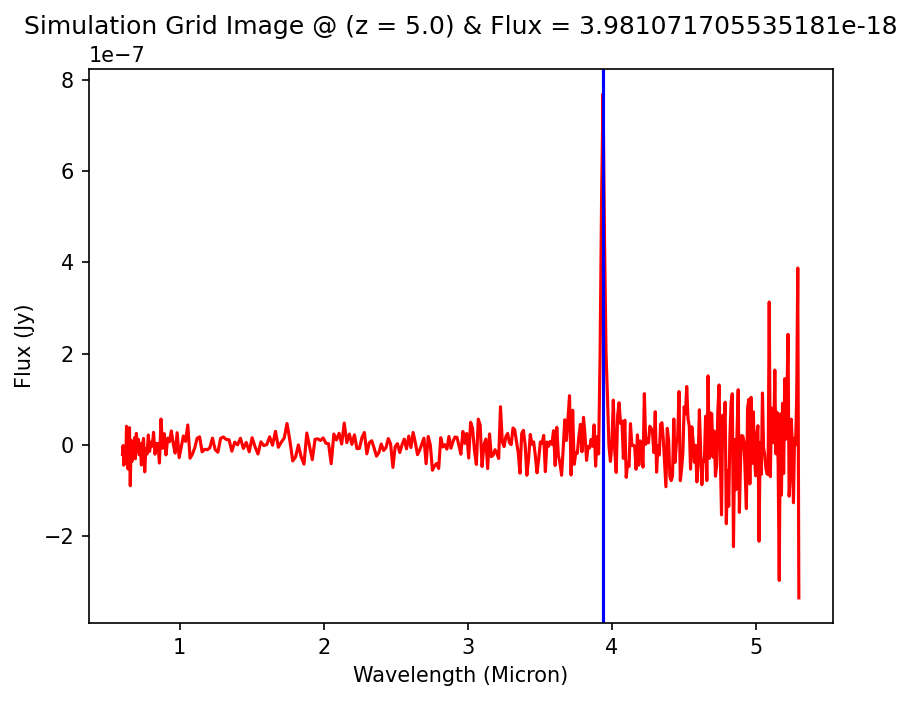

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 5.011872336273001e-18
Amp: 7.847232847963955e-20, Mu: 39376.8, Sigma: 25.479654008640573


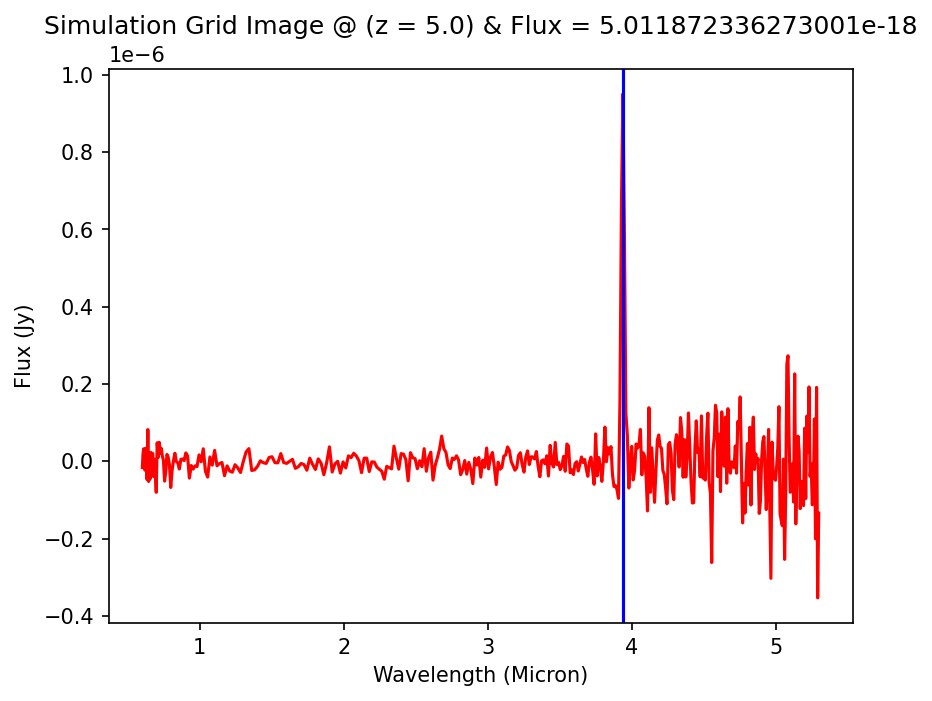

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 6.3095734448023044e-18
Amp: 9.87908084456777e-20, Mu: 39376.8, Sigma: 25.479654008640573


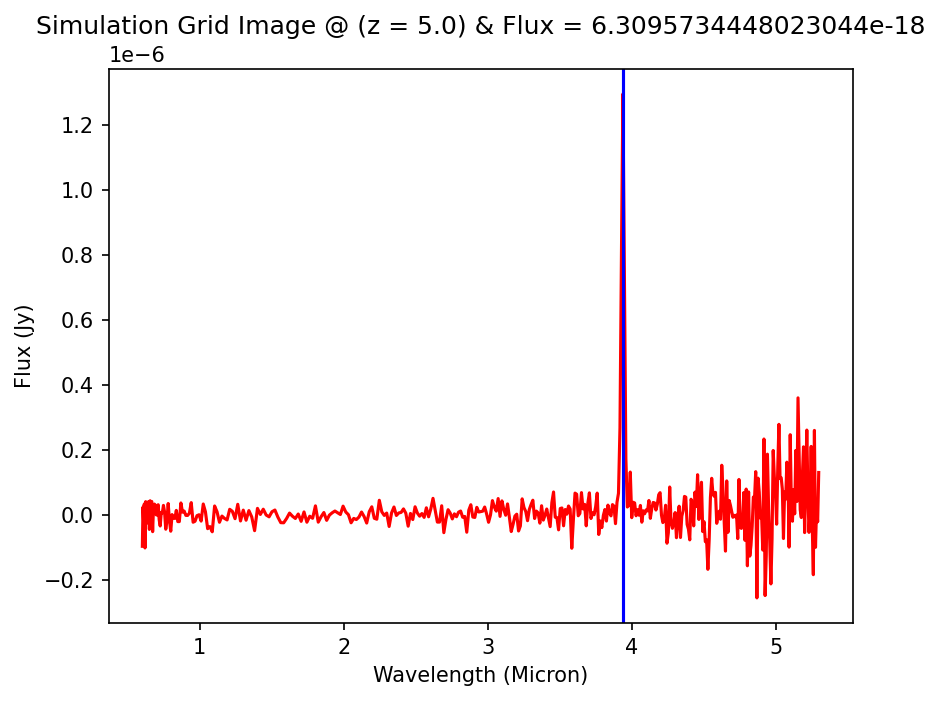

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 7.943282347243309e-18
Amp: 1.2437025920395389e-19, Mu: 39376.8, Sigma: 25.479654008640573


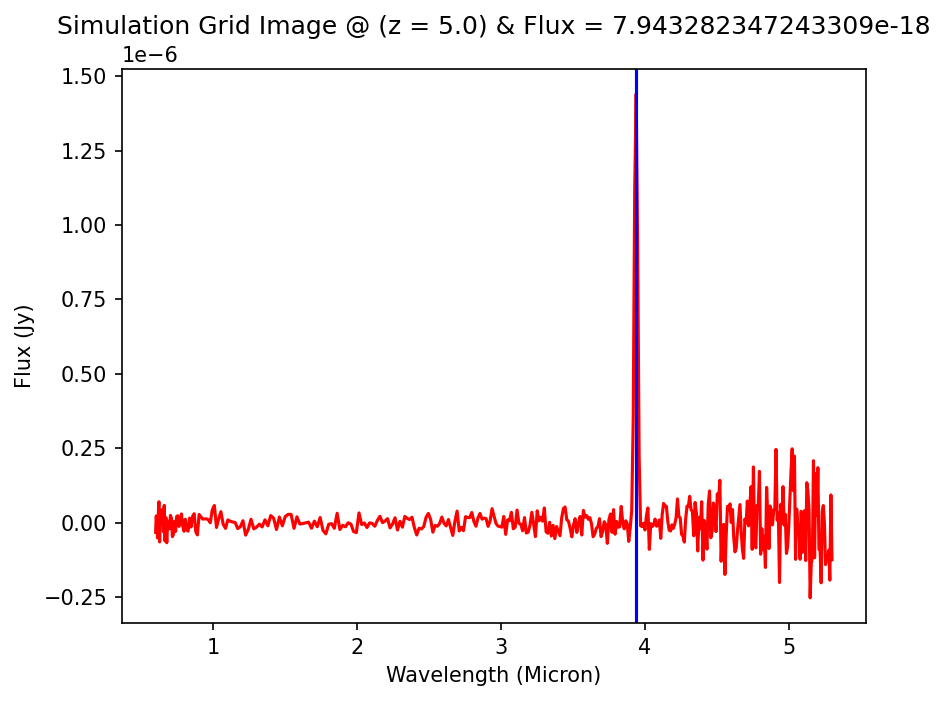

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.0000000000000654e-17
Amp: 1.5657287978328547e-19, Mu: 39376.8, Sigma: 25.479654008640573


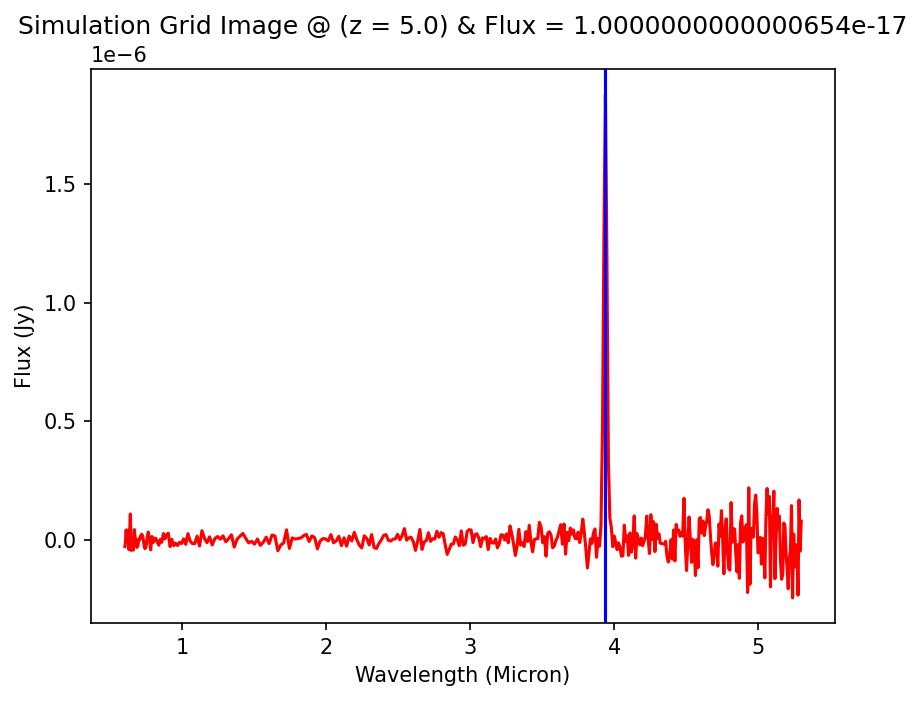

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.2589254117942538e-17
Amp: 1.9711357715697196e-19, Mu: 39376.8, Sigma: 25.479654008640573


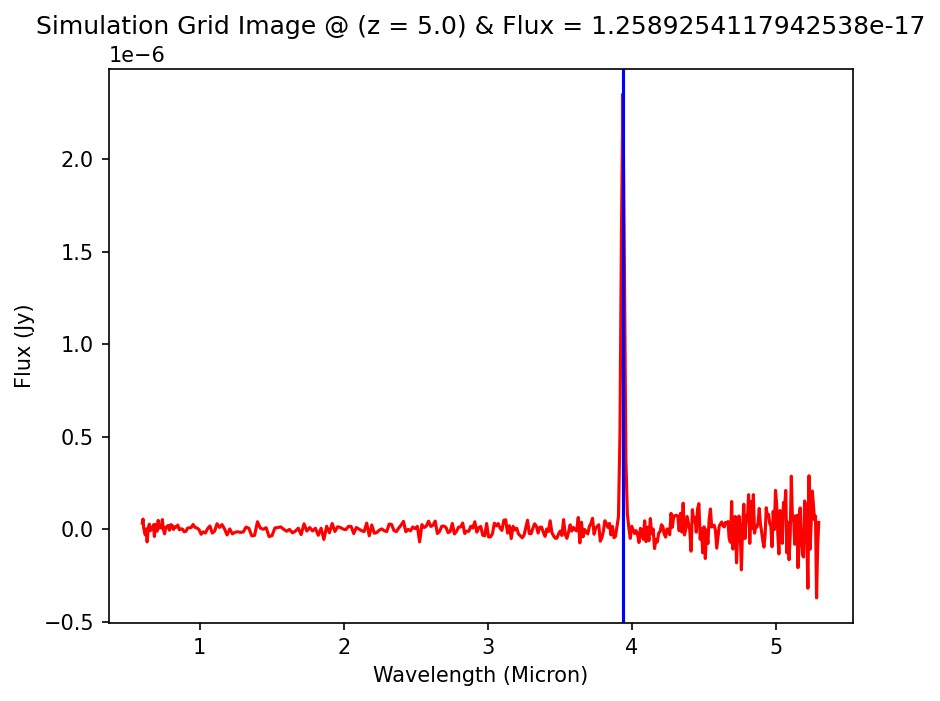

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.5848931924612275e-17
Amp: 2.481512912925631e-19, Mu: 39376.8, Sigma: 25.479654008640573


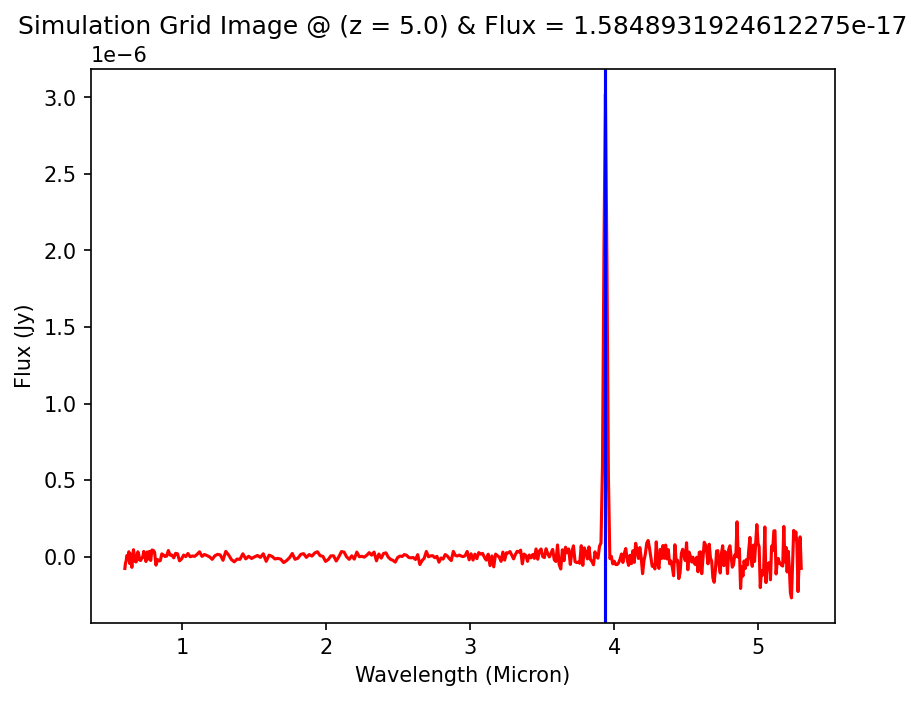

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.9952623149690297e-17
Amp: 3.1240396657774536e-19, Mu: 39376.8, Sigma: 25.479654008640573


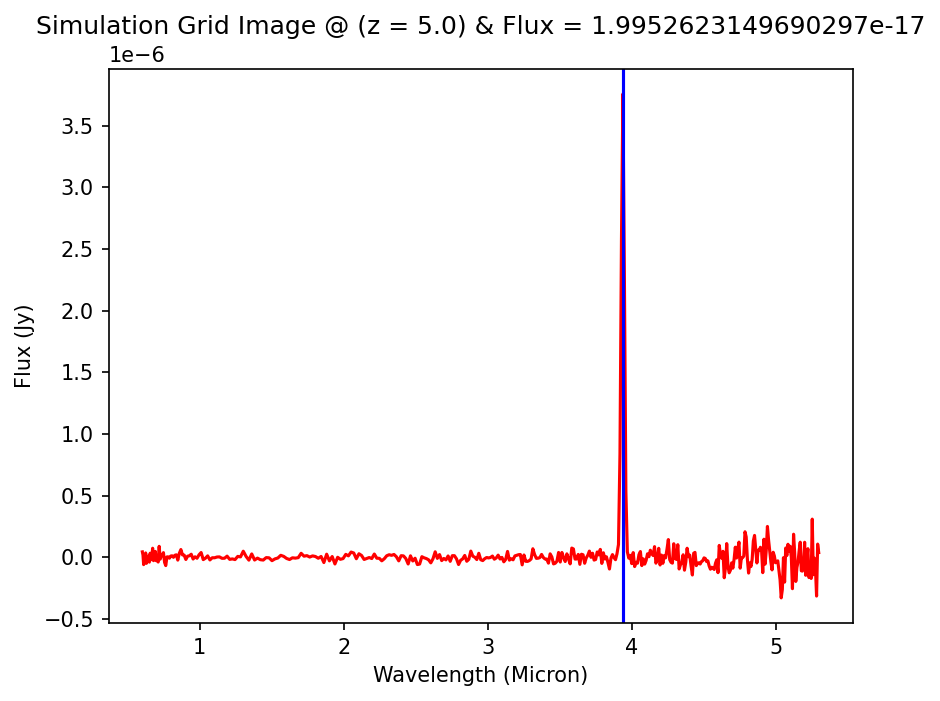

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 2.5118864315097773e-17
Amp: 3.932932922700206e-19, Mu: 39376.8, Sigma: 25.479654008640573


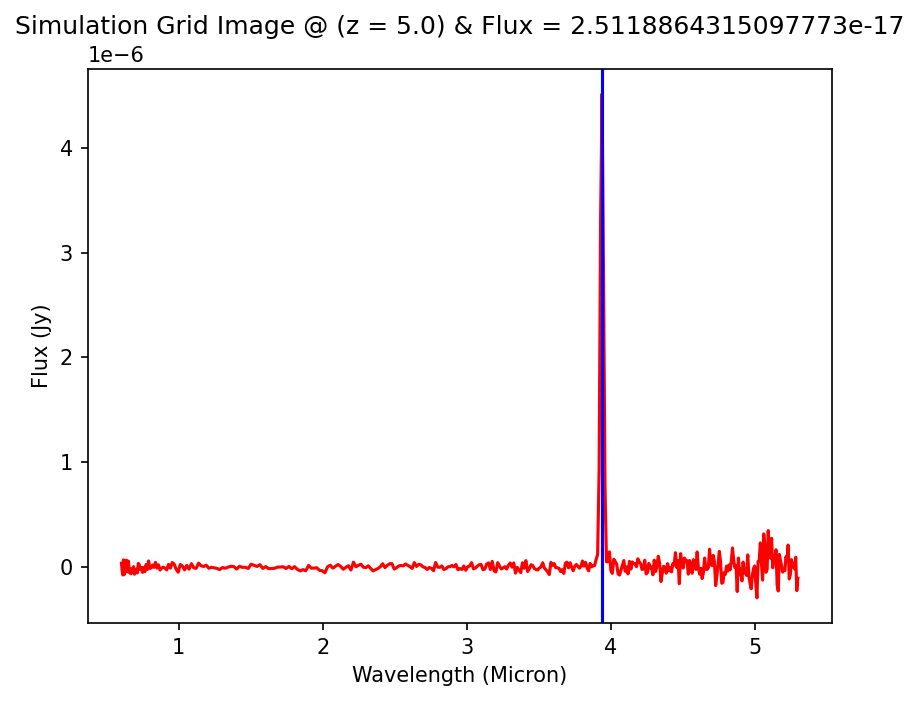

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 3.162277660168638e-17
Amp: 4.95126919926921e-19, Mu: 39376.8, Sigma: 25.479654008640573


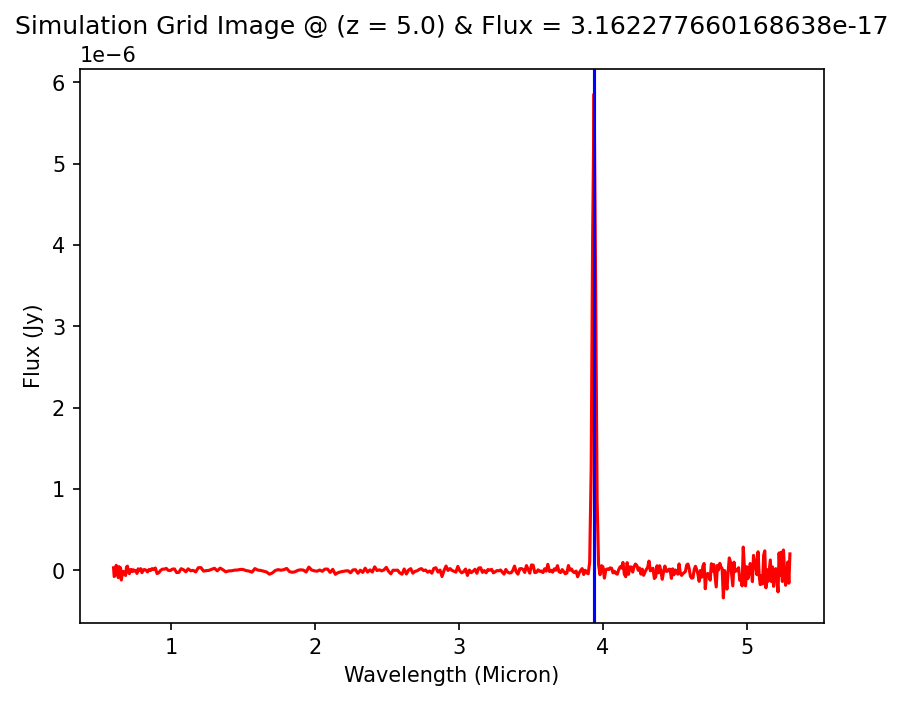

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 3.981071705535311e-17
Amp: 6.233278615593787e-19, Mu: 39376.8, Sigma: 25.479654008640573


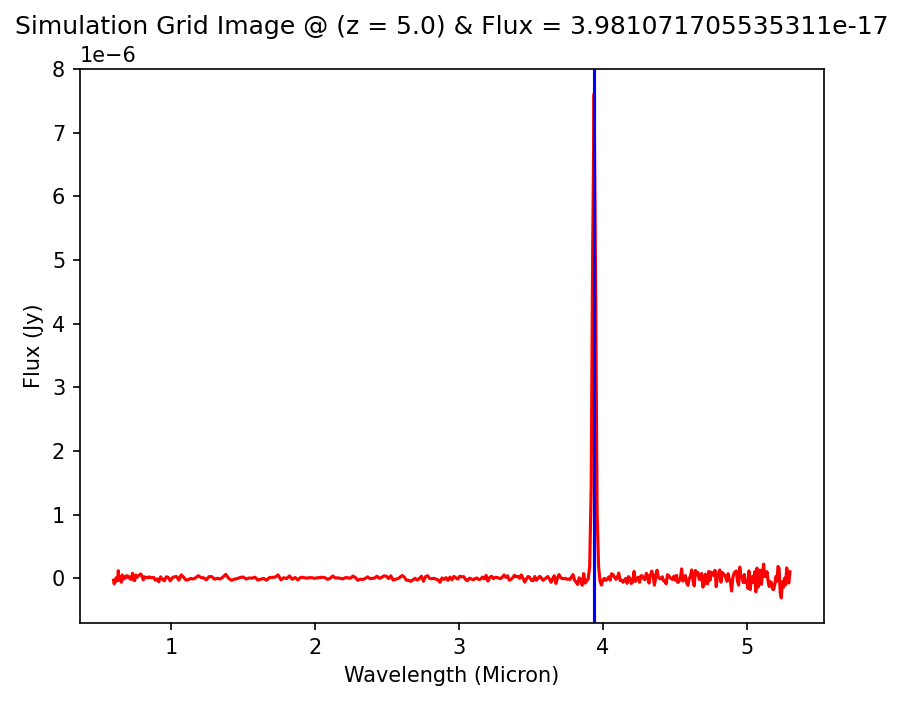

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 5.0118723362731656e-17
Amp: 7.847232847964212e-19, Mu: 39376.8, Sigma: 25.479654008640573


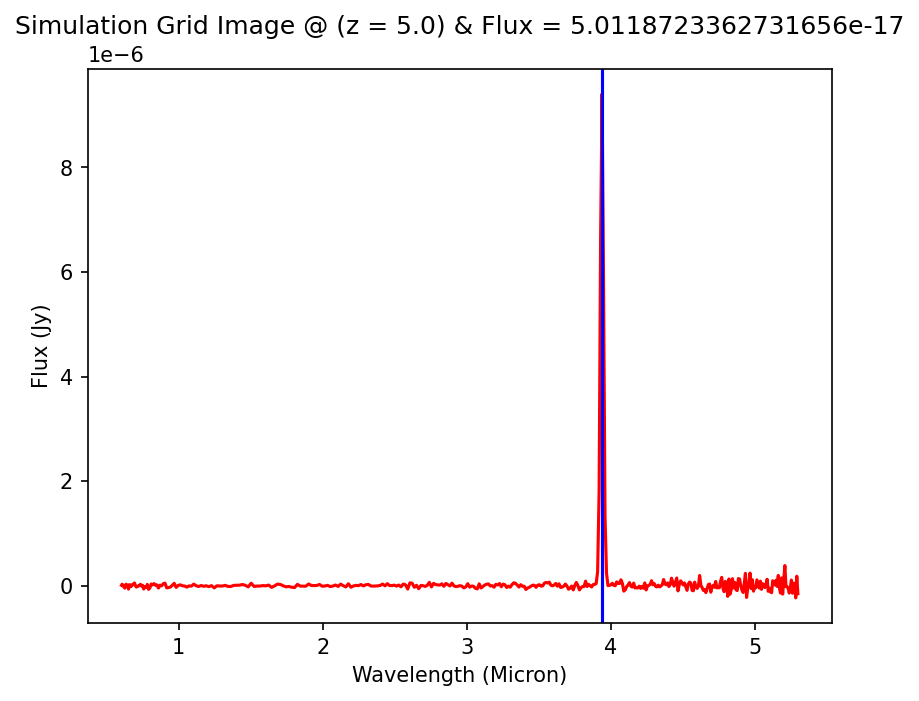

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 6.309573444802511e-17
Amp: 9.879080844568093e-19, Mu: 39376.8, Sigma: 25.479654008640573


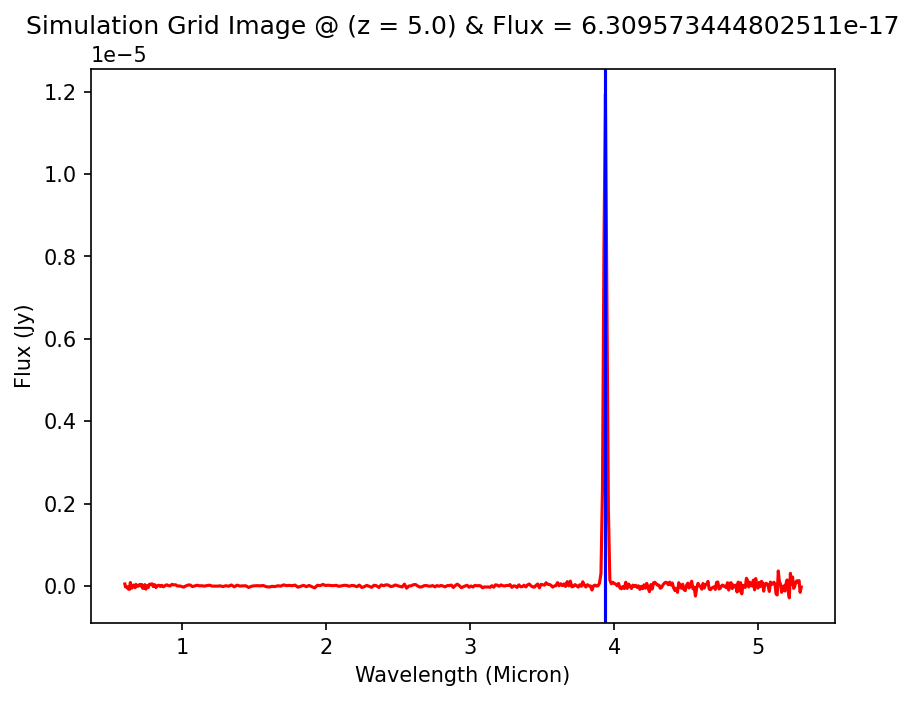

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 7.943282347243569e-17
Amp: 1.2437025920395797e-18, Mu: 39376.8, Sigma: 25.479654008640573


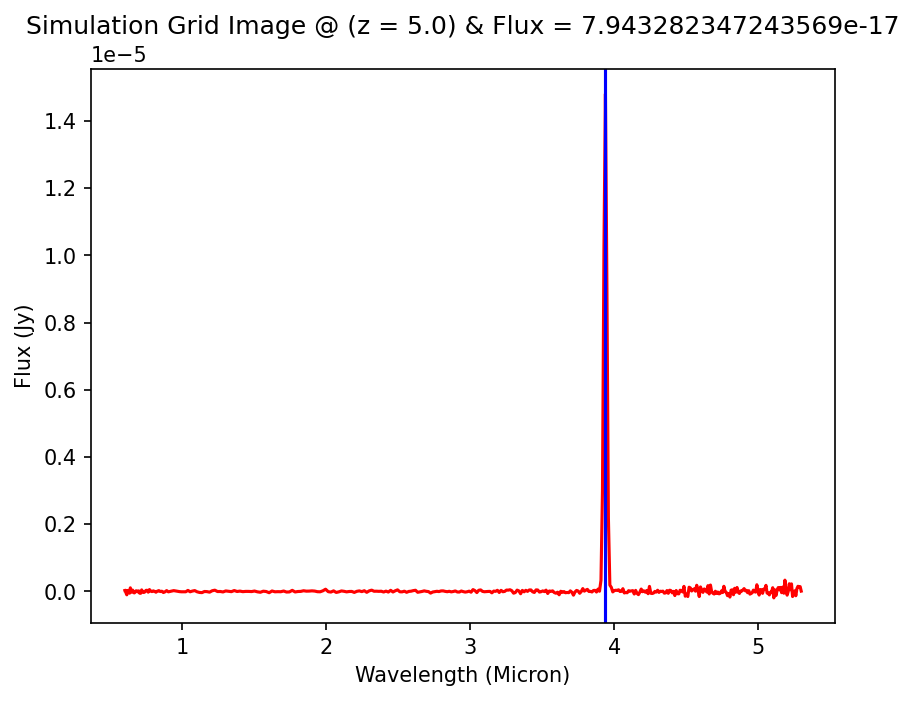

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.0, FWHM: 10, Integrated Flux: 1.0000000000000982e-16
Amp: 1.5657287978329062e-18, Mu: 39376.8, Sigma: 25.479654008640573


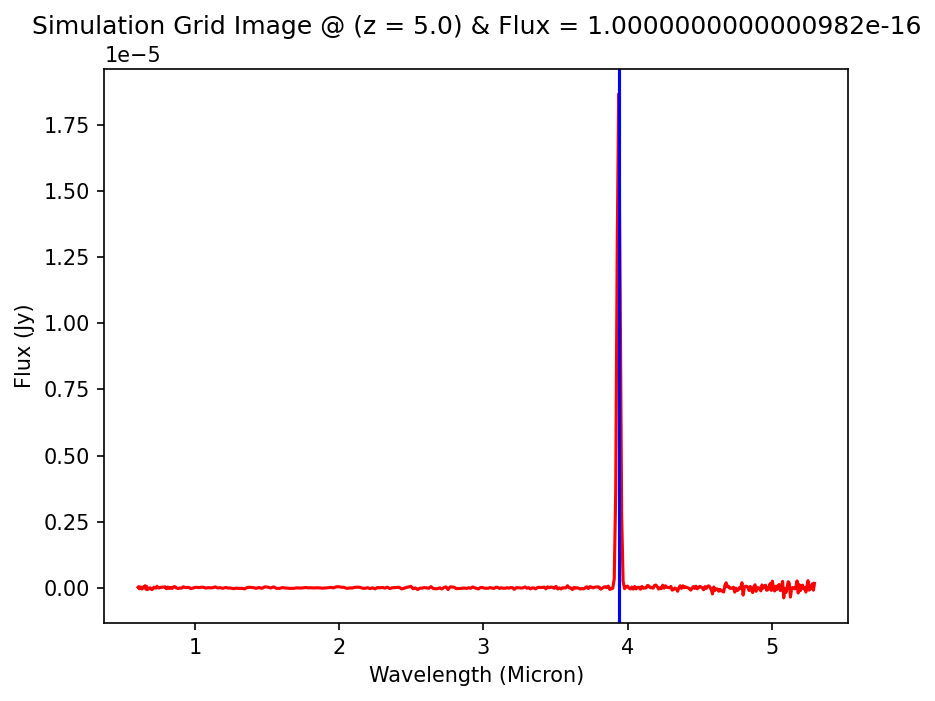

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1e-19
Amp: 1.4452881210763866e-21, Mu: 42658.200000000004, Sigma: 27.60295850936062


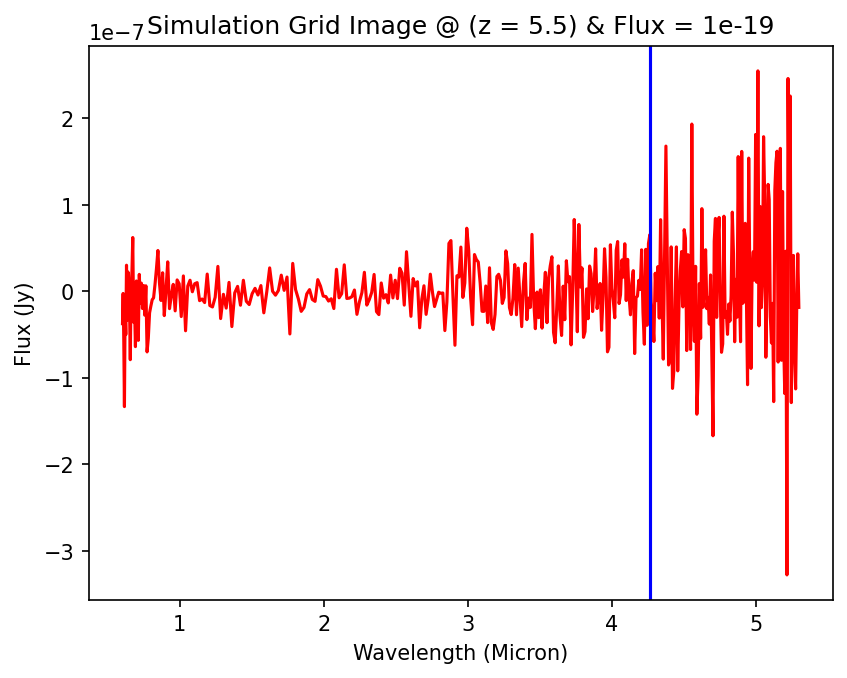

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.2589254117941713e-19
Amp: 1.8195099429873144e-21, Mu: 42658.200000000004, Sigma: 27.60295850936062


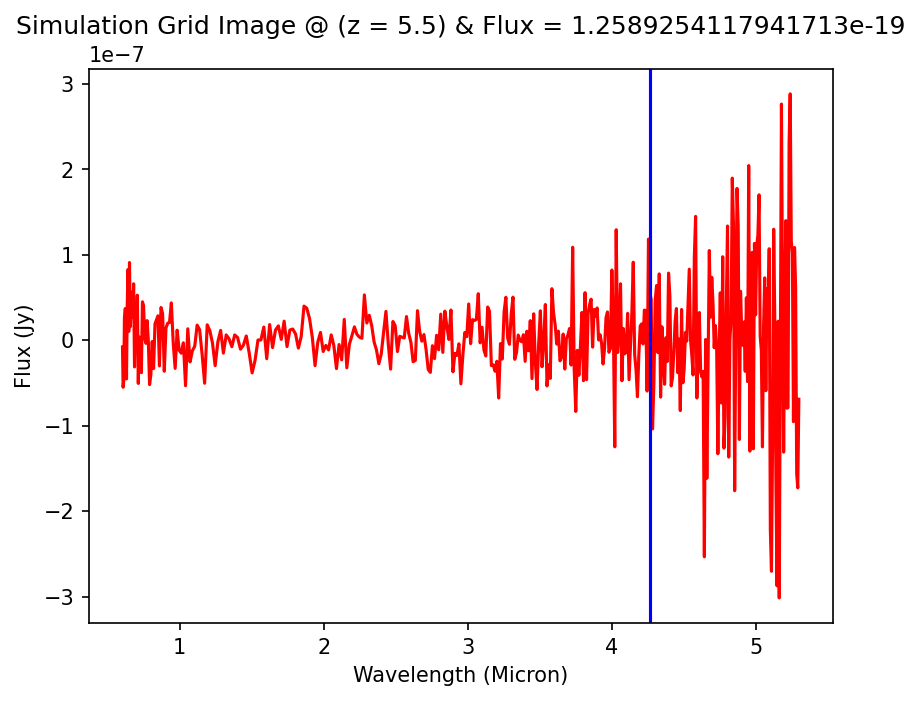

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.584893192461124e-19
Amp: 2.2906273042388938e-21, Mu: 42658.200000000004, Sigma: 27.60295850936062


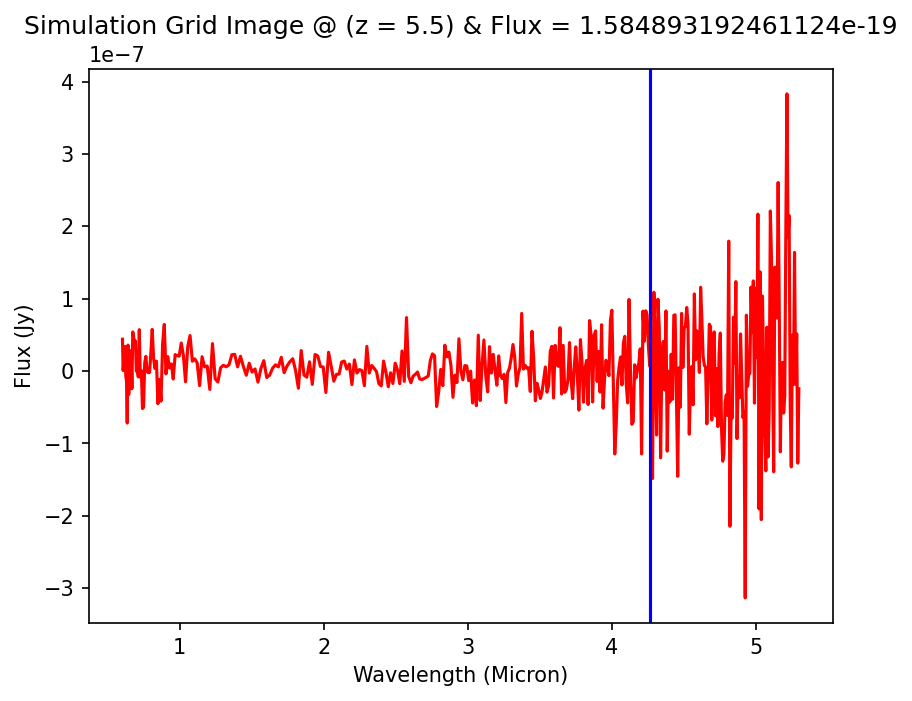

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.995262314968899e-19
Amp: 2.883728922255922e-21, Mu: 42658.200000000004, Sigma: 27.60295850936062


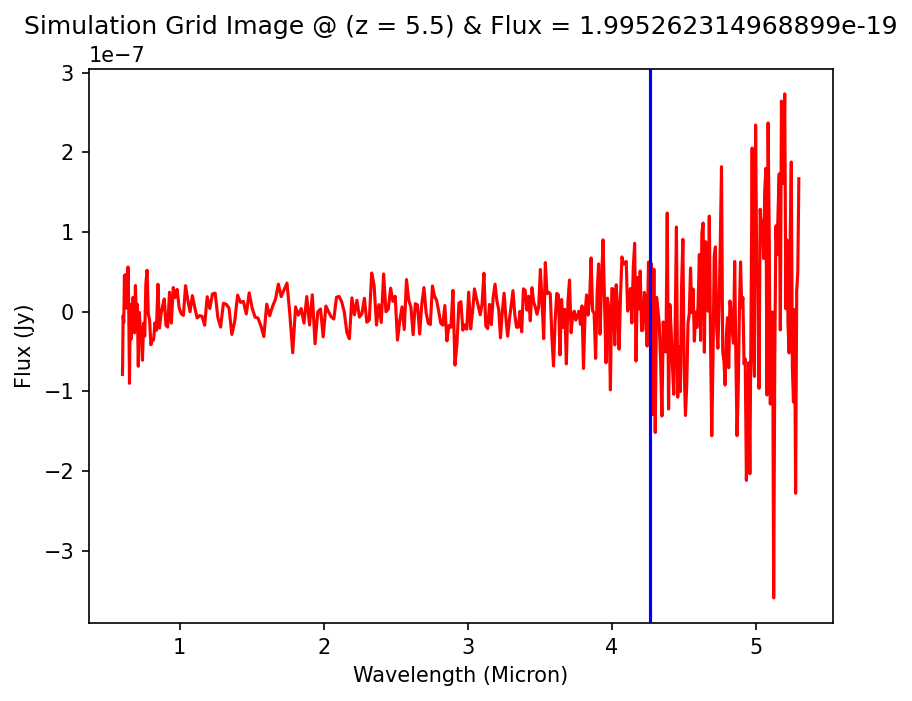

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 2.511886431509613e-19
Amp: 3.6303996209537986e-21, Mu: 42658.200000000004, Sigma: 27.60295850936062


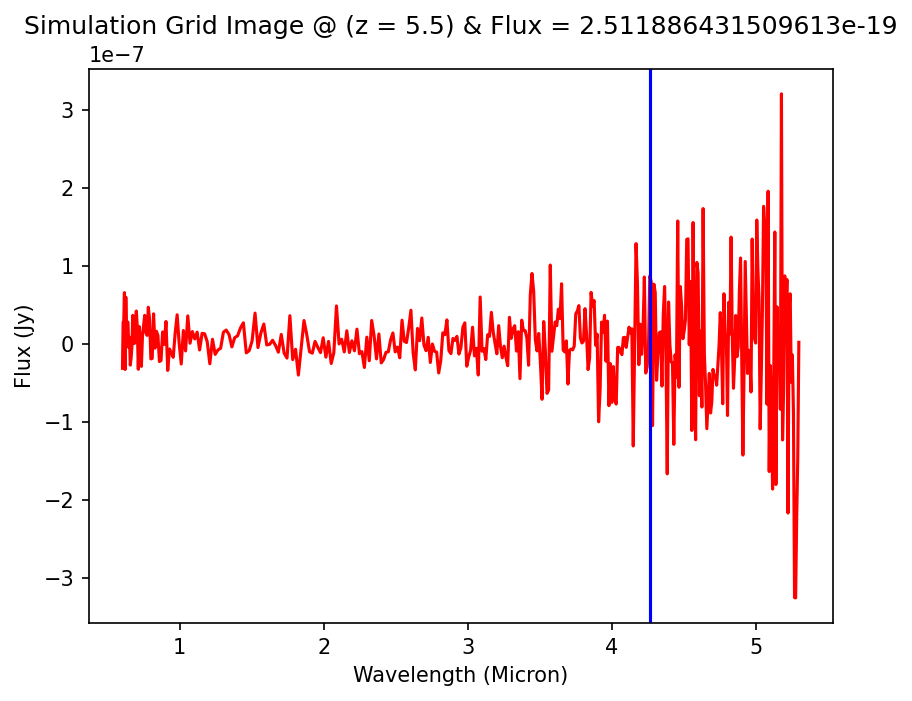

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 3.162277660168431e-19
Amp: 4.5704023377866644e-21, Mu: 42658.200000000004, Sigma: 27.60295850936062


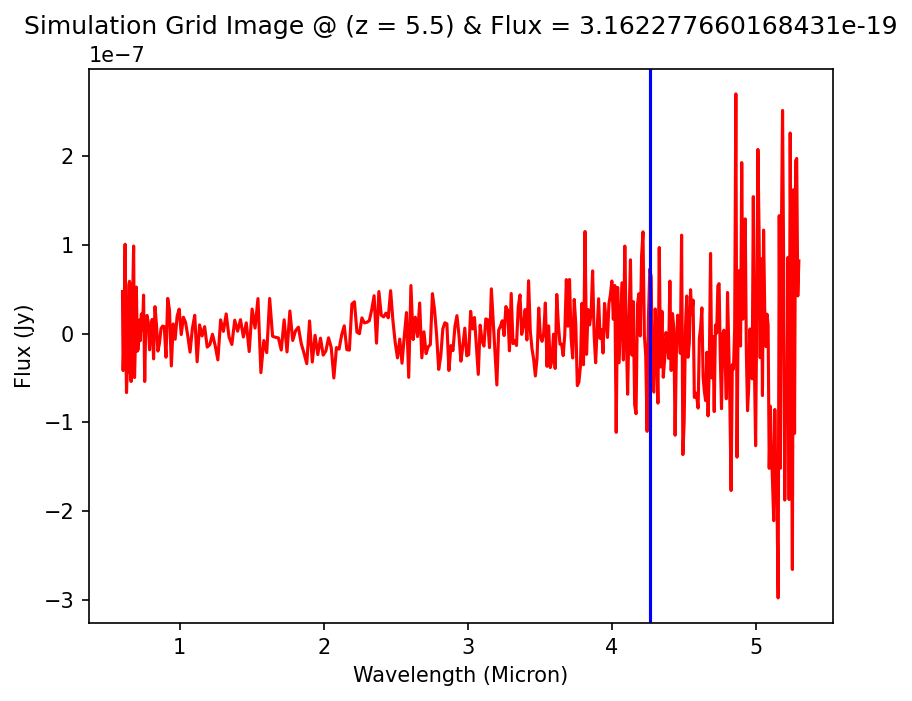

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 3.981071705535051e-19
Amp: 5.75379564516312e-21, Mu: 42658.200000000004, Sigma: 27.60295850936062


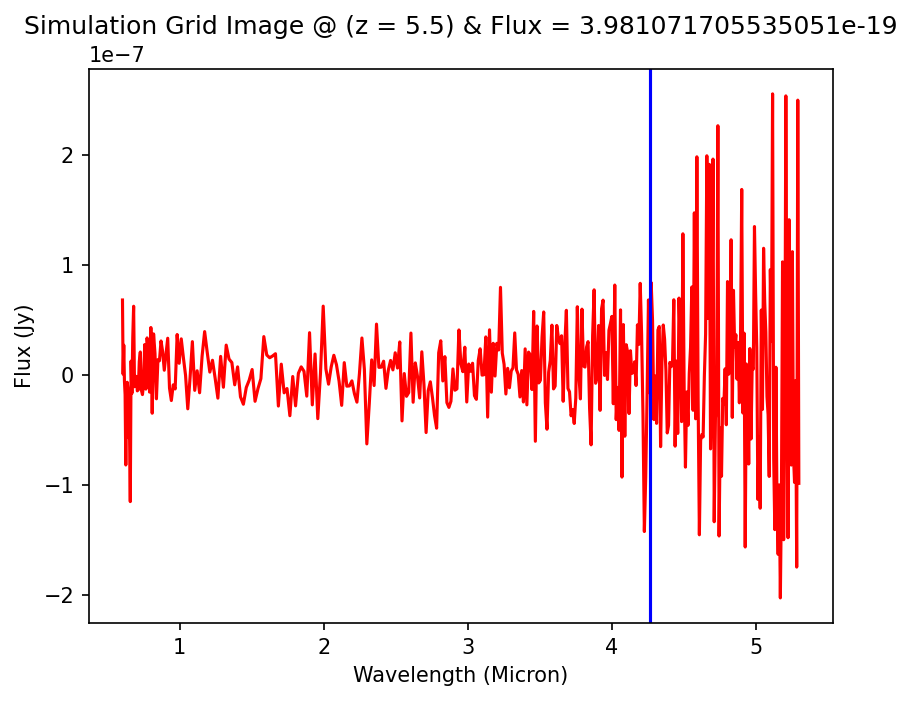

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 5.011872336272837e-19
Amp: 7.24359955196649e-21, Mu: 42658.200000000004, Sigma: 27.60295850936062


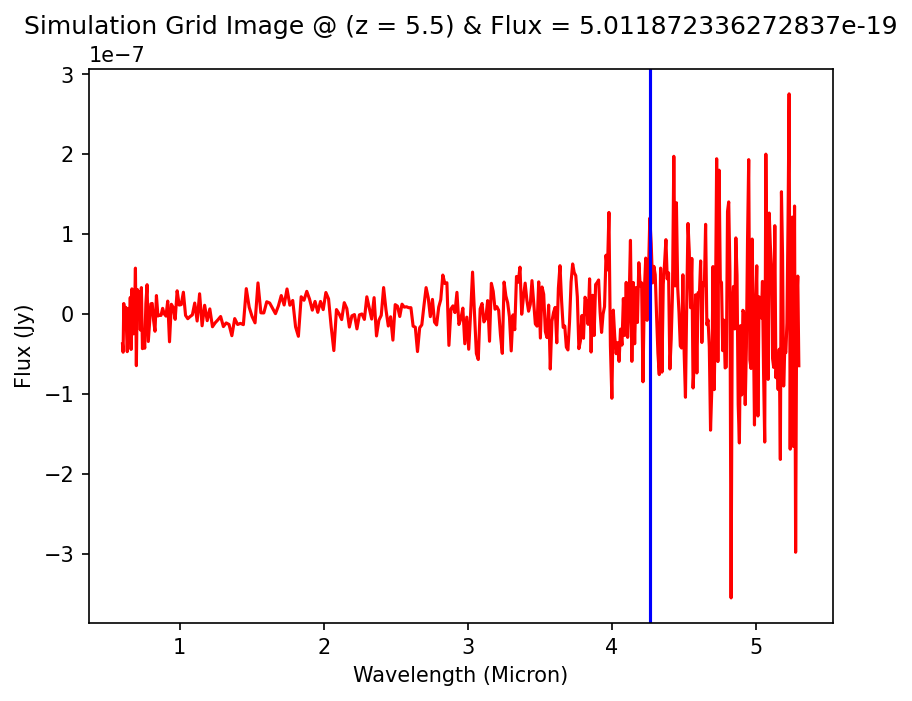

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 6.309573444802097e-19
Amp: 9.119151548831488e-21, Mu: 42658.200000000004, Sigma: 27.60295850936062


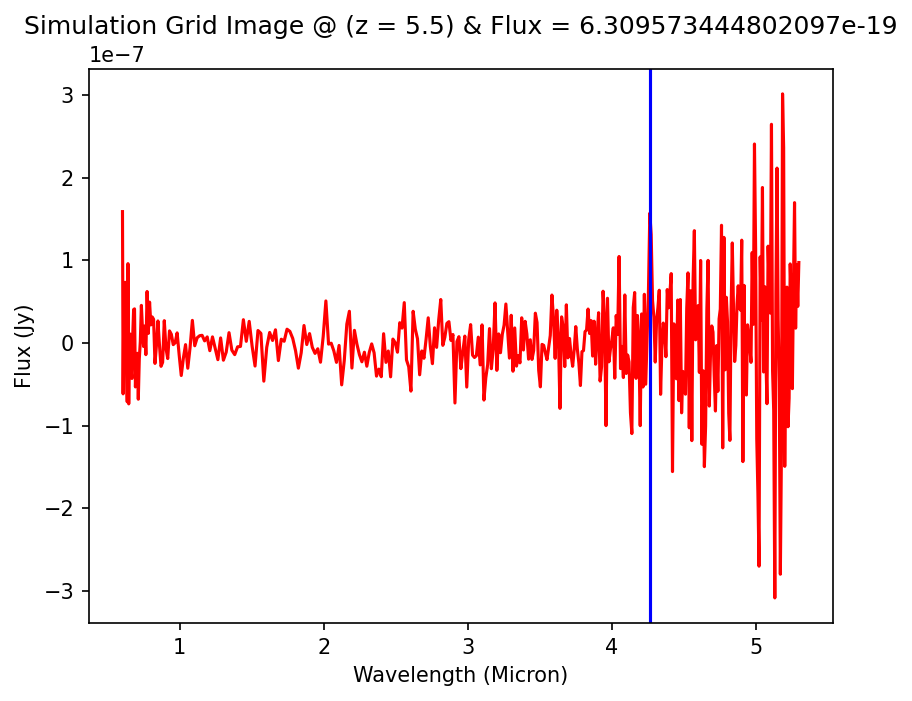

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 7.943282347243049e-19
Amp: 1.1480331618826136e-20, Mu: 42658.200000000004, Sigma: 27.60295850936062


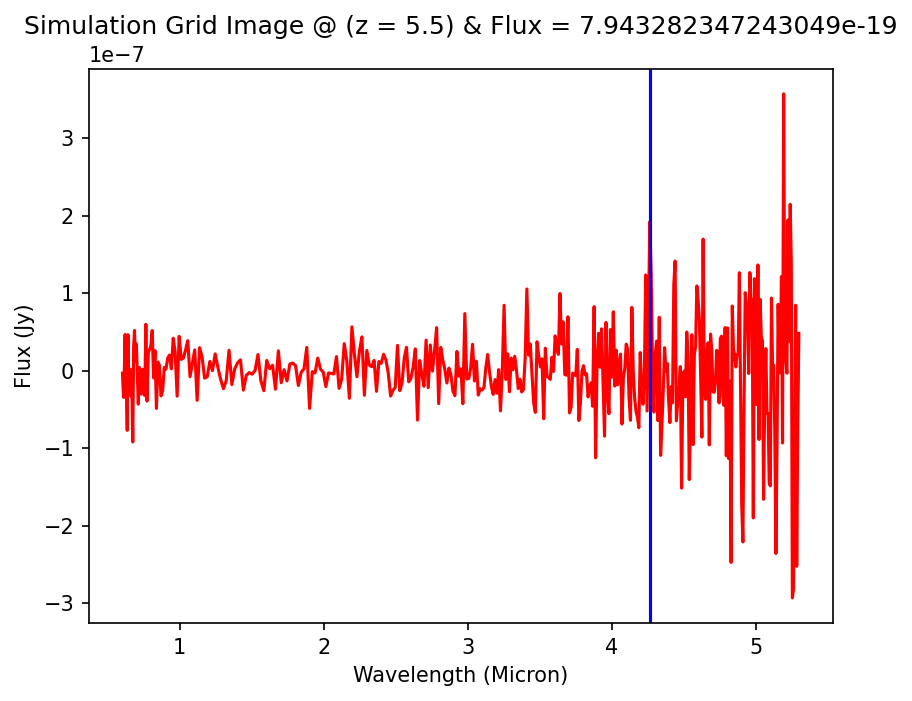

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.0000000000000328e-18
Amp: 1.445288121076434e-20, Mu: 42658.200000000004, Sigma: 27.60295850936062


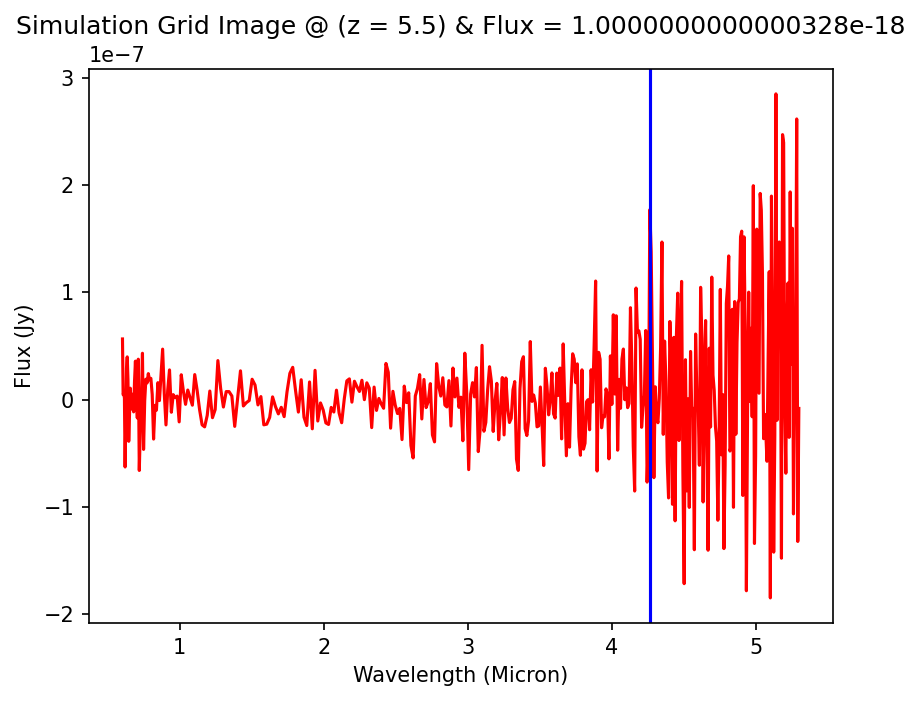

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.2589254117942125e-18
Amp: 1.819509942987374e-20, Mu: 42658.200000000004, Sigma: 27.60295850936062


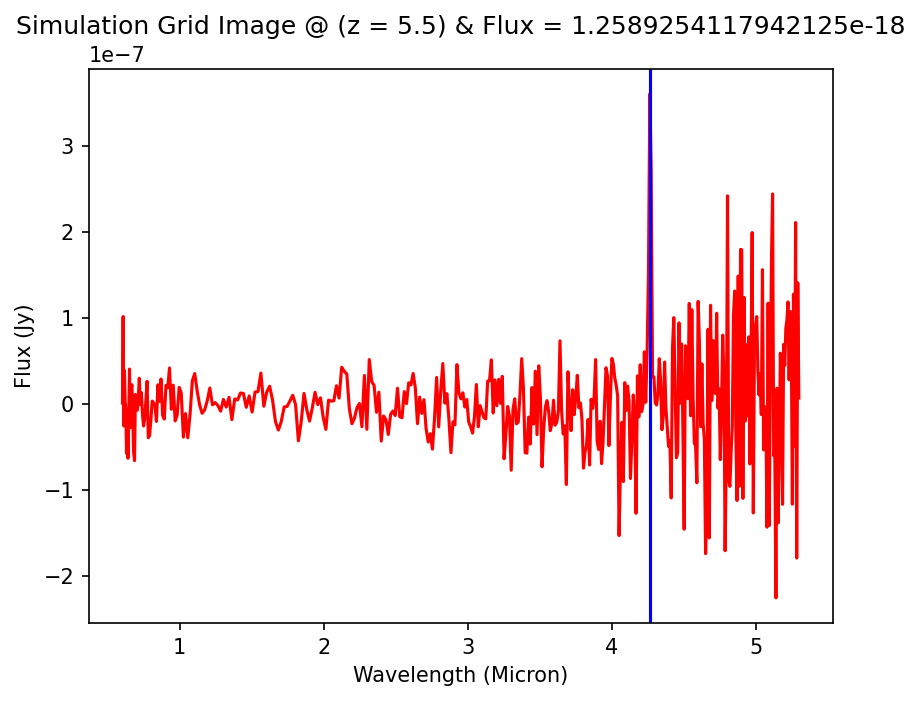

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.5848931924611758e-18
Amp: 2.2906273042389688e-20, Mu: 42658.200000000004, Sigma: 27.60295850936062


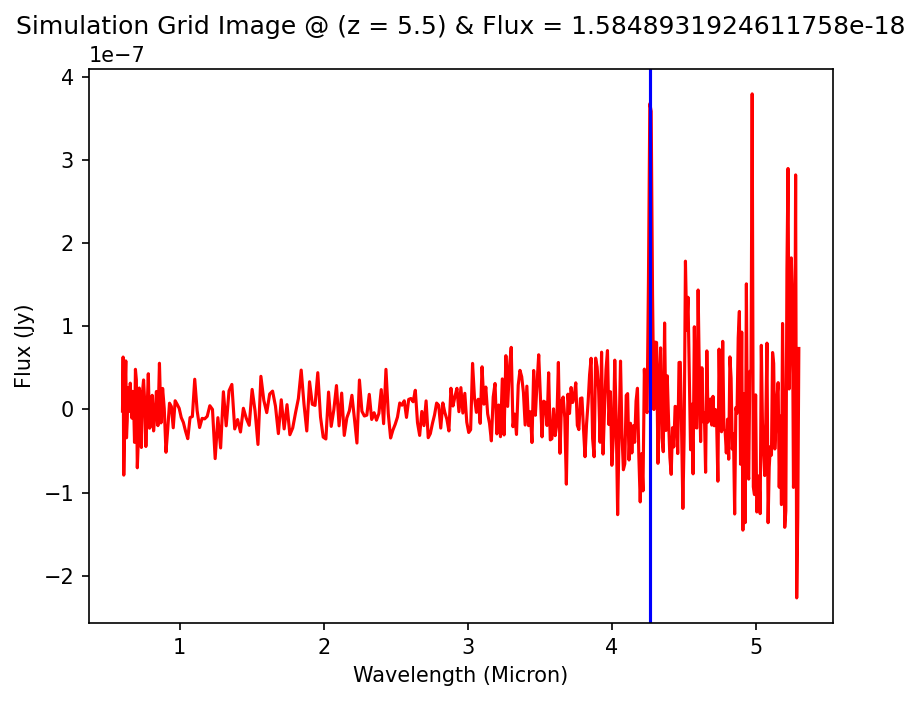

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.9952623149689645e-18
Amp: 2.883728922256016e-20, Mu: 42658.200000000004, Sigma: 27.60295850936062


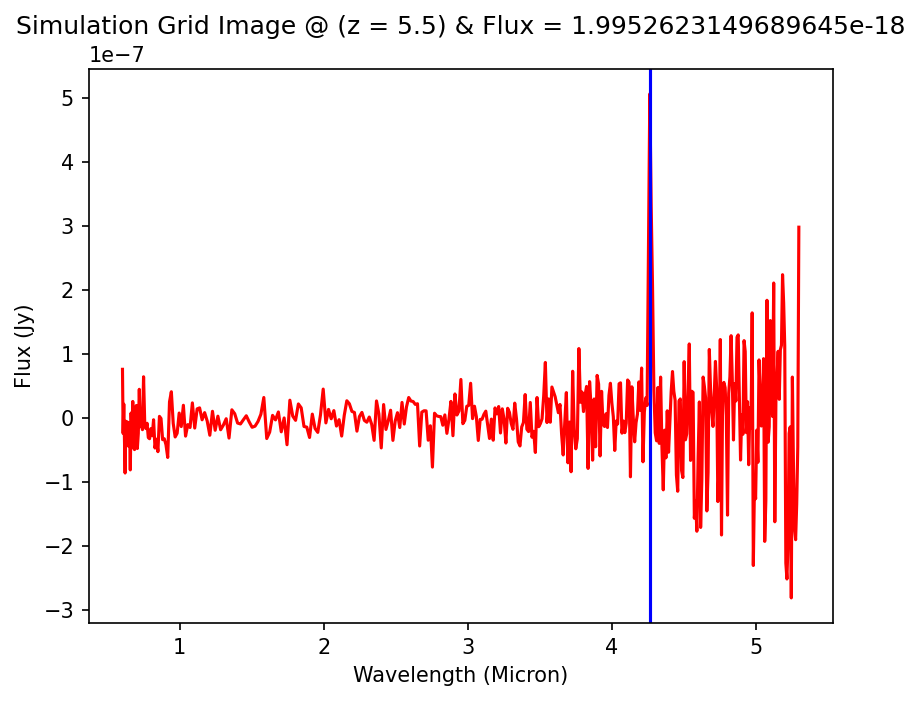

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 2.511886431509695e-18
Amp: 3.630399620953917e-20, Mu: 42658.200000000004, Sigma: 27.60295850936062


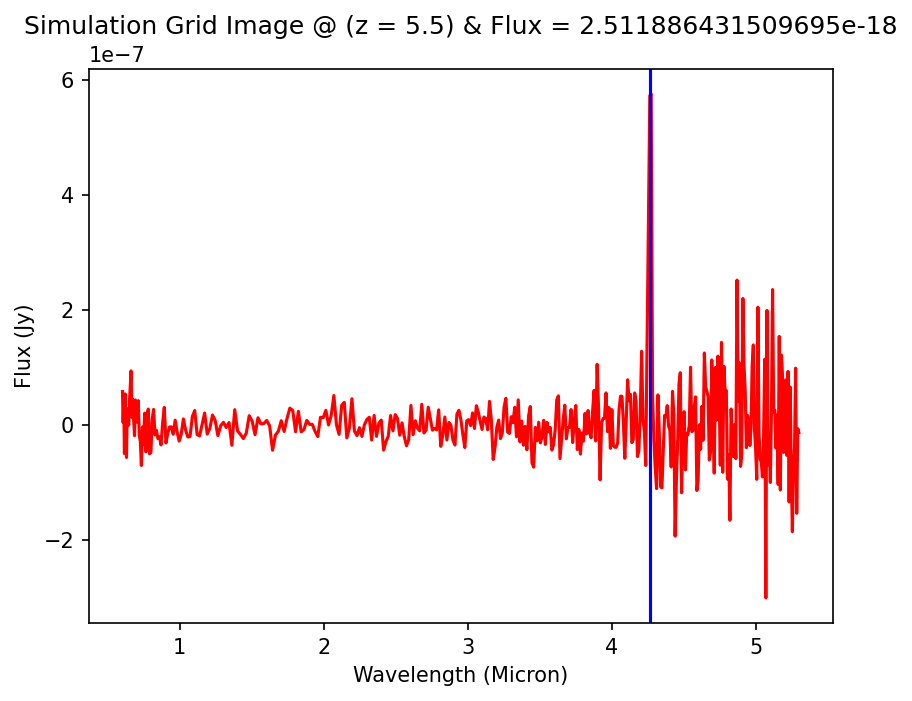

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 3.1622776601685347e-18
Amp: 4.570402337786814e-20, Mu: 42658.200000000004, Sigma: 27.60295850936062


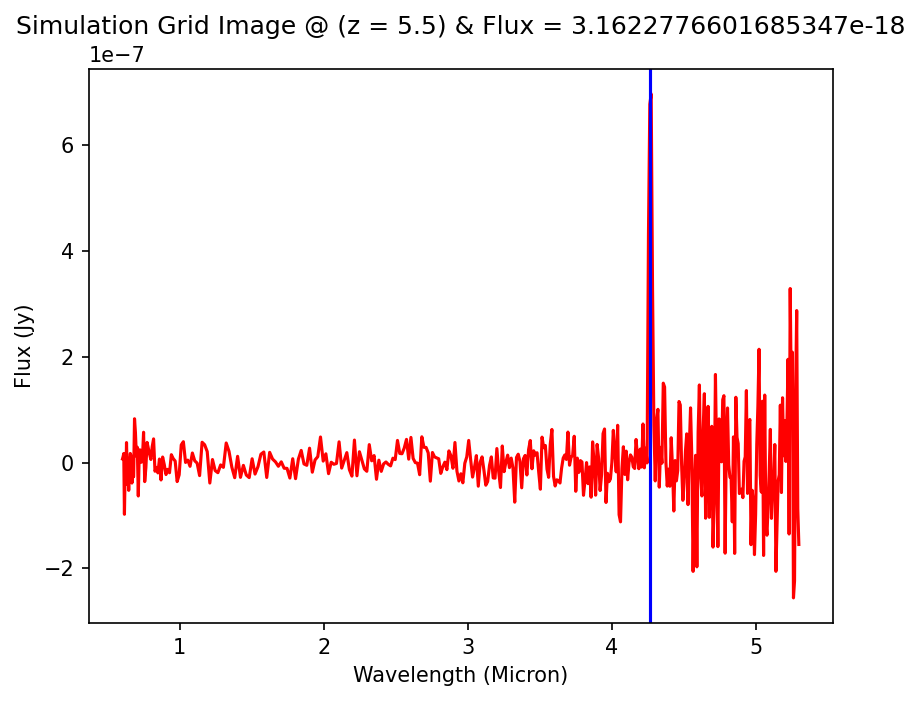

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 3.981071705535181e-18
Amp: 5.753795645163307e-20, Mu: 42658.200000000004, Sigma: 27.60295850936062


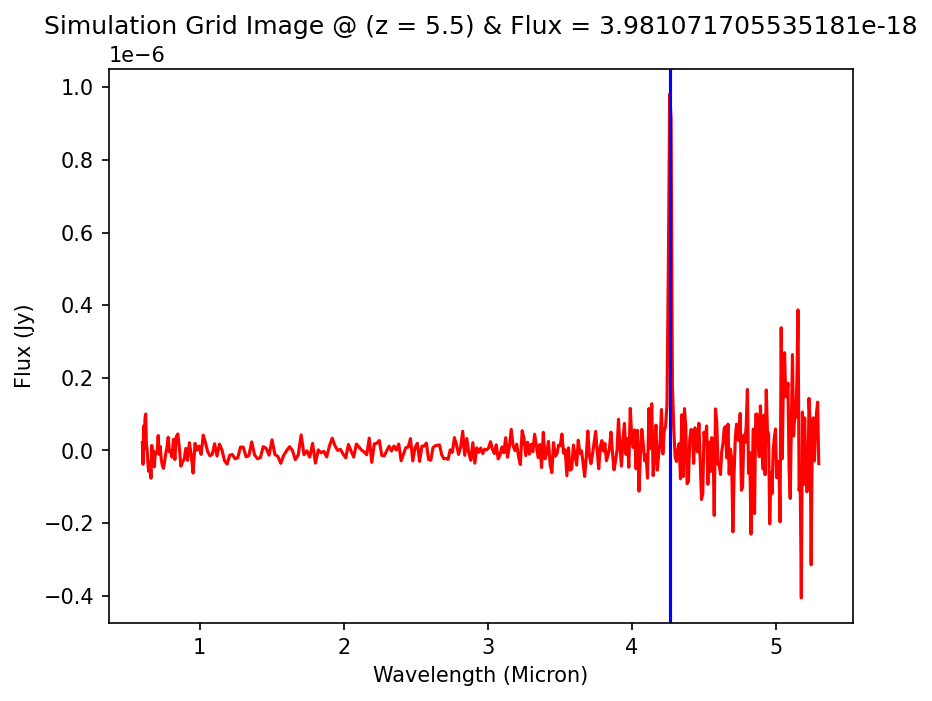

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 5.011872336273001e-18
Amp: 7.243599551966726e-20, Mu: 42658.200000000004, Sigma: 27.60295850936062


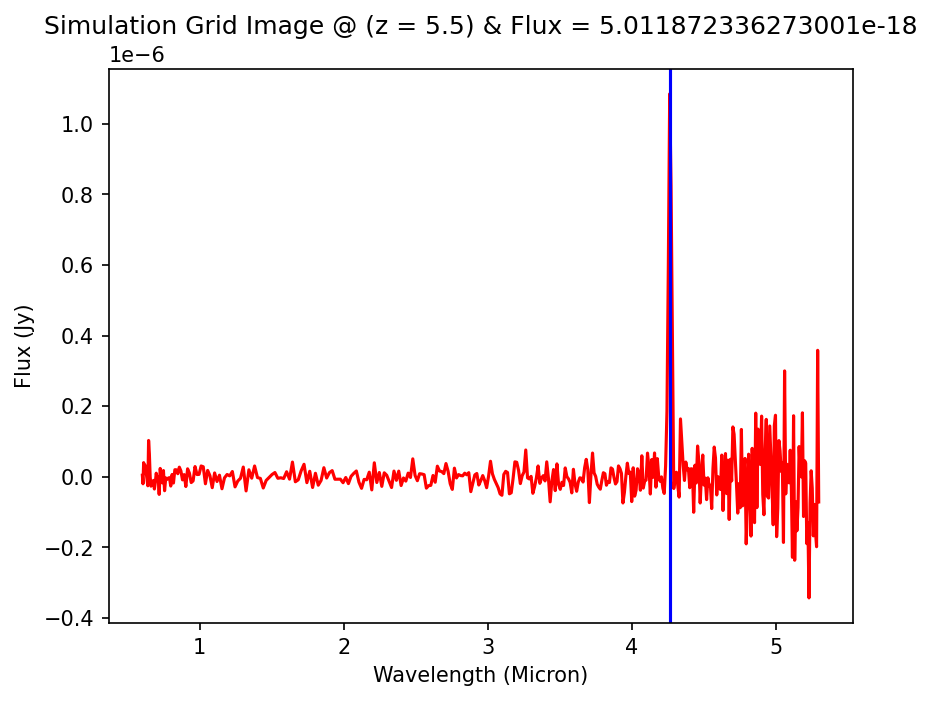

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 6.3095734448023044e-18
Amp: 9.119151548831788e-20, Mu: 42658.200000000004, Sigma: 27.60295850936062


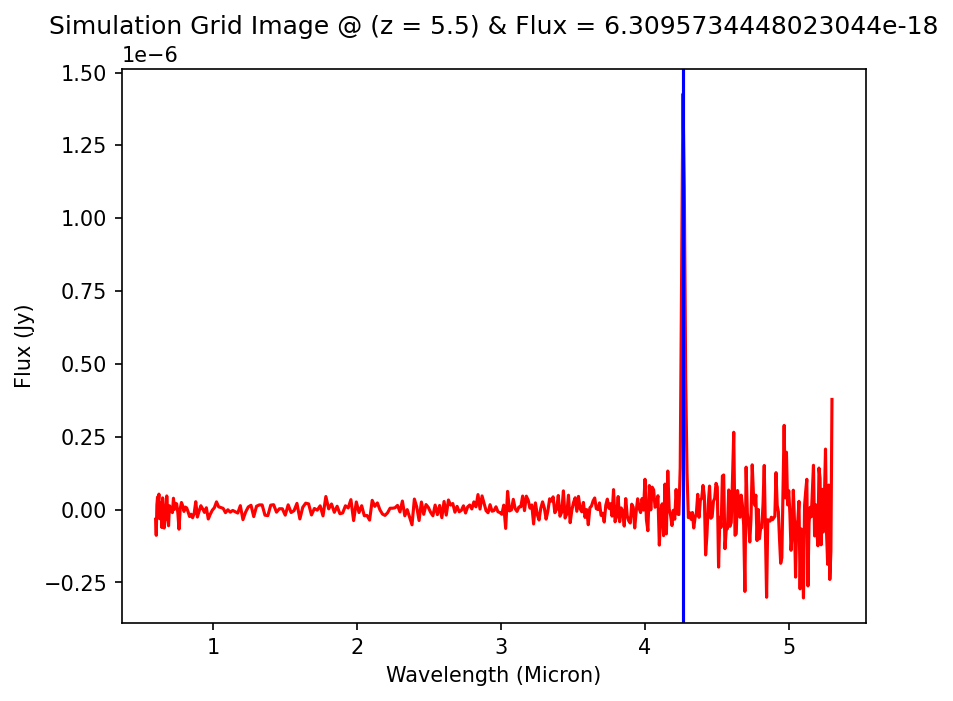

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 7.943282347243309e-18
Amp: 1.1480331618826512e-19, Mu: 42658.200000000004, Sigma: 27.60295850936062


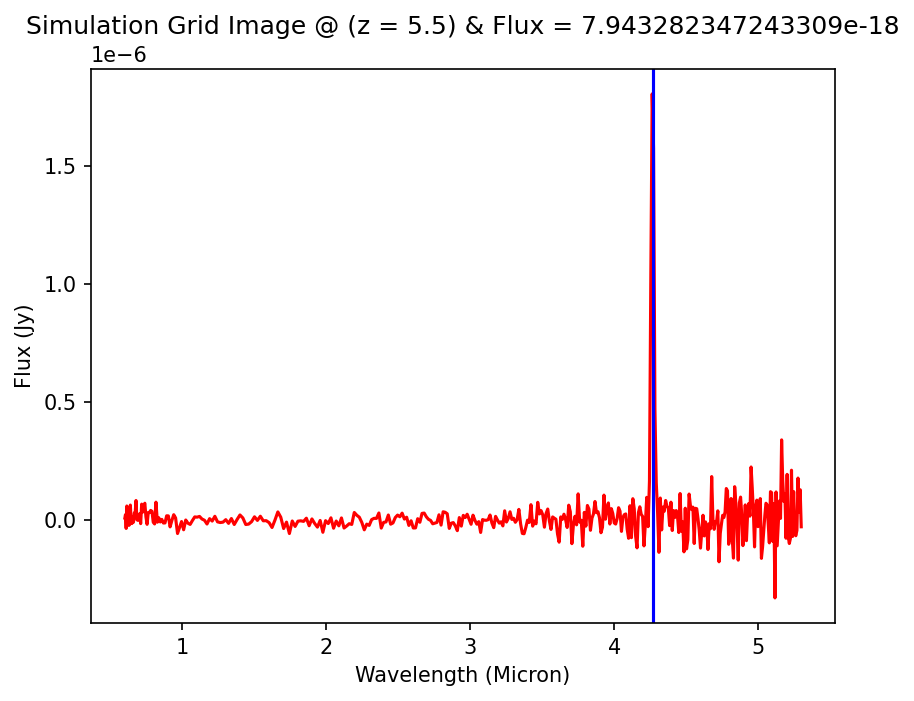

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.0000000000000654e-17
Amp: 1.4452881210764813e-19, Mu: 42658.200000000004, Sigma: 27.60295850936062


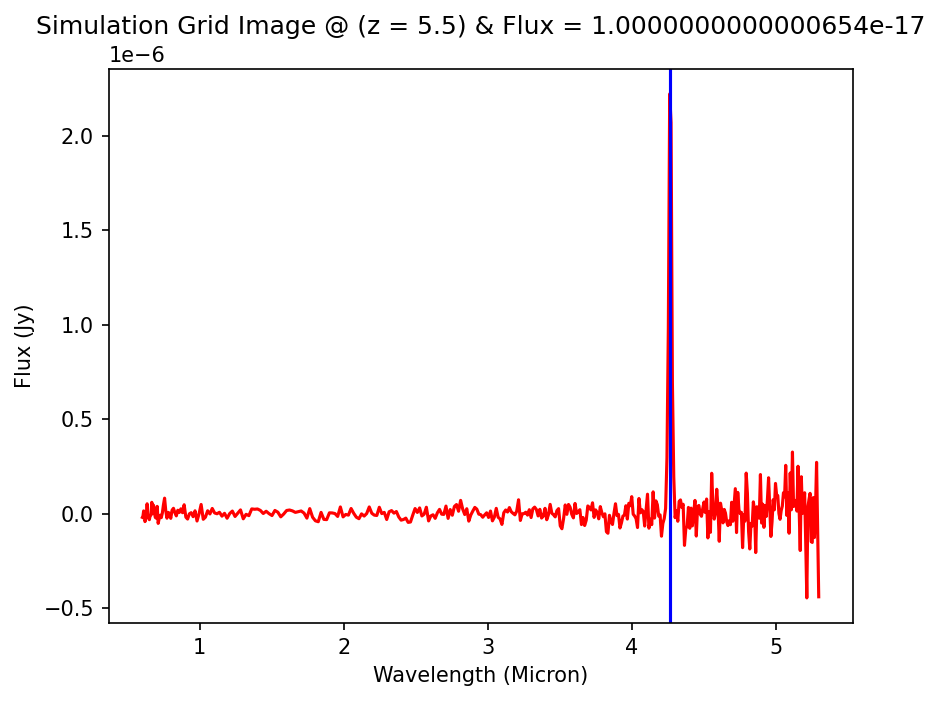

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.2589254117942538e-17
Amp: 1.8195099429874334e-19, Mu: 42658.200000000004, Sigma: 27.60295850936062


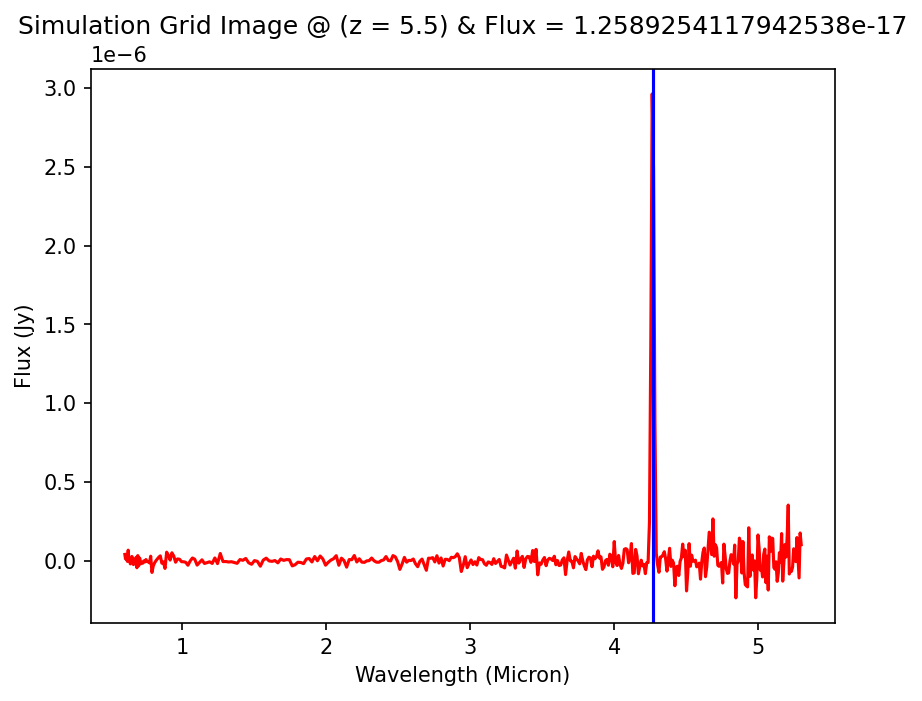

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.5848931924612275e-17
Amp: 2.2906273042390437e-19, Mu: 42658.200000000004, Sigma: 27.60295850936062


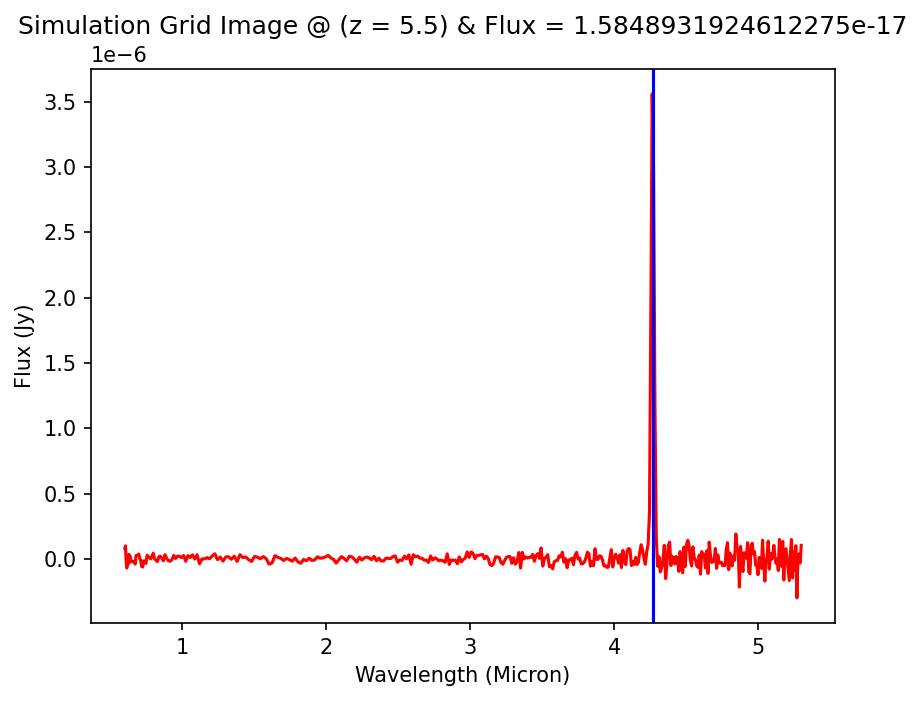

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.9952623149690297e-17
Amp: 2.8837289222561106e-19, Mu: 42658.200000000004, Sigma: 27.60295850936062


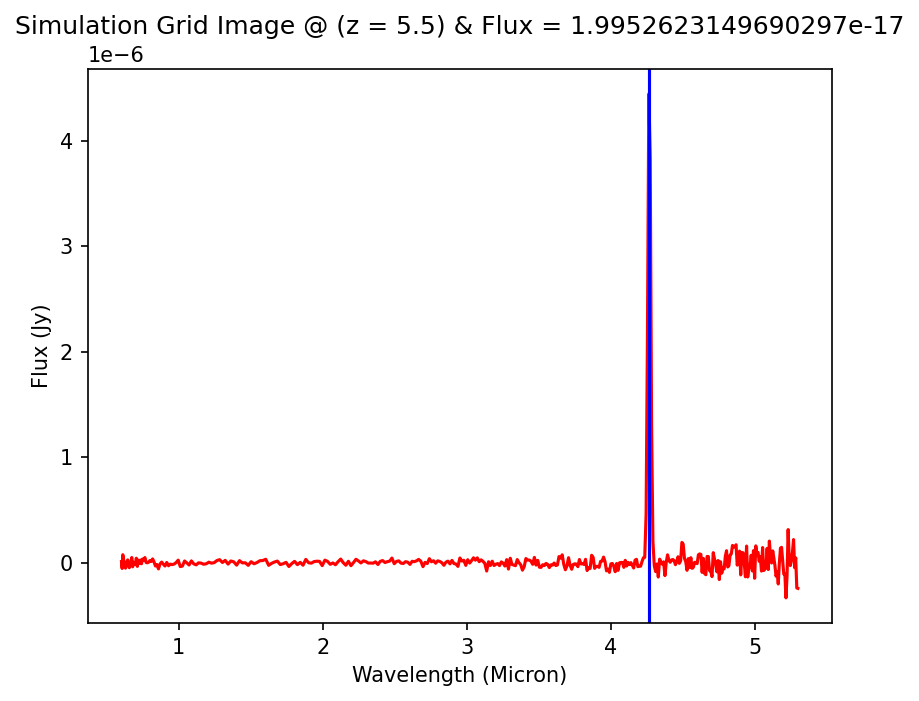

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 2.5118864315097773e-17
Amp: 3.630399620954036e-19, Mu: 42658.200000000004, Sigma: 27.60295850936062


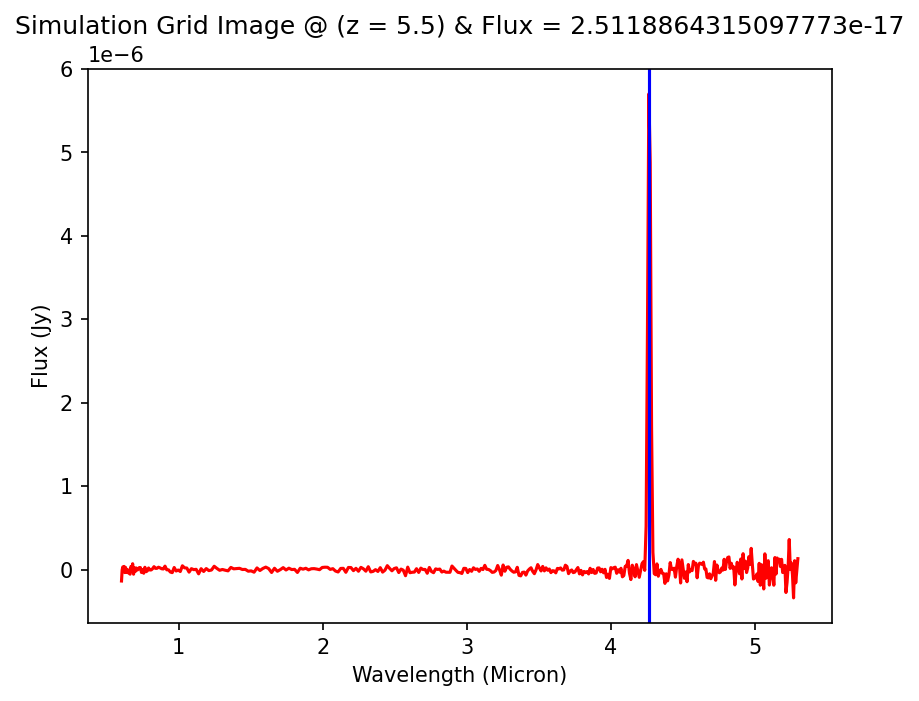

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 3.162277660168638e-17
Amp: 4.570402337786963e-19, Mu: 42658.200000000004, Sigma: 27.60295850936062


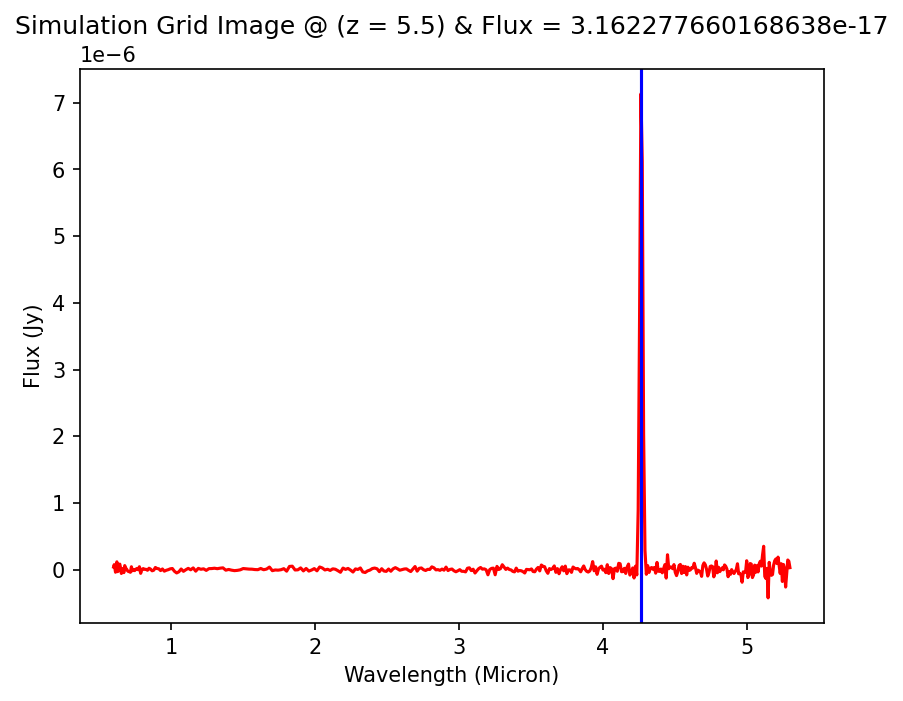

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 3.981071705535311e-17
Amp: 5.753795645163496e-19, Mu: 42658.200000000004, Sigma: 27.60295850936062


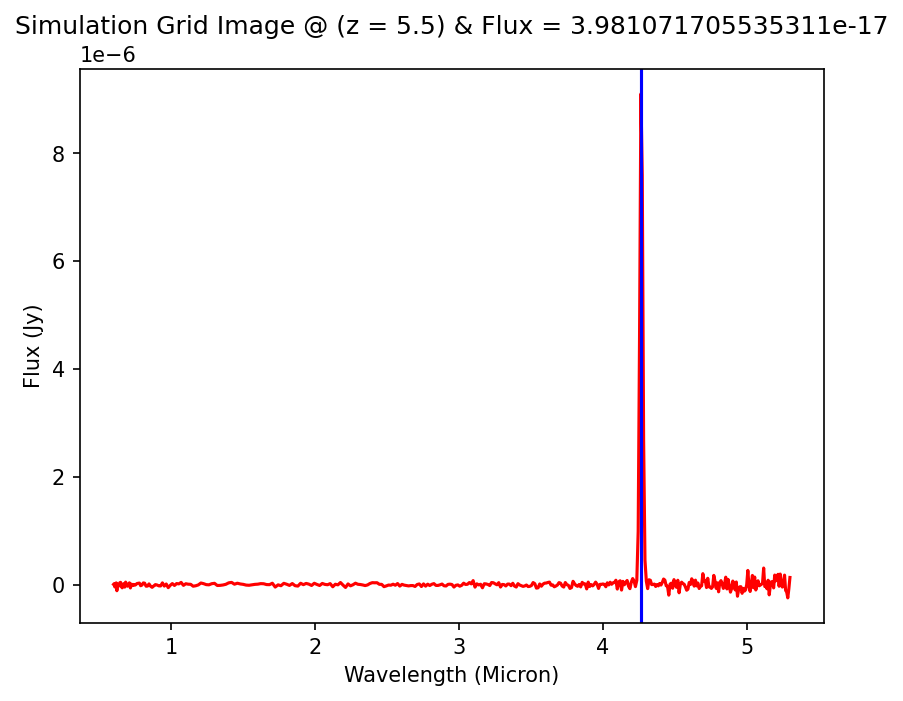

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 5.0118723362731656e-17
Amp: 7.243599551966965e-19, Mu: 42658.200000000004, Sigma: 27.60295850936062


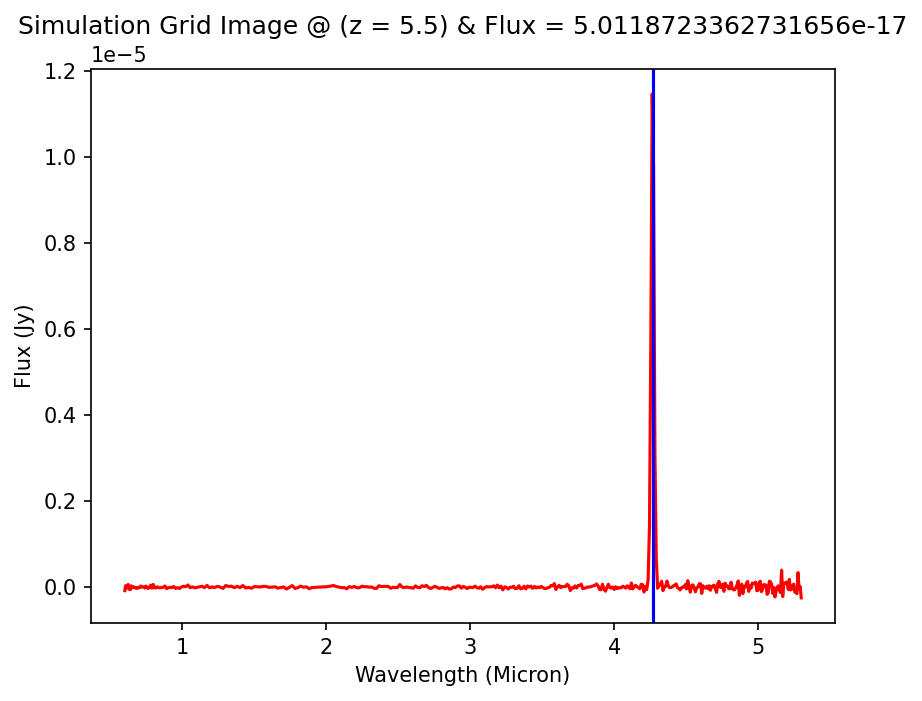

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 6.309573444802511e-17
Amp: 9.119151548832086e-19, Mu: 42658.200000000004, Sigma: 27.60295850936062


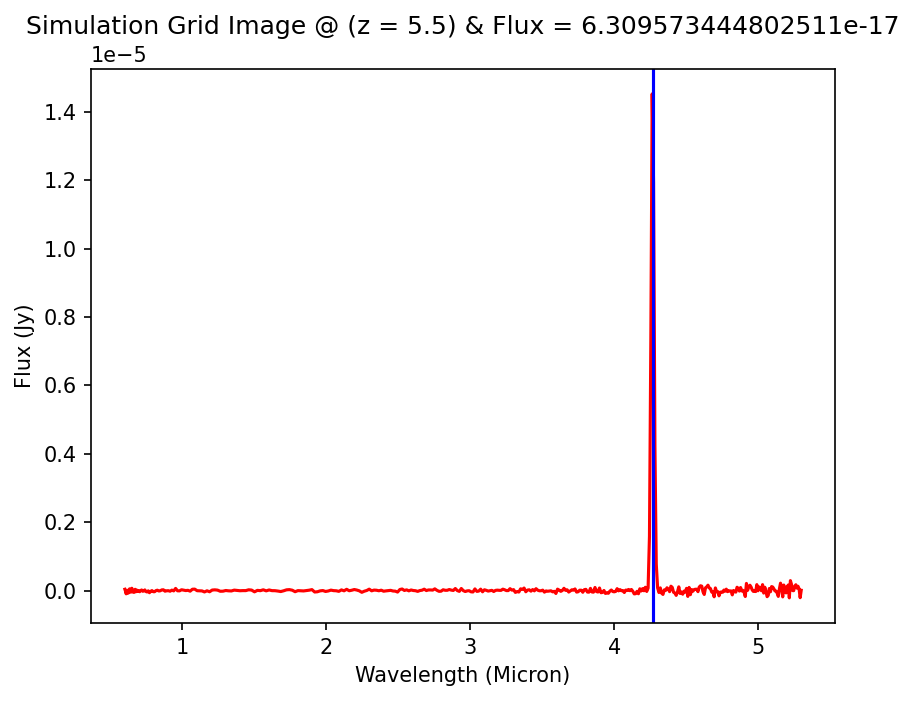

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 7.943282347243569e-17
Amp: 1.148033161882689e-18, Mu: 42658.200000000004, Sigma: 27.60295850936062


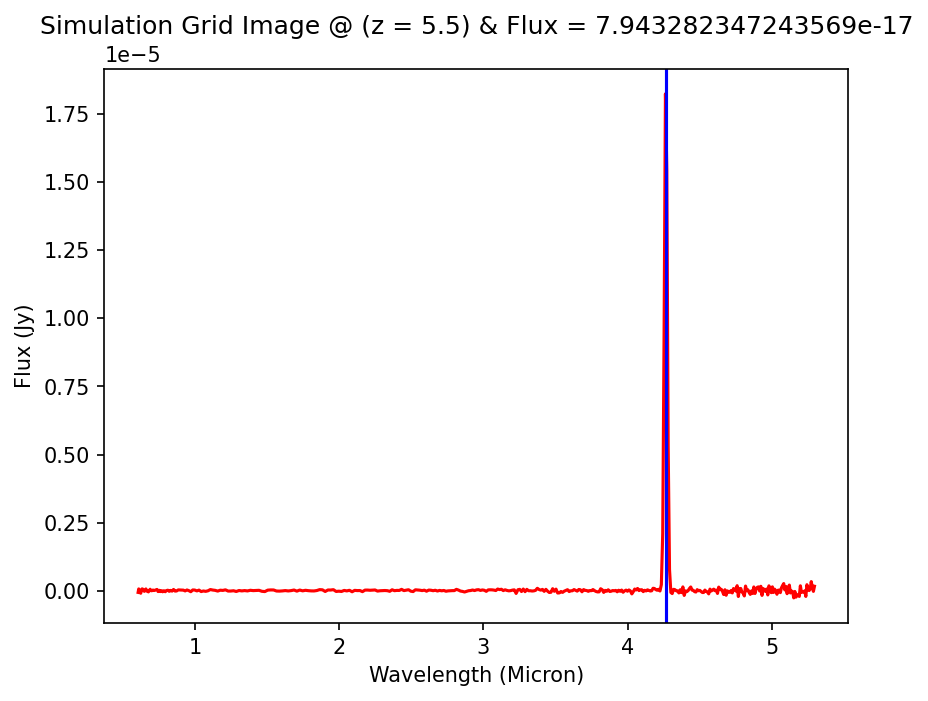

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 5.5, FWHM: 10, Integrated Flux: 1.0000000000000982e-16
Amp: 1.4452881210765286e-18, Mu: 42658.200000000004, Sigma: 27.60295850936062


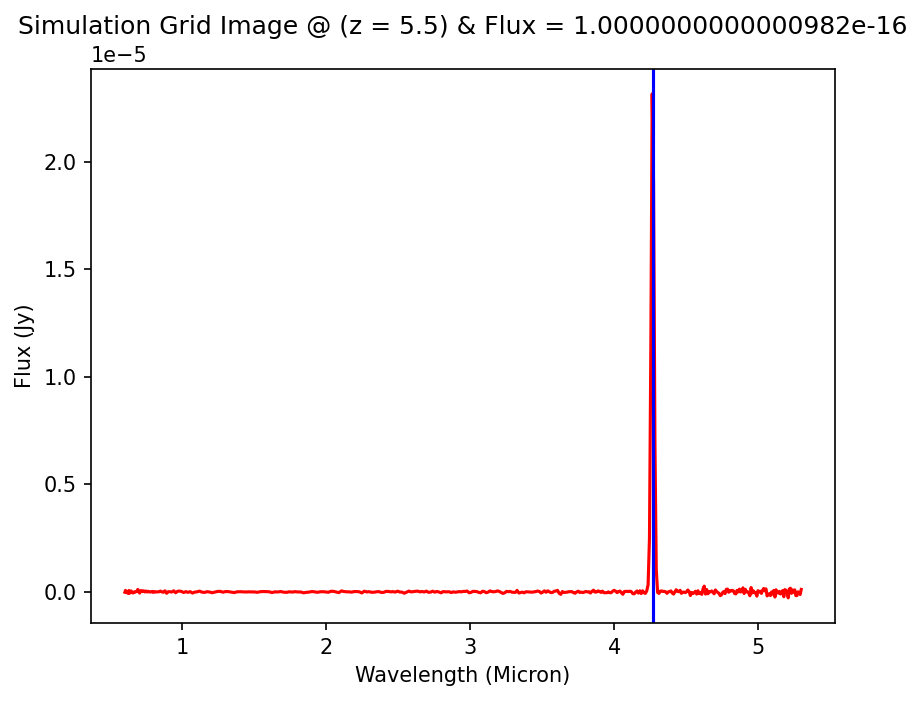

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 6.0, FWHM: 10, Integrated Flux: 1e-19
Amp: 1.3420532552852162e-21, Mu: 45939.6, Sigma: 29.726263010080668


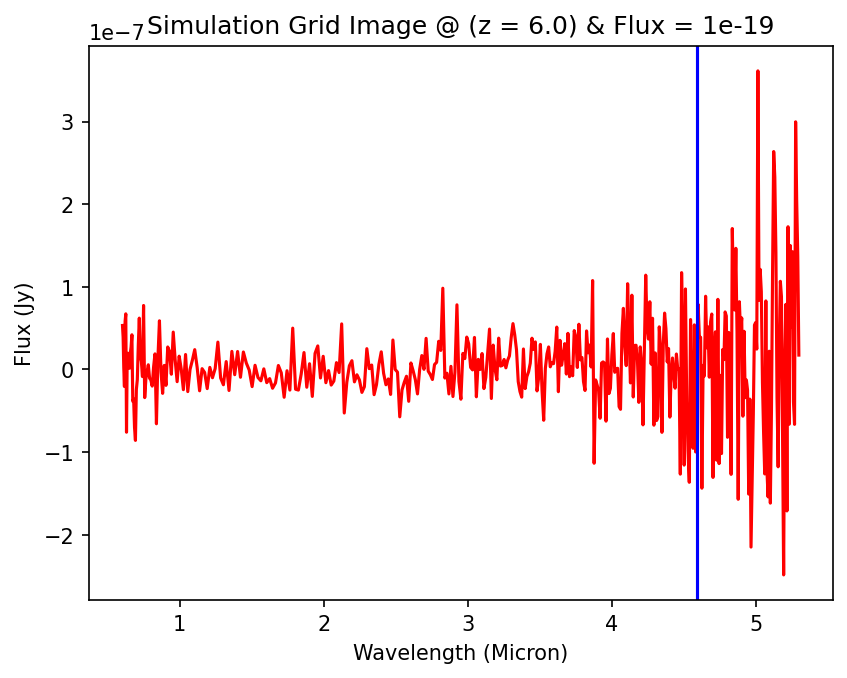

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 6.0, FWHM: 10, Integrated Flux: 1.2589254117941713e-19
Amp: 1.689544947059649e-21, Mu: 45939.6, Sigma: 29.726263010080668


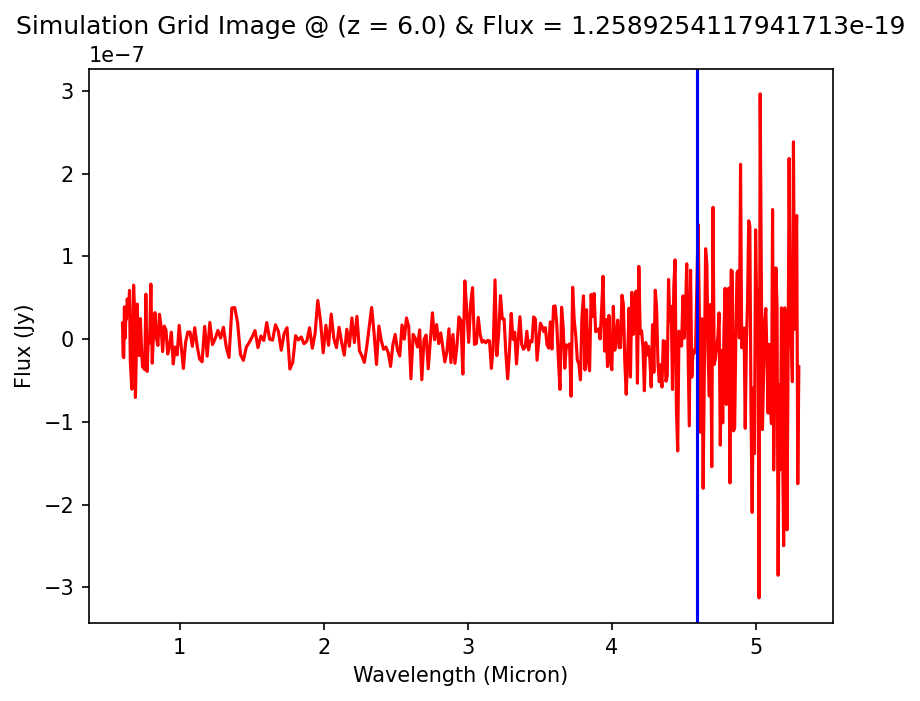

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 6.0, FWHM: 10, Integrated Flux: 1.584893192461124e-19
Amp: 2.1270110682218303e-21, Mu: 45939.6, Sigma: 29.726263010080668


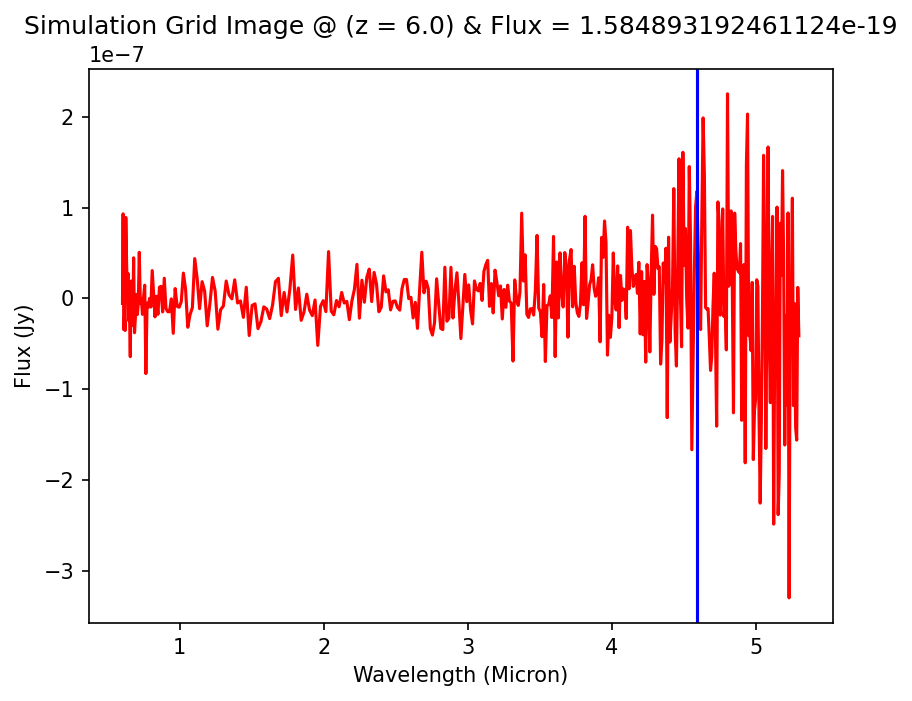

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 6.0, FWHM: 10, Integrated Flux: 1.995262314968899e-19
Amp: 2.6777482849519276e-21, Mu: 45939.6, Sigma: 29.726263010080668


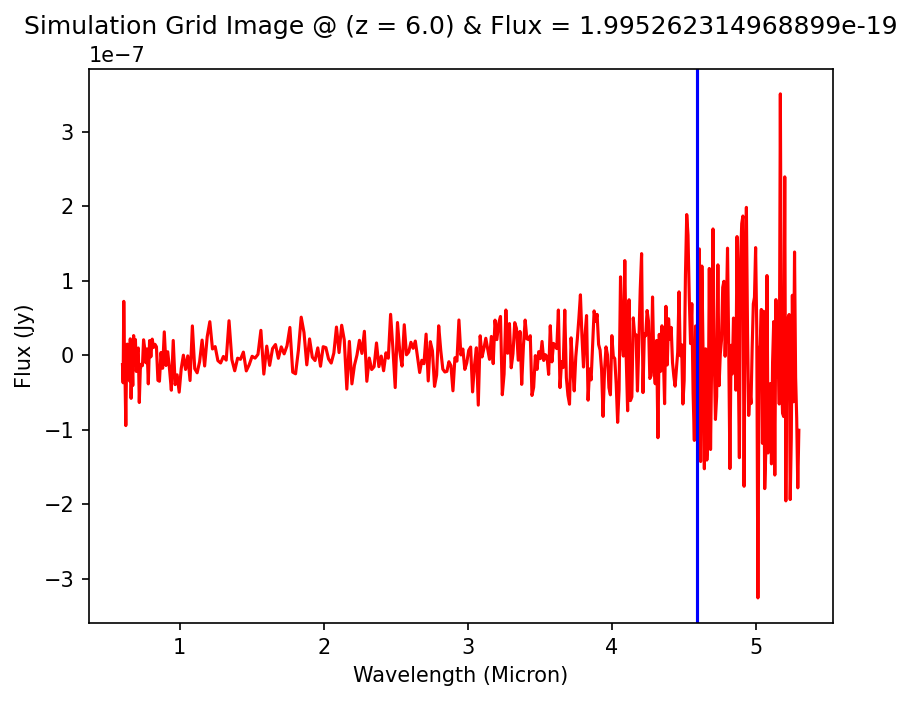

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 6.0, FWHM: 10, Integrated Flux: 2.511886431509613e-19
Amp: 3.3710853623142417e-21, Mu: 45939.6, Sigma: 29.726263010080668


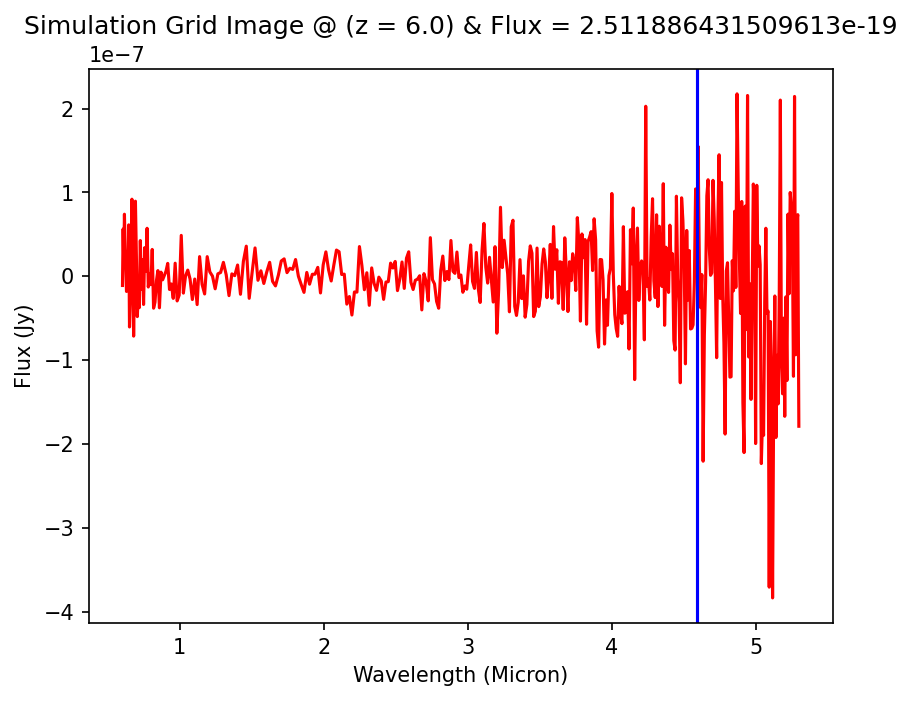

Randomly generating redshift, FWHM, and integrated flux...
Redshift: 6.0, FWHM: 10, Integrated Flux: 3.162277660168431e-19
Amp: 4.24394502794476e-21, Mu: 45939.6, Sigma: 29.726263010080668


KeyboardInterrupt: 

In [26]:
#Simulate a grid of spectra across the redshift and luminosity ranges of my sample
#Loop it for however many spectra you want!

redshift_range= np.arange(2,7.5,.5) #11 bins
flx_range = 10**np.arange(-19,-15.9,0.1) # x31 bins

#num_runs = 31 #number of spectra we will create

zs=[]
fwhms=[]
in_fluxes=[]
amps=[]
mus=[]
sigmas=[]
first_pics=[]
pics=[]
waves=[]
fluxes=[]
fluxerrs=[]

count = 0
rand_fwhm =10 # random.uniform(80,600)  #Max and min are from sample (in angstrom)
#while count < num_runs:
for z in redshift_range:
    rand_z = z #random.uniform(2,7)
    for flx in flx_range:
   # rand_flx = 10**random.uniform(np.log10(2.7e-19), np.log10(3.3e-16)) #Max and min are from sample! 
        rand_flx = flx

        pic5,wave, flux, fluxerr,sigma,mu,amp = sim_spectra(rand_z, rand_fwhm, rand_flx)
    
        zs.append(rand_z)
        fwhms.append(rand_fwhm)
        in_fluxes.append(rand_flx)
        
        sigmas.append(sigma)
        mus.append(mu)
        amps.append(amp)
        pics.append(pic5)
        #first_pics.append(pic)
    
        waves.append(wave)
        fluxes.append(flux)
        fluxerrs.append(fluxerr)
        
    
  #  count+=1

sim_grid = Table([pics, waves, fluxes, fluxerrs, zs, in_fluxes, fwhms, amps,mus, sigmas], names = ('Simulated Images', "Wavelength Arrays", "Flux Arrays", "Noise Arrays", 'Redshifts', 'Integrated Fluxes', 'FWHMs', 'Amplitudes', 'Mus', 'Sigmas'))
sim_grid
for i in range(len(sim_grid)):
    string = "grid" + str(i)
    pics[i].savefig(string)

In [73]:
#Save the noise arrays for each simulation in the grid...these will be iterated through using time.time to vary noise randomly

flux_grid = np.array(sim_grid['Flux Arrays'])
np.savetxt("flux_grid.txt", flux_grid)
noise_grid = np.array(sim_grid['Noise Arrays'])
np.savetxt("noise_grid.txt", noise_grid)

In [103]:
#Save grid of output values of the simulated Gaussian parameters for each emission line
sim_grid341 = Table([waves, fluxes, fluxerrs, zs, in_fluxes, fwhms, amps,mus, sigmas], names = ("Wavelength Arrays", "Flux Arrays", "Noise Arrays", 'Redshifts', 'Integrated Fluxes', 'FWHMs', 'Amplitudes', 'Mus', 'Sigmas'))
sim_grid341.write("sim_grid.fits")

In [105]:
#Save the grid of simulated information
sim_grid = Table.read("sim_grid.fits")
sim_grid

Wavelength Arrays,Flux Arrays,Noise Arrays,Redshifts,Integrated Fluxes,FWHMs,Amplitudes,Mus,Sigmas
float64[403],float64[403],float64[403],float64,float64,int32,float64,float64,float64
0.6024954888205943 .. 5.297568853064386,-2.930203372324901e-17 .. -6.48538687681639e-17,4.91292695349068e-08 .. 1.5495727013347646e-07,2.0,1e-19,10,3.131457595665505e-21,19688.4,12.739827004320286
0.6024954888205943 .. 5.297568853064386,-3.688907437538221e-17 .. -8.16461814466916e-17,4.91292695349068e-08 .. 1.5495727013347646e-07,2.0,1.2589254117941713e-19,10,3.942271543139181e-21,19688.4,12.739827004320286
0.6024954888205943 .. 5.297568853064386,-4.64405939957053e-17 .. -1.027864562597615e-16,4.91292695349068e-08 .. 1.5495727013347646e-07,2.0,1.584893192461124e-19,10,4.963025825850937e-21,19688.4,12.739827004320286
0.6024954888205943 .. 5.297568853064386,-5.846524350145303e-17 .. -1.2940048084294233e-16,4.91292695349068e-08 .. 1.5495727013347646e-07,2.0,1.995262314968899e-19,10,6.248079331554498e-21,19688.4,12.739827004320286
0.6024954888205943 .. 5.297568853064386,-7.360338209601023e-17 .. -1.6290555940200644e-16,4.91292695349068e-08 .. 1.5495727013347646e-07,2.0,2.511886431509613e-19,10,7.865865845399897e-21,19688.4,12.739827004320286
0.6024954888205943 .. 5.297568853064386,-9.26611673098373e-17 .. -2.0508593211861128e-16,4.91292695349068e-08 .. 1.5495727013347646e-07,2.0,3.162277660168431e-19,10,9.902538398537774e-21,19688.4,12.739827004320286
0.6024954888205943 .. 5.297568853064386,-1.1665349502924783e-16 .. -2.581878928584489e-16,4.91292695349068e-08 .. 1.5495727013347646e-07,2.0,3.981071705535051e-19,10,1.246655723118676e-20,19688.4,12.739827004320286
0.6024954888205943 .. 5.297568853064386,-1.4685804895155846e-16 .. -3.2503931642099687e-16,4.91292695349068e-08 .. 1.5495727013347646e-07,2.0,5.011872336272837e-19,10,1.5694465695927396e-20,19688.4,12.739827004320286
0.6024954888205943 .. 5.297568853064386,-1.8488332696236943e-16 .. -4.0920025086576166e-16,4.91292695349068e-08 .. 1.5495727013347646e-07,2.0,6.309573444802097e-19,10,1.9758161689134892e-20,19688.4,12.739827004320286


In [12]:
#This is to create an animation of one of the redshift bins as a function of luminosity increasing across the grid
#Saving frames...
import cv2
import glob

img_array = []
for filename in vidfiles:
    print(filename)
    img = cv2.imread(filename)
    height, width, layers = img.shape
    img_array.append(img)

out = cv2.VideoWriter("animation.mp4", cv2.VideoWriter_fourcc(*"mp4v"), 5, (width, height))
for img in img_array:
    out.write(img)
out.release()


vid0.png
vid1.png
vid2.png
vid3.png
vid4.png
vid5.png
vid6.png
vid7.png
vid8.png
vid9.png
vid10.png
vid11.png
vid12.png
vid13.png
vid14.png
vid15.png
vid16.png
vid17.png
vid18.png
vid19.png
vid20.png
vid21.png
vid22.png
vid23.png
vid24.png
vid25.png
vid26.png
vid27.png
vid28.png
vid29.png
vid30.png


In [9]:
#Reordering frames correctly
vidfiles =['vid0.png',
 'vid1.png',
 'vid2.png',
 'vid3.png',
 'vid4.png',
 'vid5.png',
 'vid6.png',
 'vid7.png',
 'vid8.png',
 'vid9.png',
 'vid10.png',
 'vid11.png',
 'vid12.png',
 'vid13.png',
 'vid14.png',
 'vid15.png',
 'vid16.png',
 'vid17.png',
 'vid18.png',
 'vid19.png',
 'vid20.png',
 'vid21.png',
 'vid22.png',
 'vid23.png',
 'vid24.png',
 'vid25.png',
 'vid26.png',
 'vid27.png',
 'vid28.png',
 'vid29.png',
 'vid30.png',]